In [47]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import kurtosis, skew

%matplotlib inline
pd.set_option('display.max_columns', None)

In [48]:
df_bivariate = pd.read_csv('online_shoppers_EDA')

In [49]:
df_bivariate.head()

,Administrative,Administrative_duration,Informational,Informational_duration,Product_related,Product_related_duration,Bounce_rates,Exit_rates,Page_values,Special_day,Month,Visitor_type,Weekend,Revenue,Browser_label,Os_label,Region_label,Traffic_type_label
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,Returning Visitor,False,False,Chrome,Windows,Norteamérica,Organic Traffic
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,Returning Visitor,False,False,Safari,MacOS,Norteamérica,Direct Traffic
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,Returning Visitor,False,False,Chrome,Android,Other,Referral Traffic
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,Returning Visitor,False,False,Safari,Linux,Europa,Paid Traffic
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,Returning Visitor,True,False,Internet Explorer,Linux,Norteamérica,Paid Traffic


In [50]:
categorical_columns = [
    'Month',
    'Visitor_type',
    'Weekend',
    'Revenue',
    'Browser_label',
    'Os_label',
    'Region_label',
    'Traffic_type_label'
]

In [51]:
cat = df_bivariate[categorical_columns]

In [52]:
cat.head()

,Month,Visitor_type,Weekend,Revenue,Browser_label,Os_label,Region_label,Traffic_type_label
0,Feb,Returning Visitor,False,False,Chrome,Windows,Norteamérica,Organic Traffic
1,Feb,Returning Visitor,False,False,Safari,MacOS,Norteamérica,Direct Traffic
2,Feb,Returning Visitor,False,False,Chrome,Android,Other,Referral Traffic
3,Feb,Returning Visitor,False,False,Safari,Linux,Europa,Paid Traffic
4,Feb,Returning Visitor,True,False,Internet Explorer,Linux,Norteamérica,Paid Traffic


In [53]:
numerical_columns = [col for col in df_bivariate.columns if col not in categorical_columns]

In [54]:
num = df_bivariate[numerical_columns]

In [55]:
num.head()

,Administrative,Administrative_duration,Informational,Informational_duration,Product_related,Product_related_duration,Bounce_rates,Exit_rates,Page_values,Special_day
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0


<h2 style="color: #008080;">Categorical (incl. Discrete numerical) VS Categorical</h2>

### Crosstab

In [56]:
pd.crosstab(index=cat['Revenue'],
            columns='count')

col_0,count
Revenue,
False,10297
True,1908


In [57]:
crosstab_result1 = pd.crosstab(index= cat['Revenue'], columns =cat['Month'])
crosstab_result1

Month,Aug,Dec,Feb,Jul,June,Mar,May,Nov,Oct,Sep
Revenue,,,,,,,,,,
False,357,1490,178,366,256,1668,2964,2222,434,362
True,76,216,3,66,29,192,365,760,115,86


In [58]:
crosstab_result2 = pd.crosstab(index= cat['Revenue'], columns =cat['Visitor_type'])
crosstab_result1

Month,Aug,Dec,Feb,Jul,June,Mar,May,Nov,Oct,Sep
Revenue,,,,,,,,,,
False,357,1490,178,366,256,1668,2964,2222,434,362
True,76,216,3,66,29,192,365,760,115,86


In [59]:
crosstab_result3 = pd.crosstab(index= cat['Revenue'], columns =cat['Weekend'])
crosstab_result3

Weekend,False,True
Revenue,,
False,7937,2360
True,1409,499


In [60]:
crosstab_result4 = pd.crosstab(index= cat['Revenue'], columns =cat['Browser_label'])
crosstab_result

NameError: name 'crosstab_result' is not defined

In [ ]:
crosstab_result5 = pd.crosstab(index= cat['Revenue'], columns =cat['Os_label'])
crosstab_result

Traffic_type_label,Direct Traffic,Email Marketing,Organic Traffic,Other,Paid Traffic,Referral Traffic,Social Media
Region_label,,,,,,,
Antártida,140,19,98,72,43,56,3
Asia,777,90,480,395,209,386,42
Europa,330,46,235,213,111,172,21
Norteamérica,1542,147,838,811,391,862,123
Oceanía,217,32,191,146,74,118,23
Oriente Medio,257,38,167,114,67,108,7
Other,153,16,56,144,30,92,14
Sudamérica,374,39,243,193,105,196,21
África,121,16,80,36,36,23,6


In [ ]:
crosstab_result6 = pd.crosstab(index= cat['Revenue'], columns =cat['Region_label'])
crosstab_result

Traffic_type_label,Direct Traffic,Email Marketing,Organic Traffic,Other,Paid Traffic,Referral Traffic,Social Media
Region_label,,,,,,,
Antártida,140,19,98,72,43,56,3
Asia,777,90,480,395,209,386,42
Europa,330,46,235,213,111,172,21
Norteamérica,1542,147,838,811,391,862,123
Oceanía,217,32,191,146,74,118,23
Oriente Medio,257,38,167,114,67,108,7
Other,153,16,56,144,30,92,14
Sudamérica,374,39,243,193,105,196,21
África,121,16,80,36,36,23,6


In [ ]:
crosstab_result7 = pd.crosstab(index= cat['Revenue'], columns =cat['Traffic_type_label'])
crosstab_result

Traffic_type_label,Direct Traffic,Email Marketing,Organic Traffic,Other,Paid Traffic,Referral Traffic,Social Media
Region_label,,,,,,,
Antártida,140,19,98,72,43,56,3
Asia,777,90,480,395,209,386,42
Europa,330,46,235,213,111,172,21
Norteamérica,1542,147,838,811,391,862,123
Oceanía,217,32,191,146,74,118,23
Oriente Medio,257,38,167,114,67,108,7
Other,153,16,56,144,30,92,14
Sudamérica,374,39,243,193,105,196,21
África,121,16,80,36,36,23,6


In [ ]:
crosstab_result8 = pd.crosstab(index= cat['Month'], columns =cat['Visitor_type'])
crosstab_result

Traffic_type_label,Direct Traffic,Email Marketing,Organic Traffic,Other,Paid Traffic,Referral Traffic,Social Media
Region_label,,,,,,,
Antártida,140,19,98,72,43,56,3
Asia,777,90,480,395,209,386,42
Europa,330,46,235,213,111,172,21
Norteamérica,1542,147,838,811,391,862,123
Oceanía,217,32,191,146,74,118,23
Oriente Medio,257,38,167,114,67,108,7
Other,153,16,56,144,30,92,14
Sudamérica,374,39,243,193,105,196,21
África,121,16,80,36,36,23,6


In [ ]:
crosstab_result9 = pd.crosstab(index= cat['Month'], columns =cat['Weekend'])
crosstab_result

Traffic_type_label,Direct Traffic,Email Marketing,Organic Traffic,Other,Paid Traffic,Referral Traffic,Social Media
Region_label,,,,,,,
Antártida,140,19,98,72,43,56,3
Asia,777,90,480,395,209,386,42
Europa,330,46,235,213,111,172,21
Norteamérica,1542,147,838,811,391,862,123
Oceanía,217,32,191,146,74,118,23
Oriente Medio,257,38,167,114,67,108,7
Other,153,16,56,144,30,92,14
Sudamérica,374,39,243,193,105,196,21
África,121,16,80,36,36,23,6


In [ ]:
crosstab_result10 = pd.crosstab(index= cat['Month'], columns =cat['Browser_label'])
crosstab_result

Traffic_type_label,Direct Traffic,Email Marketing,Organic Traffic,Other,Paid Traffic,Referral Traffic,Social Media
Region_label,,,,,,,
Antártida,140,19,98,72,43,56,3
Asia,777,90,480,395,209,386,42
Europa,330,46,235,213,111,172,21
Norteamérica,1542,147,838,811,391,862,123
Oceanía,217,32,191,146,74,118,23
Oriente Medio,257,38,167,114,67,108,7
Other,153,16,56,144,30,92,14
Sudamérica,374,39,243,193,105,196,21
África,121,16,80,36,36,23,6


In [ ]:
crosstab_result11 = pd.crosstab(index= cat['Month'], columns =cat['Os_label'])
crosstab_result

Traffic_type_label,Direct Traffic,Email Marketing,Organic Traffic,Other,Paid Traffic,Referral Traffic,Social Media
Region_label,,,,,,,
Antártida,140,19,98,72,43,56,3
Asia,777,90,480,395,209,386,42
Europa,330,46,235,213,111,172,21
Norteamérica,1542,147,838,811,391,862,123
Oceanía,217,32,191,146,74,118,23
Oriente Medio,257,38,167,114,67,108,7
Other,153,16,56,144,30,92,14
Sudamérica,374,39,243,193,105,196,21
África,121,16,80,36,36,23,6


In [ ]:
crosstab_result12 = pd.crosstab(index= cat['Month'], columns =cat['Region_label'])
crosstab_result

Traffic_type_label,Direct Traffic,Email Marketing,Organic Traffic,Other,Paid Traffic,Referral Traffic,Social Media
Region_label,,,,,,,
Antártida,140,19,98,72,43,56,3
Asia,777,90,480,395,209,386,42
Europa,330,46,235,213,111,172,21
Norteamérica,1542,147,838,811,391,862,123
Oceanía,217,32,191,146,74,118,23
Oriente Medio,257,38,167,114,67,108,7
Other,153,16,56,144,30,92,14
Sudamérica,374,39,243,193,105,196,21
África,121,16,80,36,36,23,6


In [ ]:
crosstab_result13 = pd.crosstab(index= cat['Month'], columns =cat['Traffic_type_label'])
crosstab_result

Traffic_type_label,Direct Traffic,Email Marketing,Organic Traffic,Other,Paid Traffic,Referral Traffic,Social Media
Region_label,,,,,,,
Antártida,140,19,98,72,43,56,3
Asia,777,90,480,395,209,386,42
Europa,330,46,235,213,111,172,21
Norteamérica,1542,147,838,811,391,862,123
Oceanía,217,32,191,146,74,118,23
Oriente Medio,257,38,167,114,67,108,7
Other,153,16,56,144,30,92,14
Sudamérica,374,39,243,193,105,196,21
África,121,16,80,36,36,23,6


In [ ]:
crosstab_result14 = pd.crosstab(index= cat['Visitor_type'], columns =cat['Weekend'])
crosstab_result

Traffic_type_label,Direct Traffic,Email Marketing,Organic Traffic,Other,Paid Traffic,Referral Traffic,Social Media
Region_label,,,,,,,
Antártida,140,19,98,72,43,56,3
Asia,777,90,480,395,209,386,42
Europa,330,46,235,213,111,172,21
Norteamérica,1542,147,838,811,391,862,123
Oceanía,217,32,191,146,74,118,23
Oriente Medio,257,38,167,114,67,108,7
Other,153,16,56,144,30,92,14
Sudamérica,374,39,243,193,105,196,21
África,121,16,80,36,36,23,6


In [ ]:
crosstab_result15 = pd.crosstab(index= cat['Visitor_type'], columns =cat['Browser_label'])
crosstab_result

Traffic_type_label,Direct Traffic,Email Marketing,Organic Traffic,Other,Paid Traffic,Referral Traffic,Social Media
Region_label,,,,,,,
Antártida,140,19,98,72,43,56,3
Asia,777,90,480,395,209,386,42
Europa,330,46,235,213,111,172,21
Norteamérica,1542,147,838,811,391,862,123
Oceanía,217,32,191,146,74,118,23
Oriente Medio,257,38,167,114,67,108,7
Other,153,16,56,144,30,92,14
Sudamérica,374,39,243,193,105,196,21
África,121,16,80,36,36,23,6


In [ ]:
crosstab_result16 = pd.crosstab(index= cat['Visitor_type'], columns =cat['Os_label'])
crosstab_result

Traffic_type_label,Direct Traffic,Email Marketing,Organic Traffic,Other,Paid Traffic,Referral Traffic,Social Media
Region_label,,,,,,,
Antártida,140,19,98,72,43,56,3
Asia,777,90,480,395,209,386,42
Europa,330,46,235,213,111,172,21
Norteamérica,1542,147,838,811,391,862,123
Oceanía,217,32,191,146,74,118,23
Oriente Medio,257,38,167,114,67,108,7
Other,153,16,56,144,30,92,14
Sudamérica,374,39,243,193,105,196,21
África,121,16,80,36,36,23,6


In [ ]:
crosstab_result17 = pd.crosstab(index= cat['Visitor_type'], columns =cat['Region_label'])
crosstab_result

Traffic_type_label,Direct Traffic,Email Marketing,Organic Traffic,Other,Paid Traffic,Referral Traffic,Social Media
Region_label,,,,,,,
Antártida,140,19,98,72,43,56,3
Asia,777,90,480,395,209,386,42
Europa,330,46,235,213,111,172,21
Norteamérica,1542,147,838,811,391,862,123
Oceanía,217,32,191,146,74,118,23
Oriente Medio,257,38,167,114,67,108,7
Other,153,16,56,144,30,92,14
Sudamérica,374,39,243,193,105,196,21
África,121,16,80,36,36,23,6


In [ ]:
crosstab_result18 = pd.crosstab(index= cat['Visitor_type'], columns =cat['Traffic_type_label'])
crosstab_result

Traffic_type_label,Direct Traffic,Email Marketing,Organic Traffic,Other,Paid Traffic,Referral Traffic,Social Media
Region_label,,,,,,,
Antártida,140,19,98,72,43,56,3
Asia,777,90,480,395,209,386,42
Europa,330,46,235,213,111,172,21
Norteamérica,1542,147,838,811,391,862,123
Oceanía,217,32,191,146,74,118,23
Oriente Medio,257,38,167,114,67,108,7
Other,153,16,56,144,30,92,14
Sudamérica,374,39,243,193,105,196,21
África,121,16,80,36,36,23,6


In [ ]:
crosstab_result19 = pd.crosstab(index= cat['Weekend'], columns =cat['Browser_label'])
crosstab_result

Traffic_type_label,Direct Traffic,Email Marketing,Organic Traffic,Other,Paid Traffic,Referral Traffic,Social Media
Region_label,,,,,,,
Antártida,140,19,98,72,43,56,3
Asia,777,90,480,395,209,386,42
Europa,330,46,235,213,111,172,21
Norteamérica,1542,147,838,811,391,862,123
Oceanía,217,32,191,146,74,118,23
Oriente Medio,257,38,167,114,67,108,7
Other,153,16,56,144,30,92,14
Sudamérica,374,39,243,193,105,196,21
África,121,16,80,36,36,23,6


In [ ]:
crosstab_result20 = pd.crosstab(index= cat['Weekend'], columns =cat['Os_label'])
crosstab_result

Traffic_type_label,Direct Traffic,Email Marketing,Organic Traffic,Other,Paid Traffic,Referral Traffic,Social Media
Region_label,,,,,,,
Antártida,140,19,98,72,43,56,3
Asia,777,90,480,395,209,386,42
Europa,330,46,235,213,111,172,21
Norteamérica,1542,147,838,811,391,862,123
Oceanía,217,32,191,146,74,118,23
Oriente Medio,257,38,167,114,67,108,7
Other,153,16,56,144,30,92,14
Sudamérica,374,39,243,193,105,196,21
África,121,16,80,36,36,23,6


In [ ]:
crosstab_result21 = pd.crosstab(index= cat['Weekend'], columns =cat['Region_label'])
crosstab_result

Traffic_type_label,Direct Traffic,Email Marketing,Organic Traffic,Other,Paid Traffic,Referral Traffic,Social Media
Region_label,,,,,,,
Antártida,140,19,98,72,43,56,3
Asia,777,90,480,395,209,386,42
Europa,330,46,235,213,111,172,21
Norteamérica,1542,147,838,811,391,862,123
Oceanía,217,32,191,146,74,118,23
Oriente Medio,257,38,167,114,67,108,7
Other,153,16,56,144,30,92,14
Sudamérica,374,39,243,193,105,196,21
África,121,16,80,36,36,23,6


In [ ]:
crosstab_result22 = pd.crosstab(index= cat['Weekend'], columns =cat['Traffic_type_label'])
crosstab_result

Traffic_type_label,Direct Traffic,Email Marketing,Organic Traffic,Other,Paid Traffic,Referral Traffic,Social Media
Region_label,,,,,,,
Antártida,140,19,98,72,43,56,3
Asia,777,90,480,395,209,386,42
Europa,330,46,235,213,111,172,21
Norteamérica,1542,147,838,811,391,862,123
Oceanía,217,32,191,146,74,118,23
Oriente Medio,257,38,167,114,67,108,7
Other,153,16,56,144,30,92,14
Sudamérica,374,39,243,193,105,196,21
África,121,16,80,36,36,23,6


In [ ]:
crosstab_result23 = pd.crosstab(index= cat['Browser_label'], columns =cat['Os_label'])
crosstab_result

Traffic_type_label,Direct Traffic,Email Marketing,Organic Traffic,Other,Paid Traffic,Referral Traffic,Social Media
Region_label,,,,,,,
Antártida,140,19,98,72,43,56,3
Asia,777,90,480,395,209,386,42
Europa,330,46,235,213,111,172,21
Norteamérica,1542,147,838,811,391,862,123
Oceanía,217,32,191,146,74,118,23
Oriente Medio,257,38,167,114,67,108,7
Other,153,16,56,144,30,92,14
Sudamérica,374,39,243,193,105,196,21
África,121,16,80,36,36,23,6


In [ ]:
crosstab_result24 = pd.crosstab(index= cat['Browser_label'], columns =cat['Region_label'])
crosstab_result

Traffic_type_label,Direct Traffic,Email Marketing,Organic Traffic,Other,Paid Traffic,Referral Traffic,Social Media
Region_label,,,,,,,
Antártida,140,19,98,72,43,56,3
Asia,777,90,480,395,209,386,42
Europa,330,46,235,213,111,172,21
Norteamérica,1542,147,838,811,391,862,123
Oceanía,217,32,191,146,74,118,23
Oriente Medio,257,38,167,114,67,108,7
Other,153,16,56,144,30,92,14
Sudamérica,374,39,243,193,105,196,21
África,121,16,80,36,36,23,6


In [ ]:
crosstab_result25 = pd.crosstab(index= cat['Browser_label'], columns =cat['Traffic_type_label'])
crosstab_result

Traffic_type_label,Direct Traffic,Email Marketing,Organic Traffic,Other,Paid Traffic,Referral Traffic,Social Media
Region_label,,,,,,,
Antártida,140,19,98,72,43,56,3
Asia,777,90,480,395,209,386,42
Europa,330,46,235,213,111,172,21
Norteamérica,1542,147,838,811,391,862,123
Oceanía,217,32,191,146,74,118,23
Oriente Medio,257,38,167,114,67,108,7
Other,153,16,56,144,30,92,14
Sudamérica,374,39,243,193,105,196,21
África,121,16,80,36,36,23,6


In [ ]:
crosstab_result26 = pd.crosstab(index= cat['Os_label'], columns =cat['Region_label'])
crosstab_result

Traffic_type_label,Direct Traffic,Email Marketing,Organic Traffic,Other,Paid Traffic,Referral Traffic,Social Media
Region_label,,,,,,,
Antártida,140,19,98,72,43,56,3
Asia,777,90,480,395,209,386,42
Europa,330,46,235,213,111,172,21
Norteamérica,1542,147,838,811,391,862,123
Oceanía,217,32,191,146,74,118,23
Oriente Medio,257,38,167,114,67,108,7
Other,153,16,56,144,30,92,14
Sudamérica,374,39,243,193,105,196,21
África,121,16,80,36,36,23,6


In [ ]:
crosstab_result27 = pd.crosstab(index= cat['Os_label'], columns =cat['Traffic_type_label'])
crosstab_result

Traffic_type_label,Direct Traffic,Email Marketing,Organic Traffic,Other,Paid Traffic,Referral Traffic,Social Media
Region_label,,,,,,,
Antártida,140,19,98,72,43,56,3
Asia,777,90,480,395,209,386,42
Europa,330,46,235,213,111,172,21
Norteamérica,1542,147,838,811,391,862,123
Oceanía,217,32,191,146,74,118,23
Oriente Medio,257,38,167,114,67,108,7
Other,153,16,56,144,30,92,14
Sudamérica,374,39,243,193,105,196,21
África,121,16,80,36,36,23,6


In [ ]:
crosstab_result28 = pd.crosstab(index= cat['Region_label'], columns =cat['Traffic_type_label'])
crosstab_result

Traffic_type_label,Direct Traffic,Email Marketing,Organic Traffic,Other,Paid Traffic,Referral Traffic,Social Media
Region_label,,,,,,,
Antártida,140,19,98,72,43,56,3
Asia,777,90,480,395,209,386,42
Europa,330,46,235,213,111,172,21
Norteamérica,1542,147,838,811,391,862,123
Oceanía,217,32,191,146,74,118,23
Oriente Medio,257,38,167,114,67,108,7
Other,153,16,56,144,30,92,14
Sudamérica,374,39,243,193,105,196,21
África,121,16,80,36,36,23,6


### Stacked and grouped bar charts


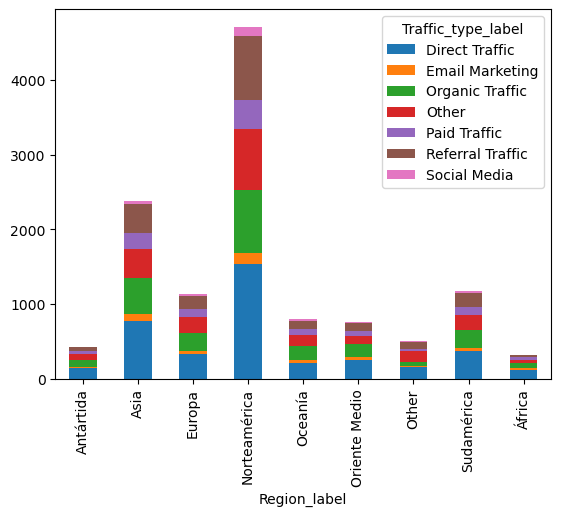

In [ ]:
crosstab_result.plot(kind='bar', stacked=True)
plt.show()

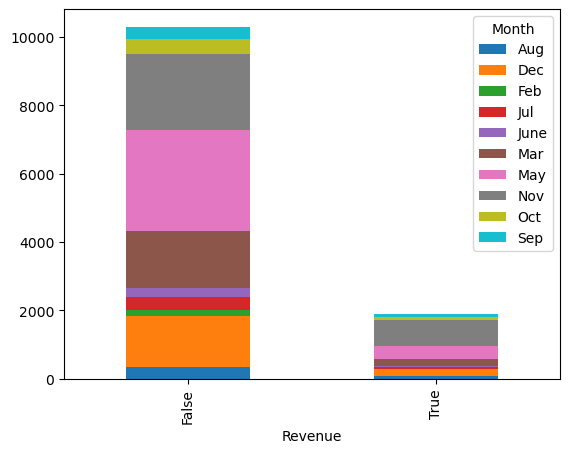

In [ ]:
crosstab_result1.plot(kind='bar', stacked=True)
plt.show()

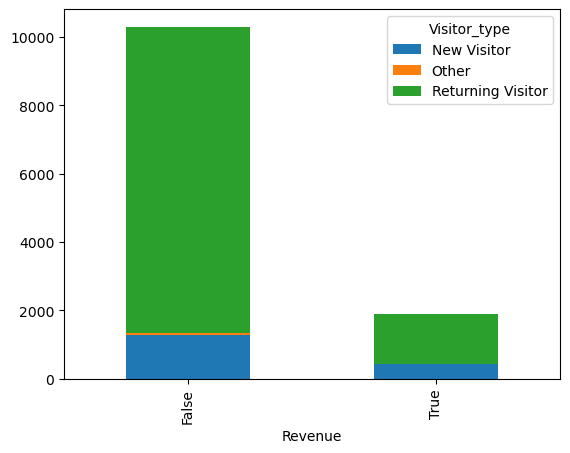

In [ ]:
crosstab_result2.plot(kind='bar', stacked=True)
plt.show()

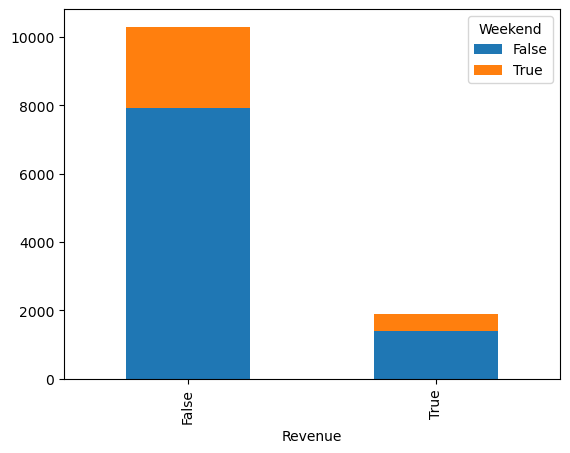

In [ ]:
crosstab_result3.plot(kind='bar', stacked=True)
plt.show()

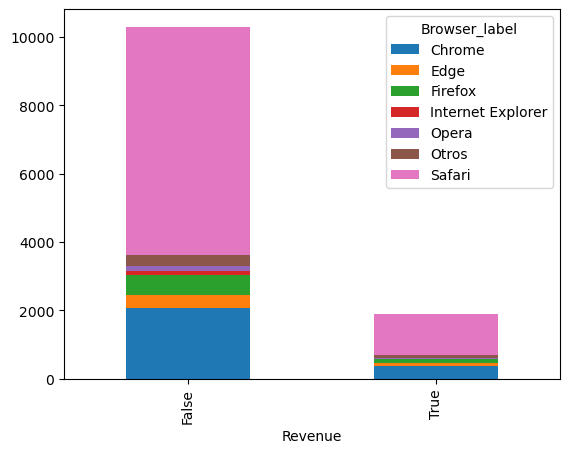

In [ ]:
crosstab_result4.plot(kind='bar', stacked=True)
plt.show()

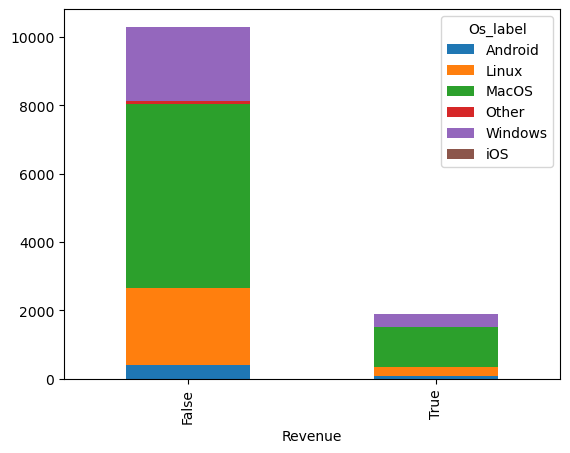

In [ ]:
crosstab_result5.plot(kind='bar', stacked=True)
plt.show()

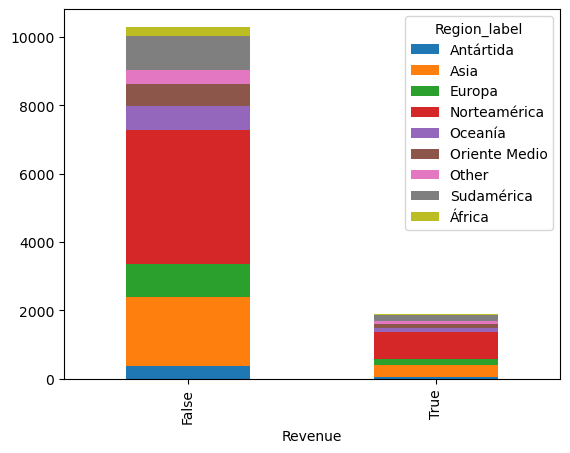

In [ ]:
crosstab_result6.plot(kind='bar', stacked=True)
plt.show()

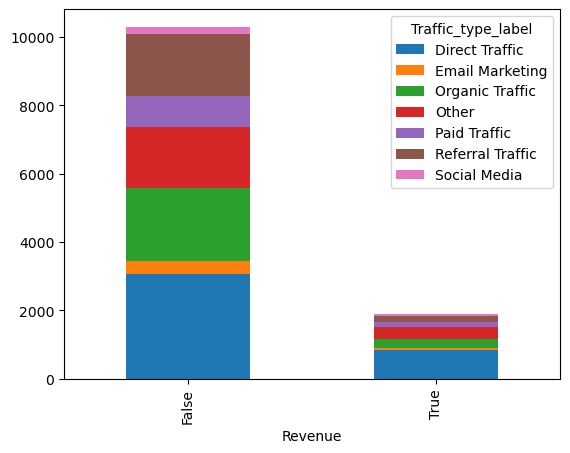

In [ ]:
crosstab_result7.plot(kind='bar', stacked=True)
plt.show()

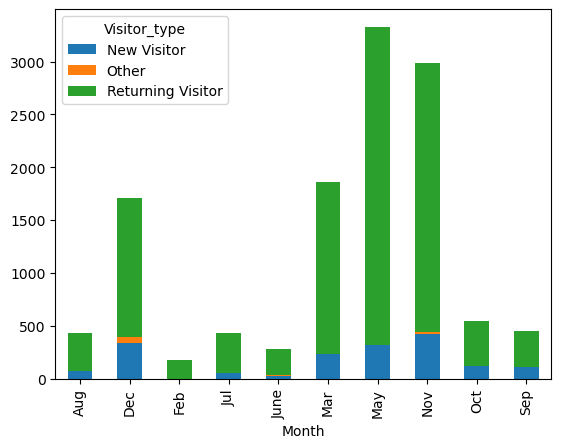

In [ ]:
crosstab_result8.plot(kind='bar', stacked=True)
plt.show()

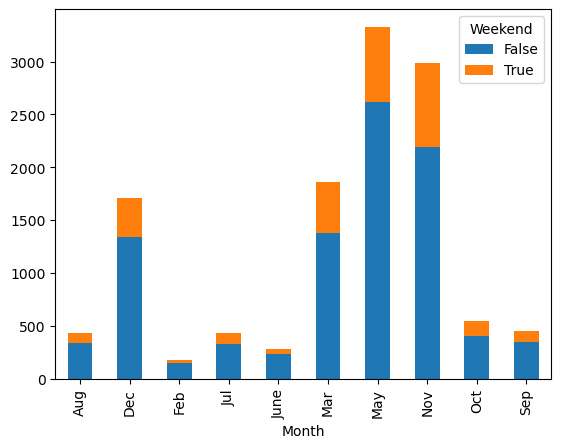

In [ ]:
crosstab_result9.plot(kind='bar', stacked=True)
plt.show()

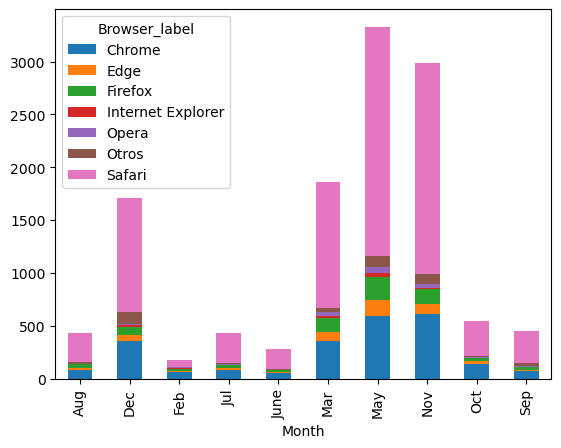

In [ ]:
crosstab_result10.plot(kind='bar', stacked=True)
plt.show()

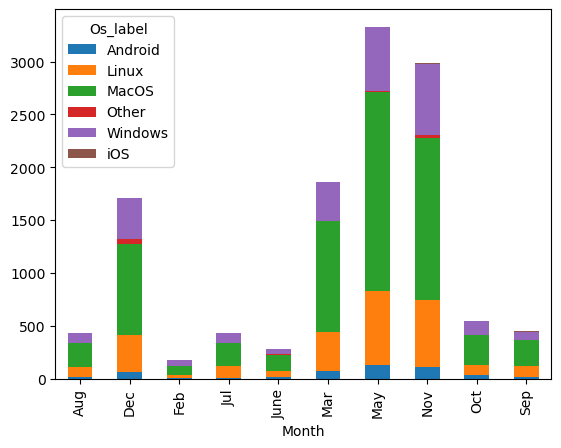

In [ ]:
crosstab_result11.plot(kind='bar', stacked=True)
plt.show()

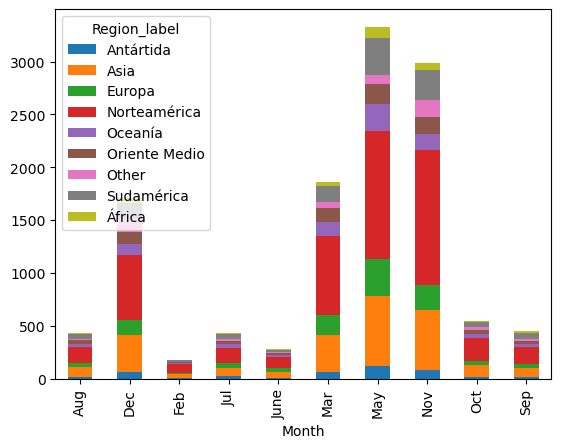

In [ ]:
crosstab_result12.plot(kind='bar', stacked=True)
plt.show()

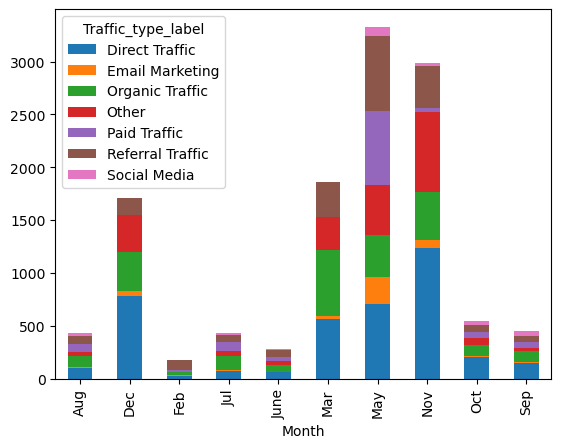

In [ ]:
crosstab_result13.plot(kind='bar', stacked=True)
plt.show()

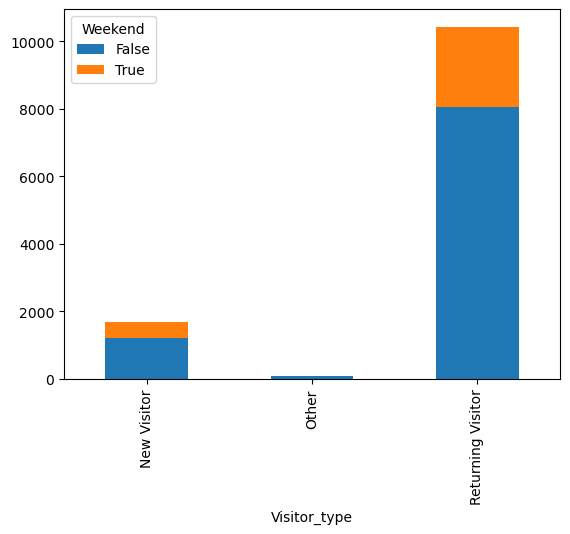

In [ ]:
crosstab_result14.plot(kind='bar', stacked=True)
plt.show()

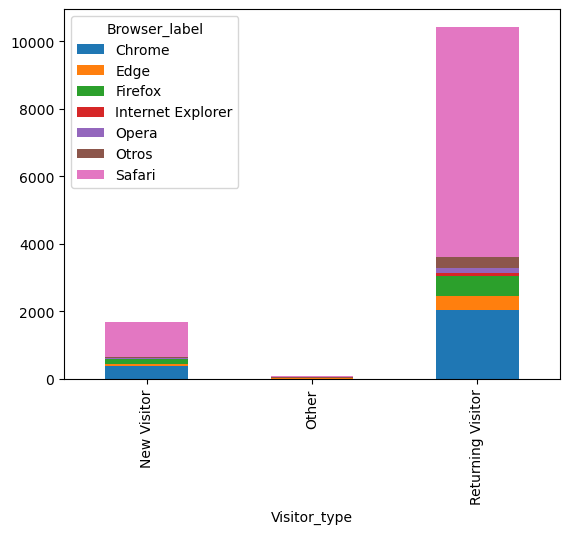

In [ ]:
crosstab_result15.plot(kind='bar', stacked=True)
plt.show()

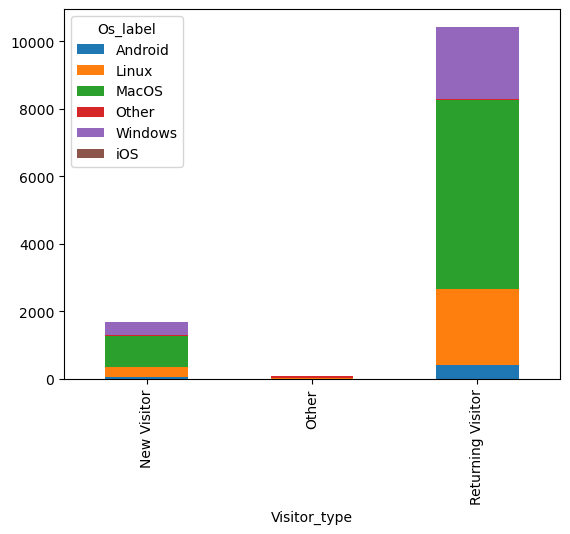

In [ ]:
crosstab_result16.plot(kind='bar', stacked=True)
plt.show()

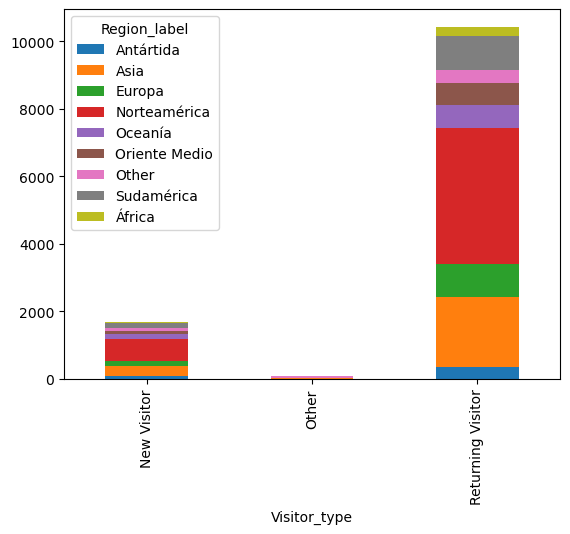

In [ ]:
crosstab_result17.plot(kind='bar', stacked=True)
plt.show()

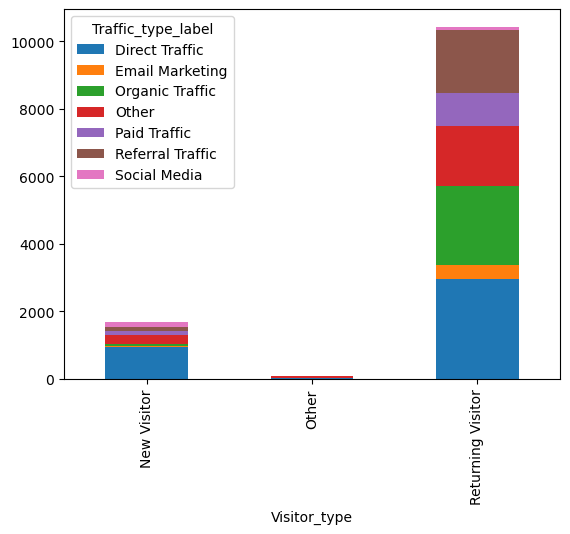

In [ ]:
crosstab_result18.plot(kind='bar', stacked=True)
plt.show()

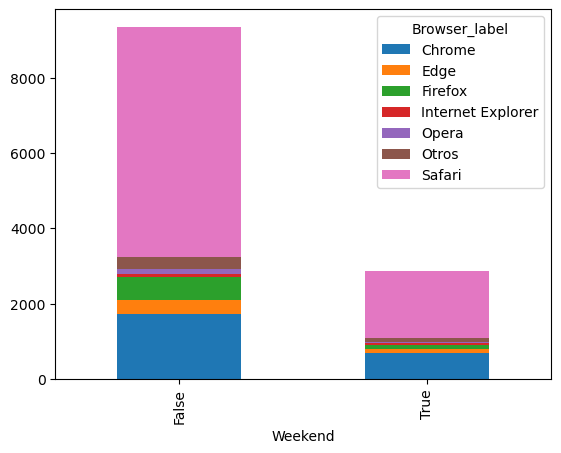

In [ ]:
crosstab_result19.plot(kind='bar', stacked=True)
plt.show()

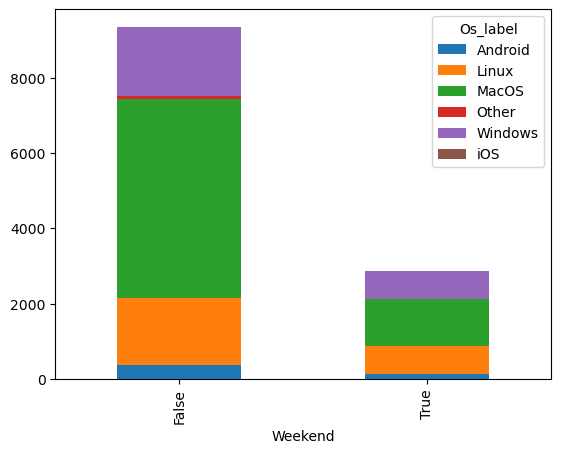

In [ ]:
crosstab_result20.plot(kind='bar', stacked=True)
plt.show()

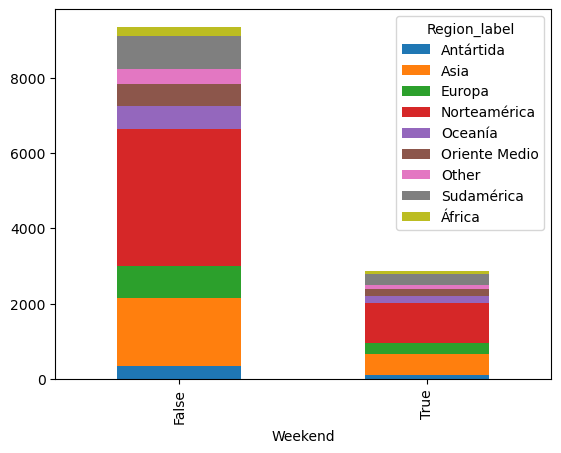

In [ ]:
crosstab_result21.plot(kind='bar', stacked=True)
plt.show()

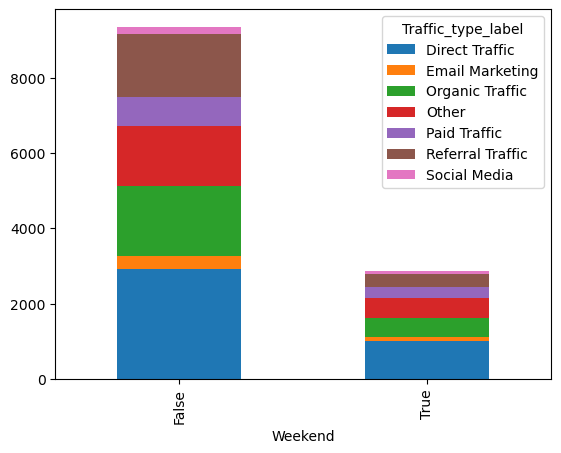

In [ ]:
crosstab_result22.plot(kind='bar', stacked=True)
plt.show()

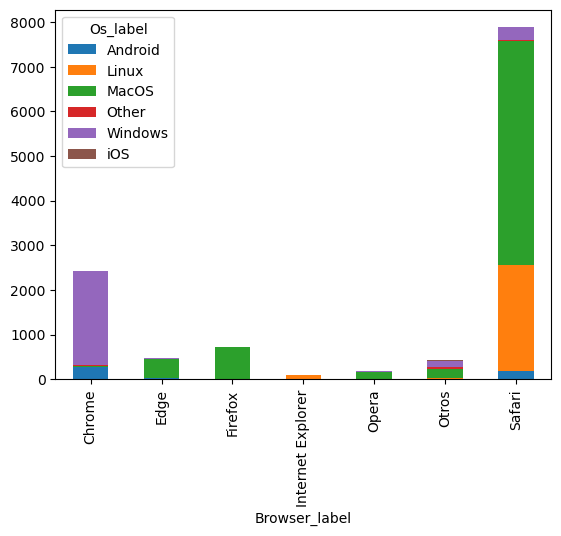

In [ ]:
crosstab_result23.plot(kind='bar', stacked=True)
plt.show()

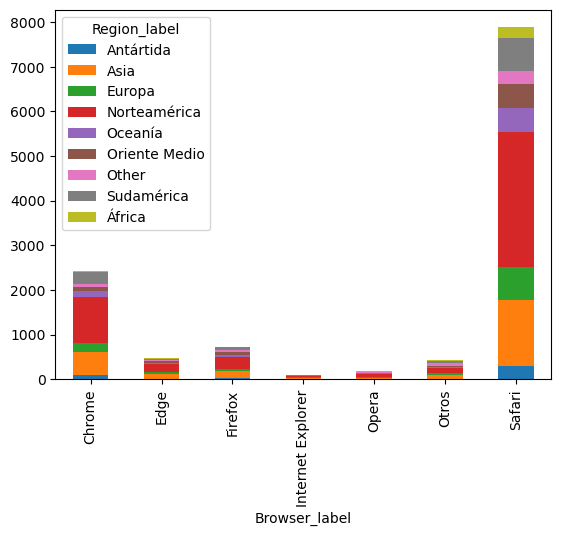

In [ ]:
crosstab_result24.plot(kind='bar', stacked=True)
plt.show()

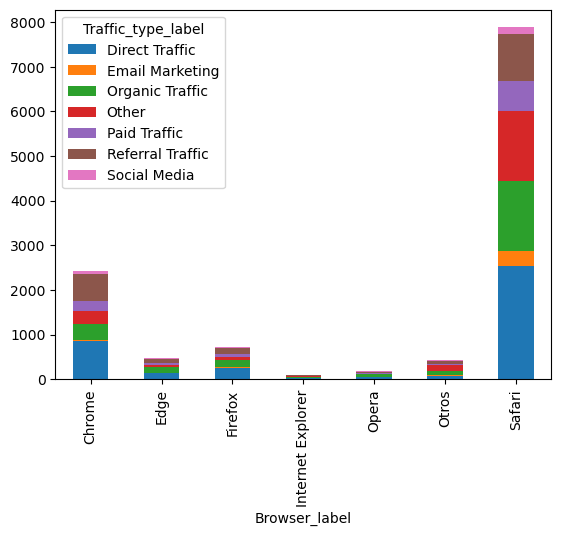

In [ ]:
crosstab_result25.plot(kind='bar', stacked=True)
plt.show()

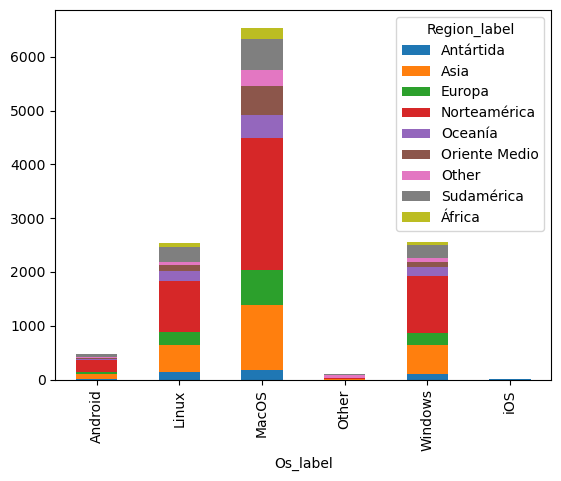

In [ ]:
crosstab_result26.plot(kind='bar', stacked=True)
plt.show()

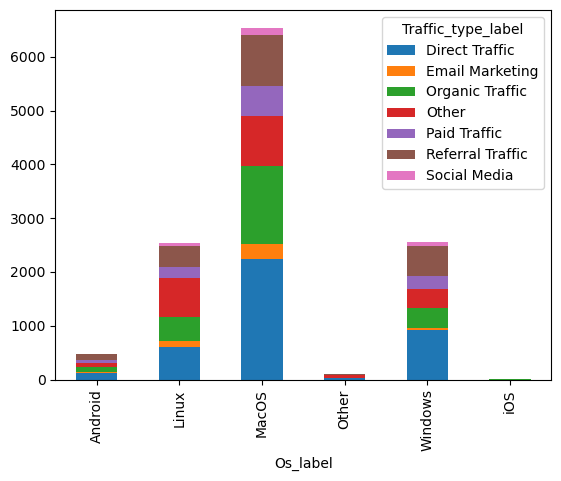

In [ ]:
crosstab_result27.plot(kind='bar', stacked=True)
plt.show()

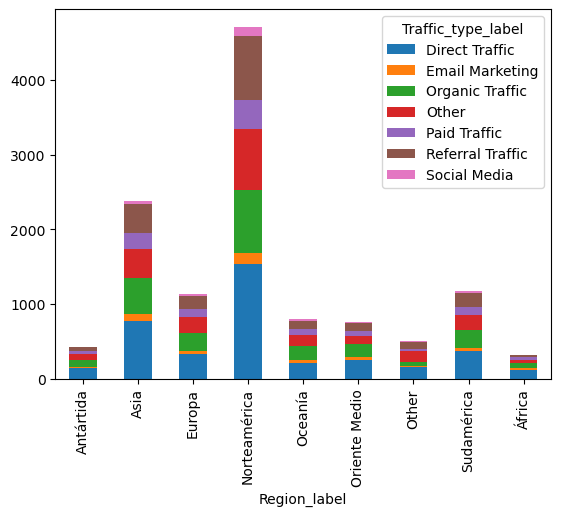

In [ ]:
crosstab_result28.plot(kind='bar', stacked=True)
plt.show()

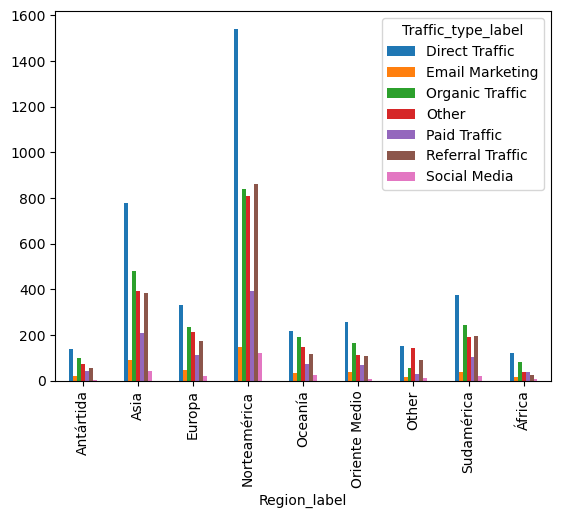

In [ ]:
crosstab_result.plot(kind='bar')
plt.show()

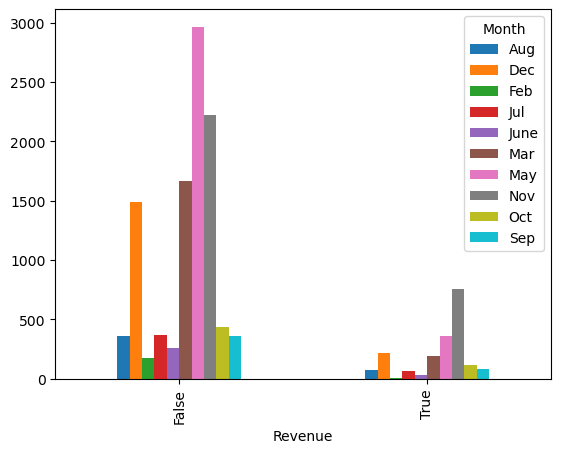

In [ ]:
crosstab_result1.plot(kind='bar')
plt.show()

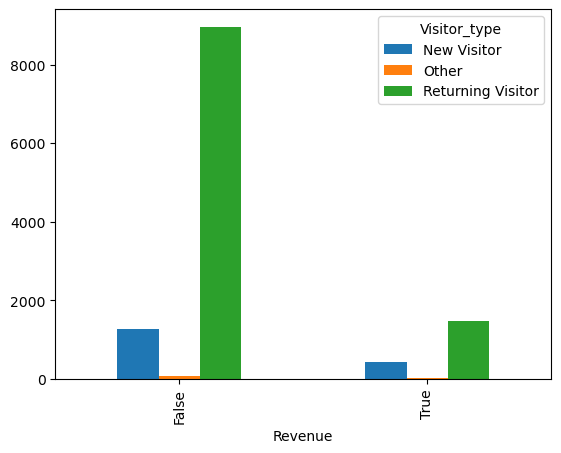

In [ ]:
crosstab_result2.plot(kind='bar')
plt.show()

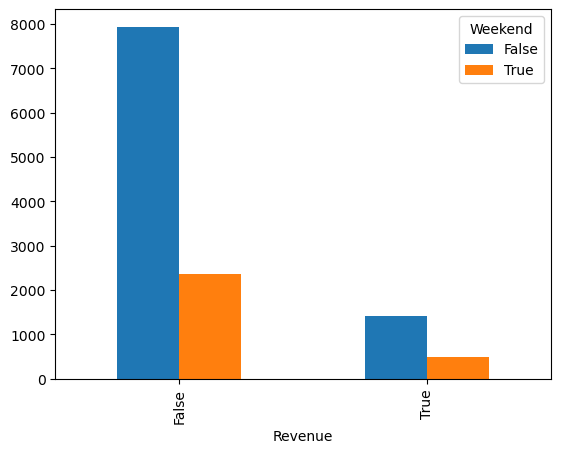

In [ ]:
crosstab_result3.plot(kind='bar')
plt.show()

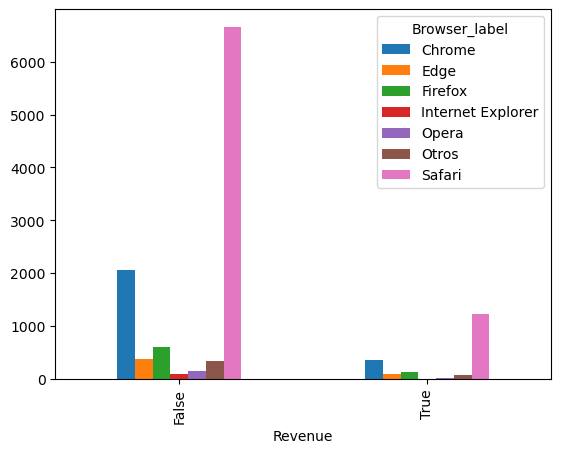

In [ ]:
crosstab_result4.plot(kind='bar')
plt.show()

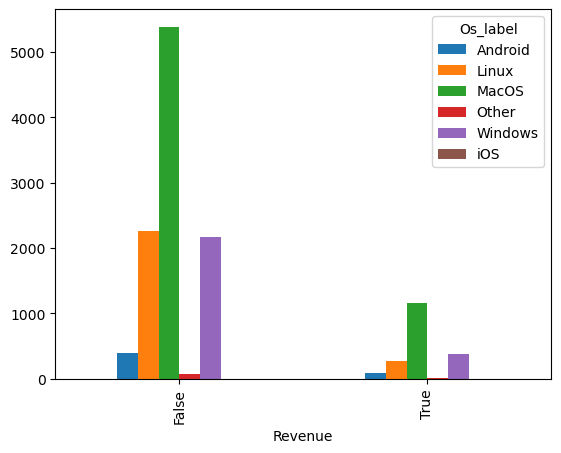

In [ ]:
crosstab_result5.plot(kind='bar')
plt.show()

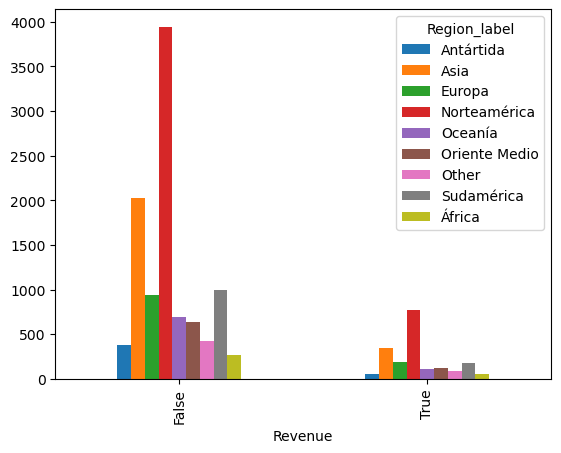

In [ ]:
crosstab_result6.plot(kind='bar')
plt.show()

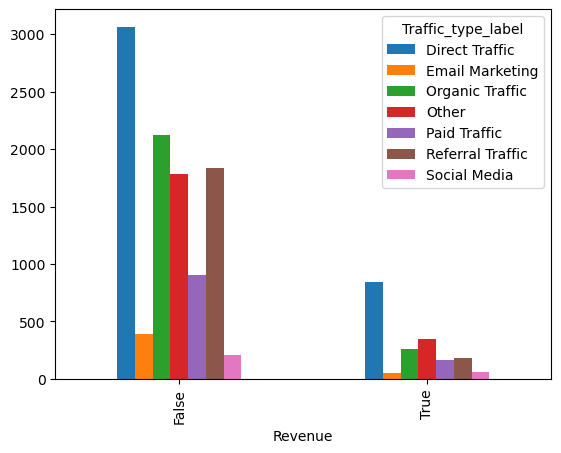

In [ ]:
crosstab_result7.plot(kind='bar')
plt.show()

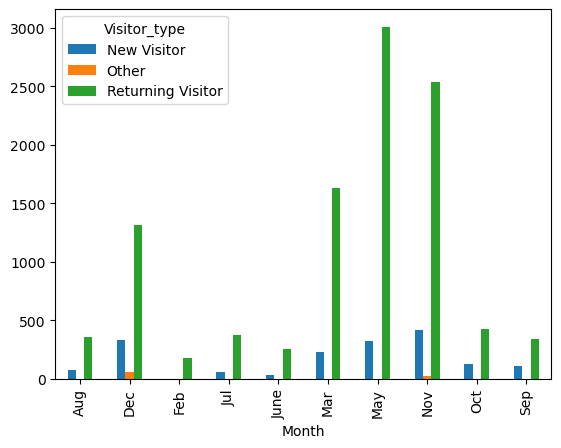

In [ ]:
crosstab_result8.plot(kind='bar')
plt.show()

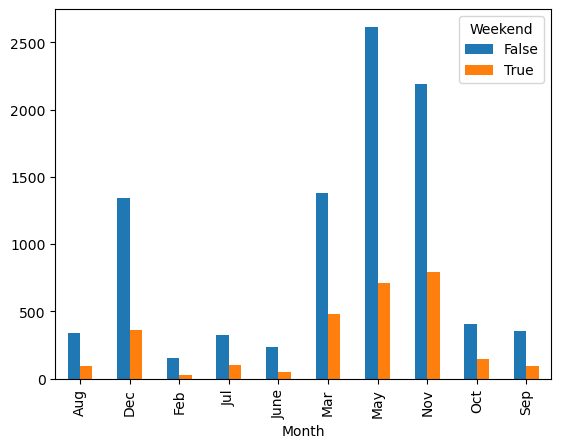

In [ ]:
crosstab_result9.plot(kind='bar')
plt.show()

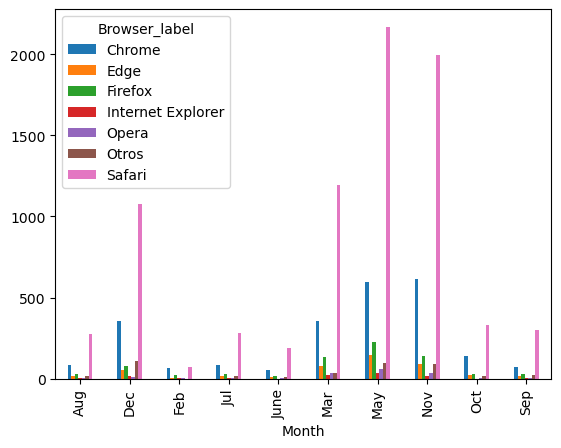

In [ ]:
crosstab_result10.plot(kind='bar')
plt.show()

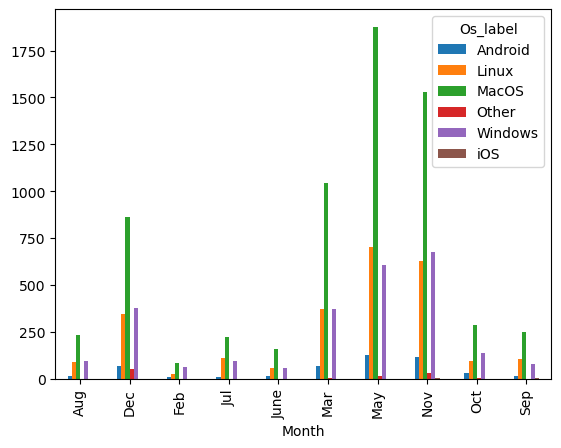

In [ ]:
crosstab_result11.plot(kind='bar')
plt.show()

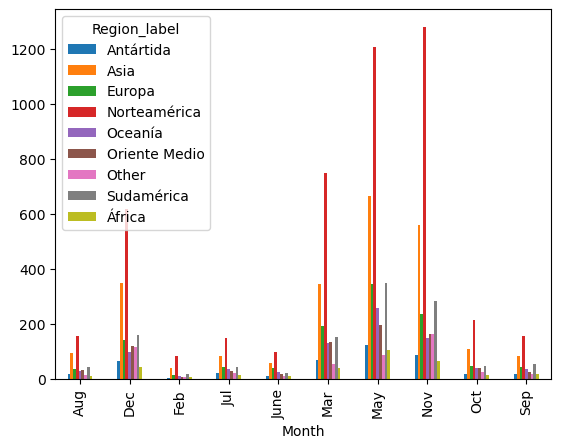

In [ ]:
crosstab_result12.plot(kind='bar')
plt.show()

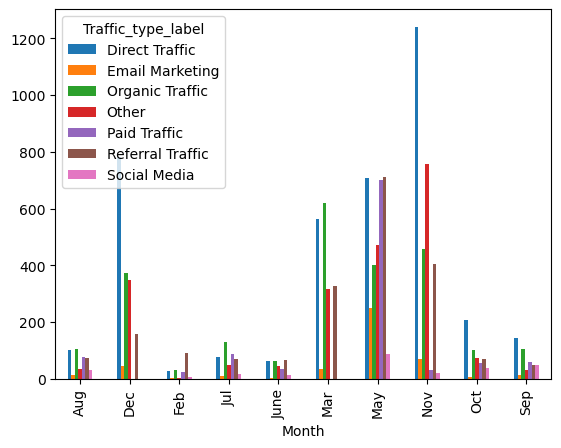

In [ ]:
crosstab_result13.plot(kind='bar')
plt.show()

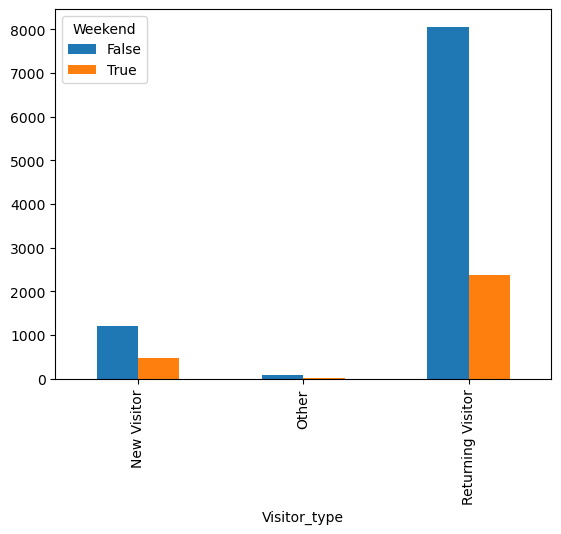

In [ ]:
crosstab_result14.plot(kind='bar')
plt.show()

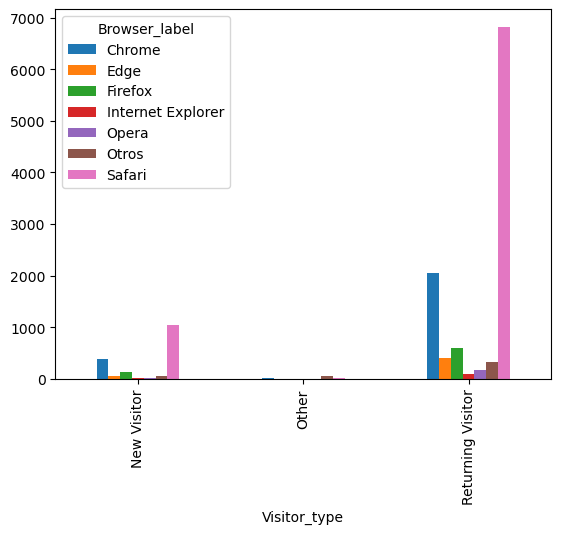

In [ ]:
crosstab_result15.plot(kind='bar')
plt.show()

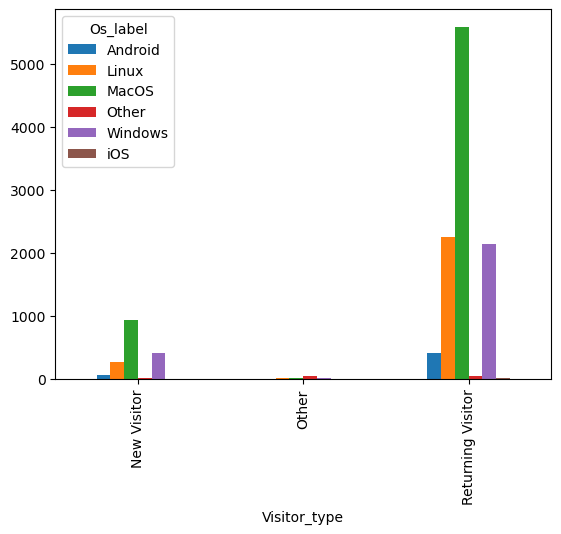

In [ ]:
crosstab_result16.plot(kind='bar')
plt.show()

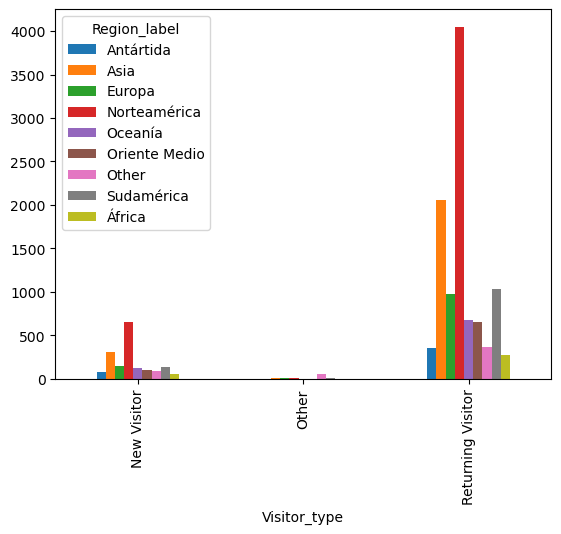

In [ ]:
crosstab_result17.plot(kind='bar')
plt.show()

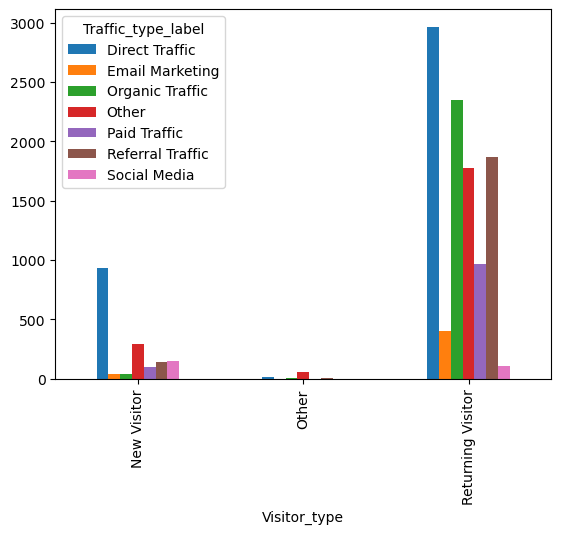

In [ ]:
crosstab_result18.plot(kind='bar')
plt.show()

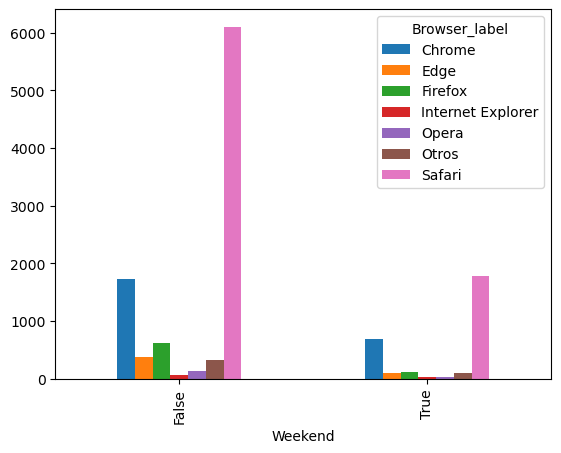

In [ ]:
crosstab_result19.plot(kind='bar')
plt.show()

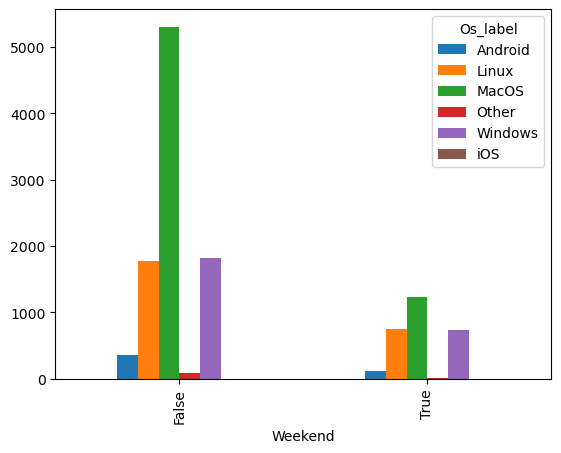

In [ ]:
crosstab_result20.plot(kind='bar')
plt.show()

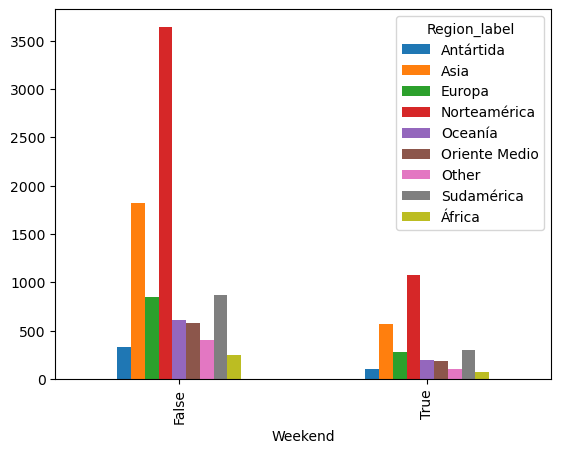

In [ ]:
crosstab_result21.plot(kind='bar')
plt.show()

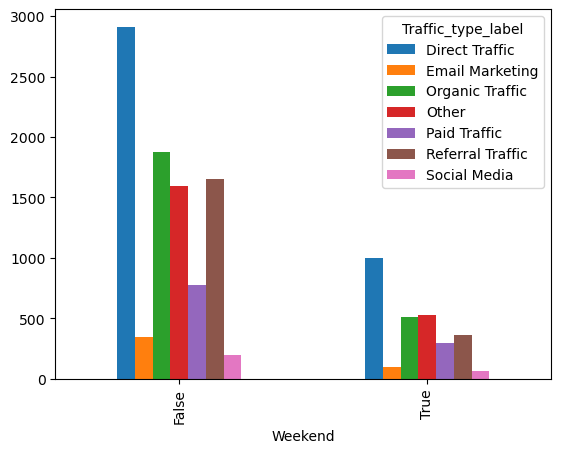

In [ ]:
crosstab_result22.plot(kind='bar')
plt.show()

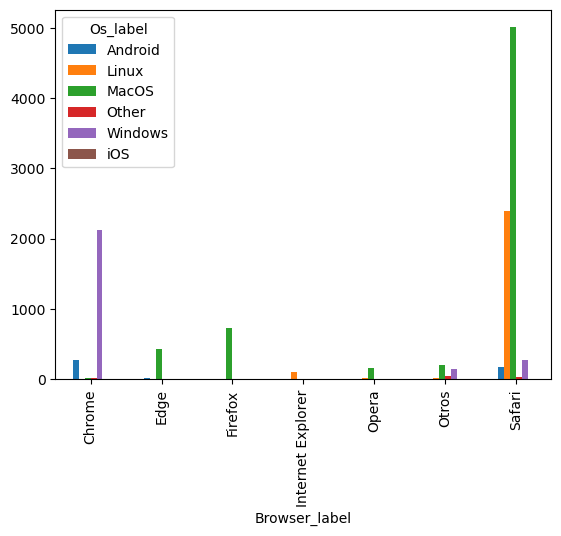

In [ ]:
crosstab_result23.plot(kind='bar')
plt.show()

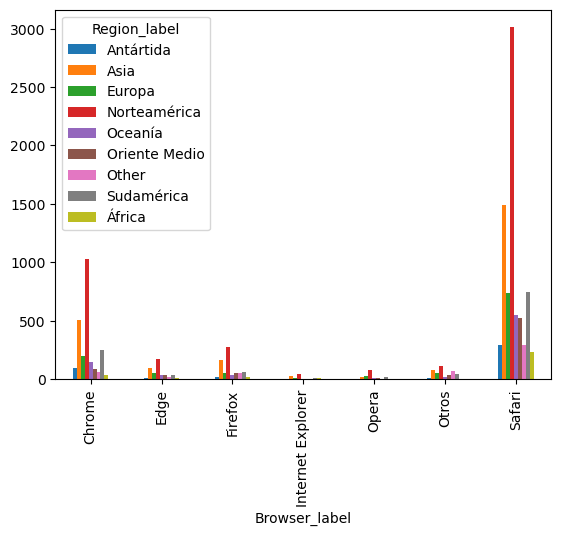

In [ ]:
crosstab_result24.plot(kind='bar')
plt.show()

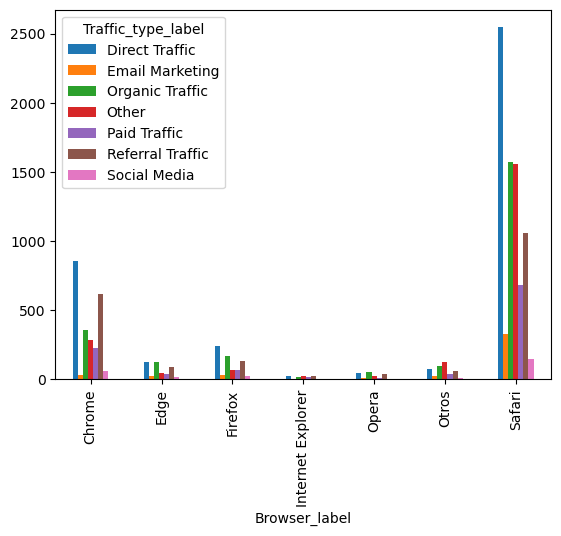

In [ ]:
crosstab_result25.plot(kind='bar')
plt.show()

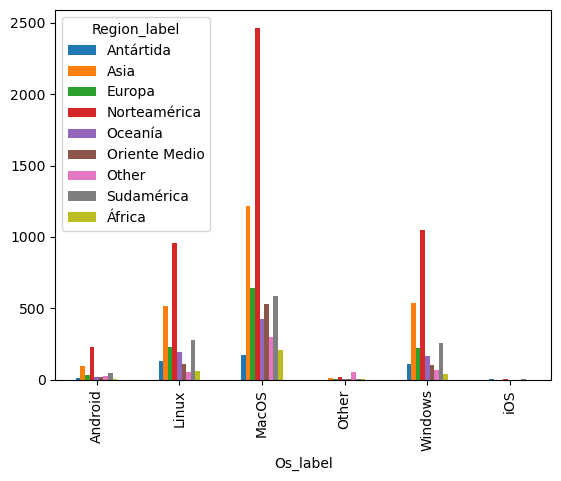

In [ ]:
crosstab_result26.plot(kind='bar')
plt.show()

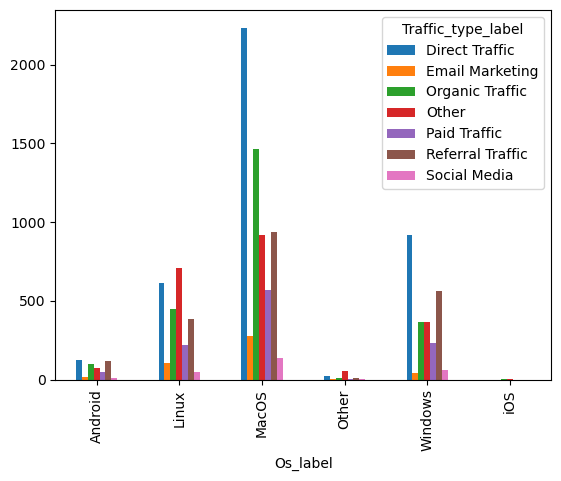

In [ ]:
crosstab_result27.plot(kind='bar')
plt.show()

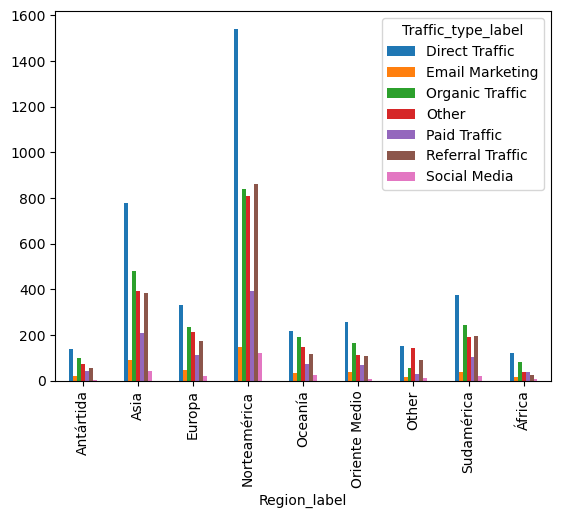

In [ ]:
crosstab_result28.plot(kind='bar')
plt.show()

### Frequency heat maps


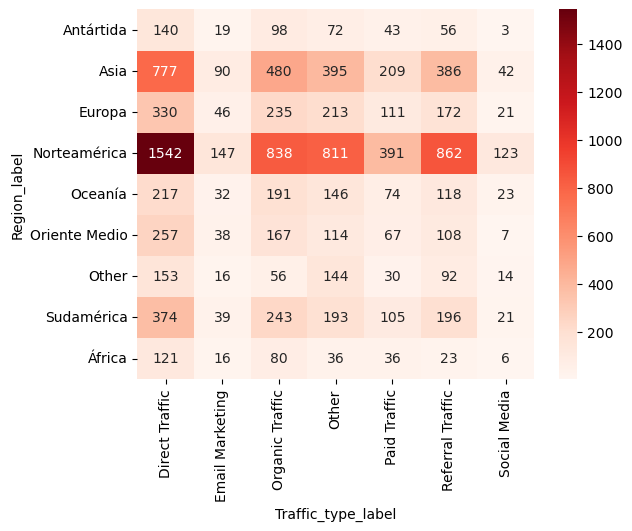

In [ ]:
sns.heatmap(crosstab_result, annot=True, cmap="Reds", fmt="d")
plt.show()

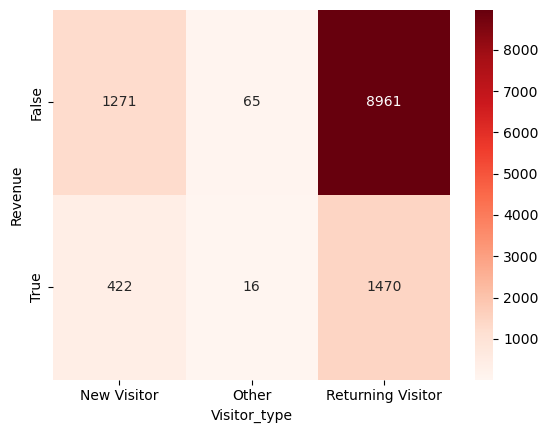

In [ ]:
sns.heatmap(crosstab_result2, annot=True, cmap="Reds", fmt="d")
plt.show()

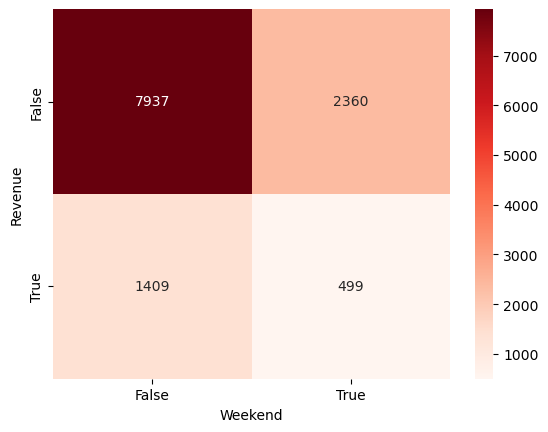

In [ ]:
sns.heatmap(crosstab_result3, annot=True, cmap="Reds", fmt="d")
plt.show()

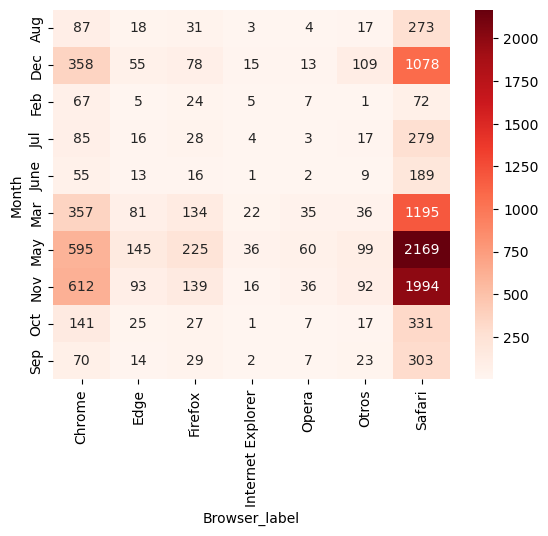

In [ ]:
sns.heatmap(crosstab_result10, annot=True, cmap="Reds", fmt="d")
plt.show()

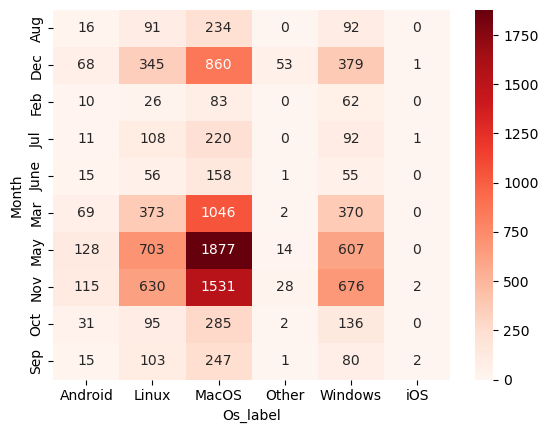

In [ ]:
sns.heatmap(crosstab_result11, annot=True, cmap="Reds", fmt="d")
plt.show()

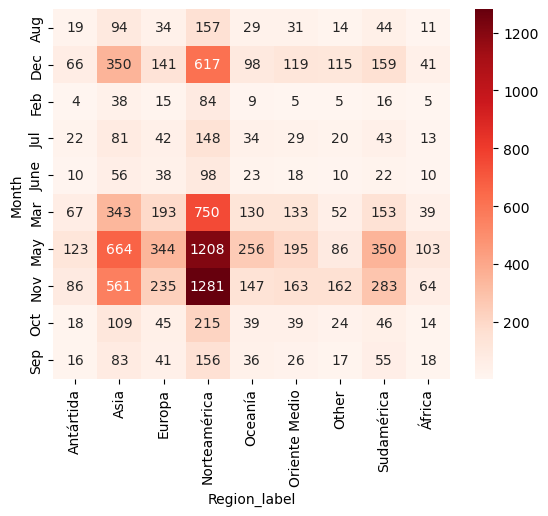

In [ ]:
sns.heatmap(crosstab_result12, annot=True, cmap="Reds", fmt="d")
plt.show()

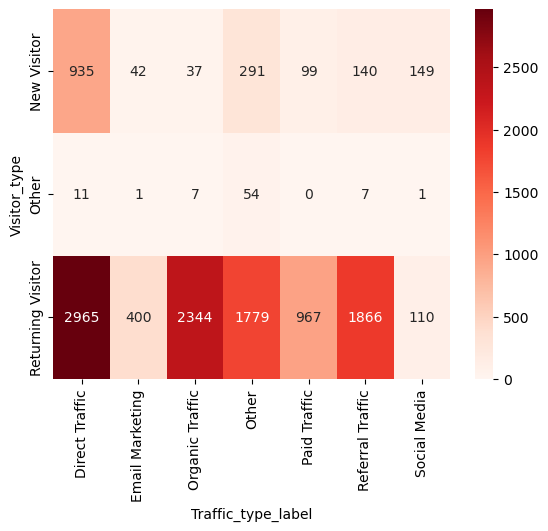

In [ ]:
sns.heatmap(crosstab_result18, annot=True, cmap="Reds", fmt="d")
plt.show()

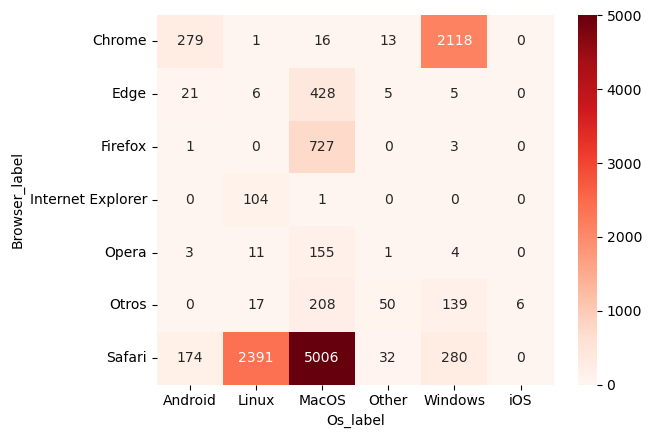

In [ ]:
sns.heatmap(crosstab_result23, annot=True, cmap="Reds", fmt="d")
plt.show()

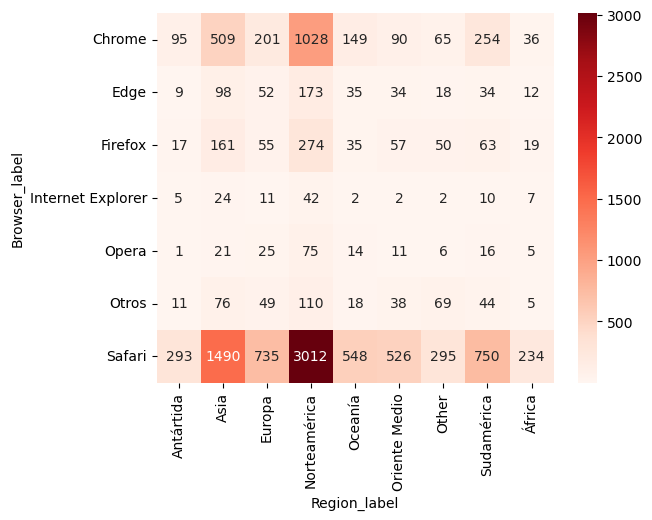

In [ ]:
sns.heatmap(crosstab_result24, annot=True, cmap="Reds", fmt="d")
plt.show()

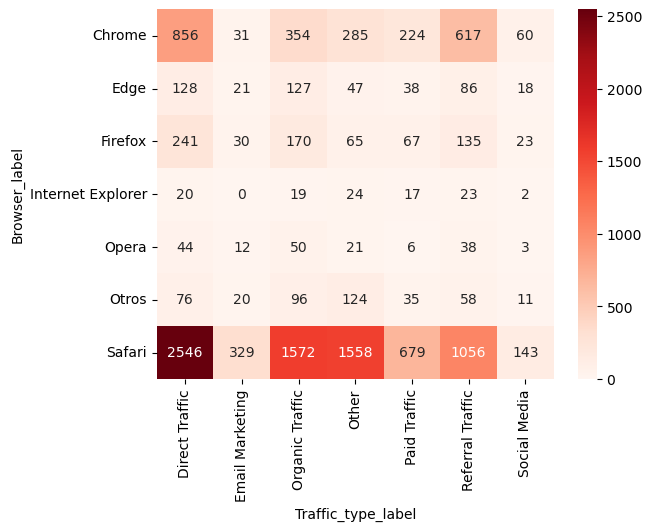

In [ ]:
sns.heatmap(crosstab_result25, annot=True, cmap="Reds", fmt="d")
plt.show()

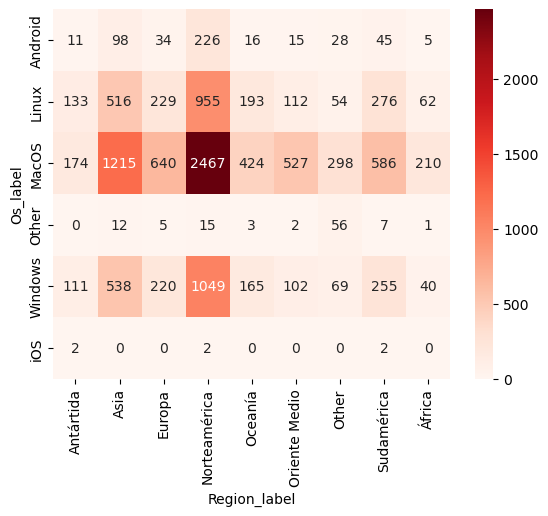

In [ ]:
sns.heatmap(crosstab_result26, annot=True, cmap="Reds", fmt="d")
plt.show()

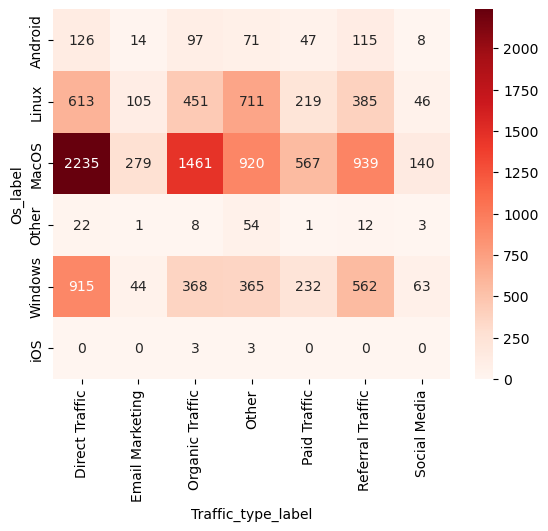

In [ ]:
sns.heatmap(crosstab_result27, annot=True, cmap="Reds", fmt="d")
plt.show()

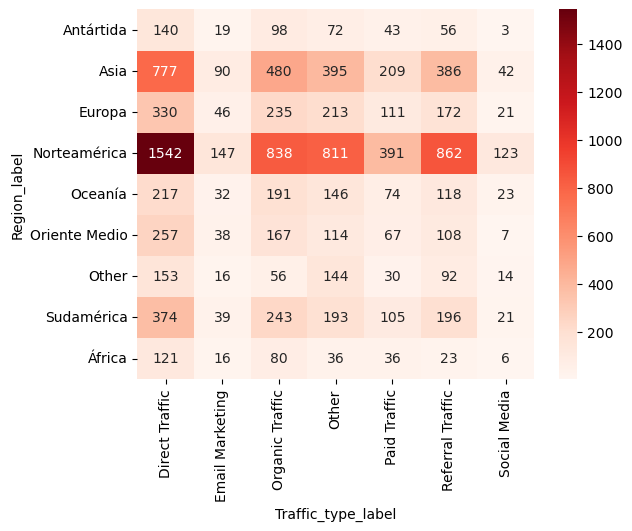

In [ ]:
sns.heatmap(crosstab_result28, annot=True, cmap="Reds", fmt="d")
plt.show()

### Chi-square tests y Cramér's V 

In [ ]:
from scipy.stats import chi2_contingency


In [ ]:
chi2_stats, chi2_pvalue, _, _ = chi2_contingency(crosstab_result)

In [ ]:
chi2_pvalue

4.195948326844285e-18

In [ ]:
from scipy.stats.contingency import association

In [ ]:
association(crosstab_result, method='cramer')

0.05037458183926616

In [ ]:
chi2_stats, chi2_pvalue, _, _ = chi2_contingency(crosstab_result1)
chi2_pvalue

1.5668451821229657e-75

In [ ]:
association(crosstab_result1, method='cramer')

0.17558465976568197

In [ ]:
chi2_stats, chi2_pvalue, _, _ = chi2_contingency(crosstab_result2)
chi2_pvalue

4.2255708283129954e-29

In [ ]:
association(crosstab_result2, method='cramer')

0.10347015737834084

In [ ]:
chi2_stats, chi2_pvalue, _, _ = chi2_contingency(crosstab_result3)
chi2_pvalue

0.002413809785581609

In [ ]:
association(crosstab_result3, method='cramer')

0.02772873583748308

In [ ]:
chi2_stats, chi2_pvalue, _, _ = chi2_contingency(crosstab_result4)
chi2_pvalue

0.0017853442964037552

In [ ]:
association(crosstab_result4, method='cramer')

0.04154511393482942

In [ ]:
chi2_stats, chi2_pvalue, _, _ = chi2_contingency(crosstab_result5)
chi2_pvalue

2.2059672443182043e-14

In [ ]:
association(crosstab_result5, method='cramer')

0.07744502357970467

In [ ]:
chi2_stats, chi2_pvalue, _, _ = chi2_contingency(crosstab_result6)
chi2_pvalue

0.28825622872931483

In [ ]:
association(crosstab_result6, method='cramer')

0.028161399822598146

In [ ]:
chi2_stats, chi2_pvalue, _, _ = chi2_contingency(crosstab_result7)
chi2_pvalue

2.89387013133016e-46

In [ ]:
association(crosstab_result7, method='cramer')

0.1364661766339579

In [ ]:
chi2_stats, chi2_pvalue, _, _ = chi2_contingency(crosstab_result8)
chi2_pvalue

4.203152770654309e-86

In [ ]:
association(crosstab_result8, method='cramer')

0.1371282042294424

In [ ]:
chi2_stats, chi2_pvalue, _, _ = chi2_contingency(crosstab_result9)
chi2_pvalue

5.904549263883718e-08

In [ ]:
association(crosstab_result9, method='cramer')

0.06488634713418048

In [ ]:
chi2_stats, chi2_pvalue, _, _ = chi2_contingency(crosstab_result10)
chi2_pvalue

1.5027237602067775e-24

In [ ]:
association(crosstab_result10, method='cramer')

0.056731105870659805

In [ ]:
chi2_stats, chi2_pvalue, _, _ = chi2_contingency(crosstab_result11)
chi2_pvalue

3.9692288684512674e-28

In [ ]:
association(crosstab_result11, method='cramer')

0.06248929303737271

In [ ]:
chi2_stats, chi2_pvalue, _, _ = chi2_contingency(crosstab_result12)
chi2_pvalue

5.500048492683953e-14

In [ ]:
association(crosstab_result12, method='cramer')

0.04525829120759453

In [ ]:
chi2_stats, chi2_pvalue, _, _ = chi2_contingency(crosstab_result13)
chi2_pvalue

0.0

In [ ]:
association(crosstab_result13, method='cramer')

0.20265879066156475

In [ ]:
chi2_stats, chi2_pvalue, _, _ = chi2_contingency(crosstab_result14)
chi2_pvalue

2.6557481793856208e-08

In [ ]:
association(crosstab_result14, method='cramer')

0.053464877541142625

In [ ]:
chi2_stats, chi2_pvalue, _, _ = chi2_contingency(crosstab_result15)
chi2_pvalue

8.982235092043214e-170

In [ ]:
association(crosstab_result15, method='cramer')

0.18430988136071166

In [ ]:
chi2_stats, chi2_pvalue, _, _ = chi2_contingency(crosstab_result16)
chi2_pvalue

0.0

In [ ]:
association(crosstab_result16, method='cramer')

0.39041252823772443

In [ ]:
chi2_stats, chi2_pvalue, _, _ = chi2_contingency(crosstab_result17)
chi2_pvalue

6.331257540169858e-147

In [ ]:
association(crosstab_result17, method='cramer')

0.1739988596160712

In [ ]:
chi2_stats, chi2_pvalue, _, _ = chi2_contingency(crosstab_result18)
chi2_pvalue

4.408843265062956e-269

In [ ]:
association(crosstab_result18, method='cramer')

0.2299710608195617

In [ ]:
chi2_stats, chi2_pvalue, _, _ = chi2_contingency(crosstab_result19)
chi2_pvalue

2.8499882107477584e-13

In [ ]:
association(crosstab_result19, method='cramer')

0.07614433612573421

In [ ]:
chi2_stats, chi2_pvalue, _, _ = chi2_contingency(crosstab_result20)
chi2_pvalue

2.304466379224274e-35

In [ ]:
association(crosstab_result20, method='cramer')

0.11883142231013415

In [ ]:
chi2_stats, chi2_pvalue, _, _ = chi2_contingency(crosstab_result21)
chi2_pvalue

0.21117143372098568

In [ ]:
association(crosstab_result21, method='cramer')

0.02979639586745438

In [ ]:
chi2_stats, chi2_pvalue, _, _ = chi2_contingency(crosstab_result22)
chi2_pvalue

1.182813125191026e-11

In [ ]:
association(crosstab_result22, method='cramer')

0.07176168214770942

In [ ]:
chi2_stats, chi2_pvalue, _, _ = chi2_contingency(crosstab_result23)
chi2_pvalue

0.0

In [ ]:
association(crosstab_result23, method='cramer')

0.42935706365400034

In [ ]:
chi2_stats, chi2_pvalue, _, _ = chi2_contingency(crosstab_result24)
chi2_pvalue

4.858507998567421e-45

In [ ]:
association(crosstab_result24, method='cramer')

0.06783622776162909

In [ ]:
chi2_stats, chi2_pvalue, _, _ = chi2_contingency(crosstab_result25)
chi2_pvalue

1.4534318289265183e-86

In [ ]:
association(crosstab_result25, method='cramer')

0.08404858523260947

In [ ]:
chi2_stats, chi2_pvalue, _, _ = chi2_contingency(crosstab_result26)
chi2_pvalue

8.941489883525717e-169

In [ ]:
association(crosstab_result26, method='cramer')

0.12335854992509089

In [ ]:
chi2_stats, chi2_pvalue, _, _ = chi2_contingency(crosstab_result27)
chi2_pvalue

8.620079531802938e-106

In [ ]:
association(crosstab_result27, method='cramer')

0.0985705052790647

In [ ]:
chi2_stats, chi2_pvalue, _, _ = chi2_contingency(crosstab_result28)
chi2_pvalue

4.195948326844285e-18

In [ ]:
association(crosstab_result28, method='cramer')

0.05037458183926616

<h2 style="color: #008080;">Categorical Vs Continuous</h2>

### Side by side Box Plots

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1876383066.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Month", y="Administrative", palette="coolwarm")


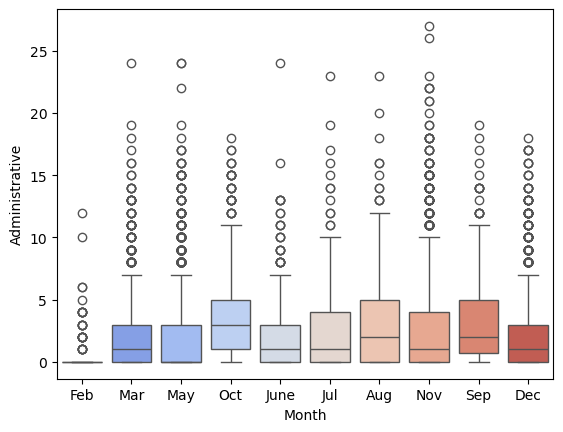

In [ ]:
sns.boxplot(data=df_bivariate, x="Month", y="Administrative", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3634940267.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Month", y="Administrative_duration", palette="coolwarm")


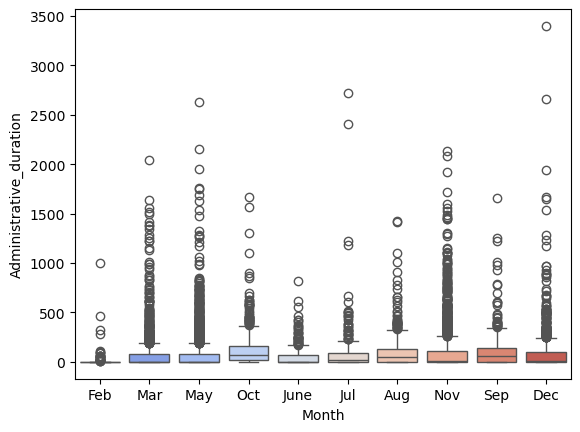

In [ ]:
sns.boxplot(data=df_bivariate, x="Month", y="Administrative_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2711561714.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Month", y="Informational", palette="coolwarm")


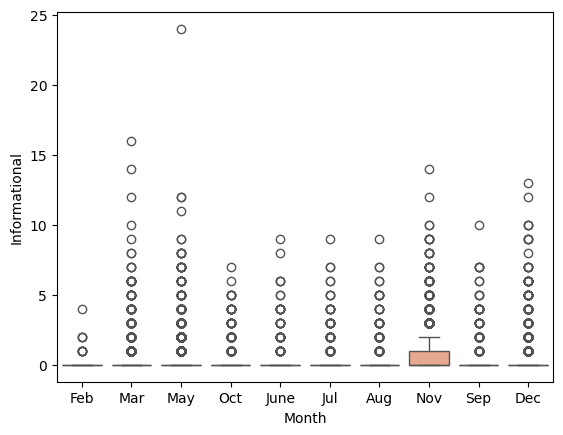

In [ ]:
sns.boxplot(data=df_bivariate, x="Month", y="Informational", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\542284442.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Month", y="Informational_duration", palette="coolwarm")


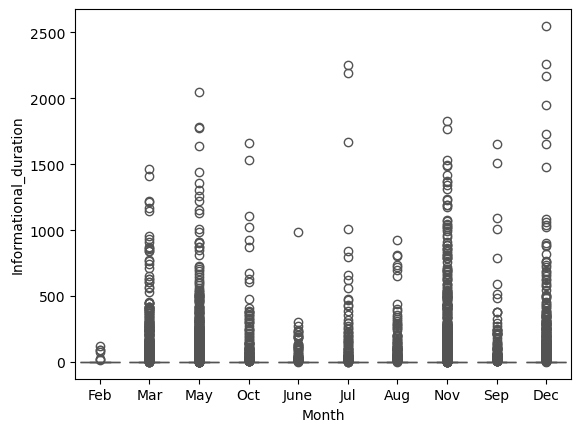

In [ ]:
sns.boxplot(data=df_bivariate, x="Month", y="Informational_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\730185182.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Month", y="Product_related", palette="coolwarm")


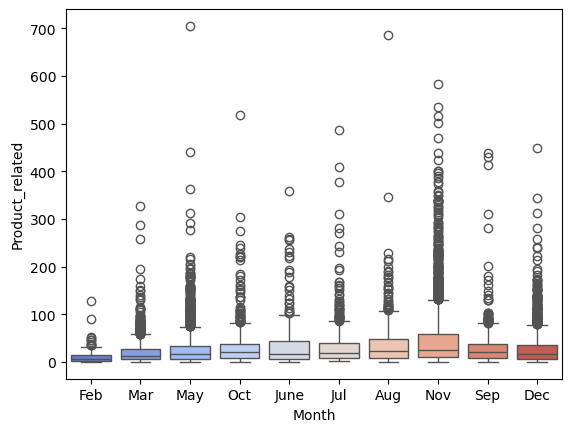

In [ ]:
sns.boxplot(data=df_bivariate, x="Month", y="Product_related", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3072905296.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Month", y="Product_related_duration", palette="coolwarm")


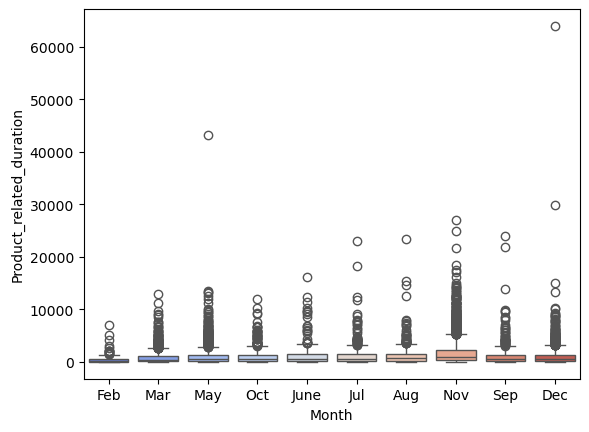

In [ ]:
sns.boxplot(data=df_bivariate, x="Month", y="Product_related_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2629785886.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Month", y="Bounce_rates", palette="coolwarm")


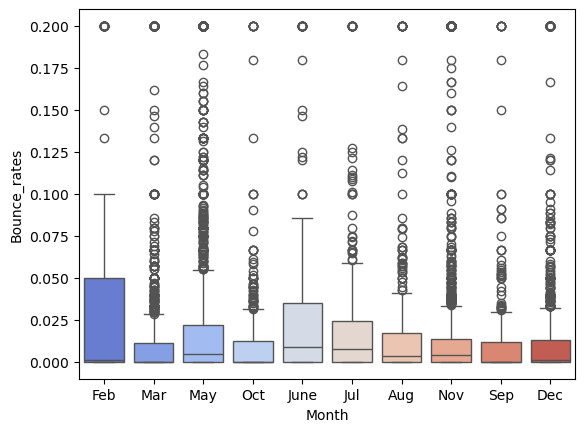

In [ ]:
sns.boxplot(data=df_bivariate, x="Month", y="Bounce_rates", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\4066586336.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Month", y="Exit_rates", palette="coolwarm")


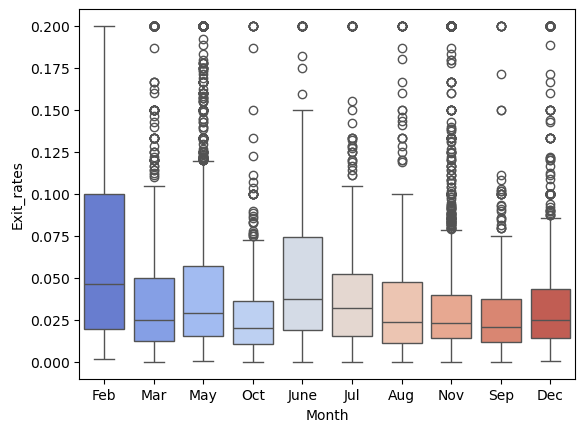

In [ ]:
sns.boxplot(data=df_bivariate, x="Month", y="Exit_rates", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1344841371.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Month", y="Page_values", palette="coolwarm")


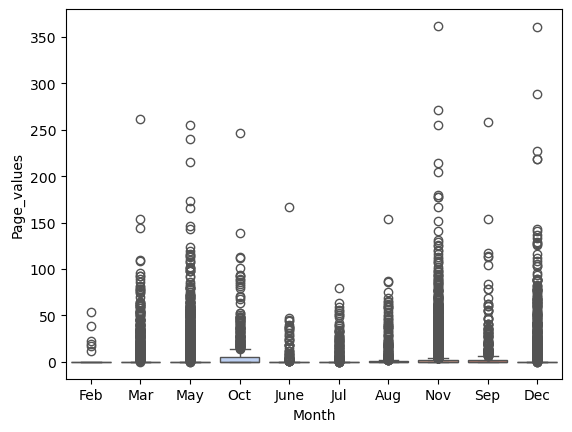

In [ ]:
sns.boxplot(data=df_bivariate, x="Month", y="Page_values", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\4048502251.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Month", y="Special_day", palette="coolwarm")


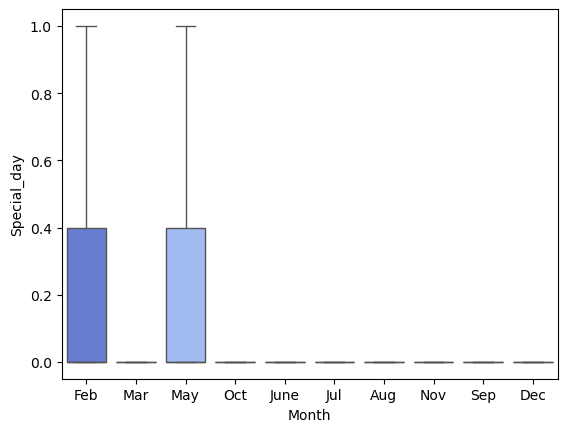

In [ ]:
sns.boxplot(data=df_bivariate, x="Month", y="Special_day", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2507445847.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Visitor_type", y="Administrative", palette="coolwarm")


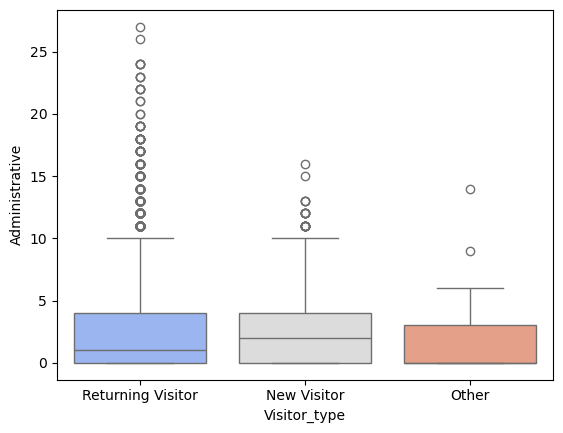

In [ ]:
sns.boxplot(data=df_bivariate, x="Visitor_type", y="Administrative", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2084009872.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Visitor_type", y="Administrative_duration", palette="coolwarm")


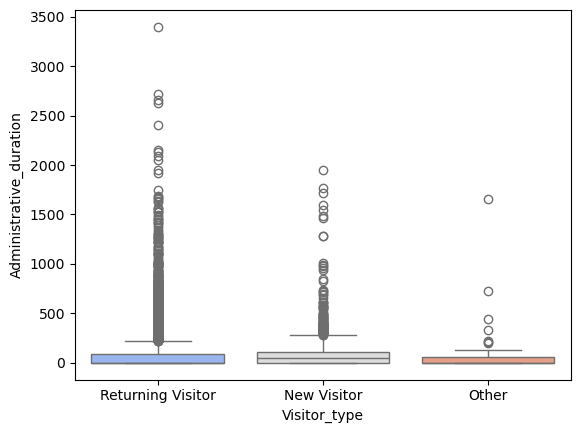

In [ ]:
sns.boxplot(data=df_bivariate, x="Visitor_type", y="Administrative_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2251975983.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Visitor_type", y="Informational", palette="coolwarm")


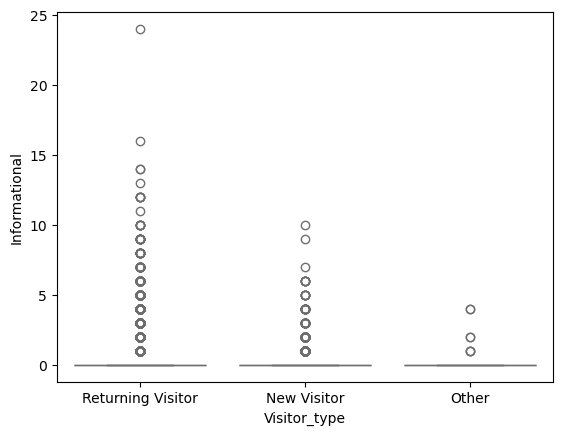

In [ ]:
sns.boxplot(data=df_bivariate, x="Visitor_type", y="Informational", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\434987295.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Visitor_type", y="Product_related", palette="coolwarm")


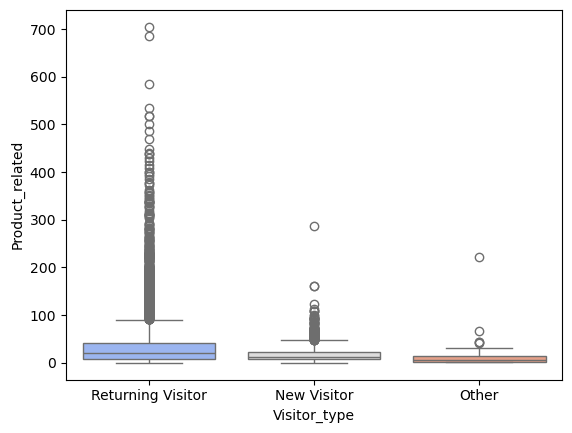

In [ ]:
sns.boxplot(data=df_bivariate, x="Visitor_type", y="Product_related", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\361072479.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Visitor_type", y="Product_related_duration", palette="coolwarm")


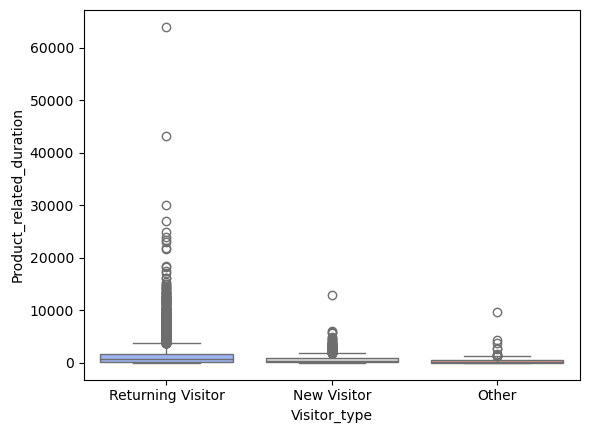

In [ ]:
sns.boxplot(data=df_bivariate, x="Visitor_type", y="Product_related_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1802997124.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Visitor_type", y="Bounce_rates", palette="coolwarm")


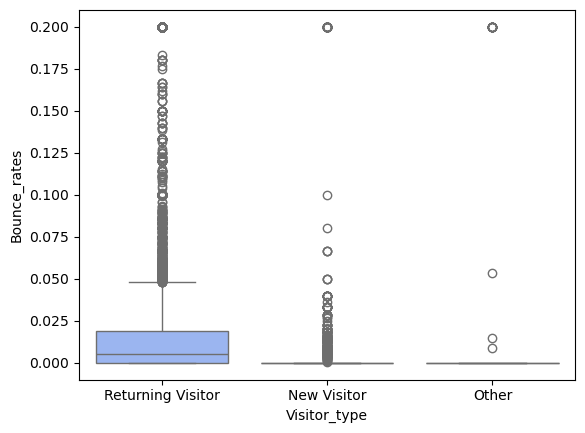

In [ ]:
sns.boxplot(data=df_bivariate, x="Visitor_type", y="Bounce_rates", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2890411947.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Visitor_type", y="Exit_rates", palette="coolwarm")


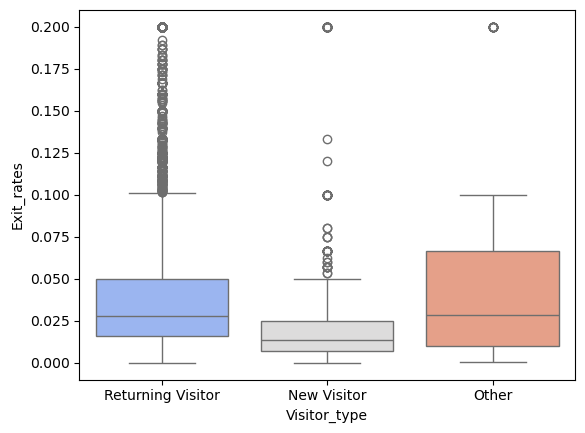

In [ ]:
sns.boxplot(data=df_bivariate, x="Visitor_type", y="Exit_rates", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3507860174.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Visitor_type", y="Page_values", palette="coolwarm")


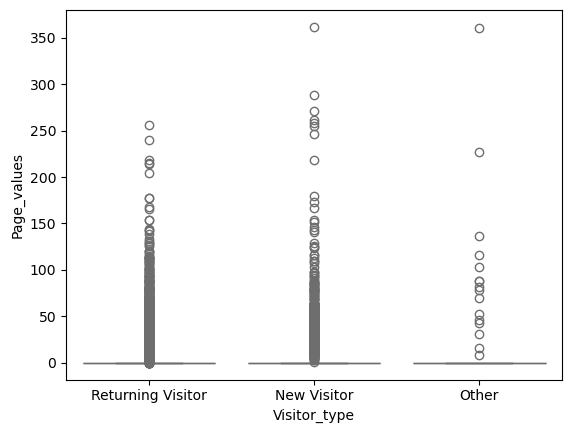

In [ ]:
sns.boxplot(data=df_bivariate, x="Visitor_type", y="Page_values", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\4290420597.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Visitor_type", y="Special_day", palette="coolwarm")


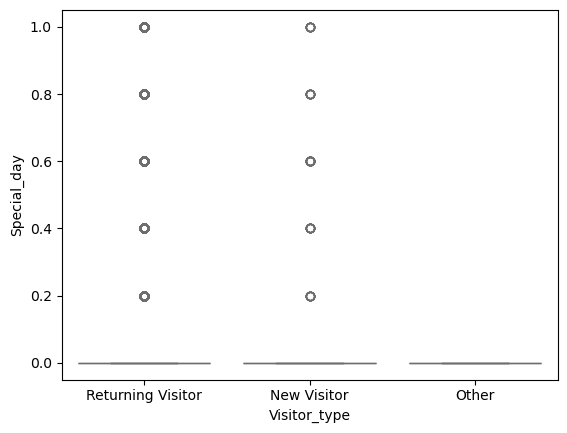

In [ ]:
sns.boxplot(data=df_bivariate, x="Visitor_type", y="Special_day", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\294975024.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Weekend", y="Administrative", palette="coolwarm")


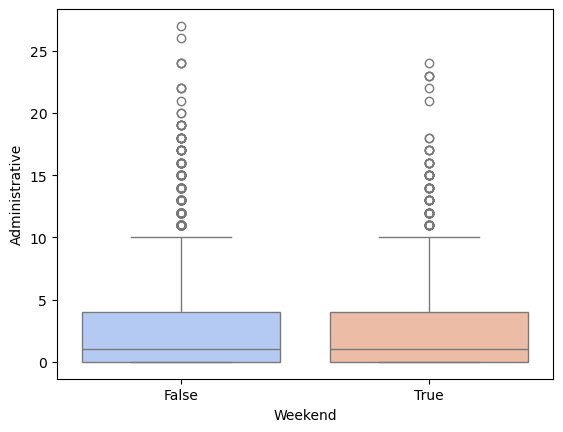

In [ ]:
sns.boxplot(data=df_bivariate, x="Weekend", y="Administrative", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\140244267.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Weekend", y="Administrative_duration", palette="coolwarm")


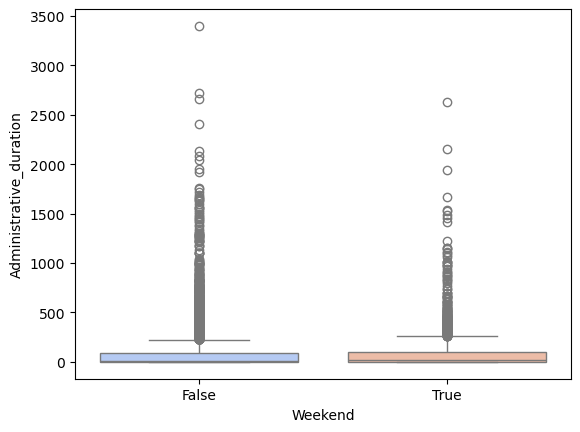

In [ ]:
sns.boxplot(data=df_bivariate, x="Weekend", y="Administrative_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2147751244.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Weekend", y="Informational", palette="coolwarm")


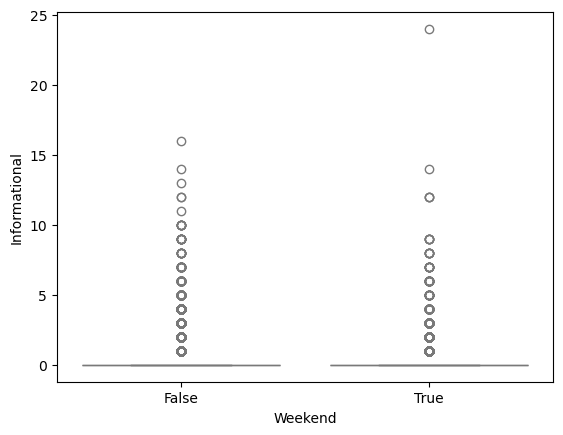

In [ ]:
sns.boxplot(data=df_bivariate, x="Weekend", y="Informational", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2869168188.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Weekend", y="Informational_duration", palette="coolwarm")


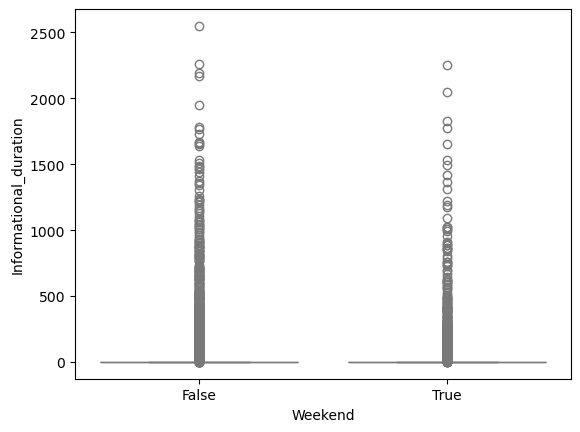

In [ ]:
sns.boxplot(data=df_bivariate, x="Weekend", y="Informational_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2643482621.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Weekend", y="Product_related", palette="coolwarm")


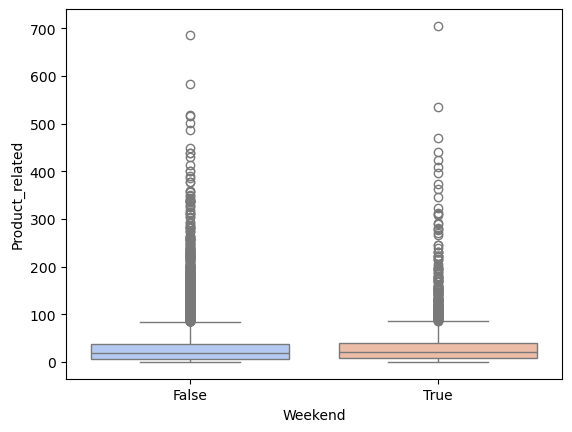

In [ ]:
sns.boxplot(data=df_bivariate, x="Weekend", y="Product_related", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\389543048.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Weekend", y="Bounce_rates", palette="coolwarm")


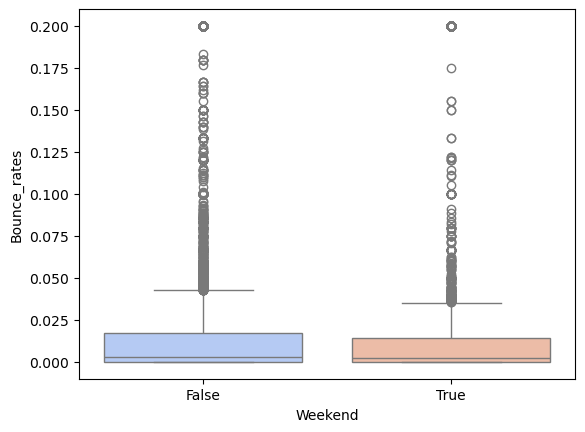

In [ ]:
sns.boxplot(data=df_bivariate, x="Weekend", y="Bounce_rates", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2272603911.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Weekend", y="Exit_rates", palette="coolwarm")


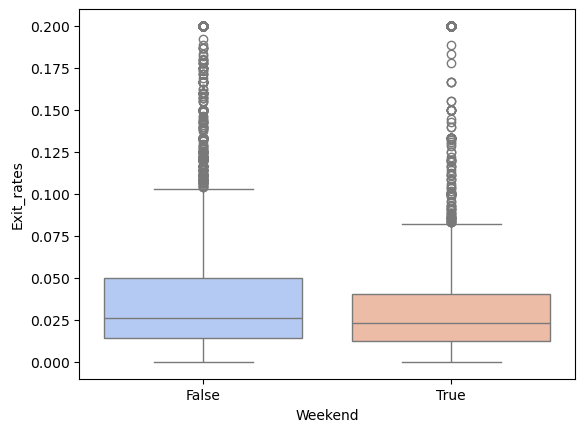

In [ ]:
sns.boxplot(data=df_bivariate, x="Weekend", y="Exit_rates", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1976287770.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Weekend", y="Page_values", palette="coolwarm")


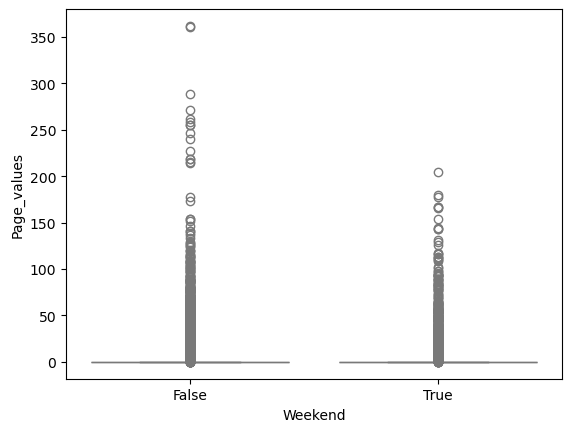

In [ ]:
sns.boxplot(data=df_bivariate, x="Weekend", y="Page_values", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1574644533.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Weekend", y="Special_day", palette="coolwarm")


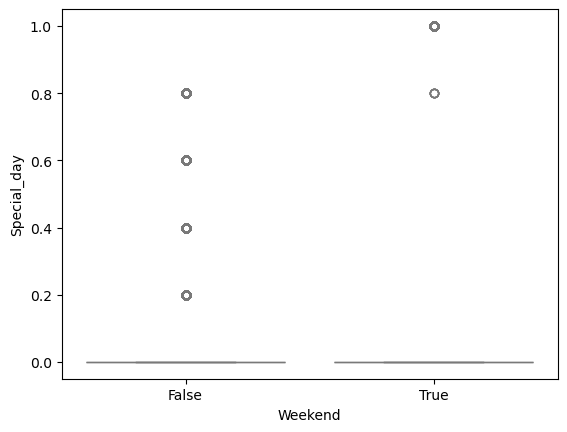

In [ ]:
sns.boxplot(data=df_bivariate, x="Weekend", y="Special_day", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\126118177.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Revenue", y="Administrative", palette="coolwarm")


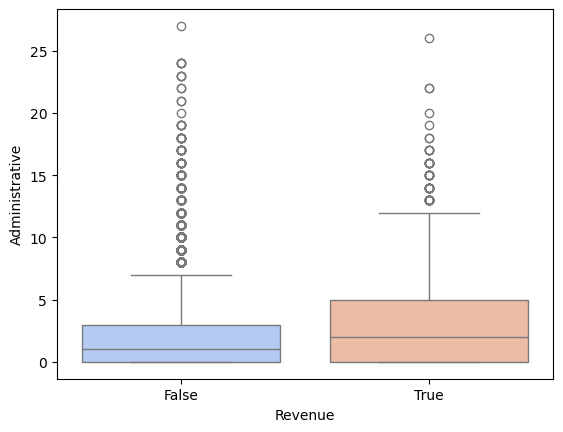

In [ ]:
sns.boxplot(data=df_bivariate, x="Revenue", y="Administrative", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\627493951.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Revenue", y="Administrative_duration", palette="coolwarm")


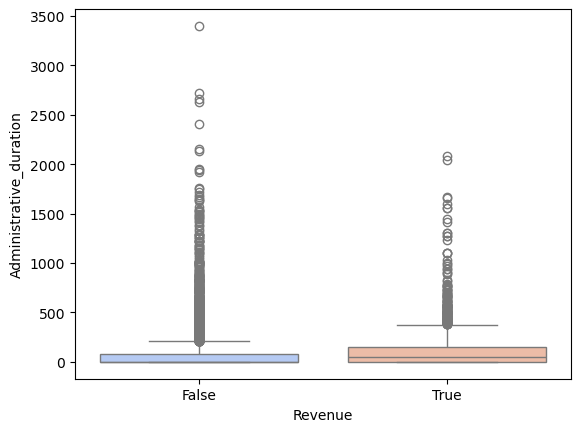

In [ ]:
sns.boxplot(data=df_bivariate, x="Revenue", y="Administrative_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2460437124.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Revenue", y="Informational", palette="coolwarm")


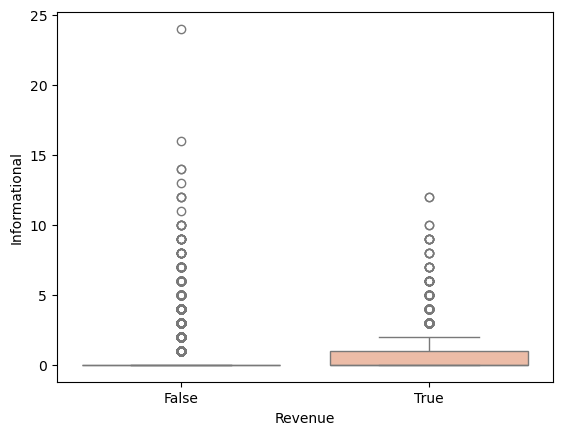

In [ ]:
sns.boxplot(data=df_bivariate, x="Revenue", y="Informational", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2711218003.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Revenue", y="Informational_duration", palette="coolwarm")


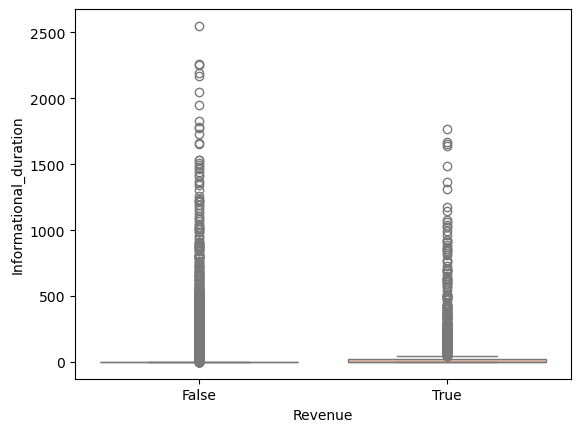

In [ ]:
sns.boxplot(data=df_bivariate, x="Revenue", y="Informational_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2507967524.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Revenue", y="Product_related", palette="coolwarm")


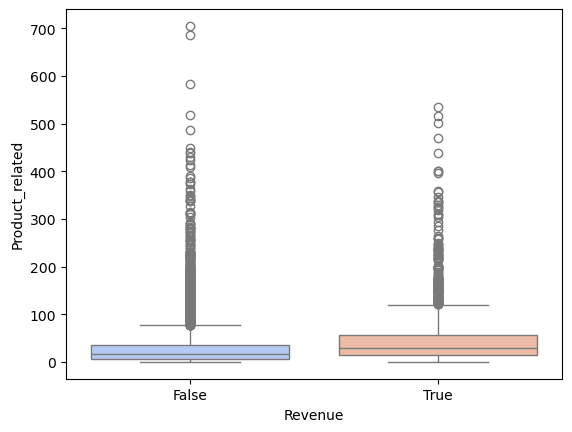

In [ ]:
sns.boxplot(data=df_bivariate, x="Revenue", y="Product_related", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2843004357.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Revenue", y="Product_related_duration", palette="coolwarm")


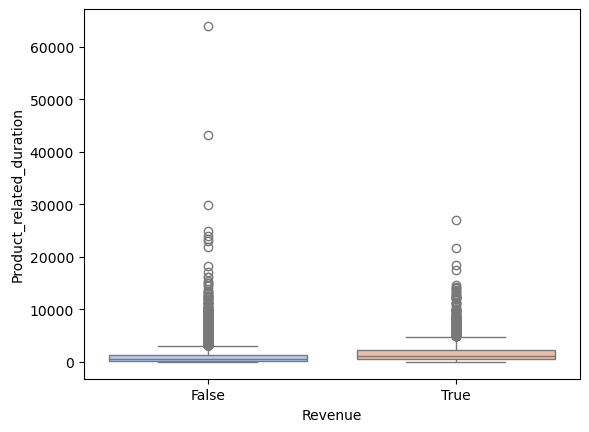

In [ ]:
sns.boxplot(data=df_bivariate, x="Revenue", y="Product_related_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3922324349.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Revenue", y="Bounce_rates", palette="coolwarm")


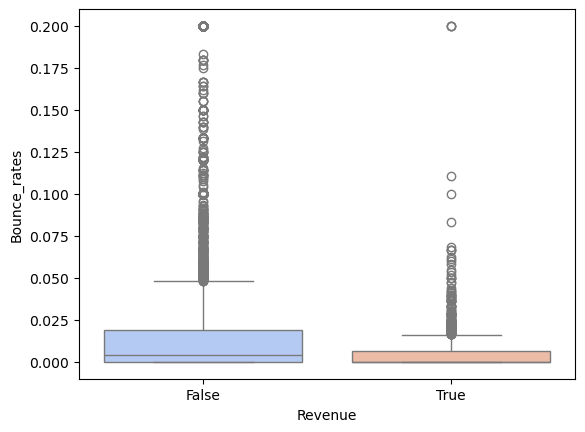

In [ ]:
sns.boxplot(data=df_bivariate, x="Revenue", y="Bounce_rates", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2078186531.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Revenue", y="Exit_rates", palette="coolwarm")


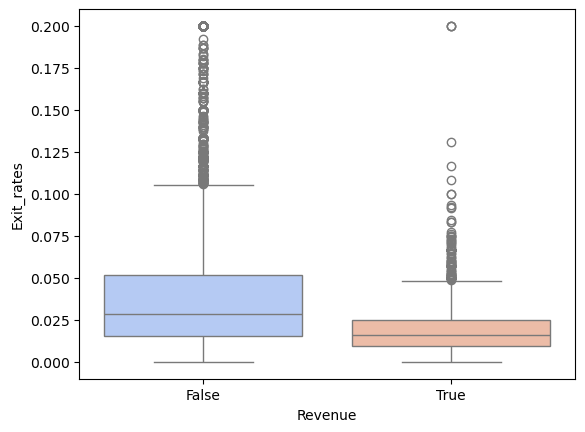

In [ ]:
sns.boxplot(data=df_bivariate, x="Revenue", y="Exit_rates", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1467941535.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Revenue", y="Page_values", palette="coolwarm")


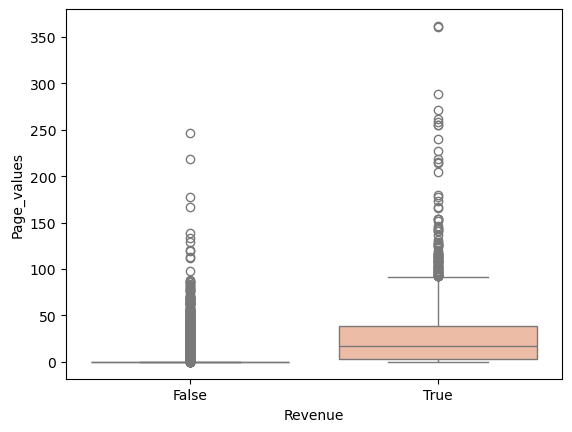

In [ ]:
sns.boxplot(data=df_bivariate, x="Revenue", y="Page_values", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3717900457.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Revenue", y="Special_day", palette="coolwarm")


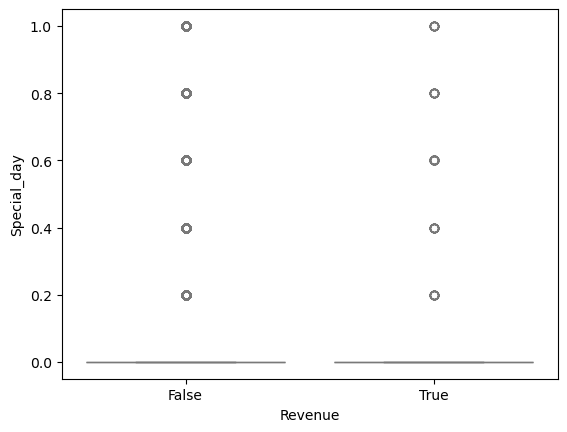

In [ ]:
sns.boxplot(data=df_bivariate, x="Revenue", y="Special_day", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2437591782.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Browser_label", y="Administrative", palette="coolwarm")


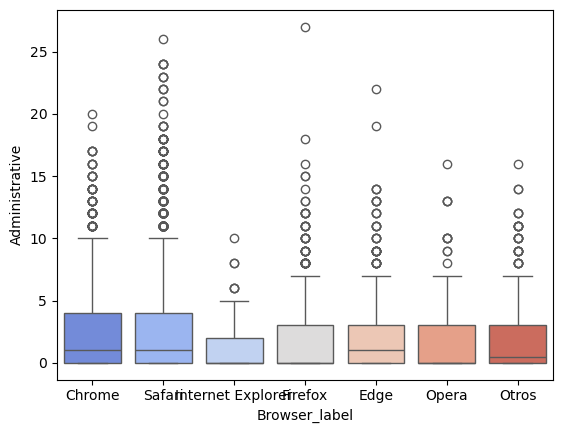

In [ ]:
sns.boxplot(data=df_bivariate, x="Browser_label", y="Administrative", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\293128145.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Browser_label", y="Administrative_duration", palette="coolwarm")


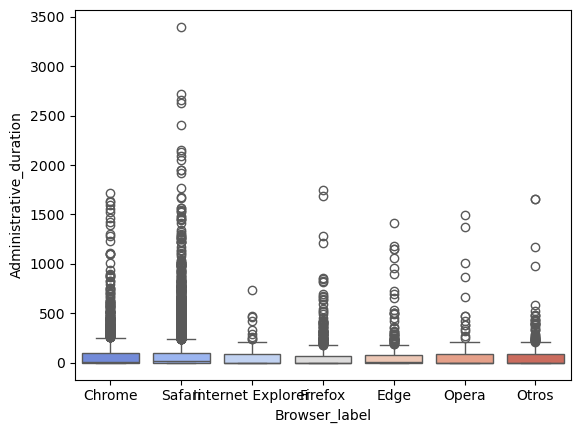

In [ ]:
sns.boxplot(data=df_bivariate, x="Browser_label", y="Administrative_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1715744450.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Browser_label", y="Informational", palette="coolwarm")


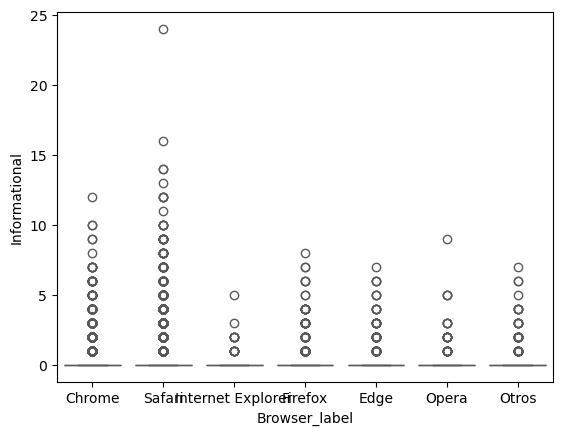

In [ ]:
sns.boxplot(data=df_bivariate, x="Browser_label", y="Informational", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\652227785.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Browser_label", y="Informational_duration", palette="coolwarm")


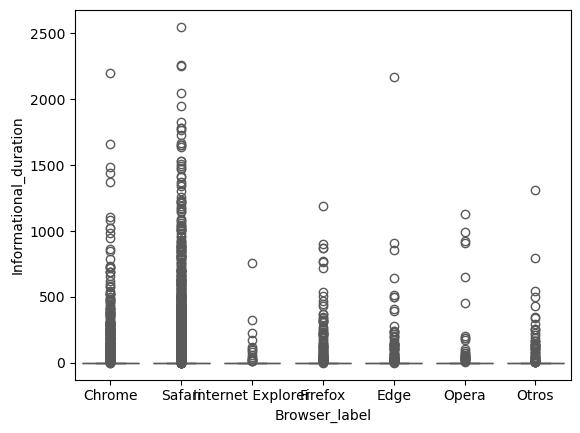

In [ ]:
sns.boxplot(data=df_bivariate, x="Browser_label", y="Informational_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2553895847.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Browser_label", y="Product_related", palette="coolwarm")


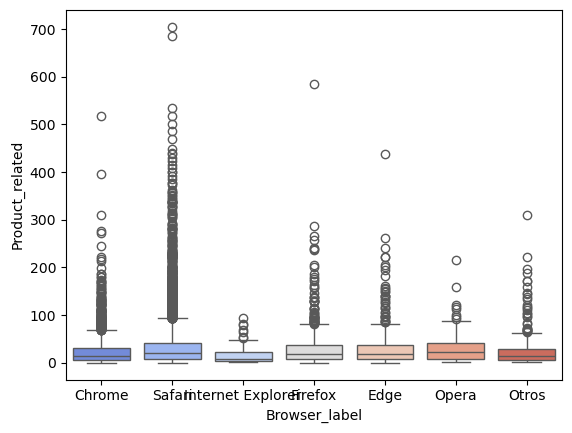

In [ ]:
sns.boxplot(data=df_bivariate, x="Browser_label", y="Product_related", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2533218967.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Browser_label", y="Product_related_duration", palette="coolwarm")


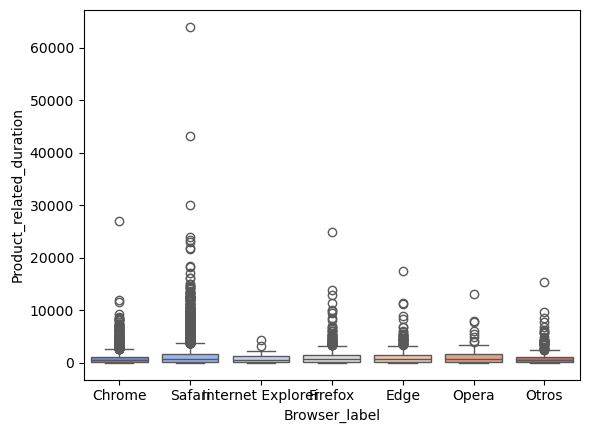

In [ ]:
sns.boxplot(data=df_bivariate, x="Browser_label", y="Product_related_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\111516859.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Browser_label", y="Bounce_rates", palette="coolwarm")


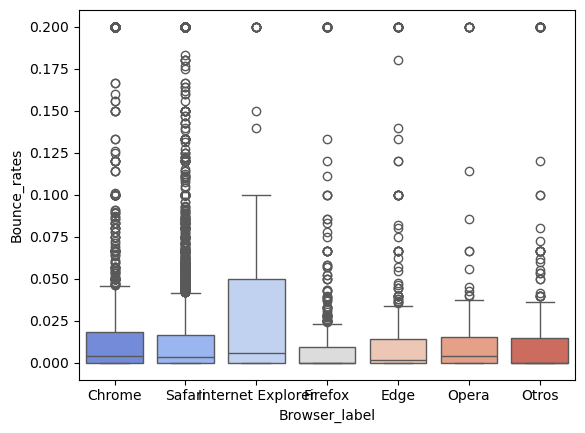

In [ ]:
sns.boxplot(data=df_bivariate, x="Browser_label", y="Bounce_rates", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\4241993177.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Browser_label", y="Exit_rates", palette="coolwarm")


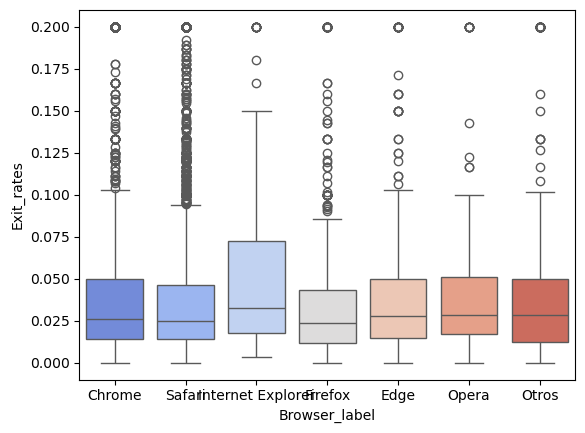

In [ ]:
sns.boxplot(data=df_bivariate, x="Browser_label", y="Exit_rates", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\203139582.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Browser_label", y="Page_values", palette="coolwarm")


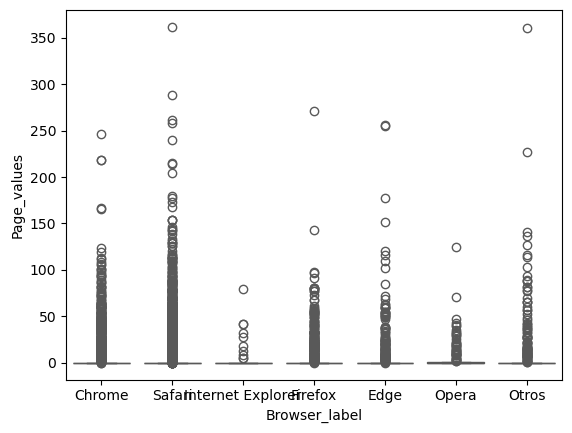

In [ ]:
sns.boxplot(data=df_bivariate, x="Browser_label", y="Page_values", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2358423497.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Browser_label", y="Special_day", palette="coolwarm")


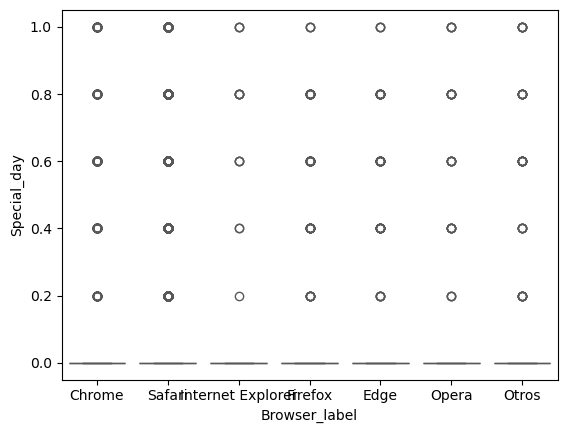

In [ ]:
sns.boxplot(data=df_bivariate, x="Browser_label", y="Special_day", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3822490077.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Os_label", y="Administrative", palette="coolwarm")


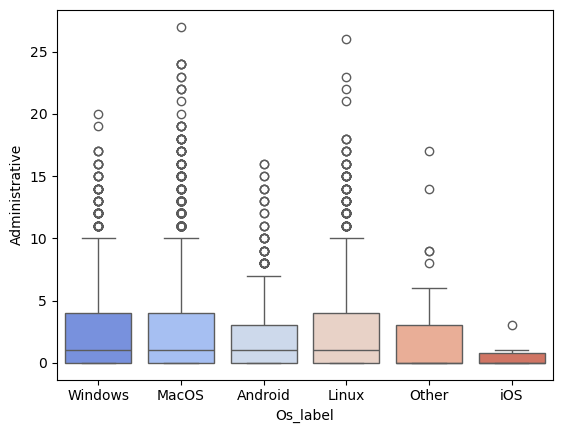

In [ ]:
sns.boxplot(data=df_bivariate, x="Os_label", y="Administrative", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2778446204.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Os_label", y="Administrative_duration", palette="coolwarm")


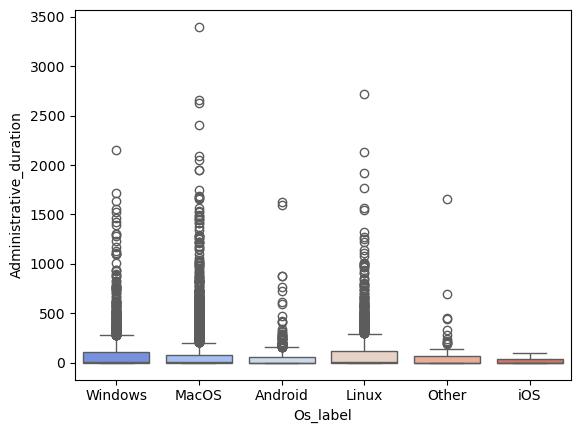

In [ ]:
sns.boxplot(data=df_bivariate, x="Os_label", y="Administrative_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3868992596.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Os_label", y="Informational", palette="coolwarm")


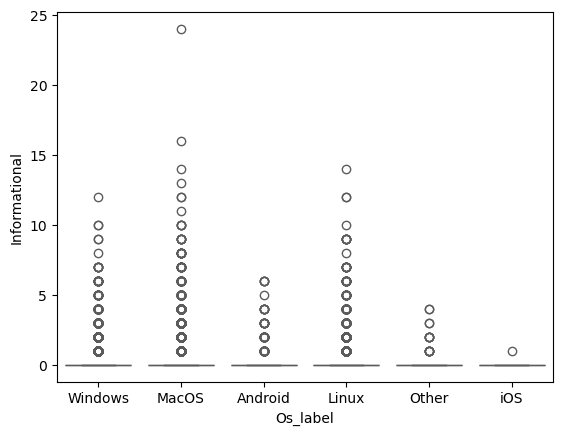

In [ ]:
sns.boxplot(data=df_bivariate, x="Os_label", y="Informational", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1865669443.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Os_label", y="Informational_duration", palette="coolwarm")


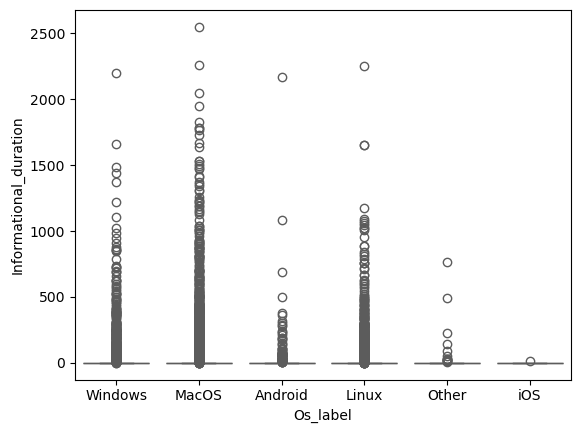

In [ ]:
sns.boxplot(data=df_bivariate, x="Os_label", y="Informational_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\125663630.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Os_label", y="Product_related", palette="coolwarm")


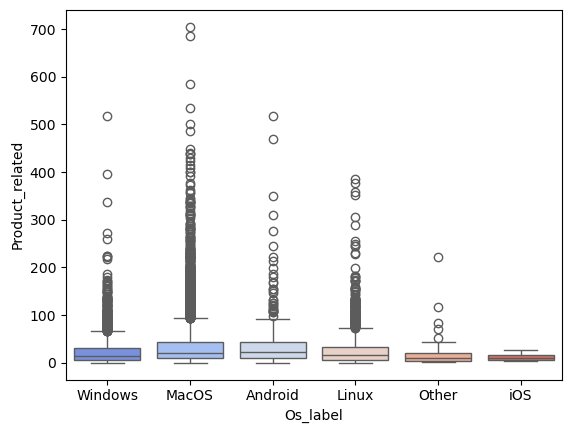

In [ ]:
sns.boxplot(data=df_bivariate, x="Os_label", y="Product_related", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3814026900.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Os_label", y="Product_related_duration", palette="coolwarm")


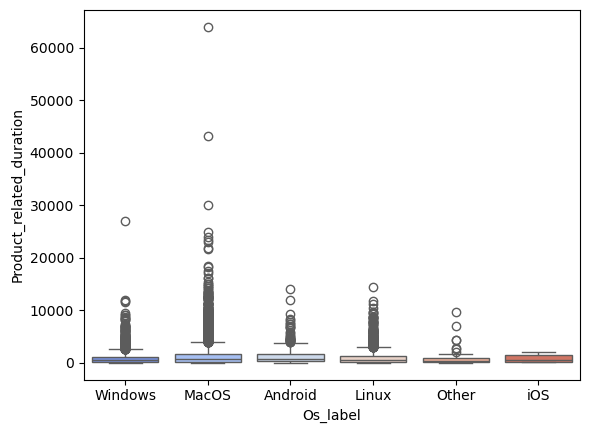

In [ ]:
sns.boxplot(data=df_bivariate, x="Os_label", y="Product_related_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\4143473045.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Os_label", y="Bounce_rates", palette="coolwarm")


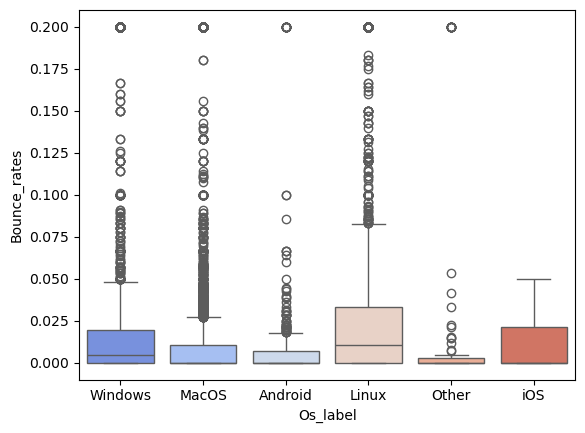

In [ ]:
sns.boxplot(data=df_bivariate, x="Os_label", y="Bounce_rates", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2044559671.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Os_label", y="Exit_rates", palette="coolwarm")


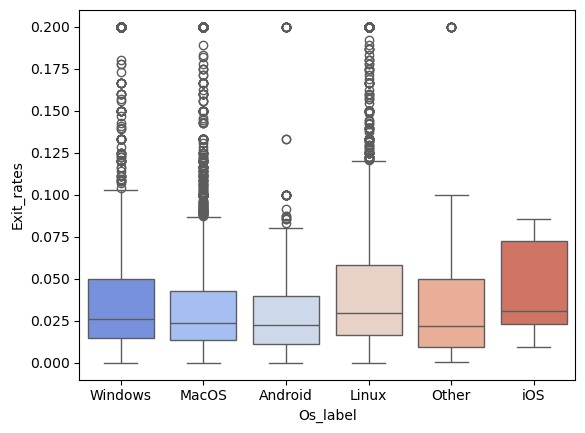

In [ ]:
sns.boxplot(data=df_bivariate, x="Os_label", y="Exit_rates", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\502685629.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Os_label", y="Page_values", palette="coolwarm")


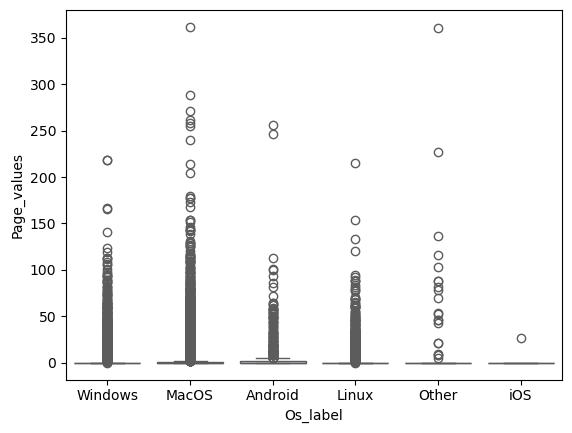

In [ ]:
sns.boxplot(data=df_bivariate, x="Os_label", y="Page_values", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2100011050.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Os_label", y="Special_day", palette="coolwarm")


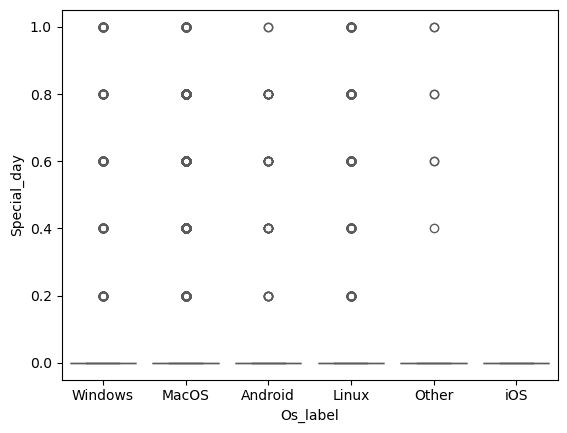

In [ ]:
sns.boxplot(data=df_bivariate, x="Os_label", y="Special_day", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\800974584.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Region_label", y="Administrative", palette="coolwarm")


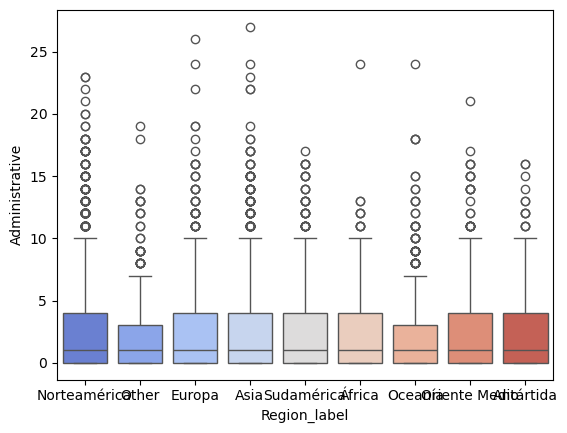

In [ ]:
sns.boxplot(data=df_bivariate, x="Region_label", y="Administrative", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\4155266238.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Region_label", y="Administrative_duration", palette="coolwarm")


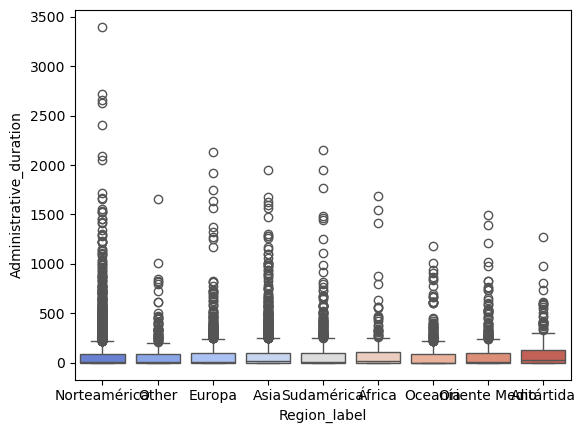

In [ ]:
sns.boxplot(data=df_bivariate, x="Region_label", y="Administrative_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1918479900.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Region_label", y="Informational", palette="coolwarm")


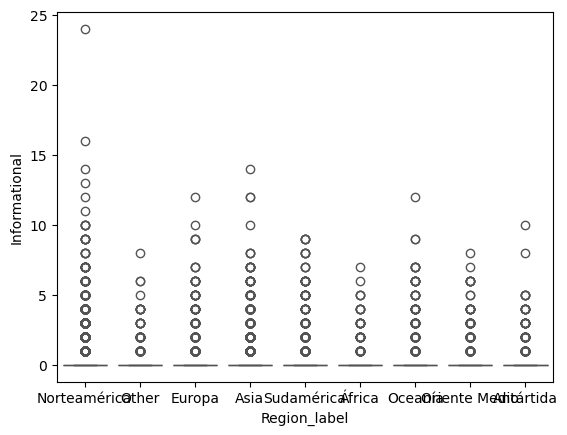

In [ ]:
sns.boxplot(data=df_bivariate, x="Region_label", y="Informational", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2808973965.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Region_label", y="Informational_duration", palette="coolwarm")


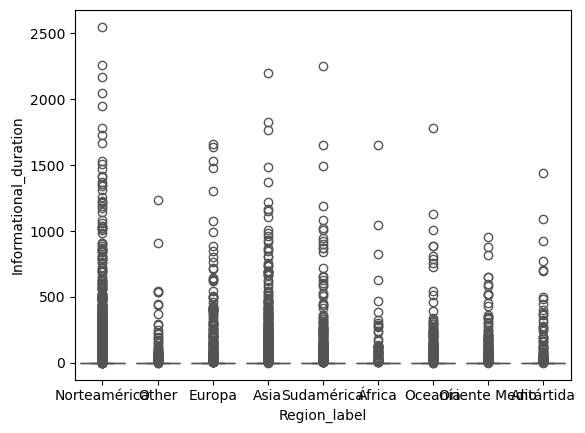

In [ ]:
sns.boxplot(data=df_bivariate, x="Region_label", y="Informational_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\338392831.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Region_label", y="Product_related", palette="coolwarm")


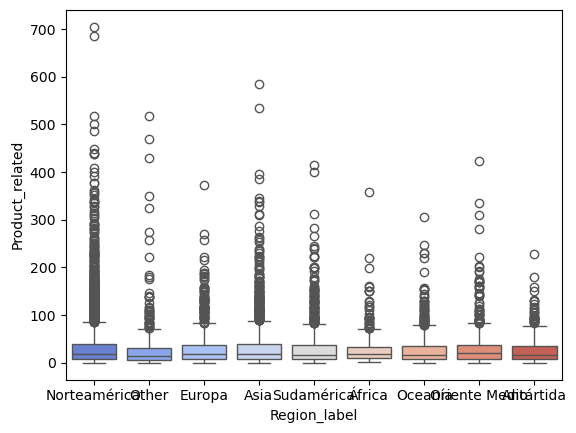

In [ ]:
sns.boxplot(data=df_bivariate, x="Region_label", y="Product_related", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\4162466674.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Region_label", y="Product_related_duration", palette="coolwarm")


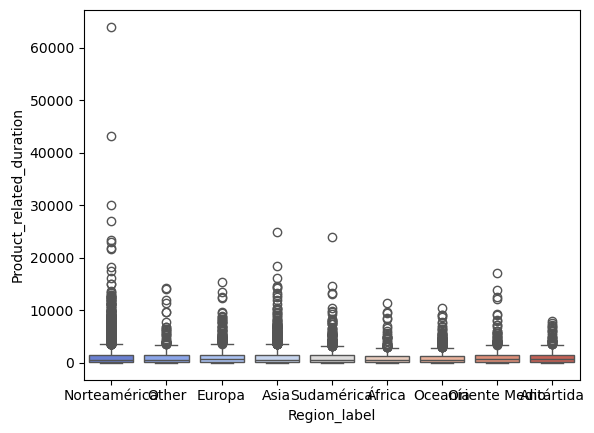

In [ ]:
sns.boxplot(data=df_bivariate, x="Region_label", y="Product_related_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\925210216.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Region_label", y="Bounce_rates", palette="coolwarm")


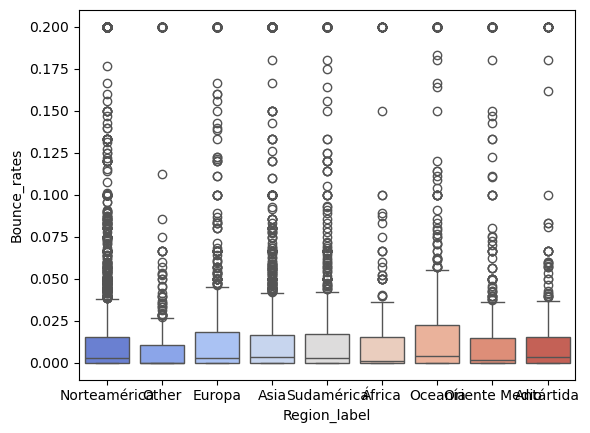

In [ ]:
sns.boxplot(data=df_bivariate, x="Region_label", y="Bounce_rates", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\417326284.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Region_label", y="Exit_rates", palette="coolwarm")


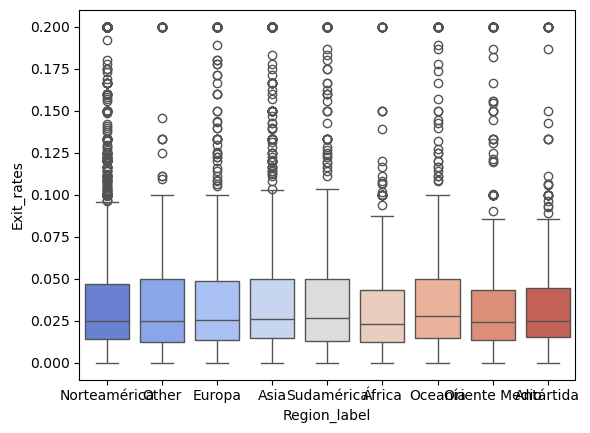

In [ ]:
sns.boxplot(data=df_bivariate, x="Region_label", y="Exit_rates", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1552802242.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Region_label", y="Page_values", palette="coolwarm")


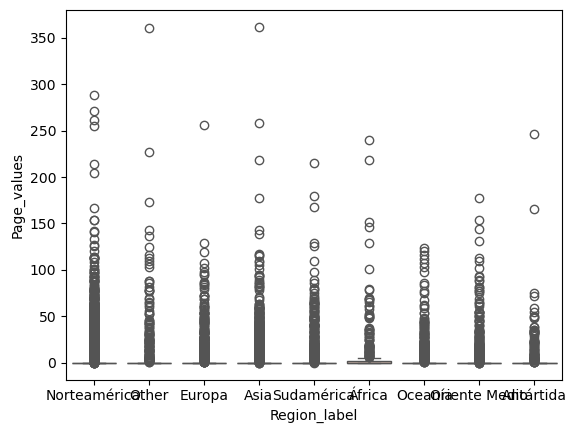

In [ ]:
sns.boxplot(data=df_bivariate, x="Region_label", y="Page_values", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\4226709561.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Region_label", y="Special_day", palette="coolwarm")


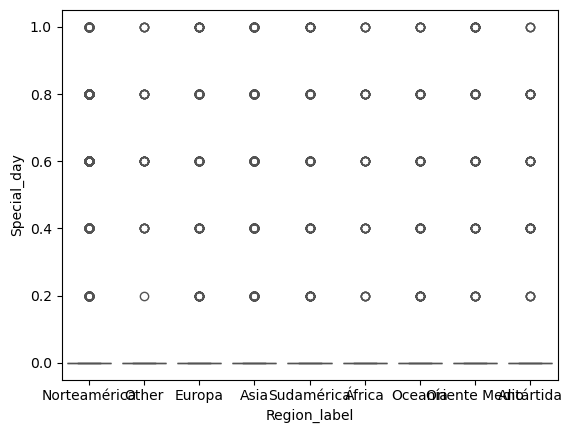

In [ ]:
sns.boxplot(data=df_bivariate, x="Region_label", y="Special_day", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\691619498.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Traffic_type_label", y="Administrative", palette="coolwarm")


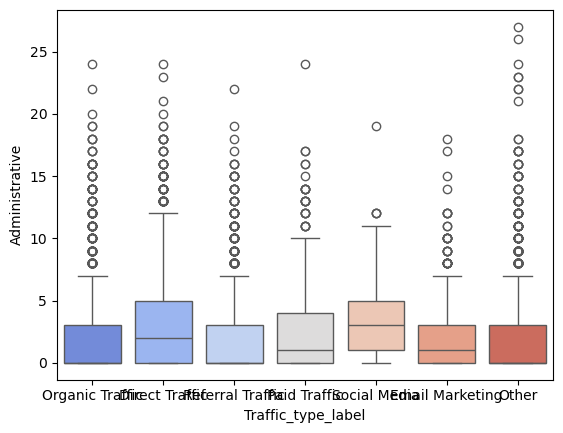

In [ ]:
sns.boxplot(data=df_bivariate, x="Traffic_type_label", y="Administrative", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\329585997.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Traffic_type_label", y="Administrative_duration", palette="coolwarm")


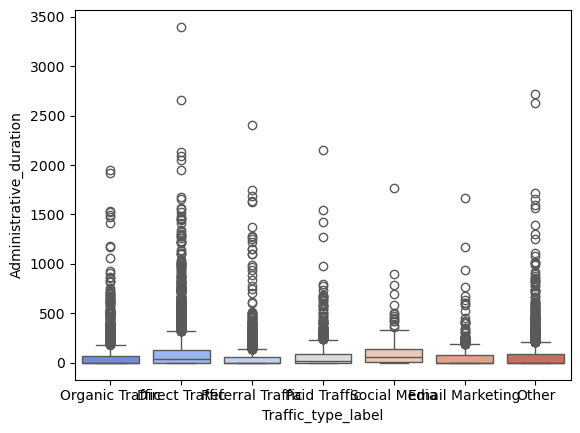

In [ ]:
sns.boxplot(data=df_bivariate, x="Traffic_type_label", y="Administrative_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\786887314.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Traffic_type_label", y="Informational", palette="coolwarm")


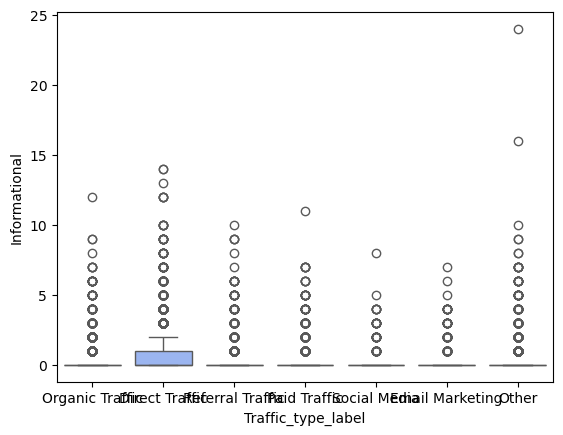

In [ ]:
sns.boxplot(data=df_bivariate, x="Traffic_type_label", y="Informational", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\583932835.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Traffic_type_label", y="Informational_duration", palette="coolwarm")


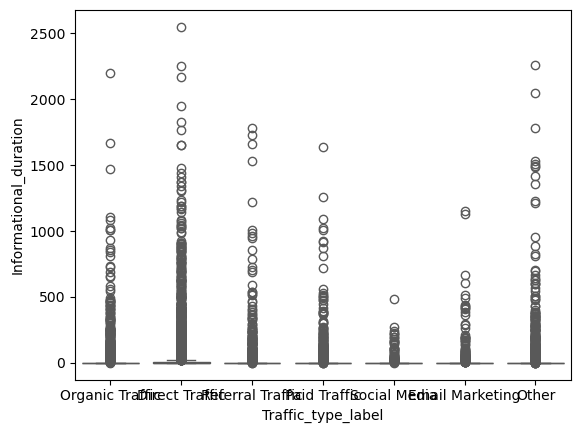

In [ ]:
sns.boxplot(data=df_bivariate, x="Traffic_type_label", y="Informational_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\234467548.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Traffic_type_label", y="Product_related", palette="coolwarm")


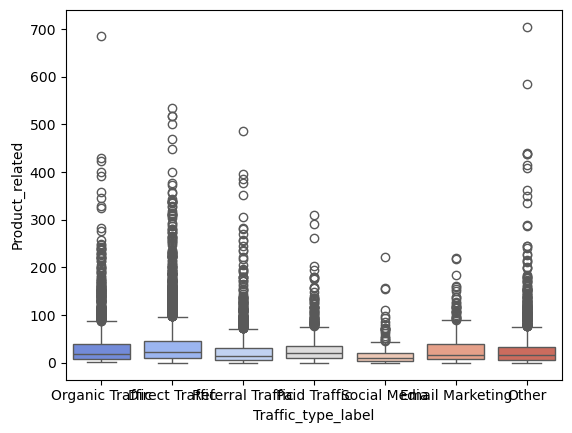

In [ ]:
sns.boxplot(data=df_bivariate, x="Traffic_type_label", y="Product_related", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\4072487583.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Traffic_type_label", y="Product_related_duration", palette="coolwarm")


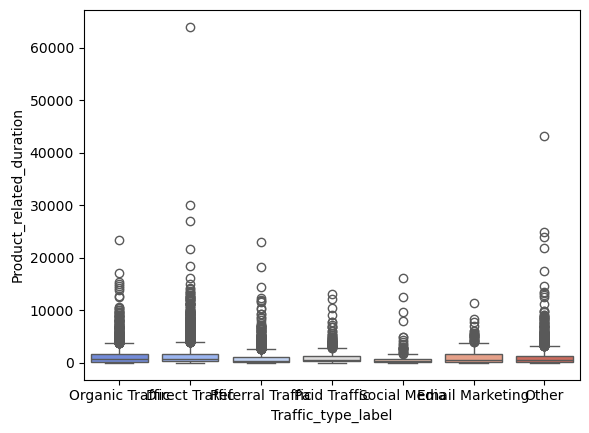

In [ ]:
sns.boxplot(data=df_bivariate, x="Traffic_type_label", y="Product_related_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3783871105.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Traffic_type_label", y="Bounce_rates", palette="coolwarm")


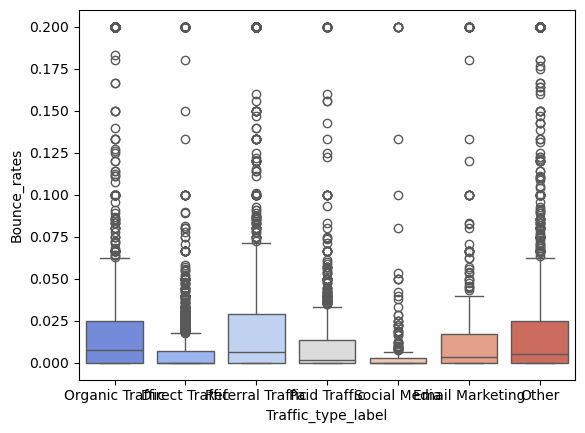

In [ ]:
sns.boxplot(data=df_bivariate, x="Traffic_type_label", y="Bounce_rates", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\950690848.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Traffic_type_label", y="Exit_rates", palette="coolwarm")


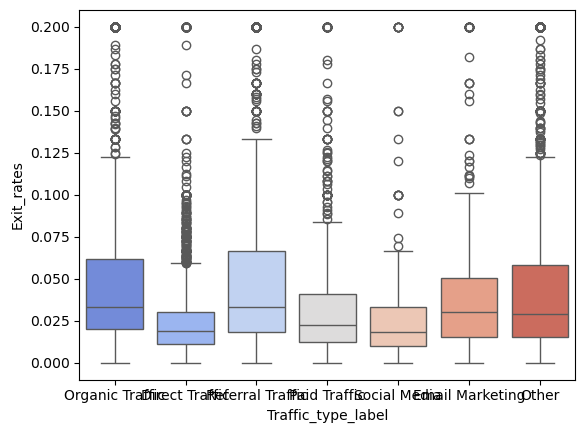

In [ ]:
sns.boxplot(data=df_bivariate, x="Traffic_type_label", y="Exit_rates", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1421493203.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Traffic_type_label", y="Page_values", palette="coolwarm")


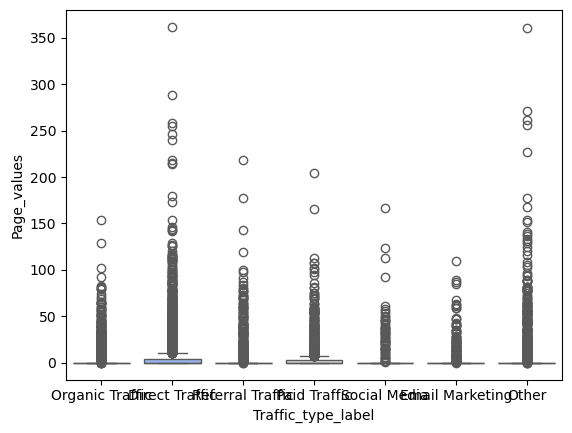

In [ ]:
sns.boxplot(data=df_bivariate, x="Traffic_type_label", y="Page_values", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\74203675.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_bivariate, x="Traffic_type_label", y="Special_day", palette="coolwarm")


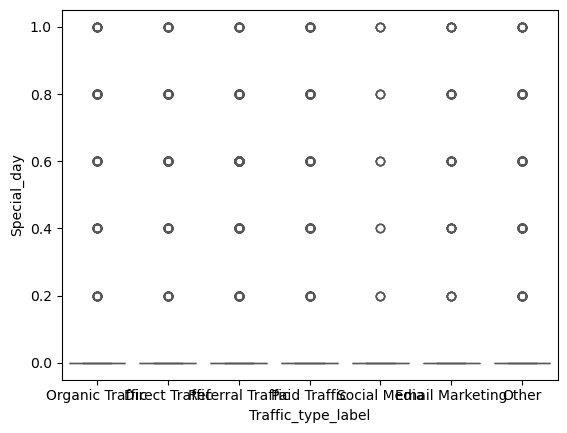

In [ ]:
sns.boxplot(data=df_bivariate, x="Traffic_type_label", y="Special_day", palette="coolwarm")
plt.show()

### Violin Plots

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2102144402.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Month", y="Administrative", palette="coolwarm")


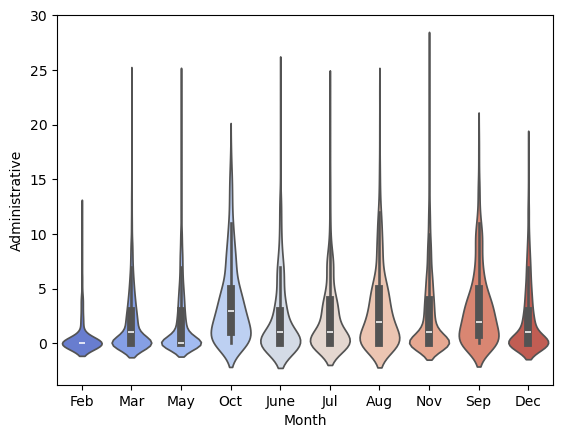

In [ ]:
sns.violinplot(data=df_bivariate, x="Month", y="Administrative", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1145890543.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Month", y="Administrative_duration", palette="coolwarm")


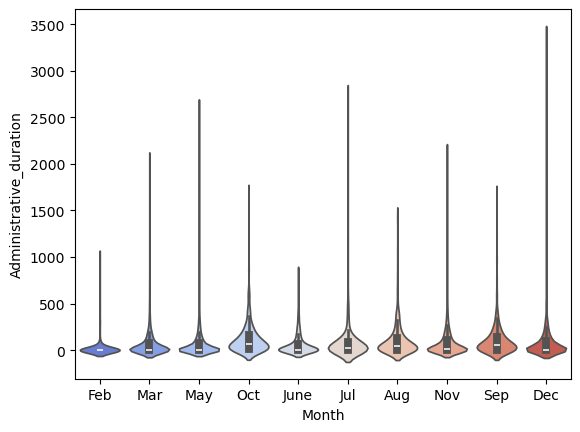

In [ ]:
sns.violinplot(data=df_bivariate, x="Month", y="Administrative_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\452251374.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Month", y="Product_related", palette="coolwarm")


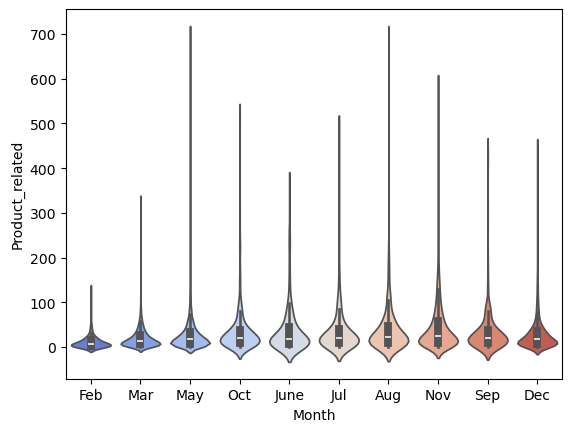

In [ ]:
sns.violinplot(data=df_bivariate, x="Month", y="Product_related", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2842091735.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Month", y="Product_related_duration", palette="coolwarm")


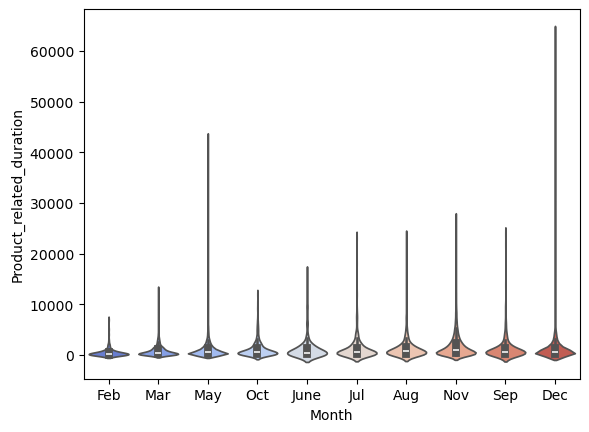

In [ ]:
sns.violinplot(data=df_bivariate, x="Month", y="Product_related_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1616046871.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Month", y="Bounce_rates", palette="coolwarm")


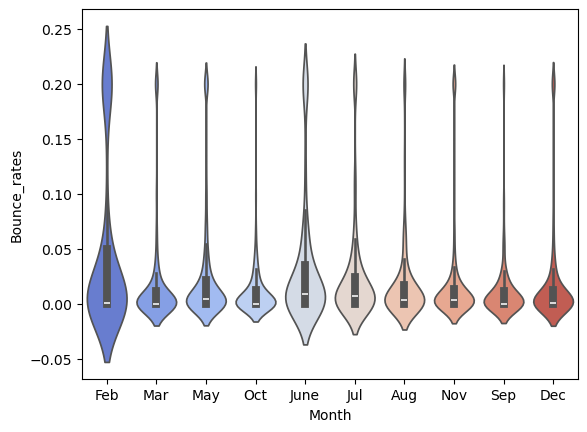

In [ ]:
sns.violinplot(data=df_bivariate, x="Month", y="Bounce_rates", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1745448651.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Month", y="Exit_rates", palette="coolwarm")


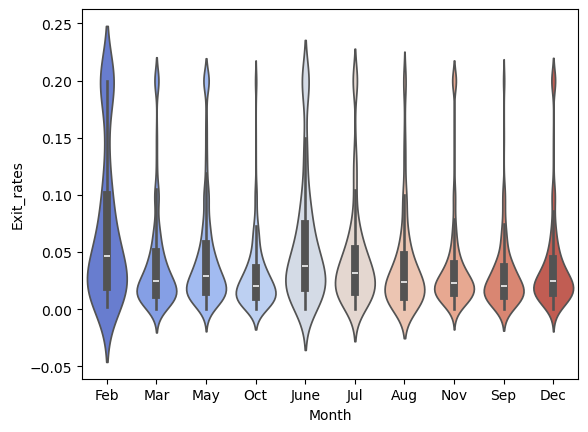

In [ ]:
sns.violinplot(data=df_bivariate, x="Month", y="Exit_rates", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1902901881.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Month", y="Page_values", palette="coolwarm")


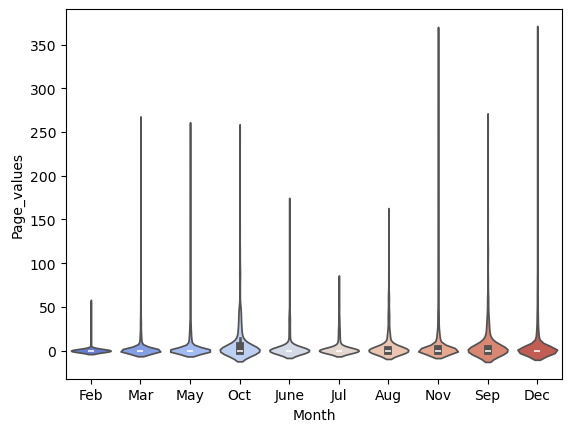

In [ ]:
sns.violinplot(data=df_bivariate, x="Month", y="Page_values", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\48571192.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Month", y="Special_day", palette="coolwarm")


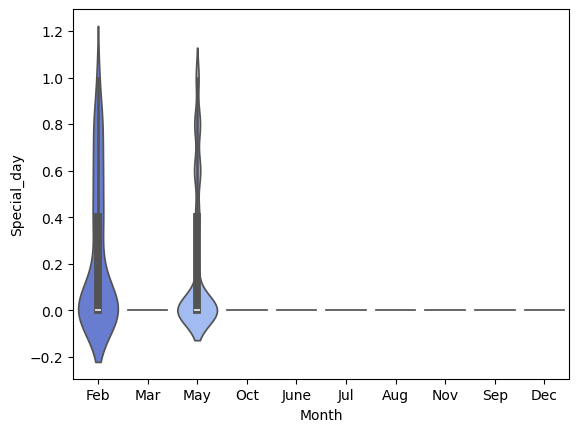

In [ ]:
sns.violinplot(data=df_bivariate, x="Month", y="Special_day", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3874756793.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Visitor_type", y="Administrative", palette="coolwarm")


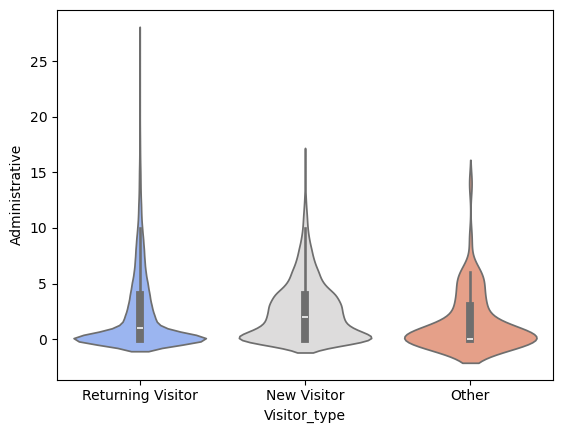

In [ ]:
sns.violinplot(data=df_bivariate, x="Visitor_type", y="Administrative", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3683783680.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Visitor_type", y="Administrative_duration", palette="coolwarm")


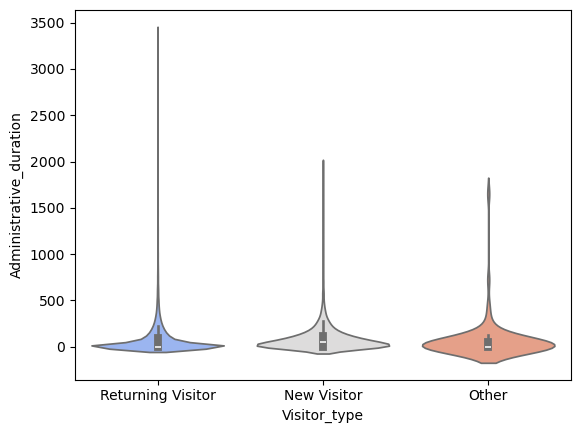

In [ ]:
sns.violinplot(data=df_bivariate, x="Visitor_type", y="Administrative_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2998636764.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Visitor_type", y="Product_related", palette="coolwarm")


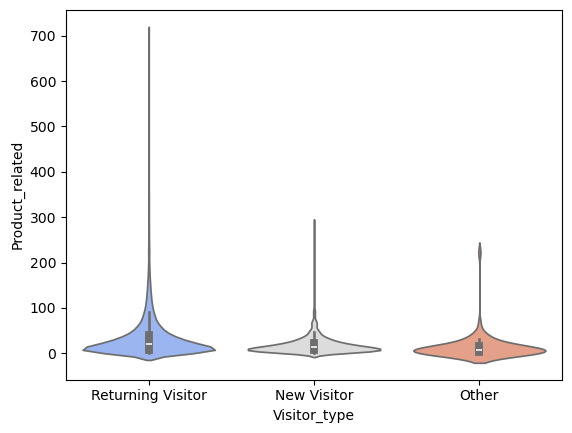

In [ ]:
sns.violinplot(data=df_bivariate, x="Visitor_type", y="Product_related", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3956750211.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Visitor_type", y="Product_related_duration", palette="coolwarm")


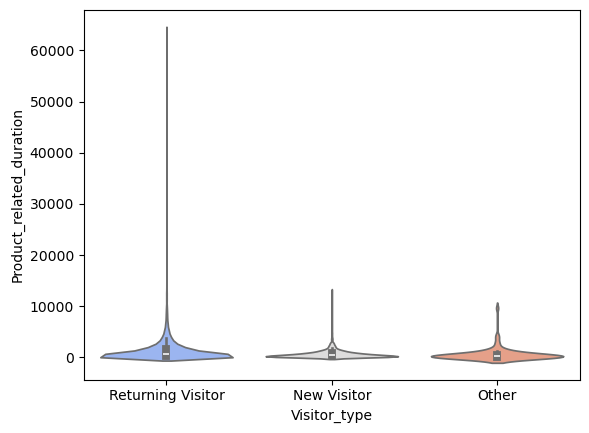

In [ ]:
sns.violinplot(data=df_bivariate, x="Visitor_type", y="Product_related_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1191490801.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Visitor_type", y="Bounce_rates", palette="coolwarm")


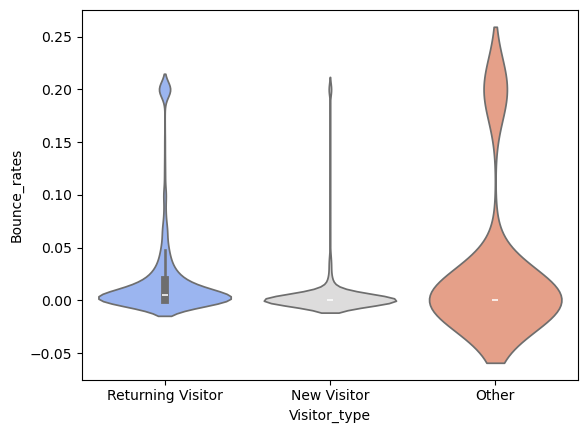

In [ ]:
sns.violinplot(data=df_bivariate, x="Visitor_type", y="Bounce_rates", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\708487534.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Visitor_type", y="Exit_rates", palette="coolwarm")


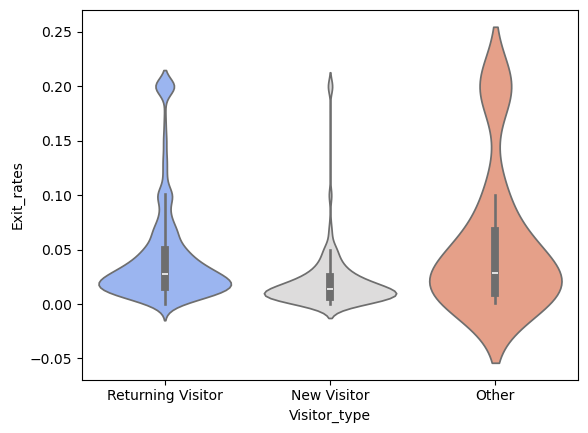

In [ ]:
sns.violinplot(data=df_bivariate, x="Visitor_type", y="Exit_rates", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3596311300.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Visitor_type", y="Page_values", palette="coolwarm")


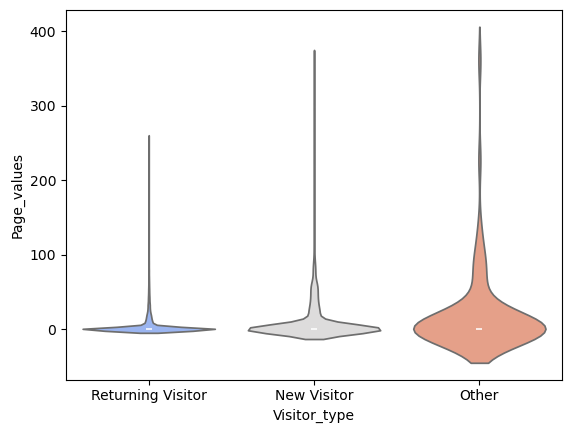

In [ ]:
sns.violinplot(data=df_bivariate, x="Visitor_type", y="Page_values", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\975269324.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Visitor_type", y="Special_day", palette="coolwarm")


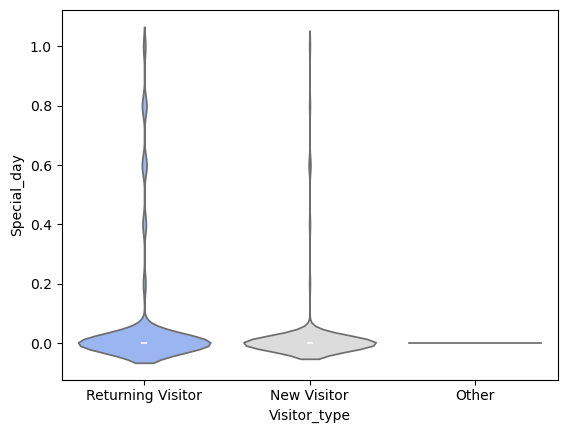

In [ ]:
sns.violinplot(data=df_bivariate, x="Visitor_type", y="Special_day", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\157023671.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Weekend", y="Administrative", palette="coolwarm")


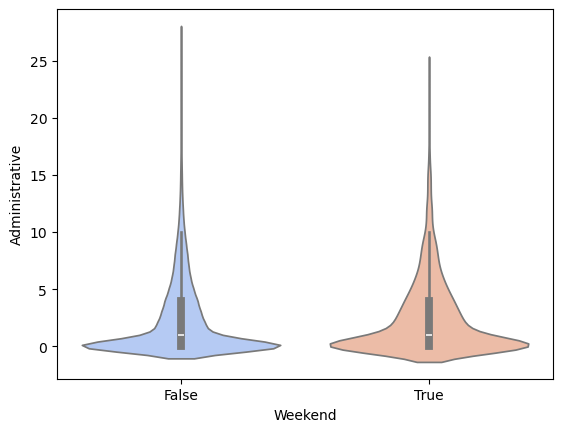

In [ ]:
sns.violinplot(data=df_bivariate, x="Weekend", y="Administrative", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1286338069.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Weekend", y="Administrative_duration", palette="coolwarm")


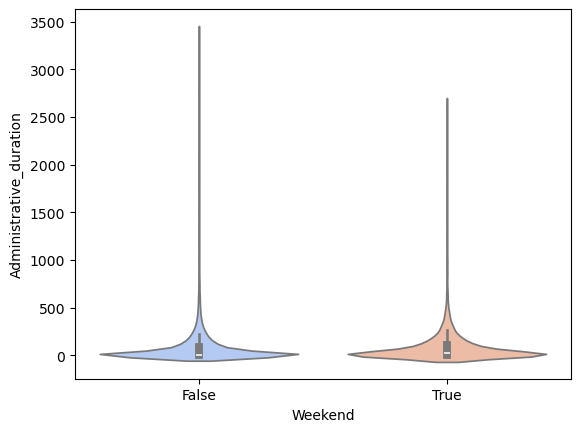

In [ ]:
sns.violinplot(data=df_bivariate, x="Weekend", y="Administrative_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\337236978.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Weekend", y="Product_related", palette="coolwarm")


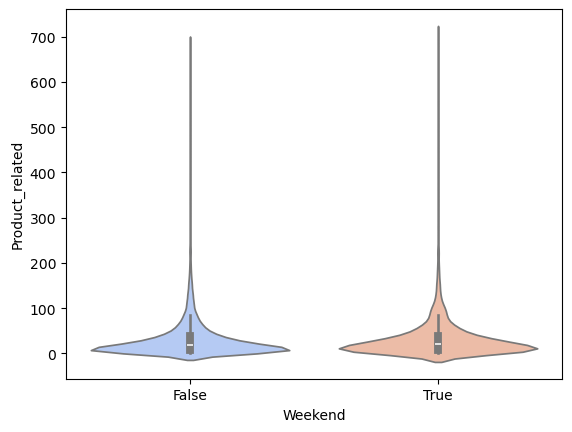

In [ ]:
sns.violinplot(data=df_bivariate, x="Weekend", y="Product_related", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1282533541.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Weekend", y="Product_related_duration", palette="coolwarm")


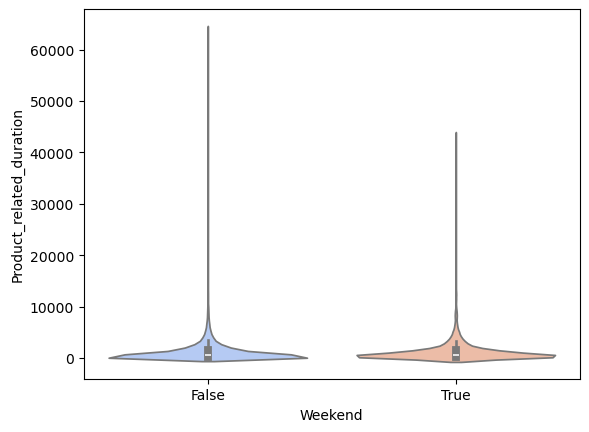

In [ ]:
sns.violinplot(data=df_bivariate, x="Weekend", y="Product_related_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3925896518.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Weekend", y="Bounce_rates", palette="coolwarm")


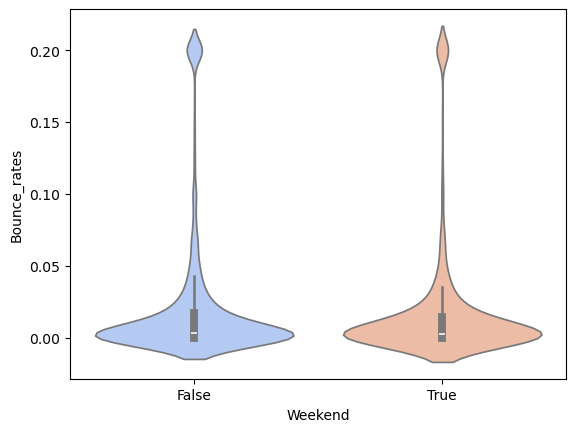

In [ ]:
sns.violinplot(data=df_bivariate, x="Weekend", y="Bounce_rates", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\266288712.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Weekend", y="Exit_rates", palette="coolwarm")


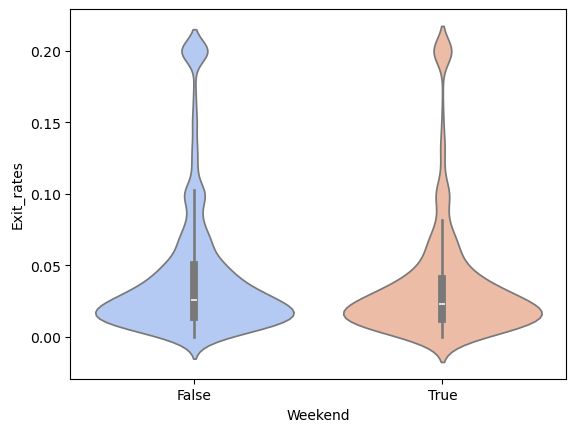

In [ ]:
sns.violinplot(data=df_bivariate, x="Weekend", y="Exit_rates", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2289163166.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Weekend", y="Page_values", palette="coolwarm")


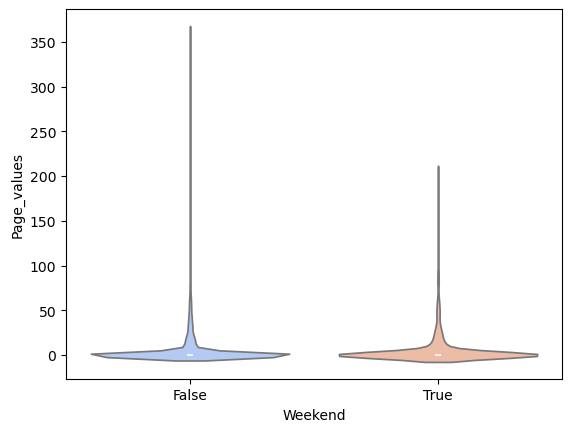

In [ ]:
sns.violinplot(data=df_bivariate, x="Weekend", y="Page_values", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1878857260.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Weekend", y="Special_day", palette="coolwarm")


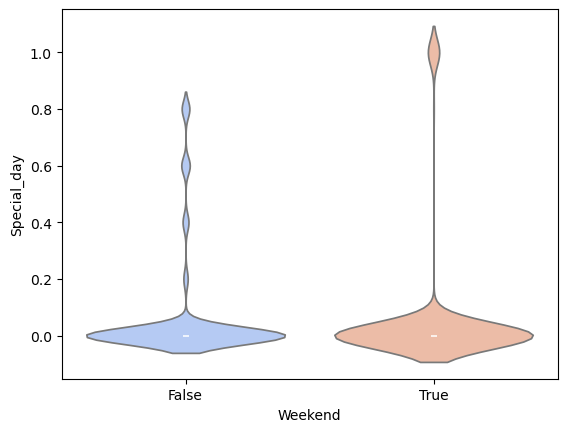

In [ ]:
sns.violinplot(data=df_bivariate, x="Weekend", y="Special_day", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3549250197.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Revenue", y="Administrative", palette="coolwarm")


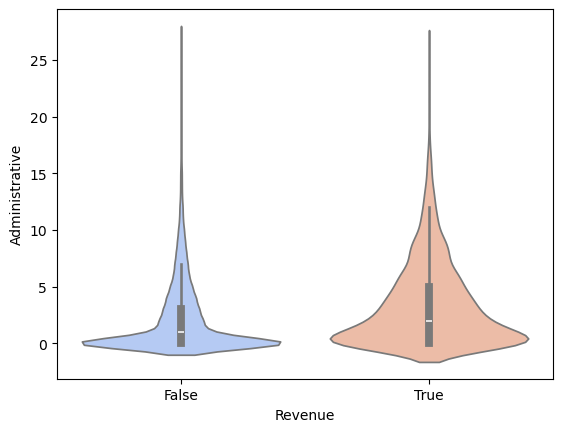

In [ ]:
sns.violinplot(data=df_bivariate, x="Revenue", y="Administrative", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2326423945.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Revenue", y="Administrative_duration", palette="coolwarm")


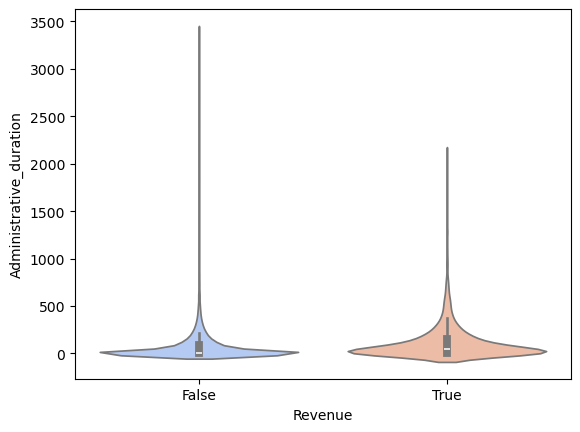

In [ ]:
sns.violinplot(data=df_bivariate, x="Revenue", y="Administrative_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3724535289.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Revenue", y="Product_related", palette="coolwarm")


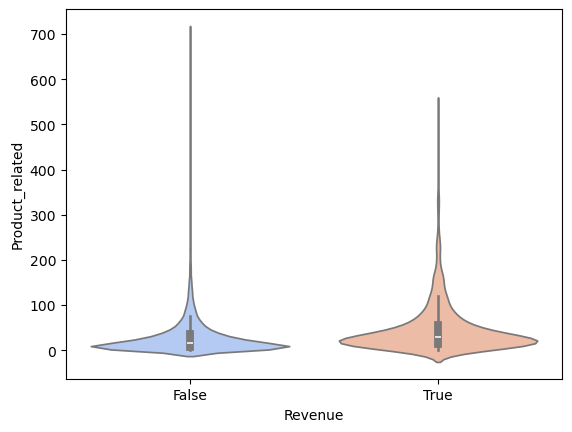

In [ ]:
sns.violinplot(data=df_bivariate, x="Revenue", y="Product_related", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\840851291.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Revenue", y="Product_related_duration", palette="coolwarm")


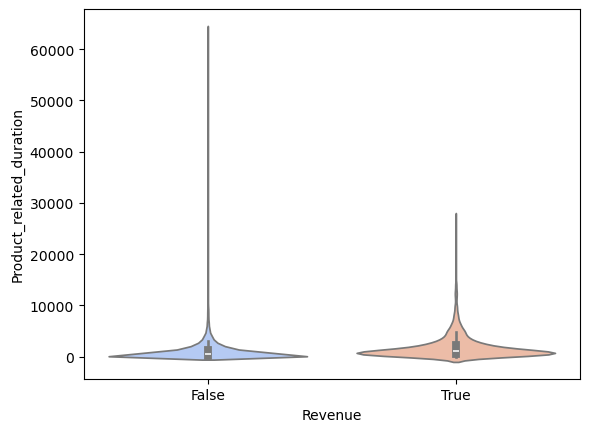

In [ ]:
sns.violinplot(data=df_bivariate, x="Revenue", y="Product_related_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2111419103.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Revenue", y="Bounce_rates", palette="coolwarm")


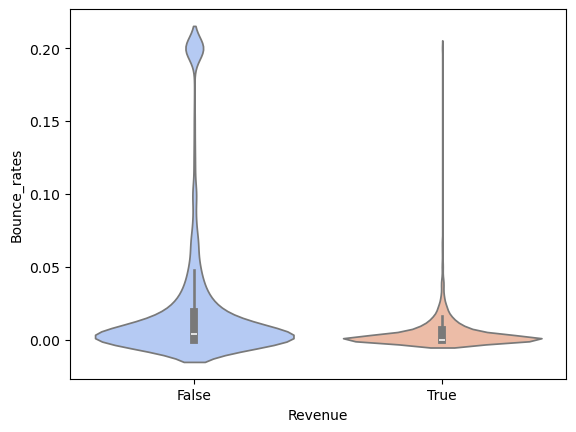

In [ ]:
sns.violinplot(data=df_bivariate, x="Revenue", y="Bounce_rates", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\4028792302.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Revenue", y="Exit_rates", palette="coolwarm")


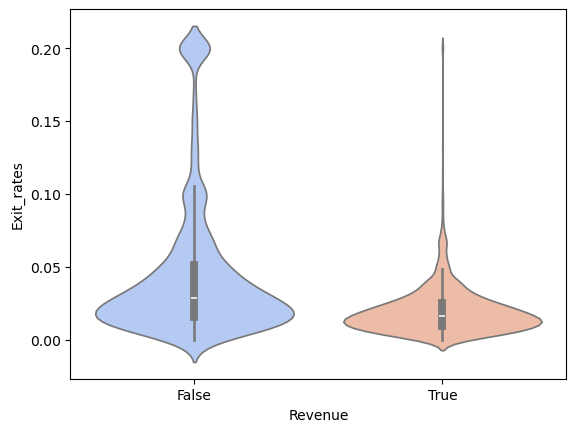

In [ ]:
sns.violinplot(data=df_bivariate, x="Revenue", y="Exit_rates", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3086610852.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Revenue", y="Page_values", palette="coolwarm")


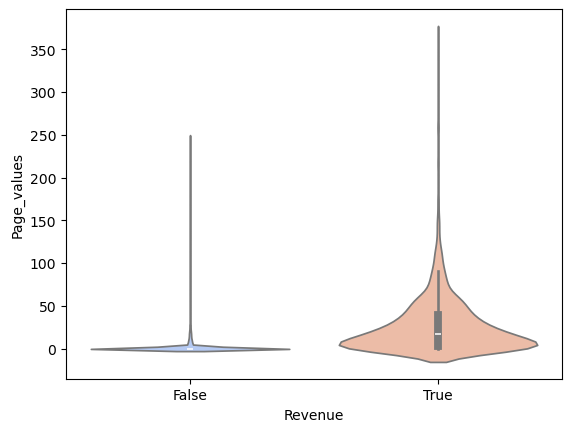

In [ ]:
sns.violinplot(data=df_bivariate, x="Revenue", y="Page_values", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\446654760.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Revenue", y="Special_day", palette="coolwarm")


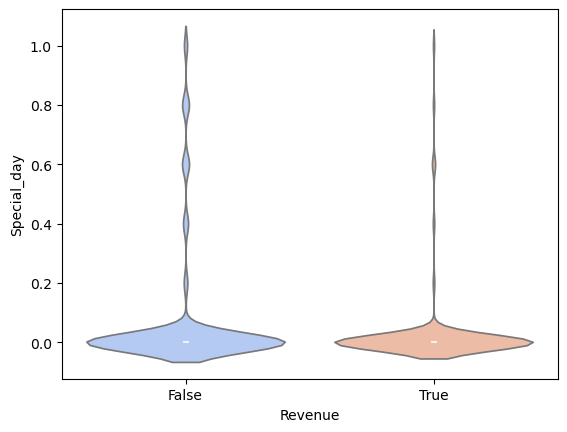

In [ ]:
sns.violinplot(data=df_bivariate, x="Revenue", y="Special_day", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\107338492.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Browser_label", y="Administrative", palette="coolwarm")


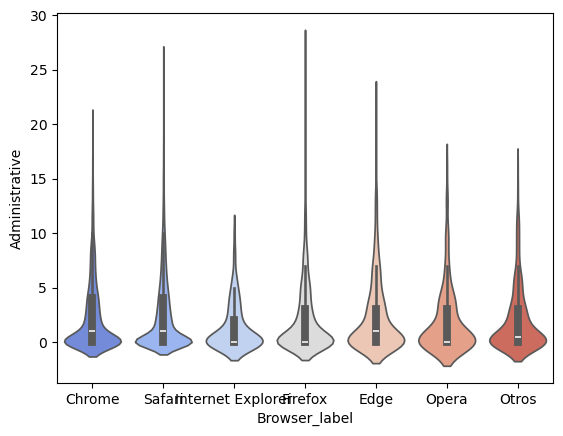

In [ ]:
sns.violinplot(data=df_bivariate, x="Browser_label", y="Administrative", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3243481960.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Browser_label", y="Administrative_duration", palette="coolwarm")


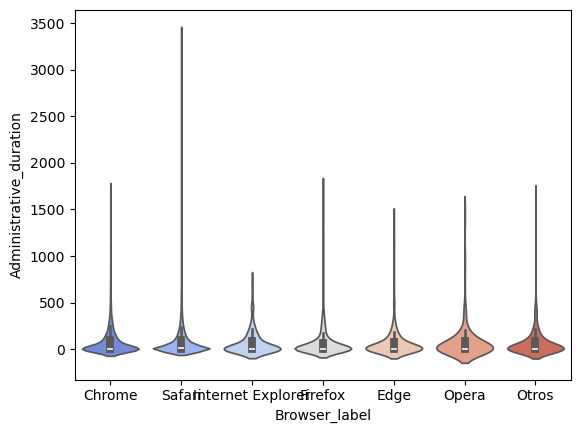

In [ ]:
sns.violinplot(data=df_bivariate, x="Browser_label", y="Administrative_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3494353252.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Browser_label", y="Product_related", palette="coolwarm")


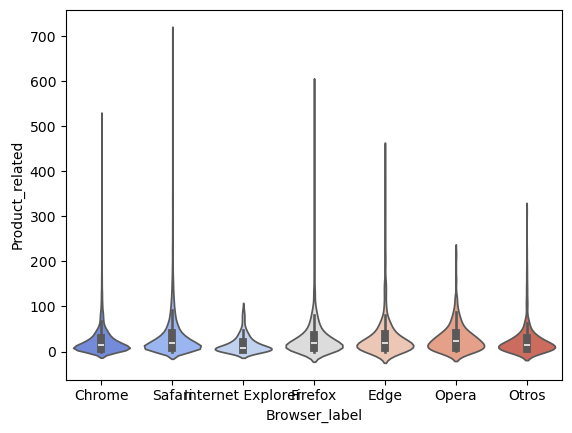

In [ ]:
sns.violinplot(data=df_bivariate, x="Browser_label", y="Product_related", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2166685813.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Browser_label", y="Product_related_duration", palette="coolwarm")


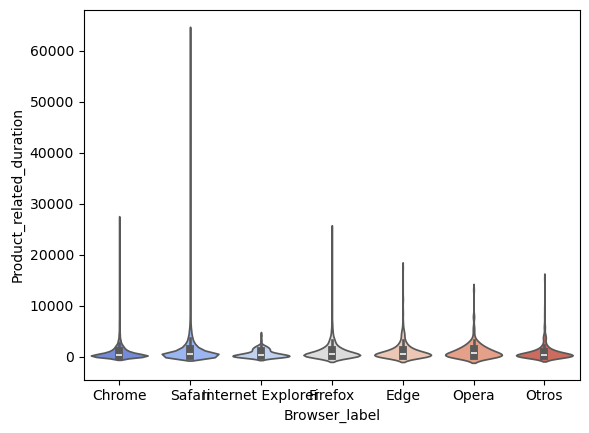

In [ ]:
sns.violinplot(data=df_bivariate, x="Browser_label", y="Product_related_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3786789084.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Browser_label", y="Bounce_rates", palette="coolwarm")


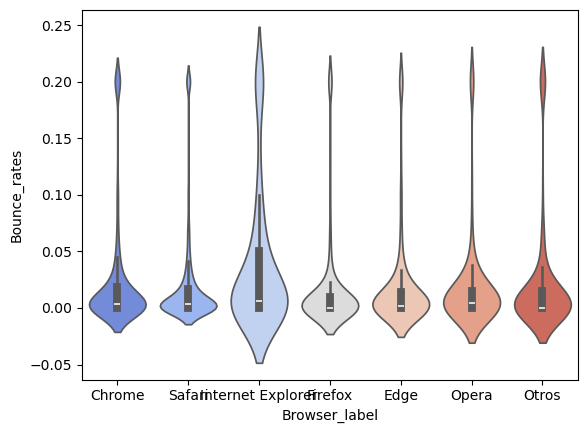

In [ ]:
sns.violinplot(data=df_bivariate, x="Browser_label", y="Bounce_rates", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\488059192.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Browser_label", y="Exit_rates", palette="coolwarm")


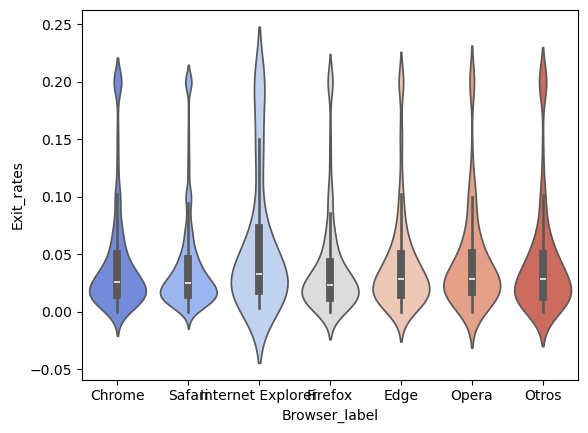

In [ ]:
sns.violinplot(data=df_bivariate, x="Browser_label", y="Exit_rates", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3292207370.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Browser_label", y="Page_values", palette="coolwarm")


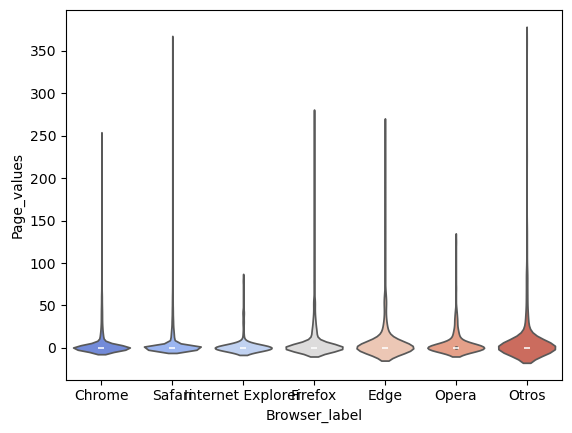

In [ ]:
sns.violinplot(data=df_bivariate, x="Browser_label", y="Page_values", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3610795384.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Browser_label", y="Special_day", palette="coolwarm")


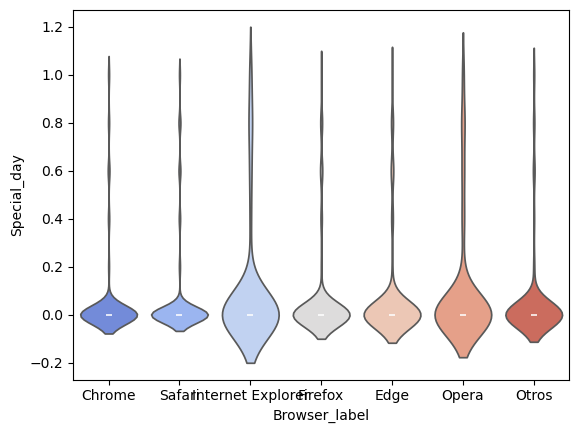

In [ ]:
sns.violinplot(data=df_bivariate, x="Browser_label", y="Special_day", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1636144027.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Os_label", y="Administrative", palette="coolwarm")


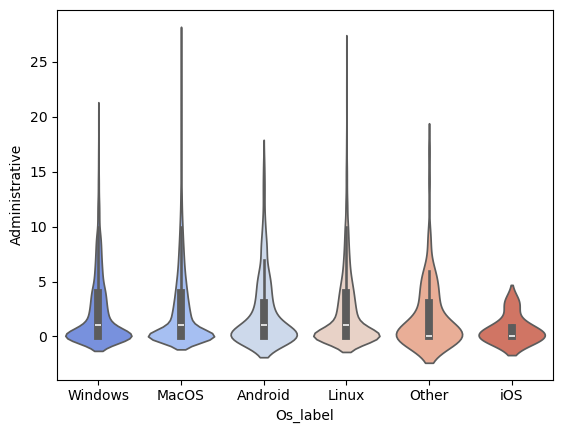

In [ ]:
sns.violinplot(data=df_bivariate, x="Os_label", y="Administrative", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2422185930.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Os_label", y="Administrative_duration", palette="coolwarm")


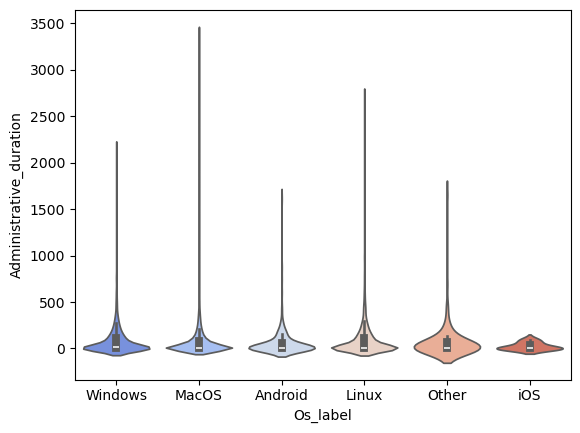

In [ ]:
sns.violinplot(data=df_bivariate, x="Os_label", y="Administrative_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\4204079738.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Os_label", y="Product_related", palette="coolwarm")


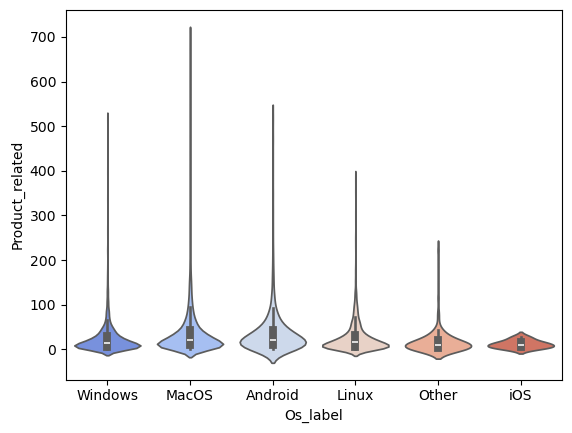

In [ ]:
sns.violinplot(data=df_bivariate, x="Os_label", y="Product_related", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1457747786.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Os_label", y="Product_related_duration", palette="coolwarm")


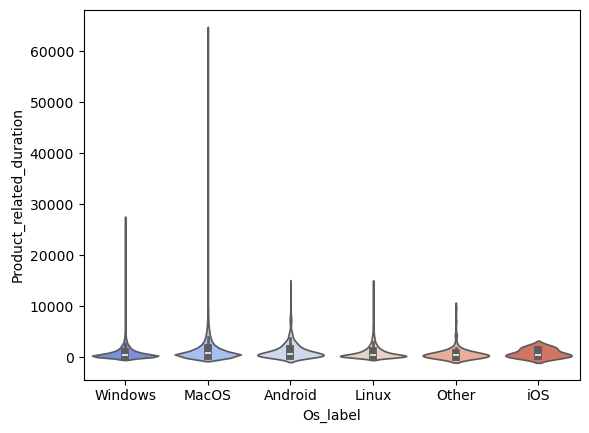

In [ ]:
sns.violinplot(data=df_bivariate, x="Os_label", y="Product_related_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3660135867.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Os_label", y="Bounce_rates", palette="coolwarm")


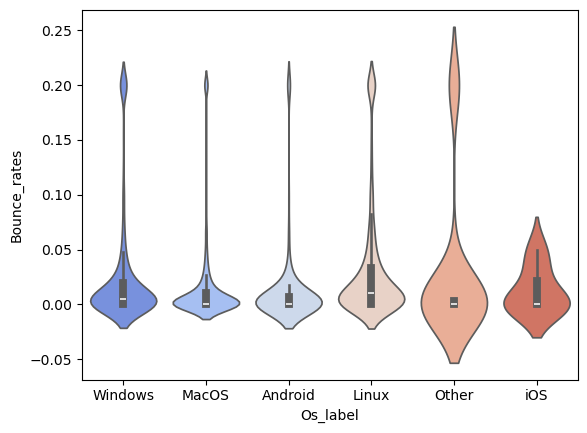

In [ ]:
sns.violinplot(data=df_bivariate, x="Os_label", y="Bounce_rates", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\307179728.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Os_label", y="Exit_rates", palette="coolwarm")


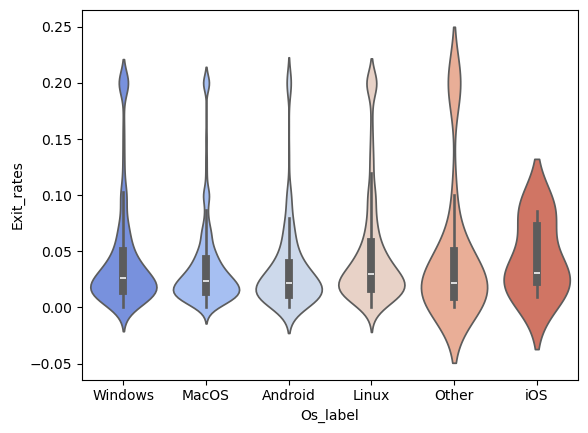

In [ ]:
sns.violinplot(data=df_bivariate, x="Os_label", y="Exit_rates", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1328158595.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Os_label", y="Page_values", palette="coolwarm")


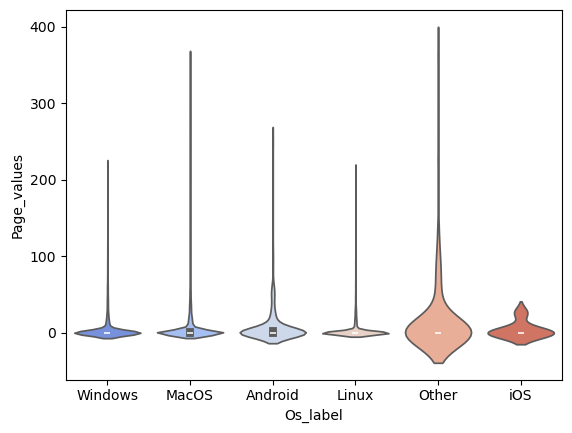

In [ ]:
sns.violinplot(data=df_bivariate, x="Os_label", y="Page_values", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1685508357.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Os_label", y="Special_day", palette="coolwarm")


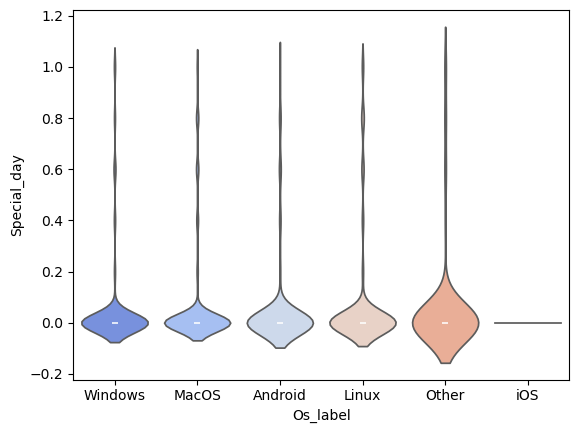

In [ ]:
sns.violinplot(data=df_bivariate, x="Os_label", y="Special_day", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2780244516.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Region_label", y="Administrative", palette="coolwarm")


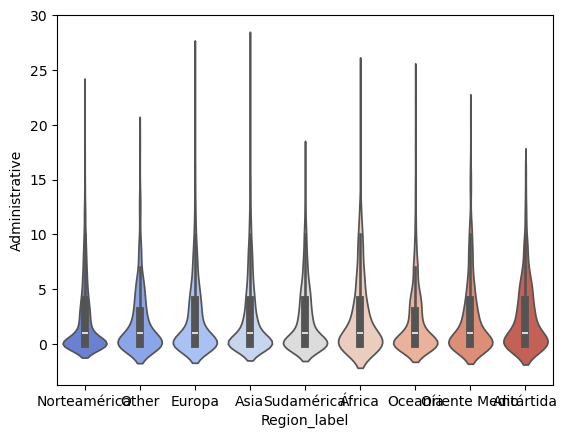

In [ ]:
sns.violinplot(data=df_bivariate, x="Region_label", y="Administrative", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2668858550.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Region_label", y="Administrative_duration", palette="coolwarm")


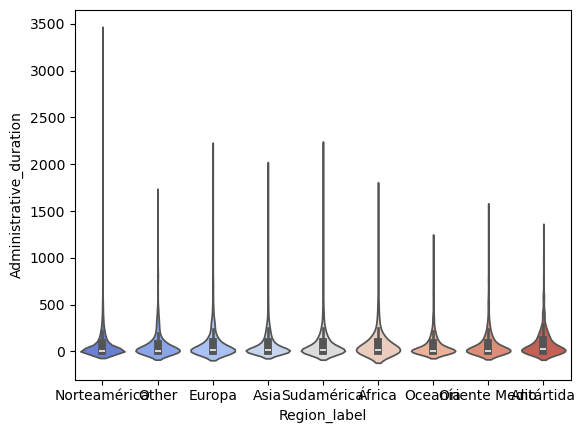

In [ ]:
sns.violinplot(data=df_bivariate, x="Region_label", y="Administrative_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1233317184.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Region_label", y="Product_related", palette="coolwarm")


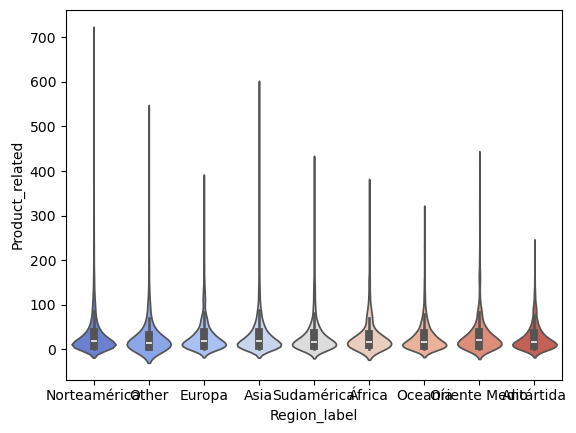

In [ ]:
sns.violinplot(data=df_bivariate, x="Region_label", y="Product_related", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3838306856.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Region_label", y="Product_related_duration", palette="coolwarm")


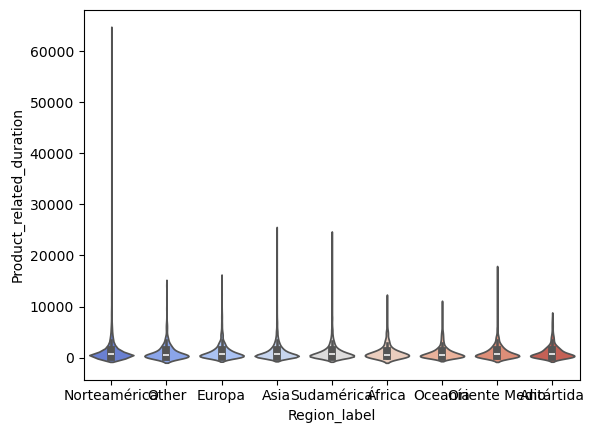

In [ ]:
sns.violinplot(data=df_bivariate, x="Region_label", y="Product_related_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\438468263.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Region_label", y="Bounce_rates", palette="coolwarm")


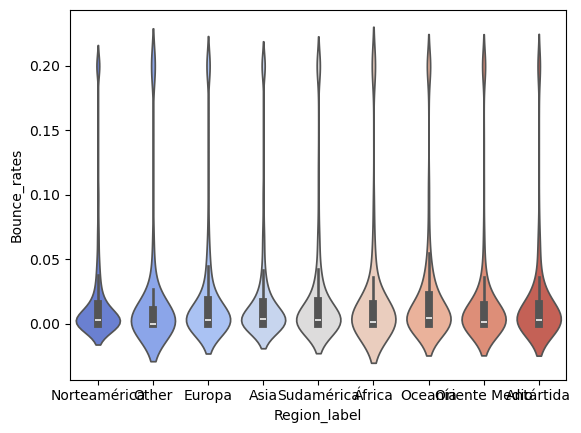

In [ ]:
sns.violinplot(data=df_bivariate, x="Region_label", y="Bounce_rates", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\4162686870.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Region_label", y="Exit_rates", palette="coolwarm")


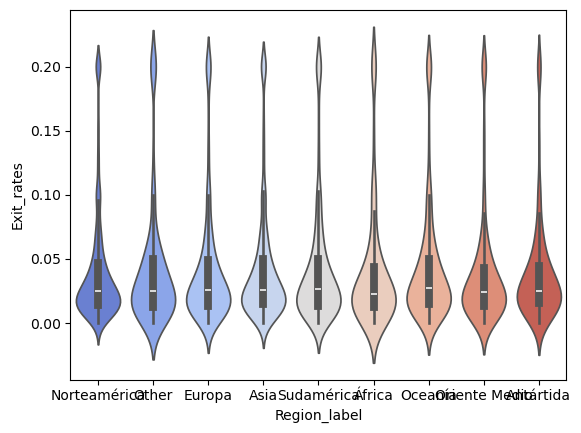

In [ ]:
sns.violinplot(data=df_bivariate, x="Region_label", y="Exit_rates", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1689844661.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Region_label", y="Page_values", palette="coolwarm")


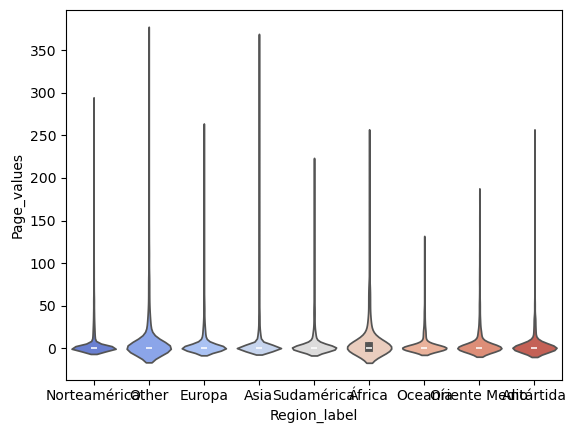

In [ ]:
sns.violinplot(data=df_bivariate, x="Region_label", y="Page_values", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\943235314.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Region_label", y="Special_day", palette="coolwarm")


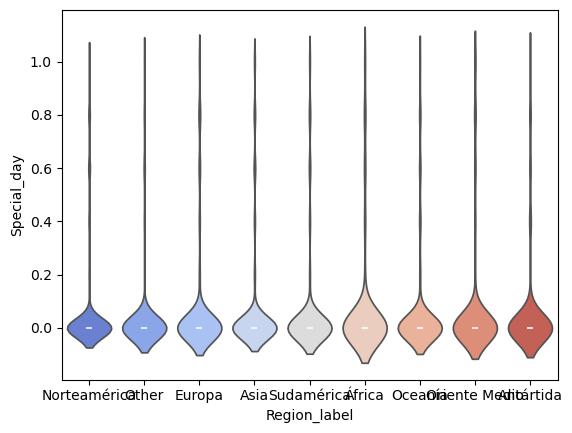

In [ ]:
sns.violinplot(data=df_bivariate, x="Region_label", y="Special_day", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1315910653.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Traffic_type_label", y="Administrative", palette="coolwarm")


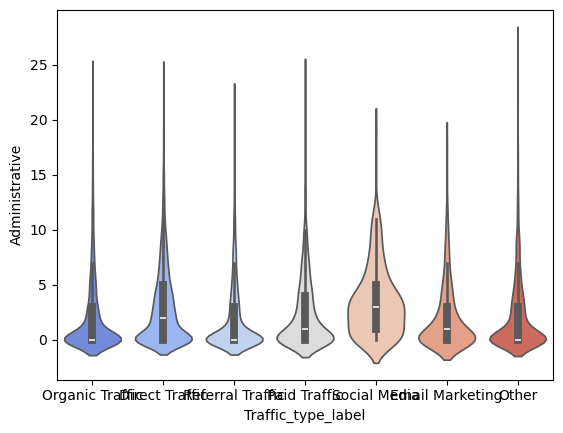

In [ ]:
sns.violinplot(data=df_bivariate, x="Traffic_type_label", y="Administrative", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2668858550.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Region_label", y="Administrative_duration", palette="coolwarm")


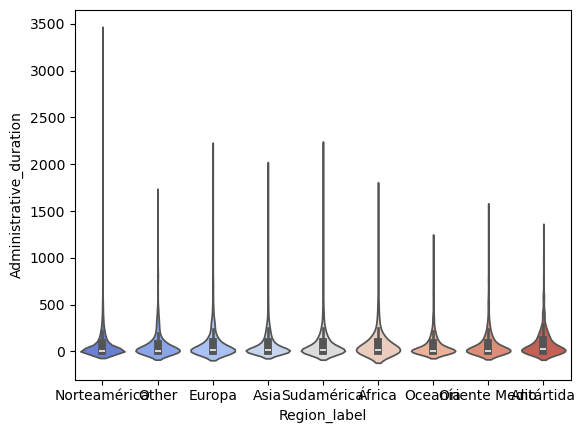

In [ ]:
sns.violinplot(data=df_bivariate, x="Region_label", y="Administrative_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1233317184.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Region_label", y="Product_related", palette="coolwarm")


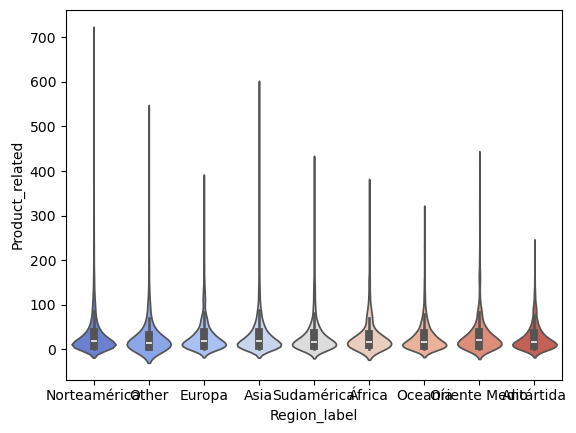

In [ ]:
sns.violinplot(data=df_bivariate, x="Region_label", y="Product_related", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3838306856.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Region_label", y="Product_related_duration", palette="coolwarm")


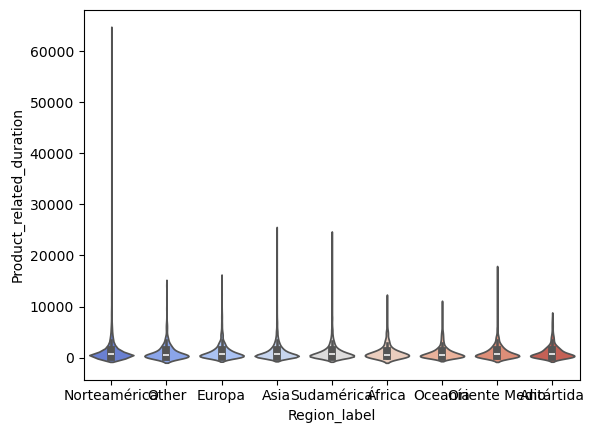

In [ ]:
sns.violinplot(data=df_bivariate, x="Region_label", y="Product_related_duration", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\438468263.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Region_label", y="Bounce_rates", palette="coolwarm")


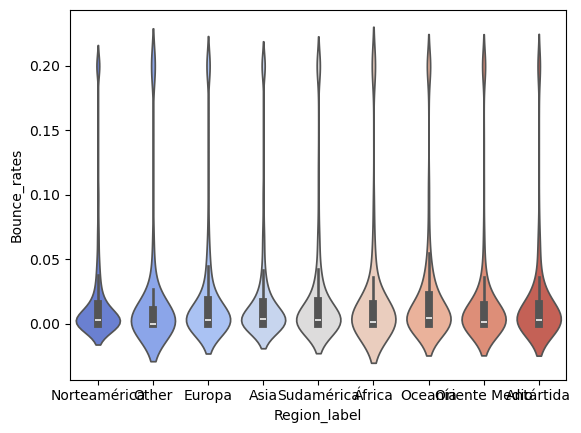

In [ ]:
sns.violinplot(data=df_bivariate, x="Region_label", y="Bounce_rates", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\4162686870.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Region_label", y="Exit_rates", palette="coolwarm")


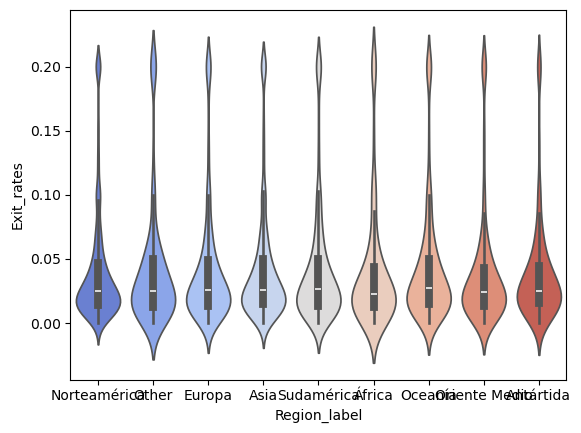

In [ ]:
sns.violinplot(data=df_bivariate, x="Region_label", y="Exit_rates", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1689844661.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Region_label", y="Page_values", palette="coolwarm")


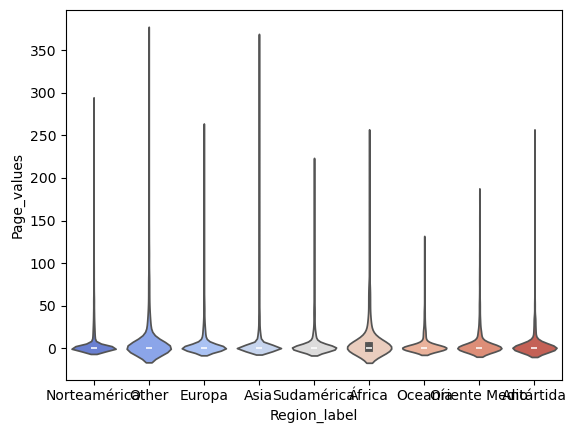

In [ ]:
sns.violinplot(data=df_bivariate, x="Region_label", y="Page_values", palette="coolwarm")
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\943235314.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_bivariate, x="Region_label", y="Special_day", palette="coolwarm")


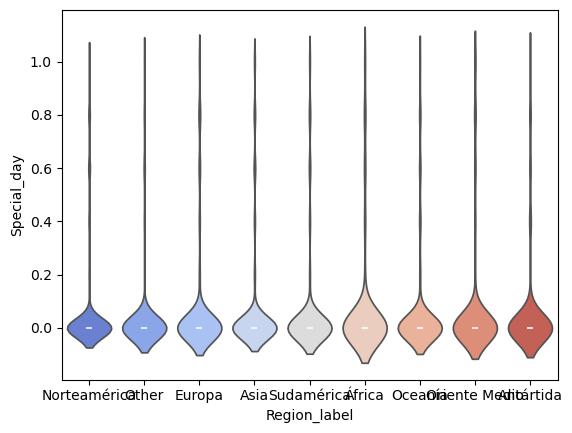

In [ ]:
sns.violinplot(data=df_bivariate, x="Region_label", y="Special_day", palette="coolwarm")
plt.show()

### Bar Charts

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\4251483686.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Month", y="Administrative", palette="coolwarm") #por defecto hace media, puedes cambiar con parámetro.


<function matplotlib.pyplot.show(close=None, block=None)>

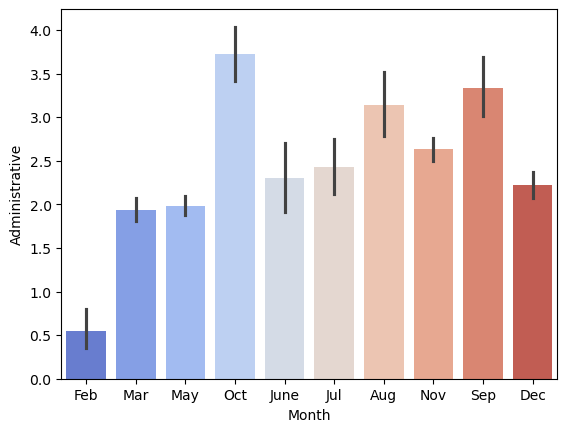

In [ ]:
sns.barplot(data=df_bivariate, x="Month", y="Administrative", palette="coolwarm") #por defecto hace media, puedes cambiar con parámetro.
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\404256340.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Month", y="Administrative_duration", palette="coolwarm") #por defecto hace media, puedes cambiar con parámetro.


<function matplotlib.pyplot.show(close=None, block=None)>

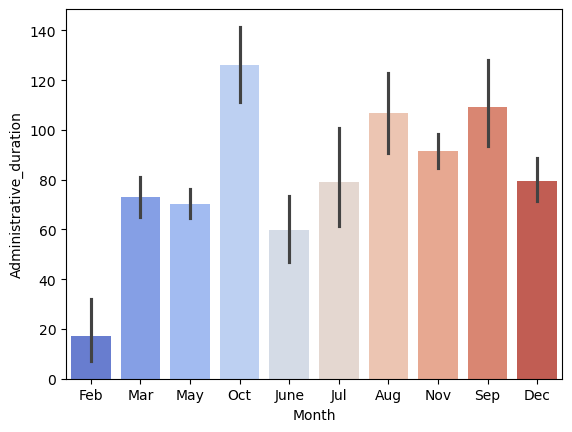

In [ ]:
sns.barplot(data=df_bivariate, x="Month", y="Administrative_duration", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\955048642.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Month", y="Product_related", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

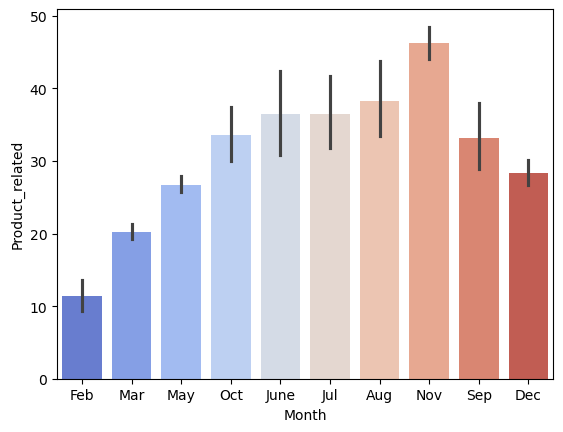

In [ ]:
sns.barplot(data=df_bivariate, x="Month", y="Product_related", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\4189718318.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Month", y="Product_related_duration", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

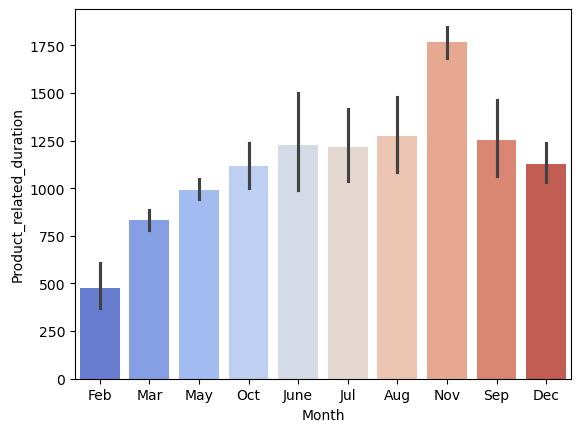

In [ ]:
sns.barplot(data=df_bivariate, x="Month", y="Product_related_duration", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\251537180.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Month", y="Bounce_rates", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

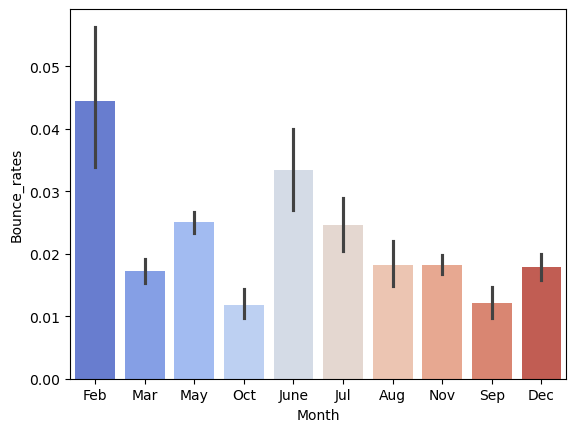

In [ ]:
sns.barplot(data=df_bivariate, x="Month", y="Bounce_rates", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3101890476.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Month", y="Exit_rates", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

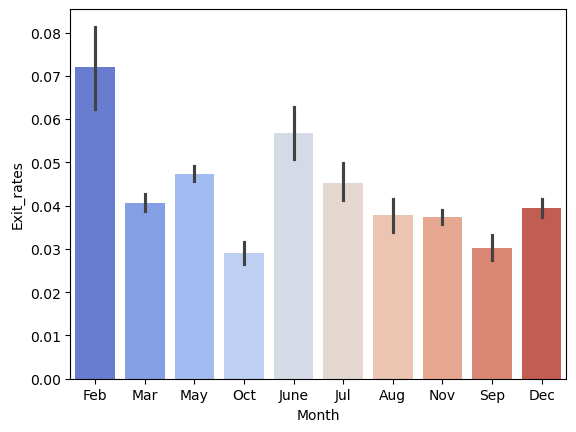

In [ ]:
sns.barplot(data=df_bivariate, x="Month", y="Exit_rates", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3485005977.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Month", y="Page_values", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

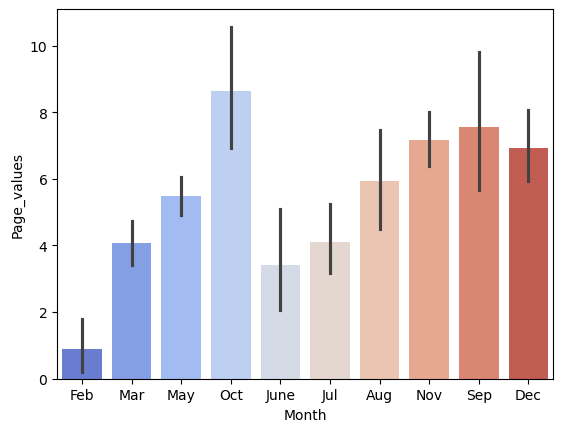

In [ ]:
sns.barplot(data=df_bivariate, x="Month", y="Page_values", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\813283955.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Month", y="Special_day", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

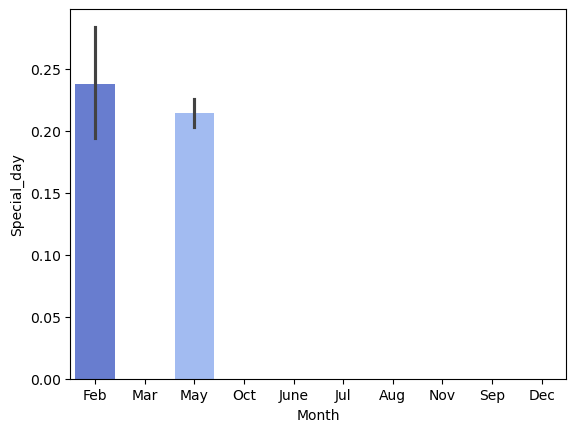

In [ ]:
sns.barplot(data=df_bivariate, x="Month", y="Special_day", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3547952984.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Visitor_type", y="Administrative", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

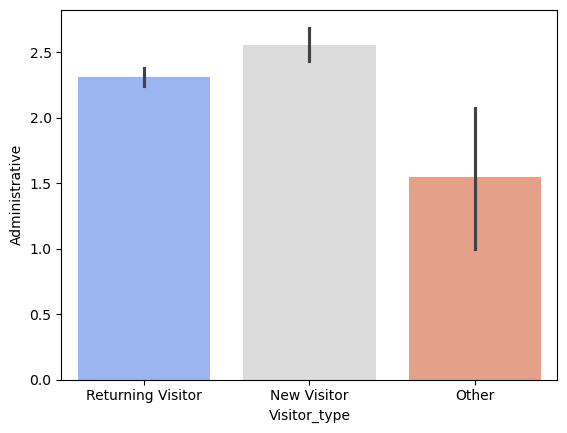

In [ ]:
sns.barplot(data=df_bivariate, x="Visitor_type", y="Administrative", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1857389641.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Visitor_type", y="Administrative_duration", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

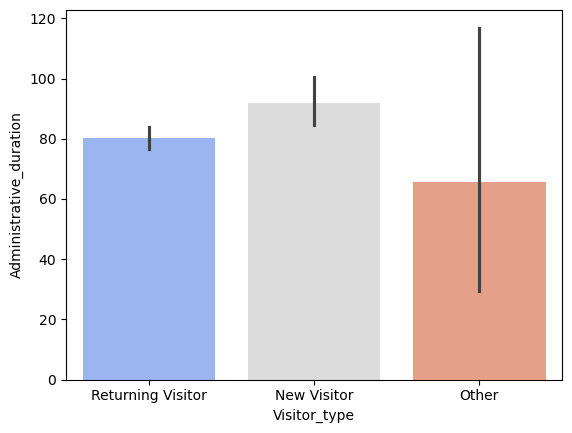

In [ ]:
sns.barplot(data=df_bivariate, x="Visitor_type", y="Administrative_duration", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\166770574.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Visitor_type", y="Informational", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

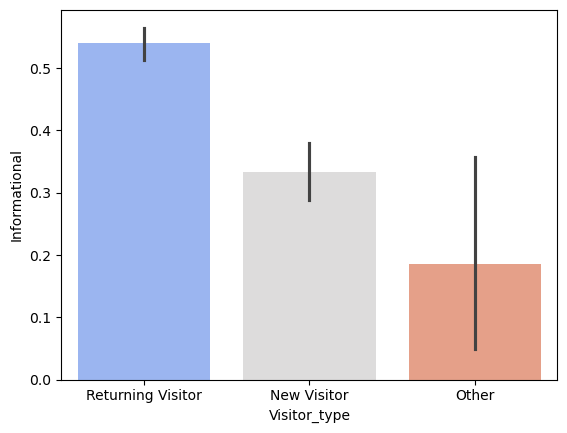

In [ ]:
sns.barplot(data=df_bivariate, x="Visitor_type", y="Informational", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\101913054.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Visitor_type", y="Informational_duration", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

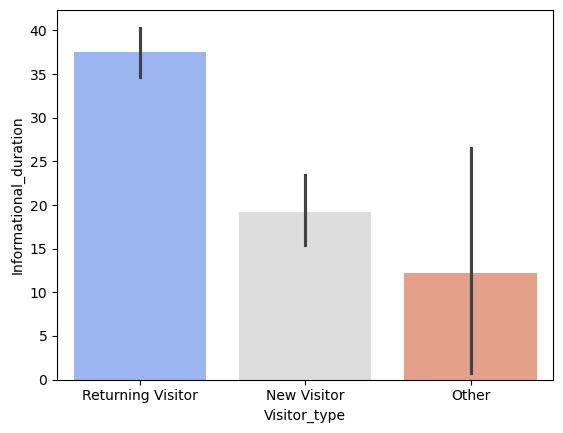

In [ ]:
sns.barplot(data=df_bivariate, x="Visitor_type", y="Informational_duration", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3497347012.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Visitor_type", y="Product_related", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

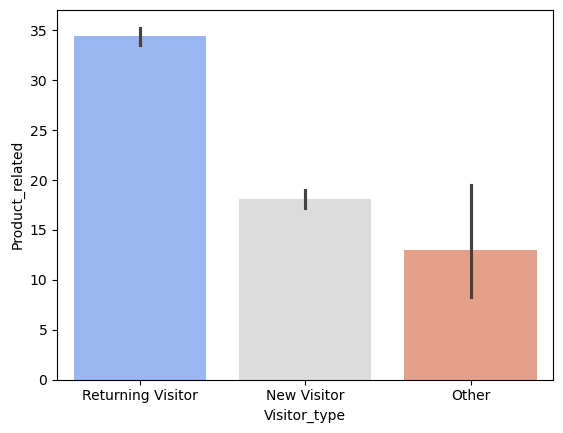

In [ ]:
sns.barplot(data=df_bivariate, x="Visitor_type", y="Product_related", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3077778725.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Visitor_type", y="Product_related_duration", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

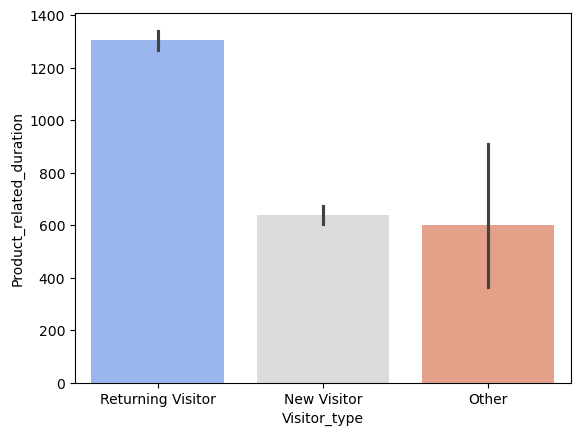

In [ ]:
sns.barplot(data=df_bivariate, x="Visitor_type", y="Product_related_duration", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3611921216.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Visitor_type", y="Bounce_rates", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

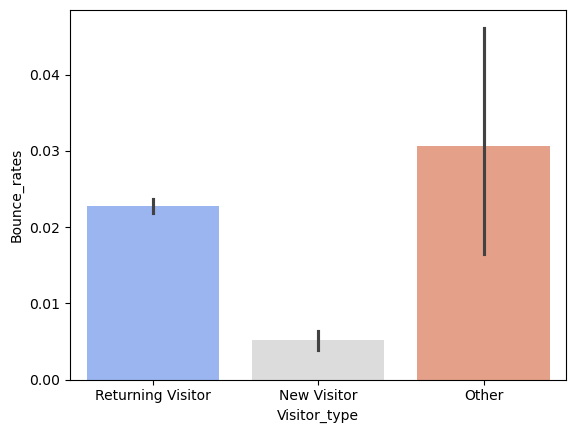

In [ ]:
sns.barplot(data=df_bivariate, x="Visitor_type", y="Bounce_rates", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3127717213.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Visitor_type", y="Exit_rates", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

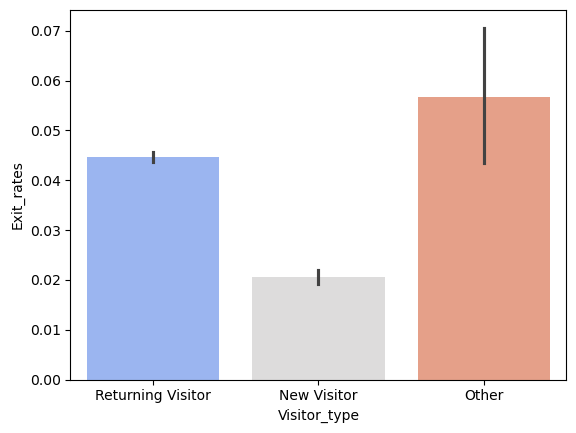

In [ ]:
sns.barplot(data=df_bivariate, x="Visitor_type", y="Exit_rates", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2595817415.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Visitor_type", y="Page_values", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

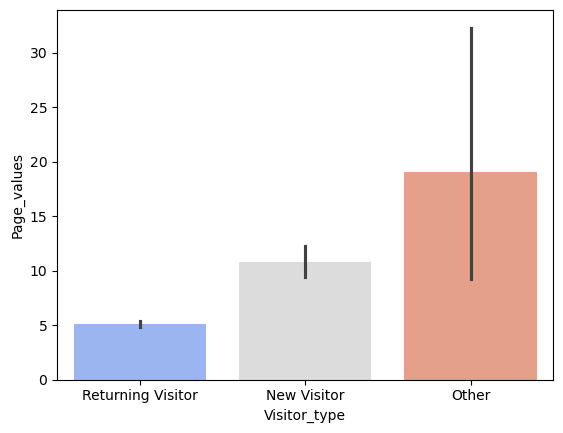

In [ ]:
sns.barplot(data=df_bivariate, x="Visitor_type", y="Page_values", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\4028462381.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Visitor_type", y="Special_day", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

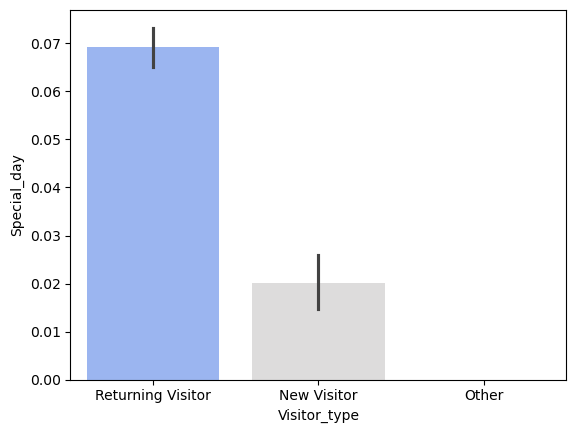

In [ ]:
sns.barplot(data=df_bivariate, x="Visitor_type", y="Special_day", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1096395233.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Weekend", y="Administrative", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

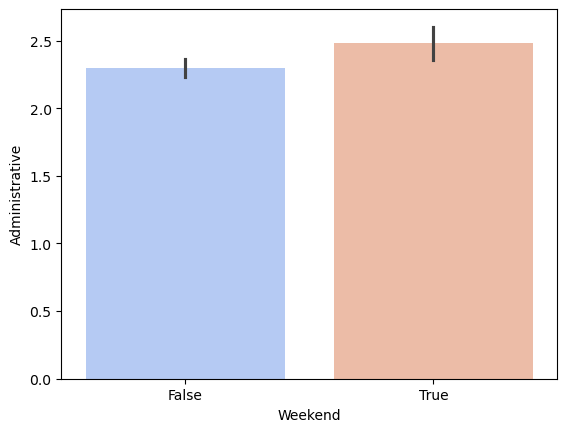

In [ ]:
sns.barplot(data=df_bivariate, x="Weekend", y="Administrative", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\627027019.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Weekend", y="Administrative_duration", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

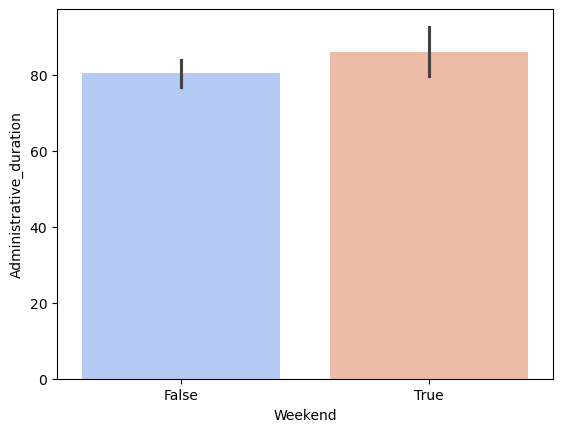

In [ ]:
sns.barplot(data=df_bivariate, x="Weekend", y="Administrative_duration", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\623200991.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Weekend", y="Informational", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

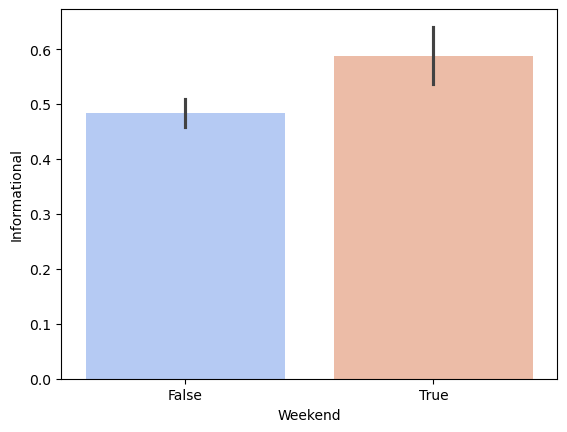

In [ ]:
sns.barplot(data=df_bivariate, x="Weekend", y="Informational", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1611948818.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Weekend", y="Informational_duration", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

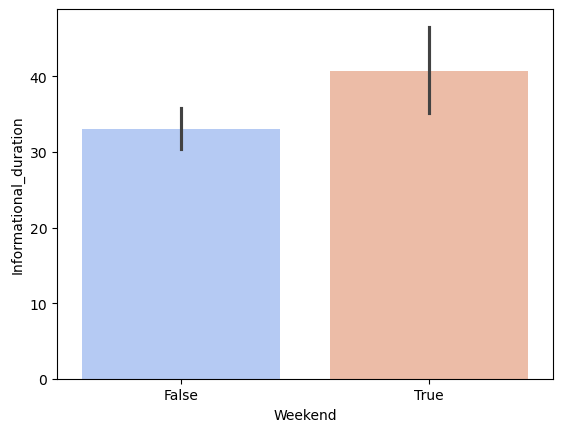

In [ ]:
sns.barplot(data=df_bivariate, x="Weekend", y="Informational_duration", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3828357862.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Weekend", y="Product_related", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

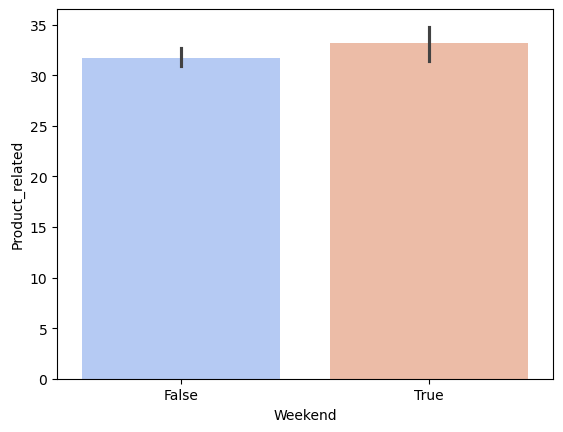

In [ ]:
sns.barplot(data=df_bivariate, x="Weekend", y="Product_related", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\335803672.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Weekend", y="Product_related_duration", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

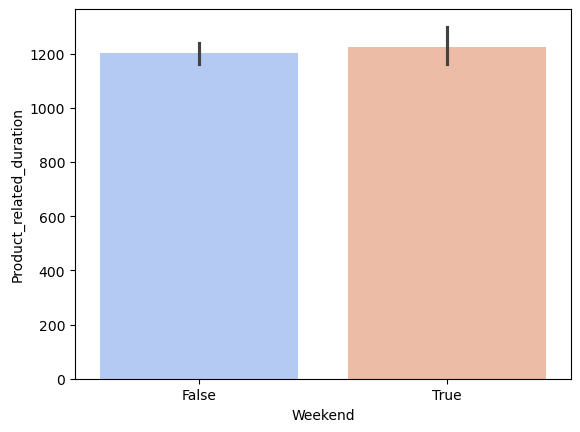

In [ ]:
sns.barplot(data=df_bivariate, x="Weekend", y="Product_related_duration", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1374331270.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Weekend", y="Bounce_rates", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

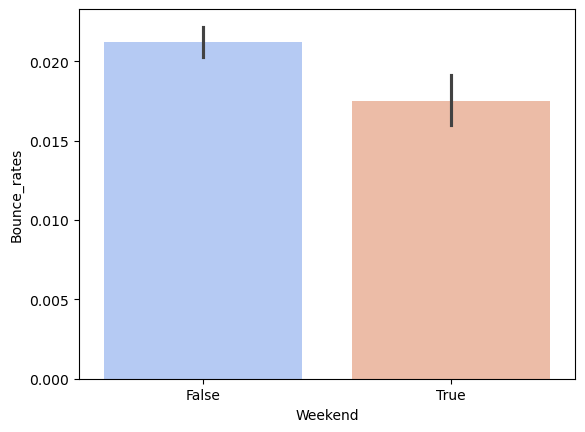

In [ ]:
sns.barplot(data=df_bivariate, x="Weekend", y="Bounce_rates", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3734309615.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Weekend", y="Exit_rates", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

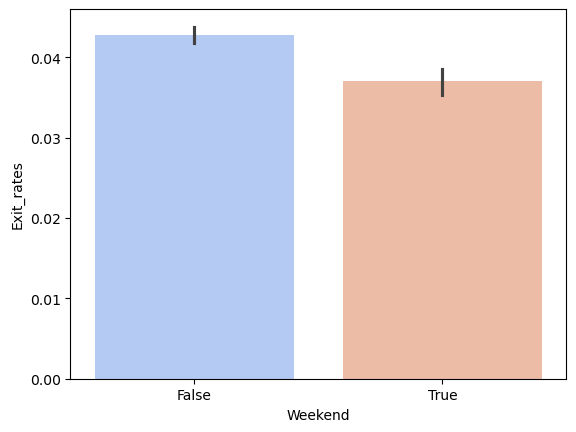

In [ ]:
sns.barplot(data=df_bivariate, x="Weekend", y="Exit_rates", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3145250261.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Weekend", y="Page_values", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

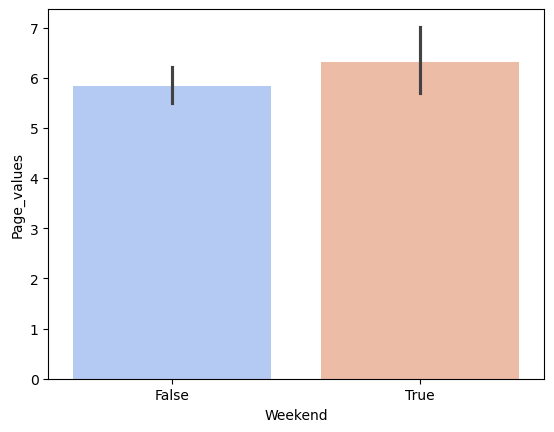

In [ ]:
sns.barplot(data=df_bivariate, x="Weekend", y="Page_values", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3640476672.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Weekend", y="Special_day", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

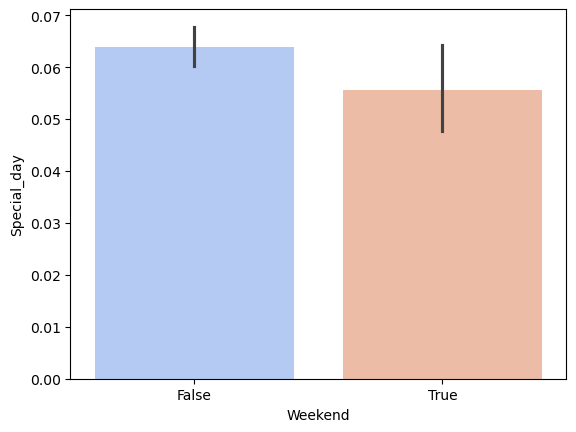

In [ ]:
sns.barplot(data=df_bivariate, x="Weekend", y="Special_day", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1902711261.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Revenue", y="Administrative", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

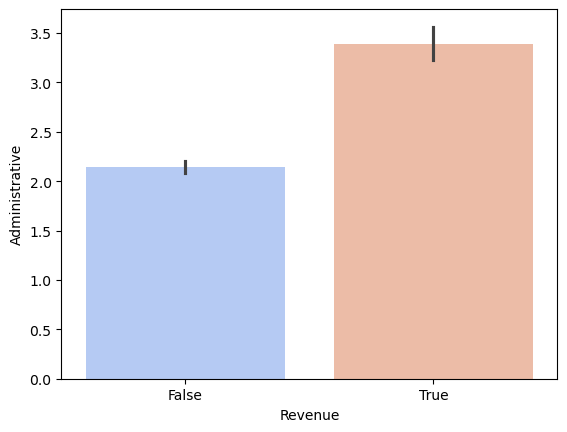

In [ ]:
sns.barplot(data=df_bivariate, x="Revenue", y="Administrative", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3632271608.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Revenue", y="Administrative_duration", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

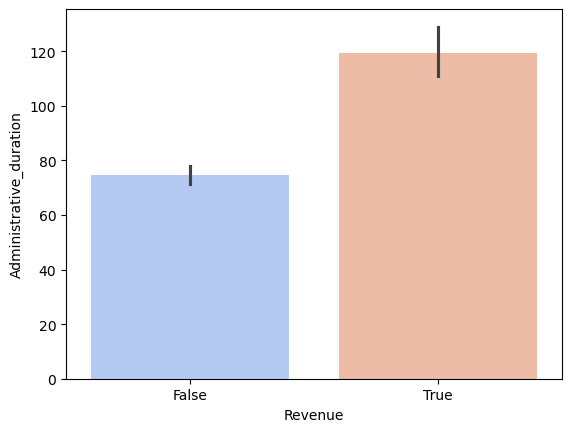

In [ ]:
sns.barplot(data=df_bivariate, x="Revenue", y="Administrative_duration", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2655727845.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Revenue", y="Informational", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

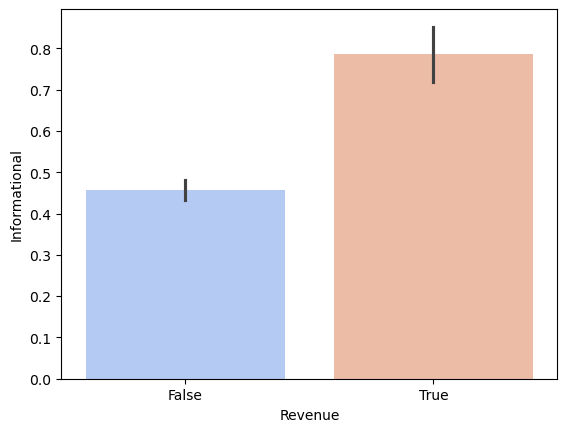

In [ ]:
sns.barplot(data=df_bivariate, x="Revenue", y="Informational", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2741856904.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Revenue", y="Informational_duration", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

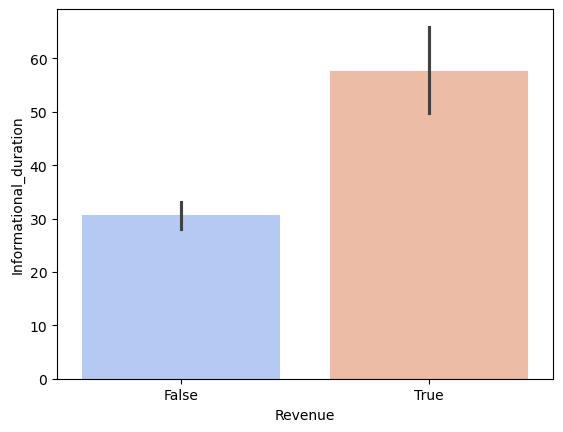

In [ ]:
sns.barplot(data=df_bivariate, x="Revenue", y="Informational_duration", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1938106567.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Revenue", y="Product_related", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

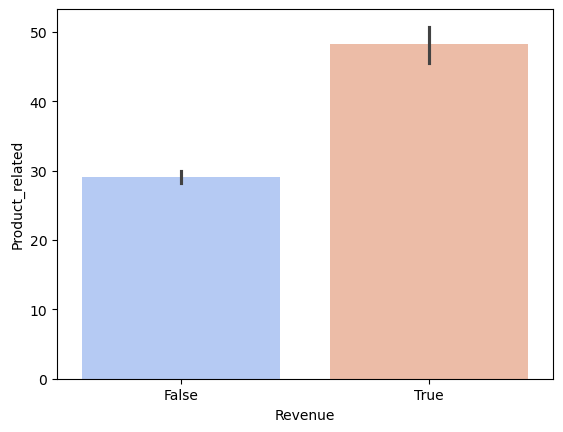

In [ ]:
sns.barplot(data=df_bivariate, x="Revenue", y="Product_related", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2420157350.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Revenue", y="Product_related_duration", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

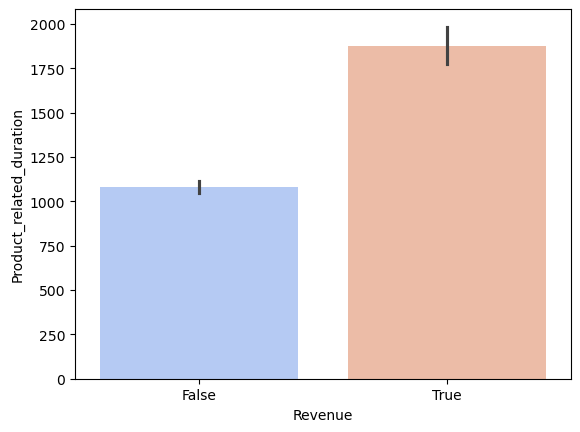

In [ ]:
sns.barplot(data=df_bivariate, x="Revenue", y="Product_related_duration", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1904736110.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Revenue", y="Bounce_rates", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

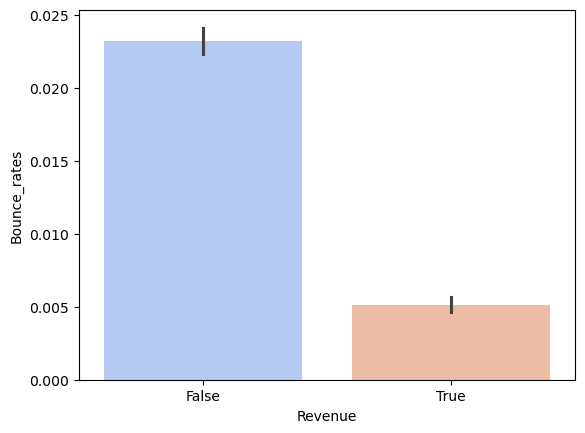

In [ ]:
sns.barplot(data=df_bivariate, x="Revenue", y="Bounce_rates", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1206800875.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Revenue", y="Exit_rates", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

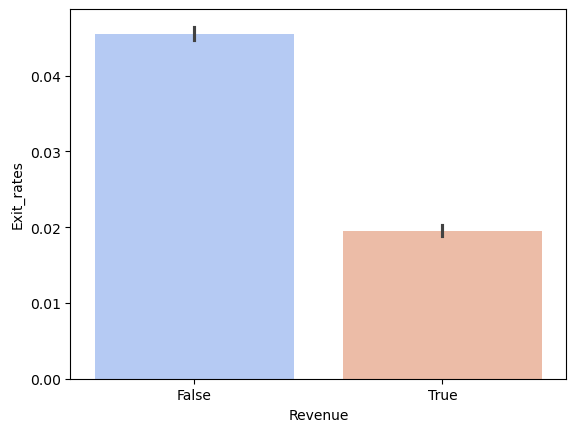

In [ ]:
sns.barplot(data=df_bivariate, x="Revenue", y="Exit_rates", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2409245734.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Revenue", y="Page_values", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

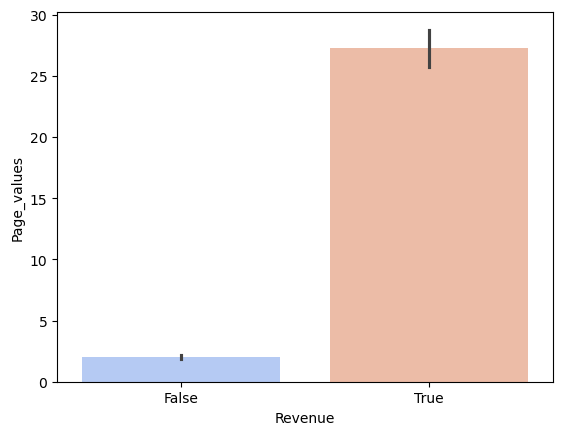

In [ ]:
sns.barplot(data=df_bivariate, x="Revenue", y="Page_values", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2340509220.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Revenue", y="Special_day", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

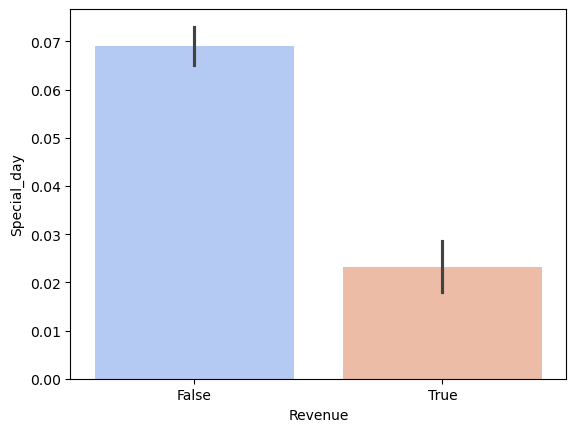

In [ ]:
sns.barplot(data=df_bivariate, x="Revenue", y="Special_day", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1591312480.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Browser_label", y="Administrative", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

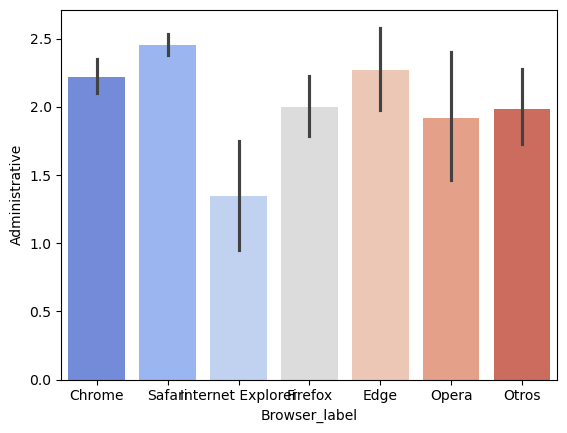

In [ ]:
sns.barplot(data=df_bivariate, x="Browser_label", y="Administrative", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3871737634.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Browser_label", y="Administrative_duration", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

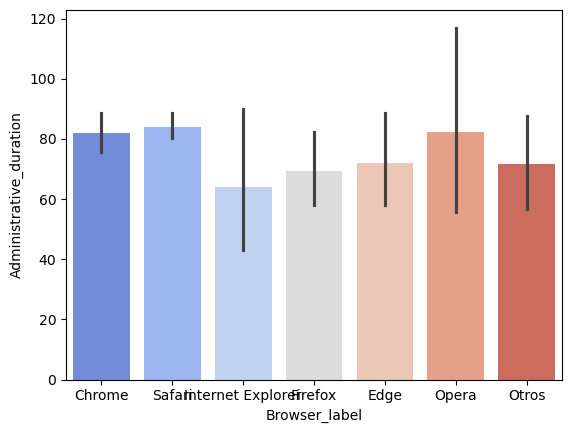

In [ ]:
sns.barplot(data=df_bivariate, x="Browser_label", y="Administrative_duration", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\4046376292.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Browser_label", y="Informational", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

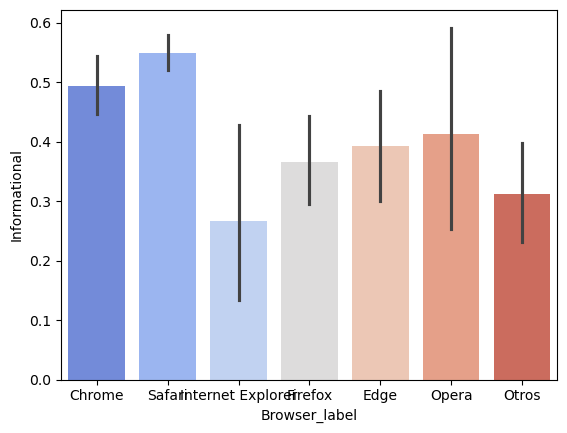

In [ ]:
sns.barplot(data=df_bivariate, x="Browser_label", y="Informational", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2753288057.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Browser_label", y="Informational_duration", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

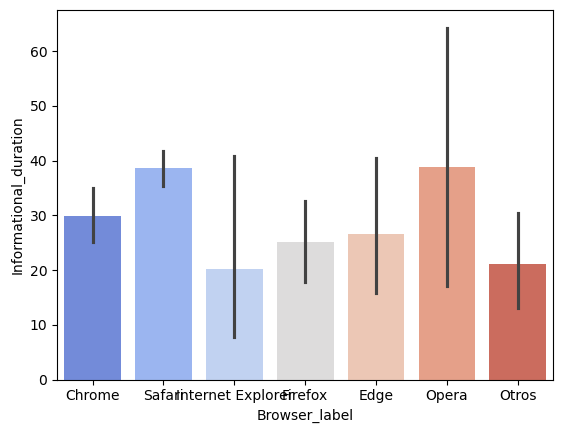

In [ ]:
sns.barplot(data=df_bivariate, x="Browser_label", y="Informational_duration", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1874297922.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Browser_label", y="Product_related", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

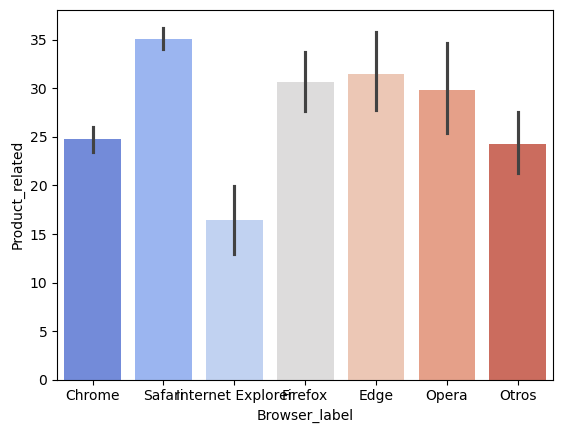

In [ ]:
sns.barplot(data=df_bivariate, x="Browser_label", y="Product_related", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2775034855.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Browser_label", y="Product_related_duration", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

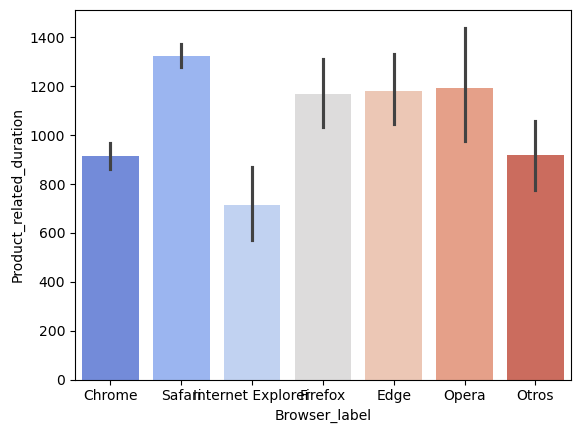

In [ ]:
sns.barplot(data=df_bivariate, x="Browser_label", y="Product_related_duration", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3060532467.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Browser_label", y="Bounce_rates", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

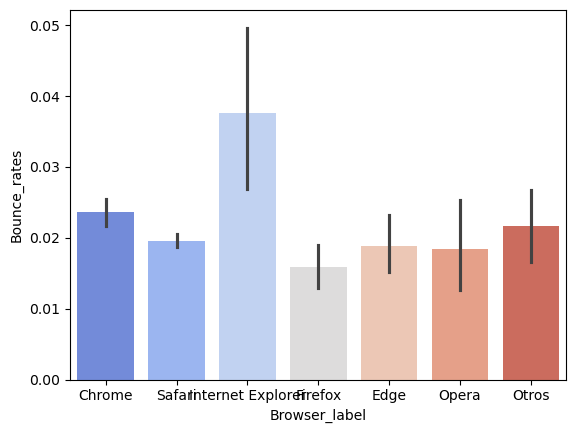

In [ ]:
sns.barplot(data=df_bivariate, x="Browser_label", y="Bounce_rates", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3470002401.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Browser_label", y="Page_values", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

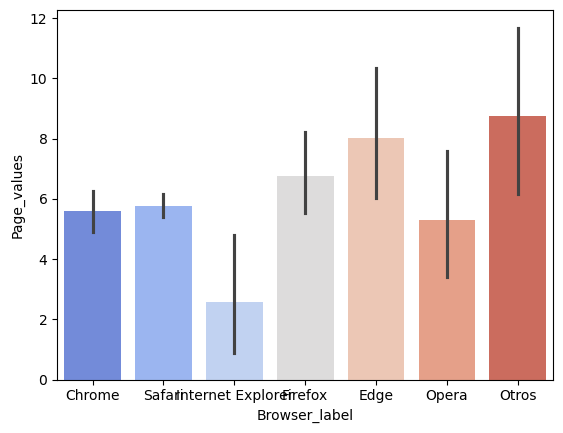

In [ ]:
sns.barplot(data=df_bivariate, x="Browser_label", y="Page_values", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3167597251.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Browser_label", y="Special_day", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

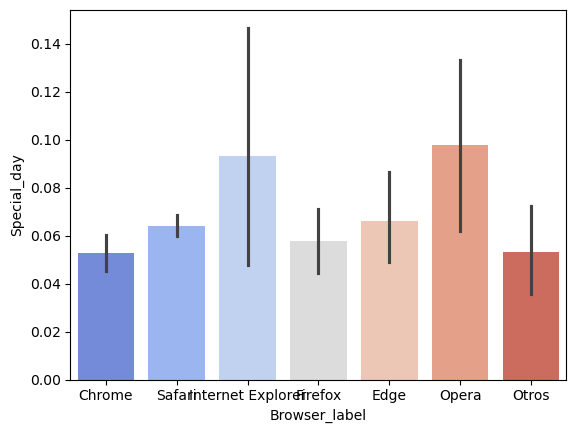

In [ ]:
sns.barplot(data=df_bivariate, x="Browser_label", y="Special_day", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1881102469.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Os_label", y="Administrative", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

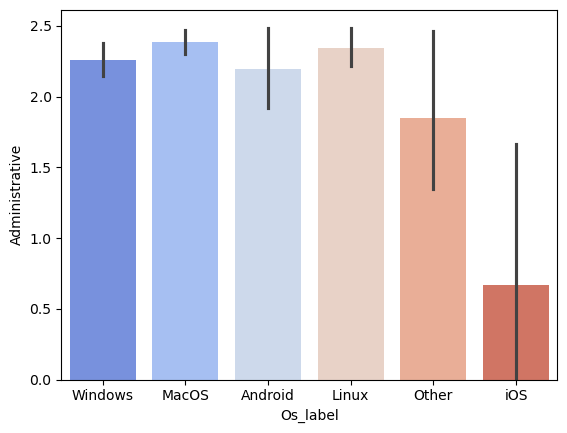

In [ ]:
sns.barplot(data=df_bivariate, x="Os_label", y="Administrative", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2670688040.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Os_label", y="Administrative_duration", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

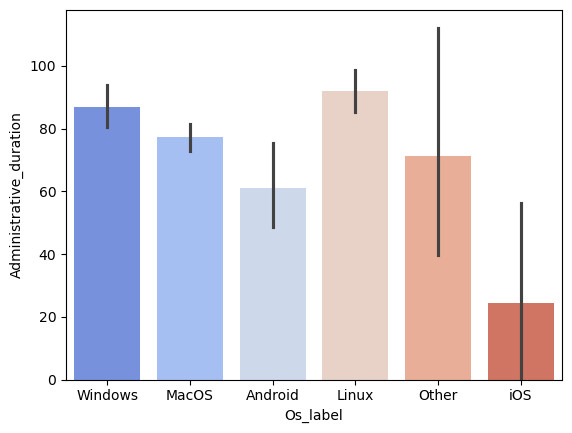

In [ ]:
sns.barplot(data=df_bivariate, x="Os_label", y="Administrative_duration", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3241706254.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Os_label", y="Informational", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

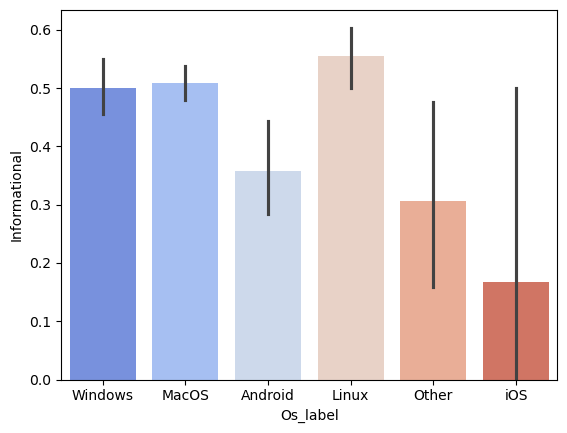

In [ ]:
sns.barplot(data=df_bivariate, x="Os_label", y="Informational", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3575920536.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Os_label", y="Informational_duration", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

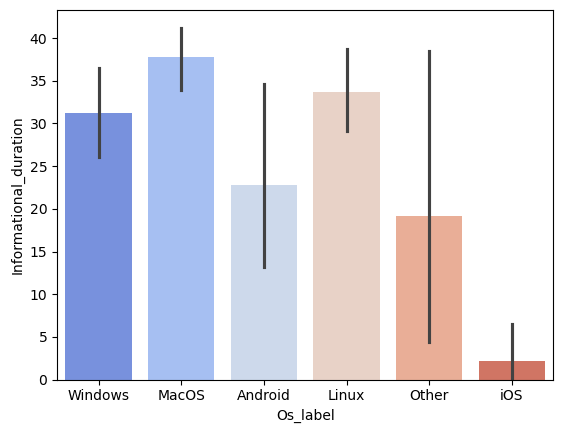

In [ ]:
sns.barplot(data=df_bivariate, x="Os_label", y="Informational_duration", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1215634984.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Os_label", y="Product_related", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

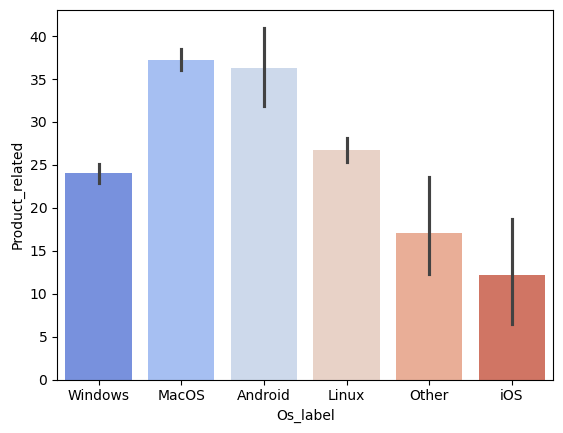

In [ ]:
sns.barplot(data=df_bivariate, x="Os_label", y="Product_related", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1703333375.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Os_label", y="Product_related_duration", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

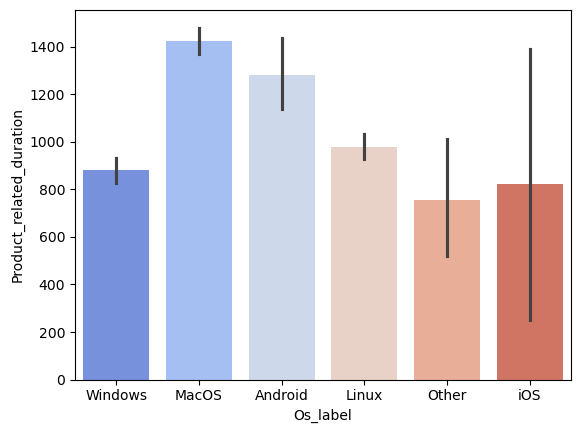

In [ ]:
sns.barplot(data=df_bivariate, x="Os_label", y="Product_related_duration", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3566410738.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Os_label", y="Bounce_rates", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

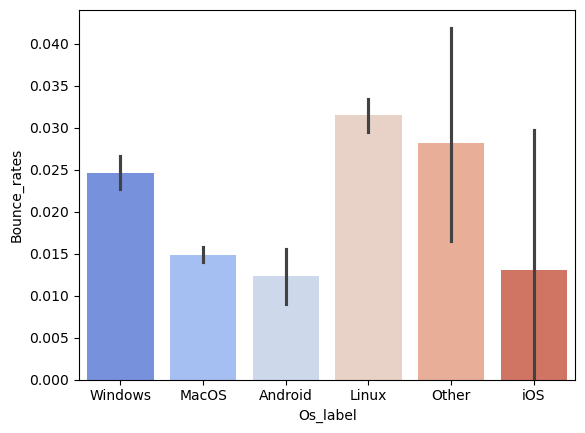

In [ ]:
sns.barplot(data=df_bivariate, x="Os_label", y="Bounce_rates", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\88374128.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Os_label", y="Exit_rates", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

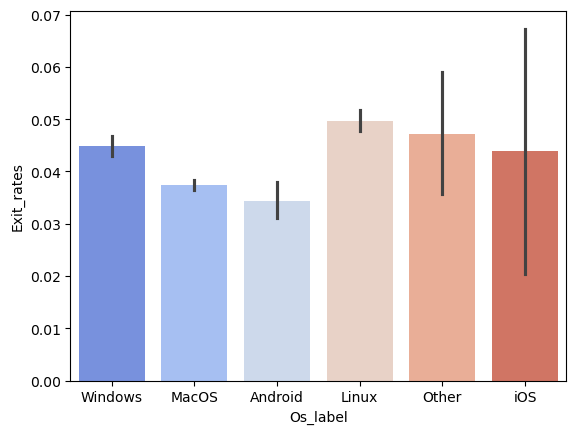

In [ ]:
sns.barplot(data=df_bivariate, x="Os_label", y="Exit_rates", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2417240457.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Os_label", y="Page_values", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

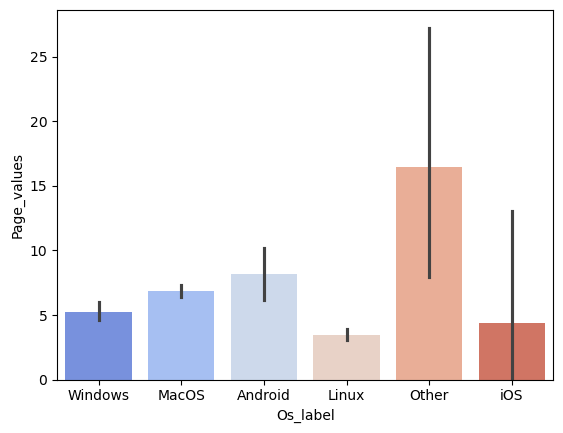

In [ ]:
sns.barplot(data=df_bivariate, x="Os_label", y="Page_values", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1360473416.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Os_label", y="Special_day", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

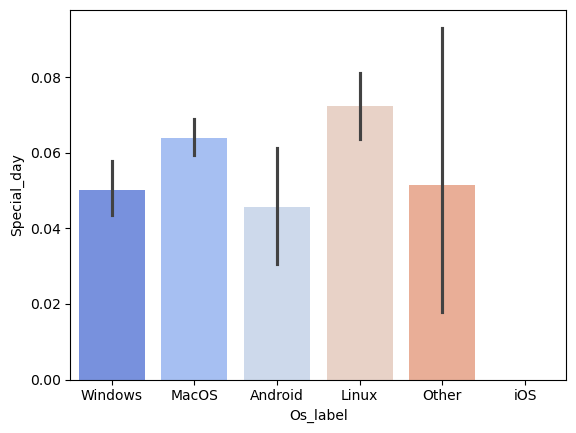

In [ ]:
sns.barplot(data=df_bivariate, x="Os_label", y="Special_day", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2754854175.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Region_label", y="Administrative", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

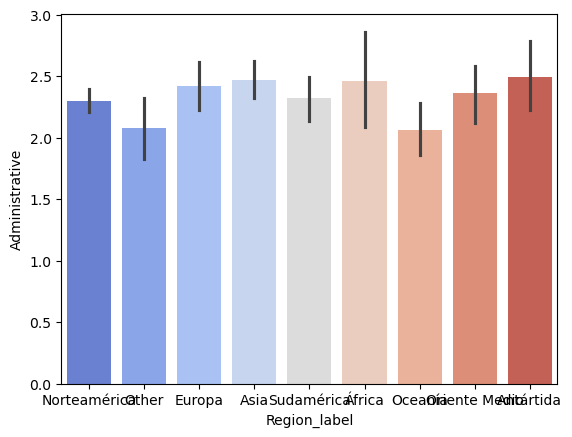

In [ ]:
sns.barplot(data=df_bivariate, x="Region_label", y="Administrative", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1111225272.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Region_label", y="Administrative_duration", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

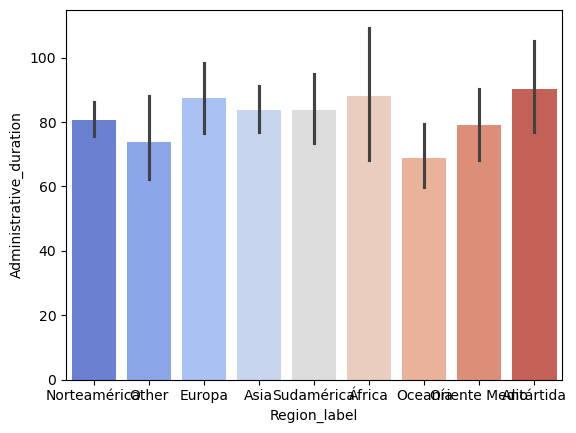

In [ ]:
sns.barplot(data=df_bivariate, x="Region_label", y="Administrative_duration", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\4172722206.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Region_label", y="Informational", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

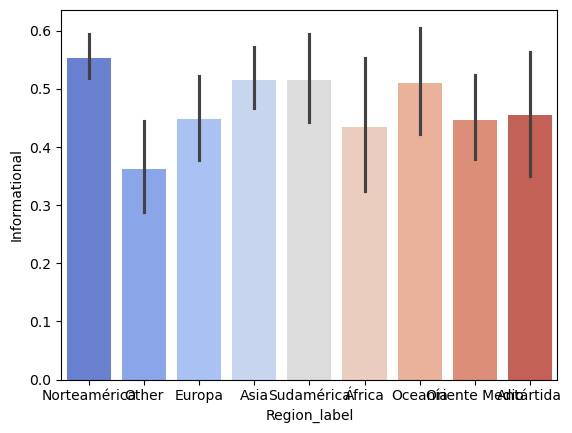

In [ ]:
sns.barplot(data=df_bivariate, x="Region_label", y="Informational", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3887587811.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Region_label", y="Informational_duration", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

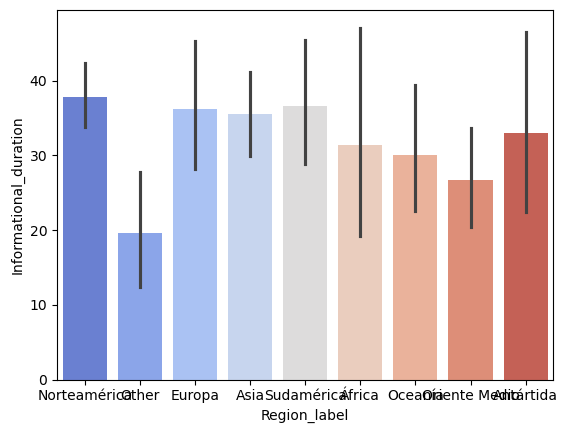

In [ ]:
sns.barplot(data=df_bivariate, x="Region_label", y="Informational_duration", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2521678270.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Region_label", y="Product_related", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

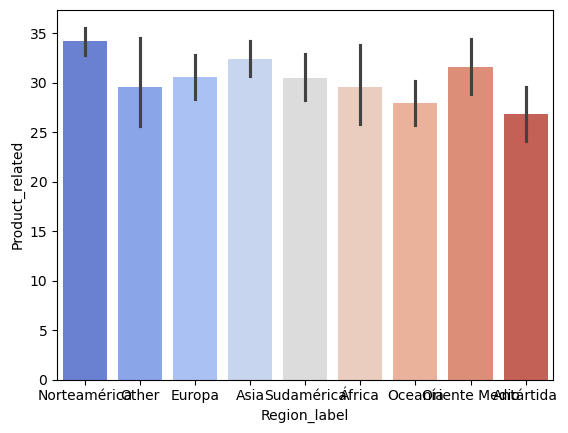

In [ ]:
sns.barplot(data=df_bivariate, x="Region_label", y="Product_related", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\620843875.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Region_label", y="Product_related_duration", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

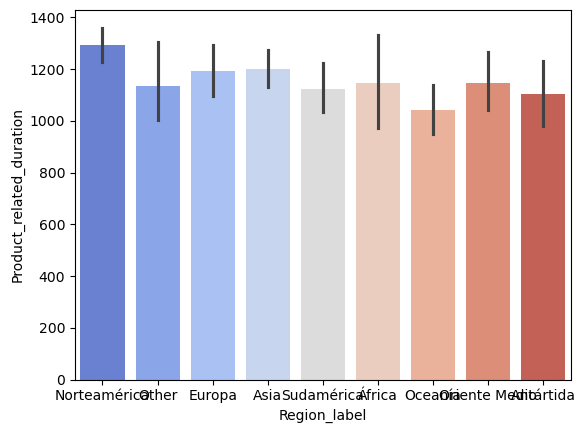

In [ ]:
sns.barplot(data=df_bivariate, x="Region_label", y="Product_related_duration", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\291717250.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Region_label", y="Bounce_rates", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

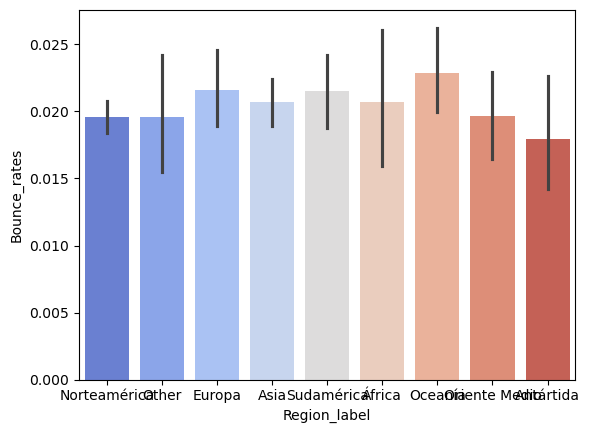

In [ ]:
sns.barplot(data=df_bivariate, x="Region_label", y="Bounce_rates", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1347204244.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Region_label", y="Exit_rates", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

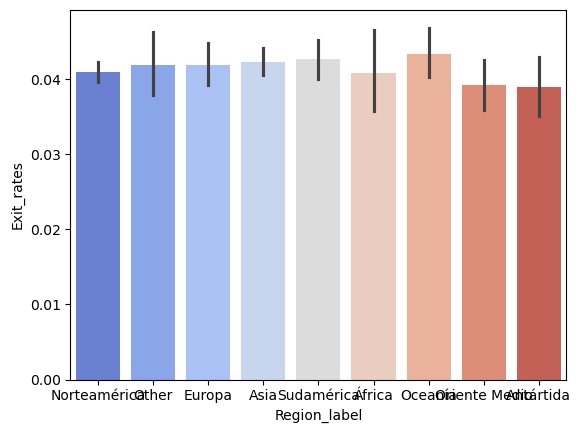

In [ ]:
sns.barplot(data=df_bivariate, x="Region_label", y="Exit_rates", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\274390570.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Region_label", y="Page_values", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

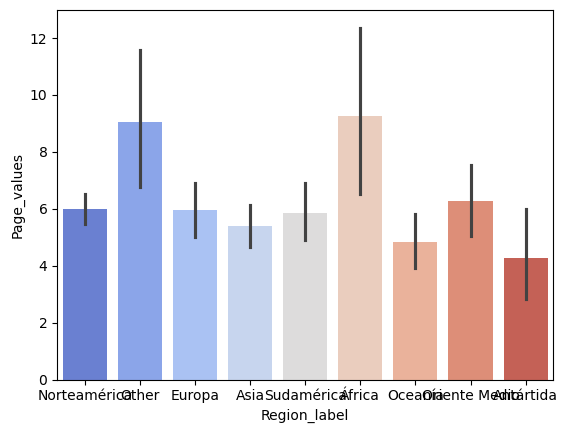

In [ ]:
sns.barplot(data=df_bivariate, x="Region_label", y="Page_values", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\437381672.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Region_label", y="Special_day", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

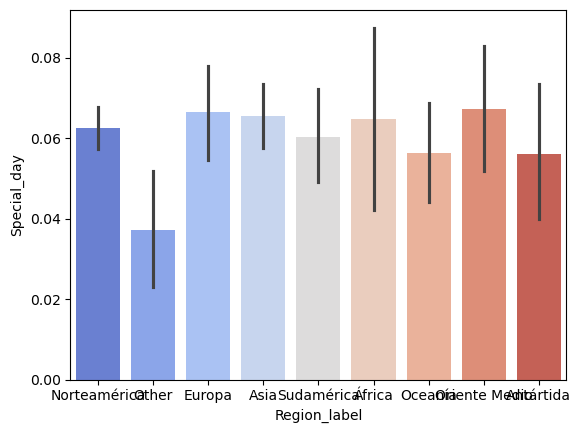

In [ ]:
sns.barplot(data=df_bivariate, x="Region_label", y="Special_day", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3936978905.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Traffic_type_label", y="Administrative", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

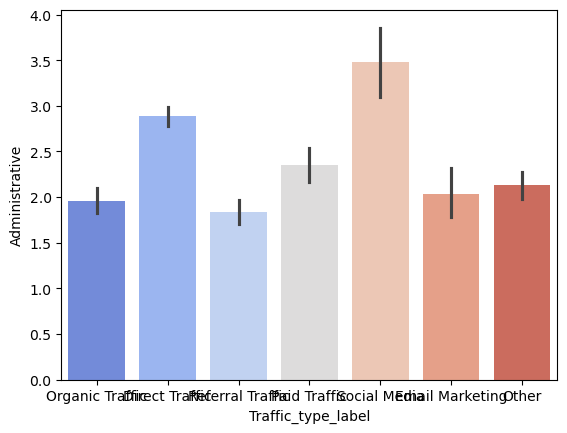

In [ ]:
sns.barplot(data=df_bivariate, x="Traffic_type_label", y="Administrative", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2052957813.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Traffic_type_label", y="Administrative_duration", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

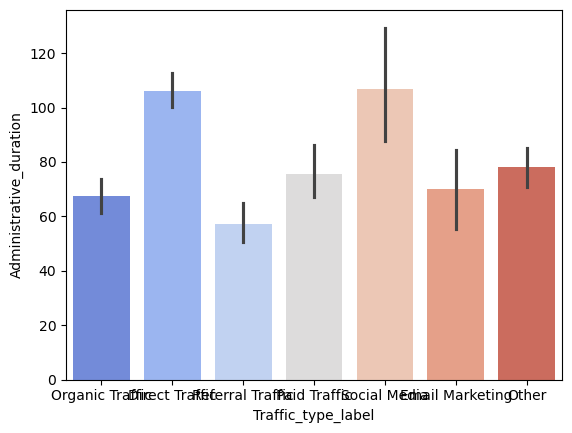

In [ ]:
sns.barplot(data=df_bivariate, x="Traffic_type_label", y="Administrative_duration", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\484903451.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Traffic_type_label", y="Informational", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

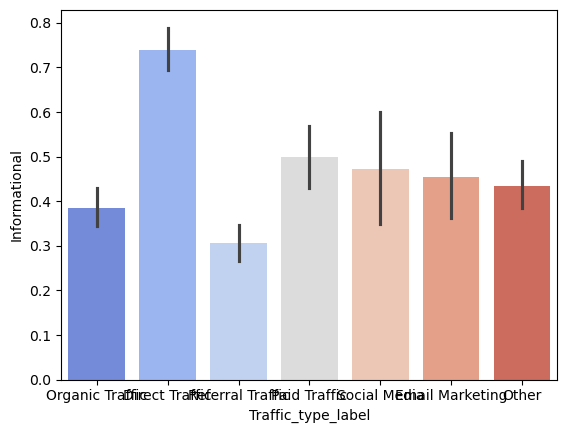

In [ ]:
sns.barplot(data=df_bivariate, x="Traffic_type_label", y="Informational", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\512606534.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Traffic_type_label", y="Informational_duration", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

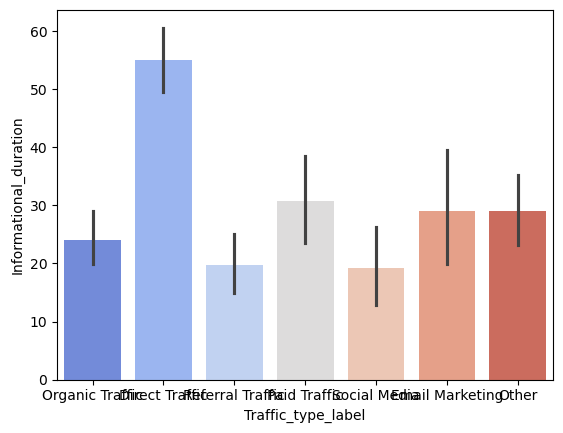

In [ ]:
sns.barplot(data=df_bivariate, x="Traffic_type_label", y="Informational_duration", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3718445808.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Traffic_type_label", y="Product_related", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

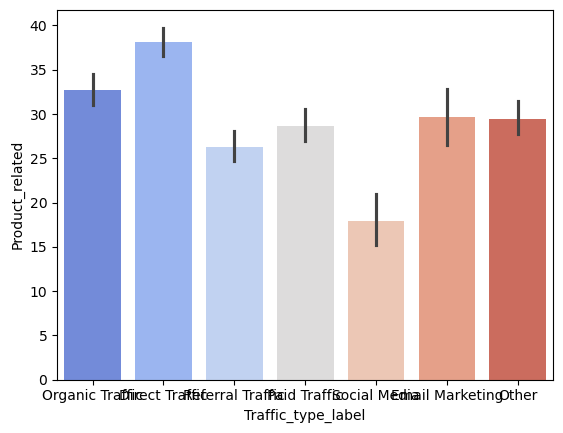

In [ ]:
sns.barplot(data=df_bivariate, x="Traffic_type_label", y="Product_related", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\367916940.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Traffic_type_label", y="Product_related_duration", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

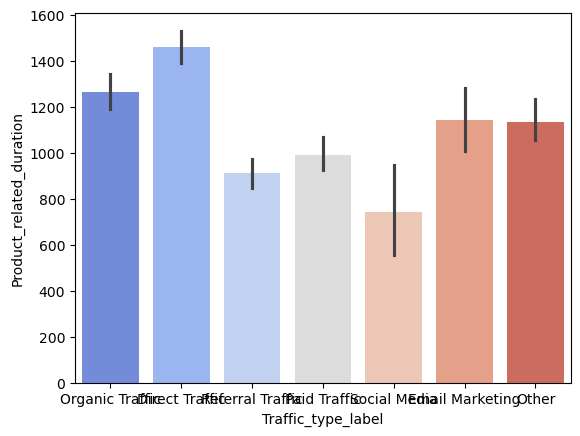

In [ ]:
sns.barplot(data=df_bivariate, x="Traffic_type_label", y="Product_related_duration", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\1910164882.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Traffic_type_label", y="Bounce_rates", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

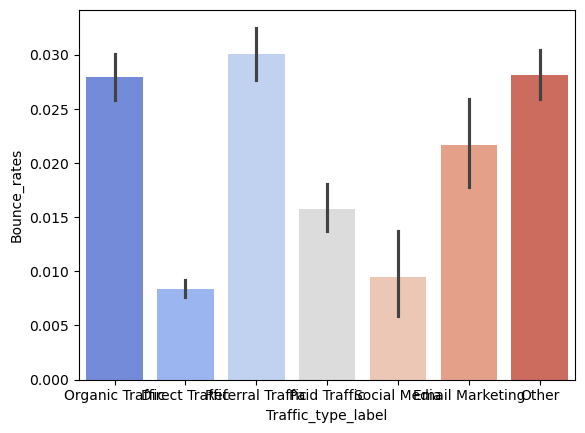

In [ ]:
sns.barplot(data=df_bivariate, x="Traffic_type_label", y="Bounce_rates", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3237302638.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Traffic_type_label", y="Exit_rates", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

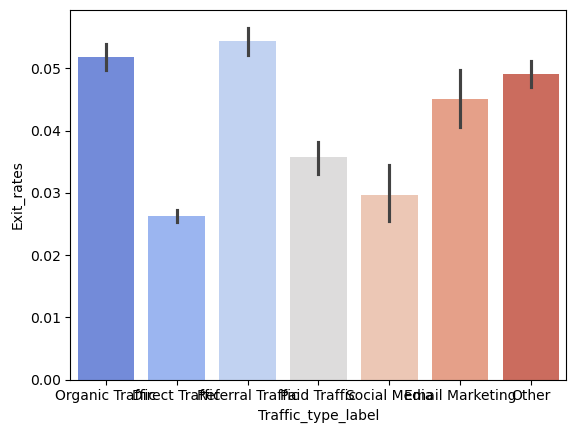

In [ ]:
sns.barplot(data=df_bivariate, x="Traffic_type_label", y="Exit_rates", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2745901341.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Traffic_type_label", y="Page_values", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

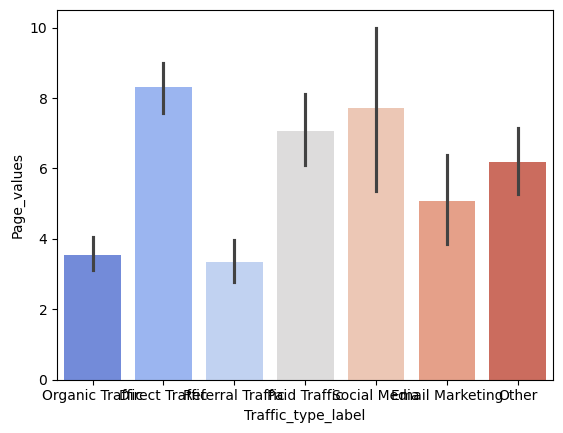

In [ ]:
sns.barplot(data=df_bivariate, x="Traffic_type_label", y="Page_values", palette="coolwarm") 
plt.show

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\711811761.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x="Traffic_type_label", y="Special_day", palette="coolwarm")


<function matplotlib.pyplot.show(close=None, block=None)>

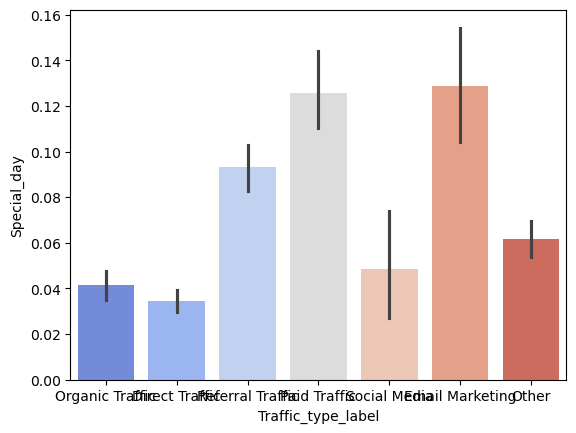

In [ ]:
sns.barplot(data=df_bivariate, x="Traffic_type_label", y="Special_day", palette="coolwarm") 
plt.show

<h2 style="color: #008080;">Continuous Vs Continuous</h2>

In [ ]:

import scipy.stats as stats

def calculate_correlations(df, var1, var2):
    """
    Calcula las correlaciones de Pearson y Spearman entre dos variables en un DataFrame.

    Args:
        df (pd.DataFrame): El DataFrame que contiene las variables.
        var1 (str): Nombre de la primera variable.
        var2 (str): Nombre de la segunda variable.

    Returns:
        dict: Correlaciones de Pearson y Spearman.
    """
    # Verificar si las variables existen en el DataFrame
    if var1 not in df.columns or var2 not in df.columns:
        return f"Una o ambas variables no existen en el DataFrame: {var1}, {var2}"

    # Calcular Pearson
    pearson_corr, pearson_p = stats.pearsonr(df[var1], df[var2])

    # Calcular Spearman
    spearman_corr, spearman_p = stats.spearmanr(df[var1], df[var2])

    # Crear un diccionario con los resultados
    results = {
        "Pearson Correlation": pearson_corr,
        "Pearson p-value": pearson_p,
        "Spearman Correlation": spearman_corr,
        "Spearman p-value": spearman_p,
    }

    return results

In [ ]:
calculate_correlations(df_bivariate, 'Administrative', 'Administrative_duration')

{'Pearson Correlation': 0.6004568115968154,
 'Pearson p-value': 0.0,
 'Spearman Correlation': 0.9393460954180489,
 'Spearman p-value': 0.0}

In [ ]:
calculate_correlations(df_bivariate, 'Administrative', 'Informational')

{'Pearson Correlation': 0.37525634401761887,
 'Pearson p-value': 0.0,
 'Spearman Correlation': 0.3666547480532652,
 'Spearman p-value': 0.0}

In [ ]:
calculate_correlations(df_bivariate, 'Administrative', 'Informational_duration')

{'Pearson Correlation': 0.25481251500622515,
 'Pearson p-value': 3.622735726669228e-180,
 'Spearman Correlation': 0.3604934007711383,
 'Spearman p-value': 0.0}

In [ ]:
calculate_correlations(df_bivariate, 'Administrative', 'Product_related')

{'Pearson Correlation': 0.4283046767993811,
 'Pearson p-value': 0.0,
 'Spearman Correlation': 0.45236341161312377,
 'Spearman p-value': 0.0}

In [ ]:
calculate_correlations(df_bivariate, 'Administrative', 'Product_related_duration')

{'Pearson Correlation': 0.3711463883378338,
 'Pearson p-value': 0.0,
 'Spearman Correlation': 0.41281348451810257,
 'Spearman p-value': 0.0}

In [ ]:
calculate_correlations(df_bivariate, 'Administrative', 'Bounce_rates')

{'Pearson Correlation': -0.21309631774448928,
 'Pearson p-value': 2.4096876252677605e-125,
 'Spearman Correlation': -0.13994873099588848,
 'Spearman p-value': 1.981567039843421e-54}

In [ ]:
calculate_correlations(df_bivariate, 'Administrative', 'Exit_rates')

{'Pearson Correlation': -0.31125464583993395,
 'Pearson p-value': 2.2272845447467947e-272,
 'Spearman Correlation': -0.4254278257291241,
 'Spearman p-value': 0.0}

In [ ]:
calculate_correlations(df_bivariate, 'Administrative', 'Page_values')

{'Pearson Correlation': 0.09701696331327805,
 'Pearson p-value': 6.4405871474371776e-27,
 'Spearman Correlation': 0.3249181274682289,
 'Spearman p-value': 5.028297942252792e-298}

In [ ]:
calculate_correlations(df_bivariate, 'Administrative', 'Special_day')

{'Pearson Correlation': -0.09695086130132308,
 'Pearson p-value': 6.974524087547702e-27,
 'Spearman Correlation': -0.12888508087532827,
 'Spearman p-value': 2.2862910029114207e-46}

In [ ]:
calculate_correlations(df_bivariate, 'Administrative_duration', 'Informational')

{'Pearson Correlation': 0.301418509661903,
 'Pearson p-value': 9.657191246393824e-255,
 'Spearman Correlation': 0.35448470455898345,
 'Spearman p-value': 0.0}

In [ ]:
calculate_correlations(df_bivariate, 'Administrative_duration', 'Informational_duration')

{'Pearson Correlation': 0.23721076940048597,
 'Pearson p-value': 1.046002756222205e-155,
 'Spearman Correlation': 0.34958653283901403,
 'Spearman p-value': 0.0}

In [ ]:
calculate_correlations(df_bivariate, 'Administrative_duration', 'Product_related')

{'Pearson Correlation': 0.28686317555313456,
 'Pearson p-value': 7.024672330000119e-230,
 'Spearman Correlation': 0.4215701376172452,
 'Spearman p-value': 0.0}

In [ ]:
calculate_correlations(df_bivariate, 'Administrative_duration', 'Product_related_duration')

{'Pearson Correlation': 0.3535829246821236,
 'Pearson p-value': 0.0,
 'Spearman Correlation': 0.40498123966901073,
 'Spearman p-value': 0.0}

In [ ]:
calculate_correlations(df_bivariate, 'Administrative_duration', 'Bounce_rates')


{'Pearson Correlation': -0.13691314970373059,
 'Pearson p-value': 3.775707440532942e-52,
 'Spearman Correlation': -0.148816602407177,
 'Spearman p-value': 2.189620362776028e-61}

In [ ]:
calculate_correlations(df_bivariate, 'Administrative_duration', 'Exit_rates')


{'Pearson Correlation': -0.20197148152163646,
 'Pearson p-value': 1.5565123206591103e-112,
 'Spearman Correlation': -0.42918969404110807,
 'Spearman p-value': 0.0}

In [ ]:
calculate_correlations(df_bivariate, 'Administrative_duration', 'Page_values')


{'Pearson Correlation': 0.06622833968796203,
 'Pearson p-value': 2.407762476831304e-13,
 'Spearman Correlation': 0.3138408638550453,
 'Spearman p-value': 3.949759706603478e-277}

In [ ]:
calculate_correlations(df_bivariate, 'Administrative_duration', 'Special_day')


{'Pearson Correlation': -0.07466573377446156,
 'Pearson p-value': 1.4631427889780852e-16,
 'Spearman Correlation': -0.13515934750582786,
 'Spearman p-value': 7.426683523405941e-51}

In [ ]:
calculate_correlations(df_bivariate, 'Informational', 'Informational_duration')


{'Pearson Correlation': 0.6186484171570411,
 'Pearson p-value': 0.0,
 'Spearman Correlation': 0.9508108900511455,
 'Spearman p-value': 0.0}

In [ ]:
calculate_correlations(df_bivariate, 'Informational', 'Product_related')

{'Pearson Correlation': 0.37257163669938576,
 'Pearson p-value': 0.0,
 'Spearman Correlation': 0.36574983362624713,
 'Spearman p-value': 0.0}

In [ ]:
calculate_correlations(df_bivariate, 'Informational', 'Product_related_duration')

{'Pearson Correlation': 0.3860517303743185,
 'Pearson p-value': 0.0,
 'Spearman Correlation': 0.3645140256023435,
 'Spearman p-value': 0.0}

In [ ]:
calculate_correlations(df_bivariate, 'Informational', 'Bounce_rates')

{'Pearson Correlation': -0.10909542075783121,
 'Pearson p-value': 1.2325842870791622e-33,
 'Spearman Correlation': 0.015544074106265585,
 'Spearman p-value': 0.08594651901238769}

In [ ]:
calculate_correlations(df_bivariate, 'Informational', 'Exit_rates')

{'Pearson Correlation': -0.1594286805971284,
 'Pearson p-value': 2.700893409016561e-70,
 'Spearman Correlation': -0.17958606383471584,
 'Spearman p-value': 5.4230795137119436e-89}

In [ ]:
calculate_correlations(df_bivariate, 'Informational', 'Page_values')

{'Pearson Correlation': 0.04740634151735865,
 'Pearson p-value': 1.6085192203730034e-07,
 'Spearman Correlation': 0.21706523710519854,
 'Spearman p-value': 4.2707078784185435e-130}

In [ ]:
calculate_correlations(df_bivariate, 'Informational', 'Special_day')

{'Pearson Correlation': -0.0493502500646243,
 'Pearson p-value': 4.902927836602534e-08,
 'Spearman Correlation': -0.05577693499403114,
 'Spearman p-value': 6.99526865968187e-10}

In [ ]:
calculate_correlations(df_bivariate, 'Informational_duration', 'Product_related')

{'Pearson Correlation': 0.2790823571178479,
 'Pearson p-value': 3.4923164828105683e-217,
 'Spearman Correlation': 0.3583665389987343,
 'Spearman p-value': 0.0}

In [ ]:
calculate_correlations(df_bivariate, 'Informational_duration', 'Product_related_duration')

{'Pearson Correlation': 0.346596230584188,
 'Pearson p-value': 0.0,
 'Spearman Correlation': 0.3600557443084733,
 'Spearman p-value': 0.0}

In [ ]:
calculate_correlations(df_bivariate, 'Informational_duration', 'Bounce_rates')

{'Pearson Correlation': -0.06987783359970781,
 'Pearson p-value': 1.088231593068119e-14,
 'Spearman Correlation': 0.006647261970102444,
 'Spearman p-value': 0.46276749166381814}

In [ ]:
calculate_correlations(df_bivariate, 'Informational_duration', 'Exit_rates')

{'Pearson Correlation': -0.10285244838463818,
 'Pearson p-value': 4.593511949195957e-30,
 'Spearman Correlation': -0.19466119004236315,
 'Spearman p-value': 1.6069301447477082e-104}

In [ ]:
calculate_correlations(df_bivariate, 'Informational_duration', 'Page_values')

{'Pearson Correlation': 0.03008997705086984,
 'Pearson p-value': 0.0008853281947301167,
 'Spearman Correlation': 0.22167595115466798,
 'Spearman p-value': 9.771518861314544e-136}

In [ ]:
calculate_correlations(df_bivariate, 'Informational_duration', 'Special_day')

{'Pearson Correlation': -0.03126134924864172,
 'Pearson p-value': 0.0005520777307192223,
 'Spearman Correlation': -0.055873033651572576,
 'Spearman p-value': 6.539906921947086e-10}

In [ ]:
calculate_correlations(df_bivariate, 'Product_related', 'Product_related_duration')

{'Pearson Correlation': 0.8603298646587776,
 'Pearson p-value': 0.0,
 'Spearman Correlation': 0.8791621171306437,
 'Spearman p-value': 0.0}

In [ ]:
calculate_correlations(df_bivariate, 'Product_related', 'Bounce_rates')

{'Pearson Correlation': -0.19288412075969036,
 'Pearson p-value': 1.2767226691904418e-102,
 'Spearman Correlation': -0.022102684468520335,
 'Spearman p-value': 0.014611419515930485}

In [ ]:
calculate_correlations(df_bivariate, 'Product_related', 'Exit_rates')

{'Pearson Correlation': -0.2860822879071867,
 'Pearson p-value': 1.3783481264219225e-228,
 'Spearman Correlation': -0.5042321234144937,
 'Spearman p-value': 0.0}

In [ ]:
calculate_correlations(df_bivariate, 'Product_related', 'Page_values')

{'Pearson Correlation': 0.054201278024437013,
 'Pearson p-value': 2.0760176838566883e-09,
 'Spearman Correlation': 0.33799701196601784,
 'Spearman p-value': 0.0}

In [ ]:
calculate_correlations(df_bivariate, 'Product_related', 'Special_day')

{'Pearson Correlation': -0.02583872869881578,
 'Pearson p-value': 0.004307073834172293,
 'Spearman Correlation': -0.026650142608327362,
 'Spearman p-value': 0.0032355120999406238}

In [ ]:
calculate_correlations(df_bivariate, 'Product_related_duration', 'Bounce_rates')

{'Pearson Correlation': -0.1738285138835834,
 'Pearson p-value': 2.061016536469669e-83,
 'Spearman Correlation': -0.050026880357340944,
 'Spearman p-value': 3.208191495745782e-08}

In [ ]:
calculate_correlations(df_bivariate, 'Product_related_duration', 'Exit_rates')

{'Pearson Correlation': -0.24526537326732095,
 'Pearson p-value': 1.1771609657703787e-166,
 'Spearman Correlation': -0.46077512911673335,
 'Spearman p-value': 0.0}

In [ ]:
calculate_correlations(df_bivariate, 'Product_related_duration', 'Page_values')

{'Pearson Correlation': 0.050922846275253814,
 'Pearson p-value': 1.8142521972674673e-08,
 'Spearman Correlation': 0.3566328261235514,
 'Spearman p-value': 0.0}

In [ ]:
calculate_correlations(df_bivariate, 'Product_related_duration', 'Special_day')

{'Pearson Correlation': -0.03812152999049319,
 'Pearson p-value': 2.5242198517241613e-05,
 'Spearman Correlation': -0.05509323094745769,
 'Spearman p-value': 1.1256181278650256e-09}

In [ ]:
calculate_correlations(df_bivariate, 'Bounce_rates', 'Exit_rates')

{'Pearson Correlation': 0.9021443956243387,
 'Pearson p-value': 0.0,
 'Spearman Correlation': 0.5894054344144469,
 'Spearman p-value': 0.0}

In [ ]:
calculate_correlations(df_bivariate, 'Bounce_rates', 'Page_values')

{'Pearson Correlation': -0.11579876416224386,
 'Pearson p-value': 1.0453961483136386e-37,
 'Spearman Correlation': -0.1162603241856608,
 'Spearman p-value': 5.368802320803579e-38}

In [ ]:
calculate_correlations(df_bivariate, 'Bounce_rates', 'Special_day')

{'Pearson Correlation': 0.08862557642084917,
 'Pearson p-value': 1.0265387138077181e-22,
 'Spearman Correlation': 0.14275827646730072,
 'Spearman p-value': 1.3829732150446403e-56}

In [ ]:
calculate_correlations(df_bivariate, 'Exit_rates', 'Page_values')

{'Pearson Correlation': -0.17362650135721525,
 'Pearson p-value': 3.2089688841627208e-83,
 'Spearman Correlation': -0.3038111351500884,
 'Spearman p-value': 5.719847501209409e-259}

In [ ]:
calculate_correlations(df_bivariate, 'Exit_rates', 'Special_day')

{'Pearson Correlation': 0.11717550201564438,
 'Pearson p-value': 1.4209939873045654e-38,
 'Spearman Correlation': 0.1585084432040663,
 'Spearman p-value': 1.6958679037572046e-69}

In [ ]:
calculate_correlations(df_bivariate, 'Page_values', 'Special_day')

{'Pearson Correlation': -0.06448089690076601,
 'Pearson p-value': 1.0015173529860906e-12,
 'Spearman Correlation': -0.07223621907331465,
 'Spearman p-value': 1.349302985783622e-15}

In [ ]:
spearman_correlations_sorted = num.corrwith(df_bivariate['Revenue'], method='pearson').sort_values(ascending=False) # positive ones
spearman_correlations_sorted

Page_values                 0.491894
Product_related             0.156042
Product_related_duration    0.150077
Administrative              0.136330
Informational               0.093626
Administrative_duration     0.091768
Informational_duration      0.069358
Special_day                -0.083601
Bounce_rates               -0.145091
Exit_rates                 -0.204320
dtype: float64

In [ ]:
num.corrwith(df_bivariate['Revenue'], method='spearman').sort_values(ascending=True).head(4)

Exit_rates               -0.251015
Bounce_rates             -0.143636
Special_day              -0.088311
Informational_duration    0.110240
dtype: float64

### Correlation Matrix Heatmap

In [ ]:
correlation_matrix = num.corr()

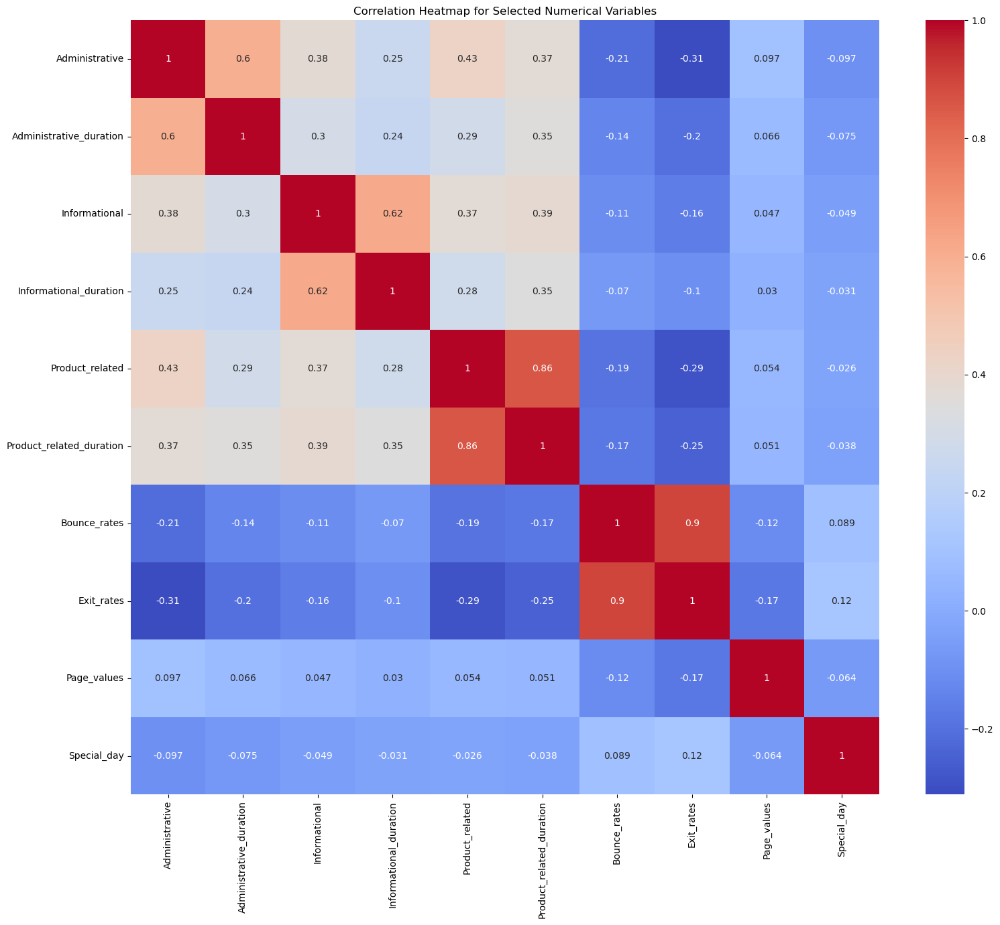

In [ ]:
plt.figure(figsize=(18, 15))

# Drawing the heatmap for the numerical columns
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm")

plt.title("Correlation Heatmap for Selected Numerical Variables")
plt.show()

In [ ]:
spearman_correlations_sorted_top = spearman_correlations_sorted[abs(spearman_correlations_sorted) > 0.33]
spearman_correlations_sorted_top

Page_values    0.491894
dtype: float64

### Scatter plots

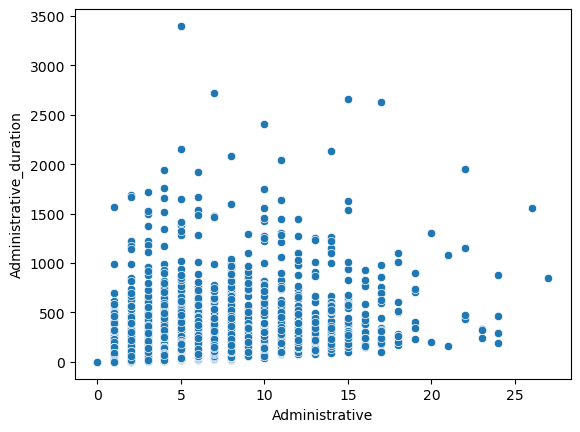

In [ ]:
sns.scatterplot(data=df_bivariate, x='Administrative', y='Administrative_duration')
plt.show()

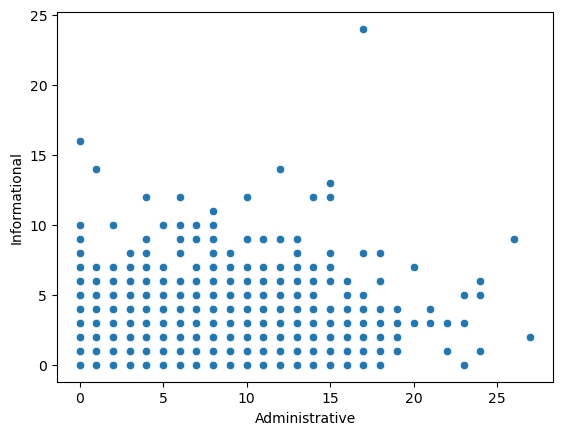

In [ ]:
sns.scatterplot(data=df_bivariate, x='Administrative', y='Informational')
plt.show()

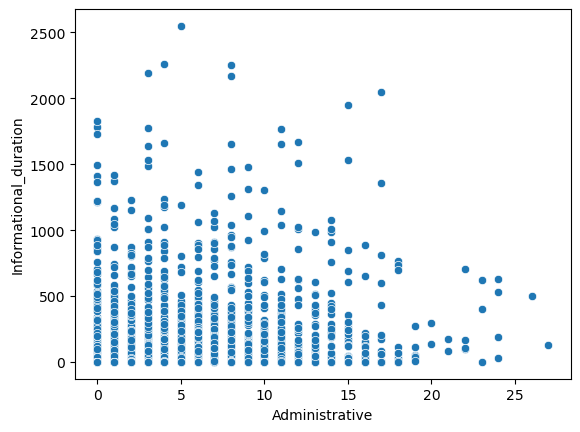

In [ ]:
sns.scatterplot(data=df_bivariate, x='Administrative', y='Informational_duration')
plt.show()

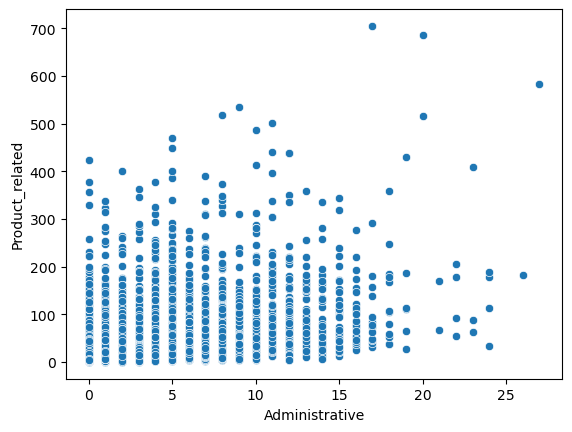

In [ ]:
sns.scatterplot(data=df_bivariate, x='Administrative', y='Product_related')
plt.show()

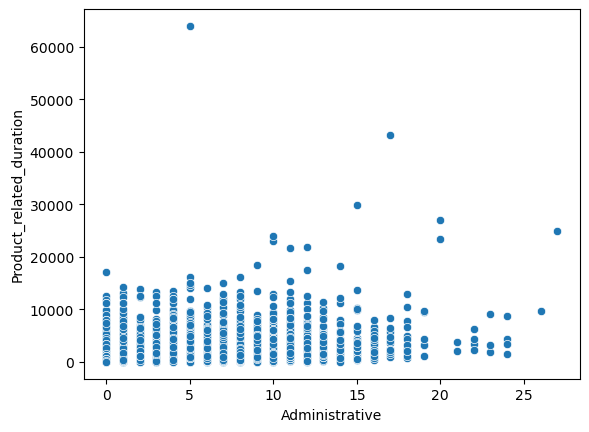

In [ ]:
sns.scatterplot(data=df_bivariate, x='Administrative', y='Product_related_duration')
plt.show()

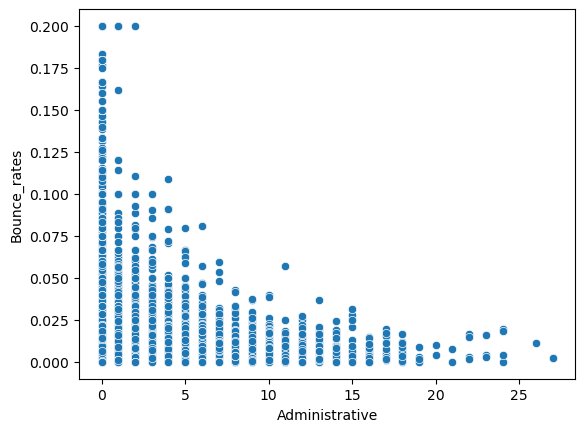

In [ ]:
sns.scatterplot(data=df_bivariate, x='Administrative', y='Bounce_rates')
plt.show()

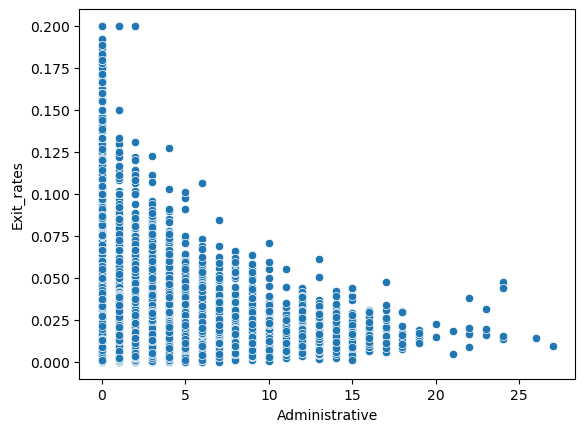

In [ ]:
sns.scatterplot(data=df_bivariate, x='Administrative', y='Exit_rates')
plt.show()

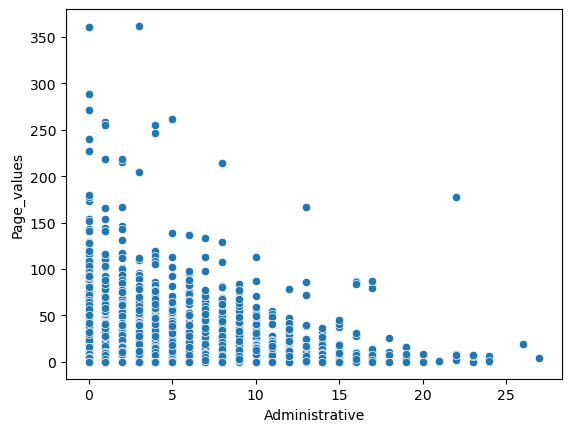

In [ ]:
sns.scatterplot(data=df_bivariate, x='Administrative', y='Page_values')
plt.show()

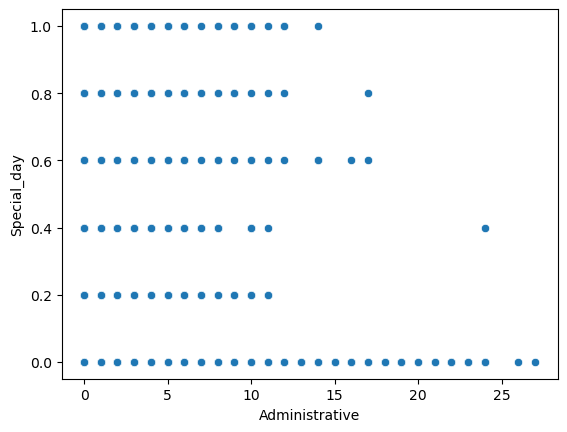

In [ ]:
sns.scatterplot(data=df_bivariate, x='Administrative', y='Special_day')
plt.show()

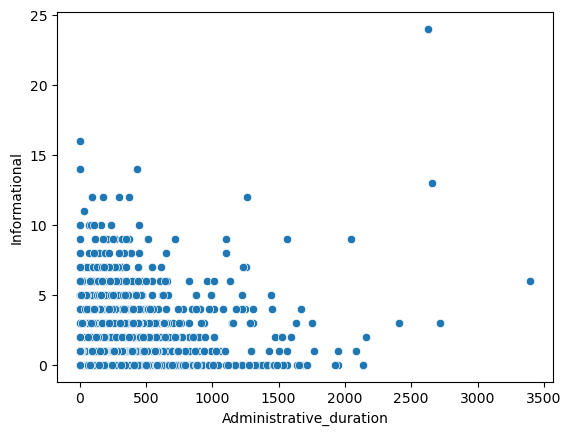

In [ ]:
sns.scatterplot(data=df_bivariate, x='Administrative_duration', y='Informational')
plt.show()

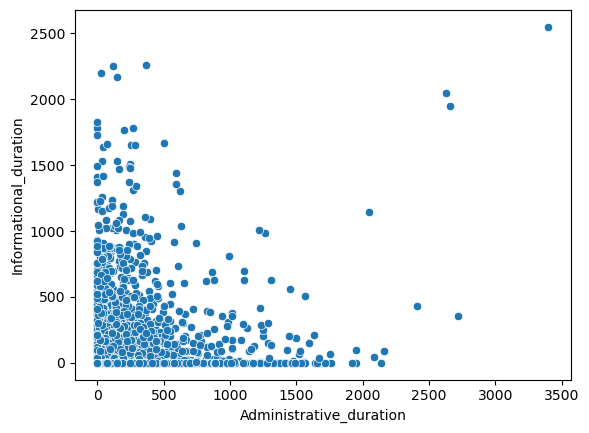

In [ ]:
sns.scatterplot(data=df_bivariate, x='Administrative_duration', y='Informational_duration')
plt.show()

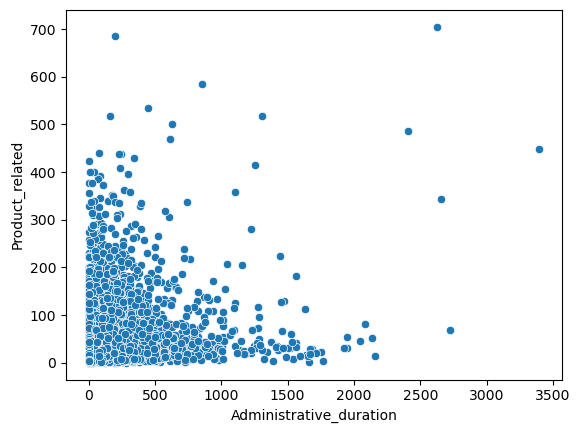

In [ ]:
sns.scatterplot(data=df_bivariate, x='Administrative_duration', y='Product_related')
plt.show()

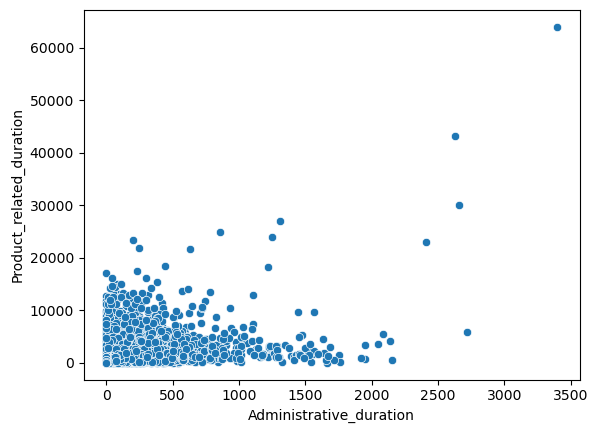

In [ ]:
sns.scatterplot(data=df_bivariate, x='Administrative_duration', y='Product_related_duration')
plt.show()

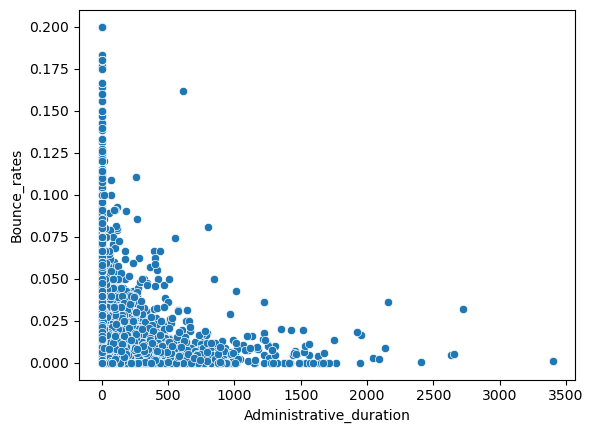

In [ ]:
sns.scatterplot(data=df_bivariate, x='Administrative_duration', y='Bounce_rates')
plt.show()

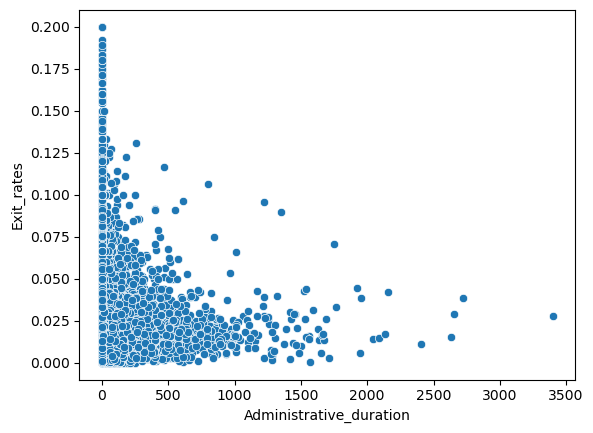

In [ ]:
sns.scatterplot(data=df_bivariate, x='Administrative_duration', y='Exit_rates')
plt.show()

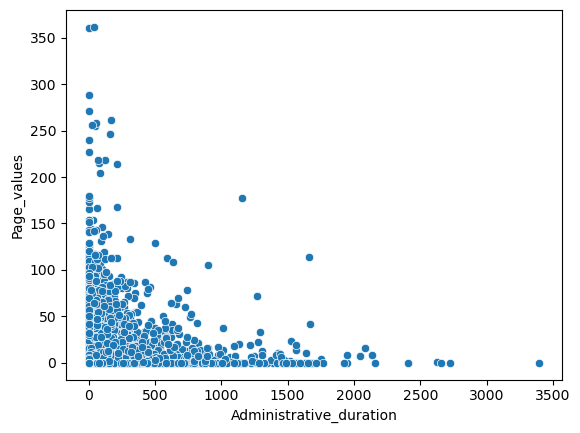

In [ ]:
sns.scatterplot(data=df_bivariate, x='Administrative_duration', y='Page_values')
plt.show()

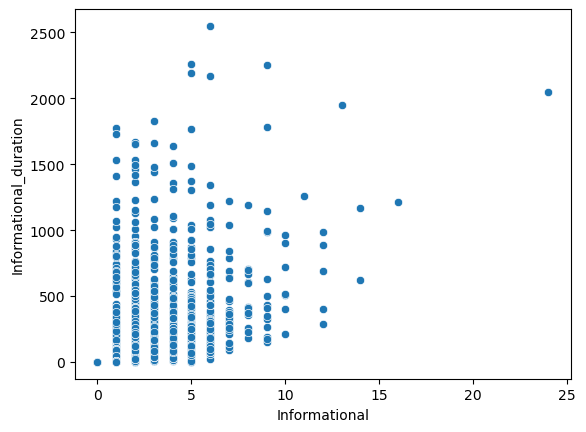

In [ ]:
sns.scatterplot(data=df_bivariate, x='Informational', y='Informational_duration')
plt.show()

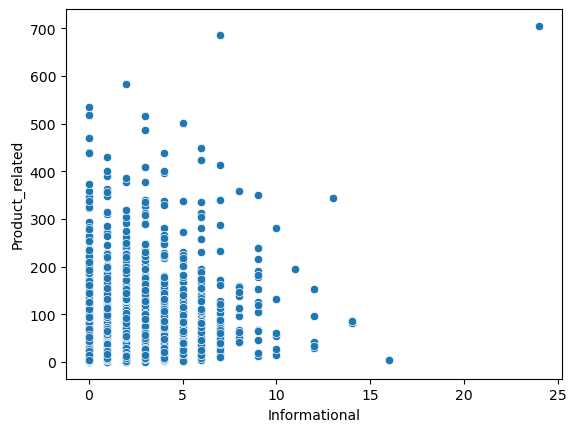

In [ ]:
sns.scatterplot(data=df_bivariate, x='Informational', y='Product_related')
plt.show()

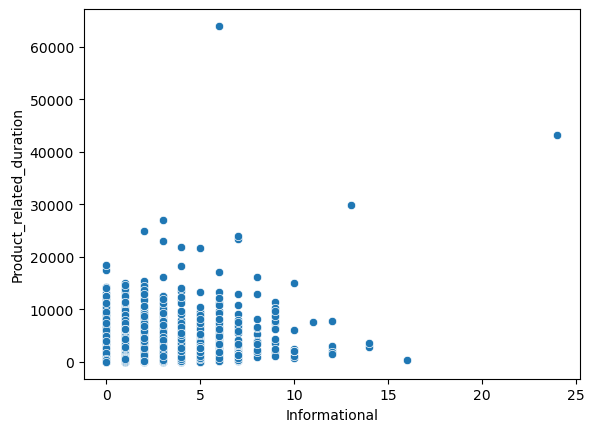

In [ ]:
sns.scatterplot(data=df_bivariate, x='Informational', y='Product_related_duration')
plt.show()

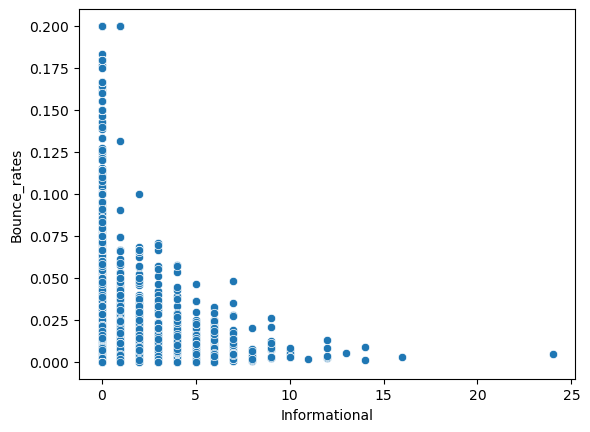

In [ ]:
sns.scatterplot(data=df_bivariate, x='Informational', y='Bounce_rates')
plt.show()

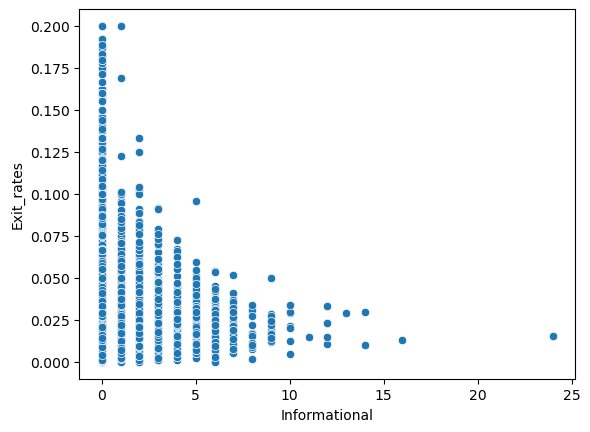

In [ ]:
sns.scatterplot(data=df_bivariate, x='Informational', y='Exit_rates')
plt.show()

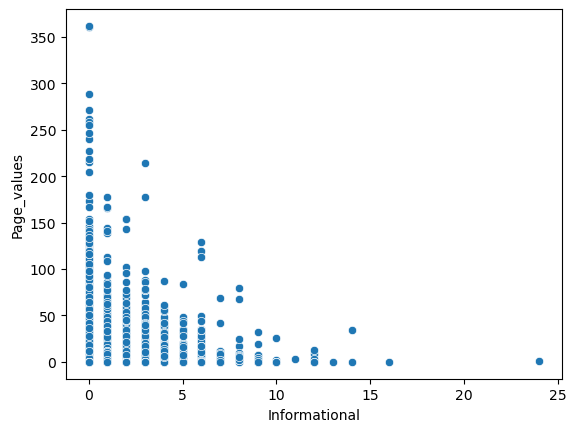

In [ ]:
sns.scatterplot(data=df_bivariate, x='Informational', y='Page_values')
plt.show()

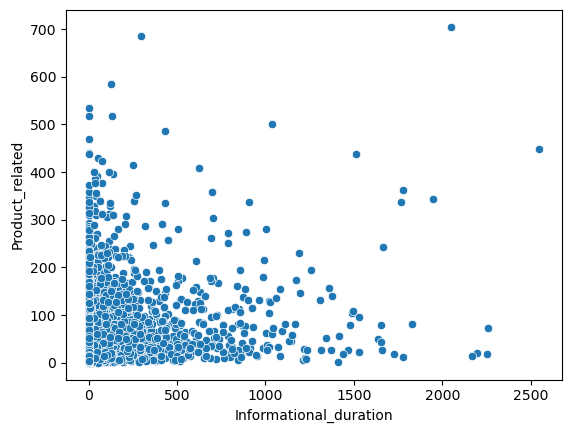

In [ ]:
sns.scatterplot(data=df_bivariate, x='Informational_duration', y='Product_related')
plt.show()

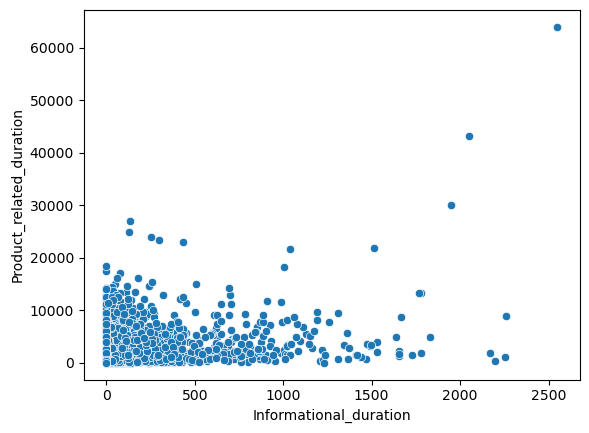

In [ ]:
sns.scatterplot(data=df_bivariate, x='Informational_duration', y='Product_related_duration')
plt.show()

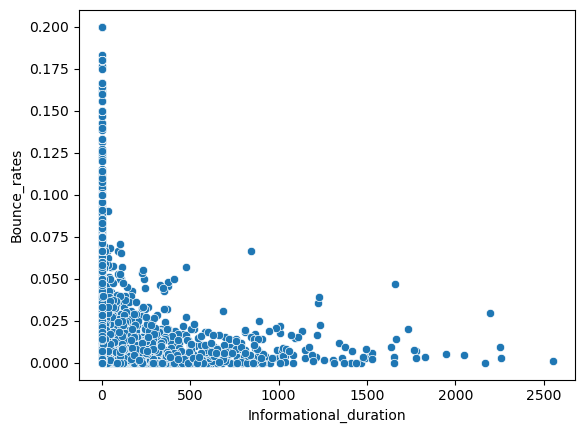

In [ ]:
sns.scatterplot(data=df_bivariate, x='Informational_duration', y='Bounce_rates')
plt.show()

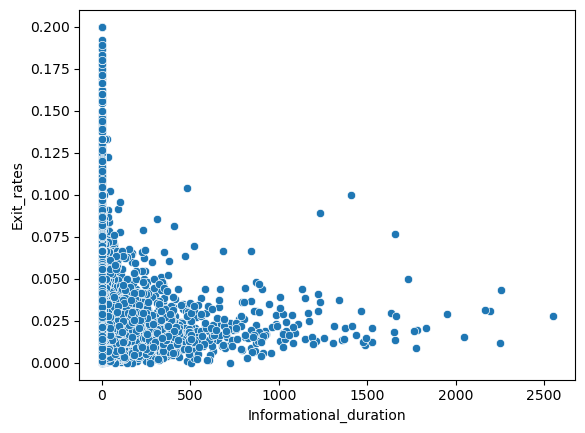

In [ ]:
sns.scatterplot(data=df_bivariate, x='Informational_duration', y='Exit_rates')
plt.show()

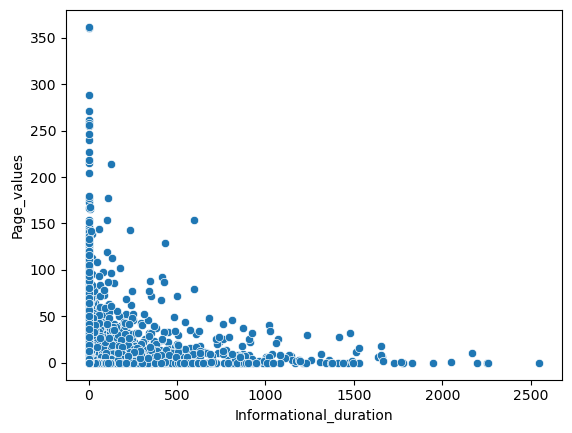

In [ ]:
sns.scatterplot(data=df_bivariate, x='Informational_duration', y='Page_values')
plt.show()

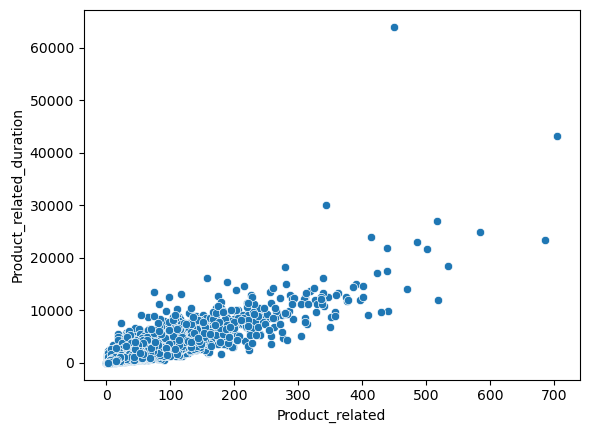

In [ ]:
sns.scatterplot(data=df_bivariate, x='Product_related', y='Product_related_duration')
plt.show()

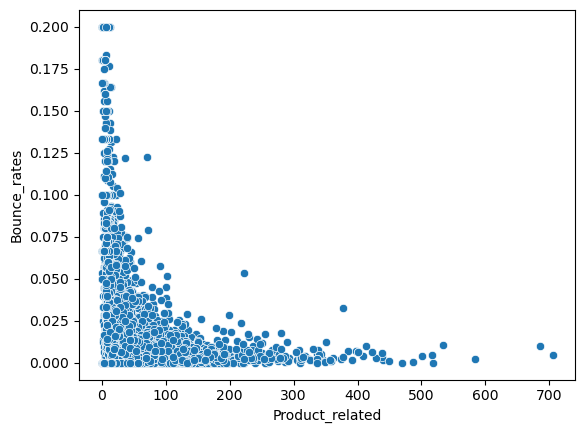

In [ ]:
sns.scatterplot(data=df_bivariate, x='Product_related', y='Bounce_rates')
plt.show()

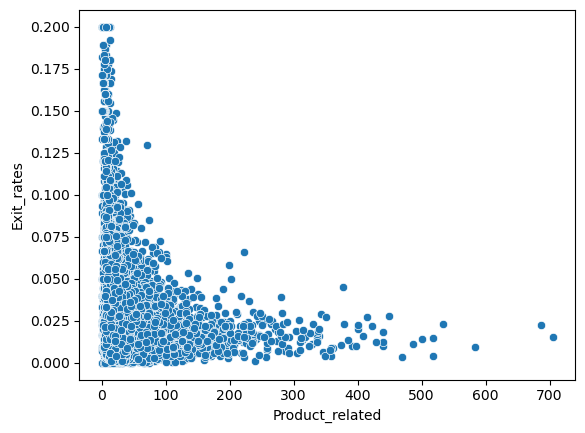

In [ ]:
sns.scatterplot(data=df_bivariate, x='Product_related', y='Exit_rates')
plt.show()

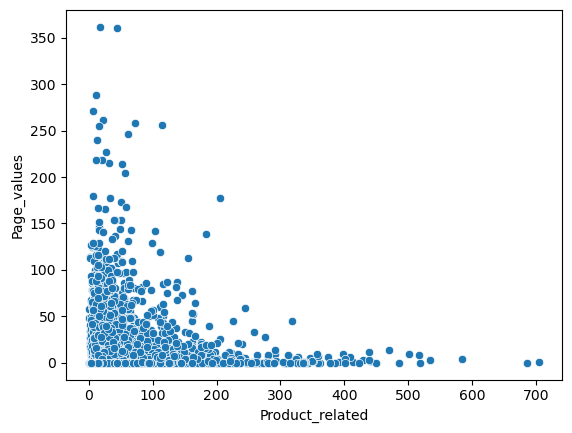

In [ ]:
sns.scatterplot(data=df_bivariate, x='Product_related', y='Page_values')
plt.show()

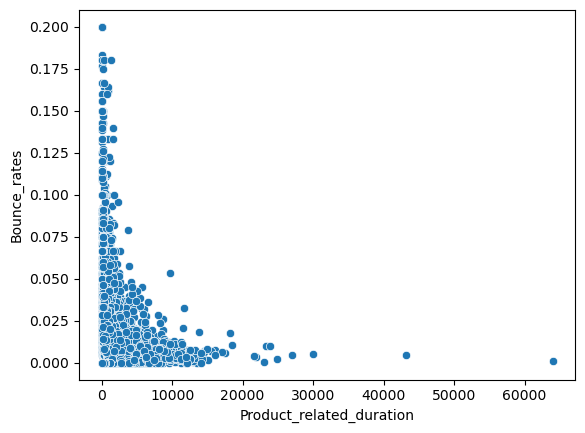

In [ ]:
sns.scatterplot(data=df_bivariate, x='Product_related_duration', y='Bounce_rates')
plt.show()

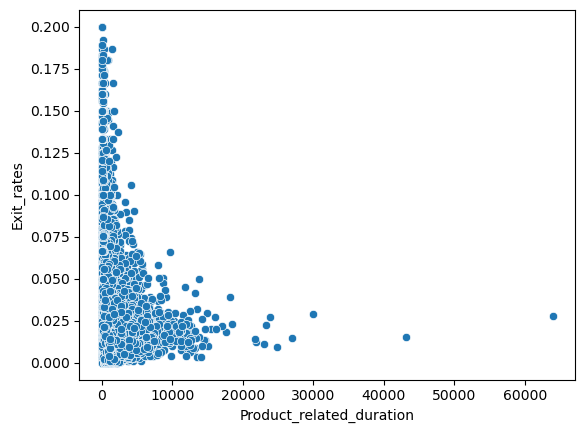

In [ ]:
sns.scatterplot(data=df_bivariate, x='Product_related_duration', y='Exit_rates')
plt.show()

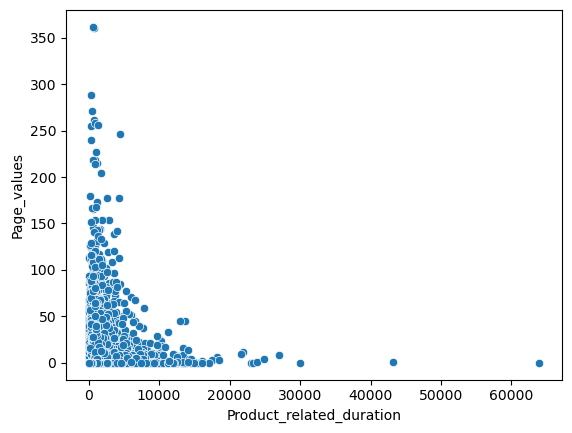

In [ ]:
sns.scatterplot(data=df_bivariate, x='Product_related_duration', y='Page_values')
plt.show()

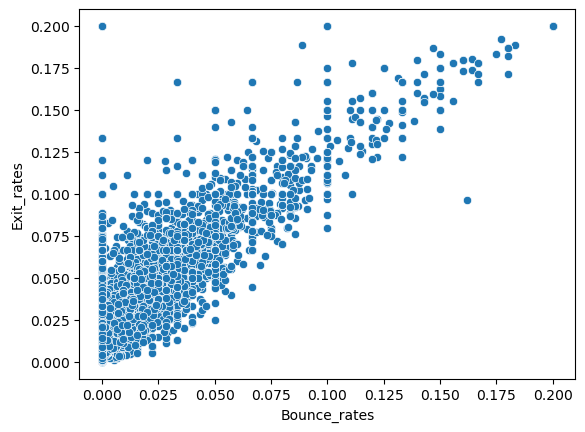

In [ ]:
sns.scatterplot(data=df_bivariate, x='Bounce_rates', y='Exit_rates')
plt.show()

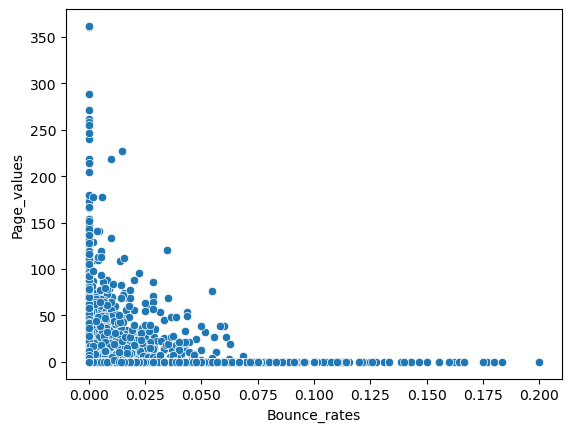

In [ ]:
sns.scatterplot(data=df_bivariate, x='Bounce_rates', y='Page_values')
plt.show()

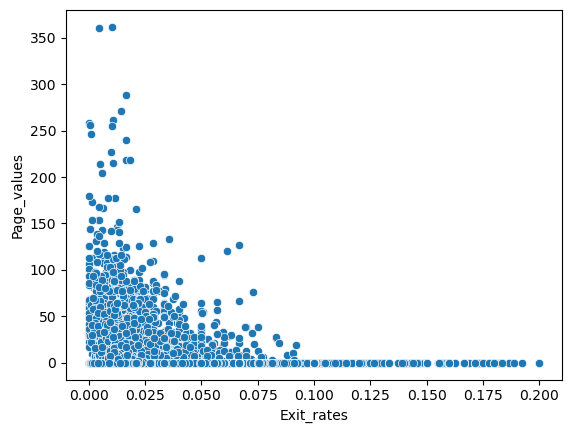

In [ ]:
sns.scatterplot(data=df_bivariate, x='Exit_rates', y='Page_values')
plt.show()

### Line plots

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\316967624.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Special_day', y='Page_values', data=df_bivariate, ci=None)


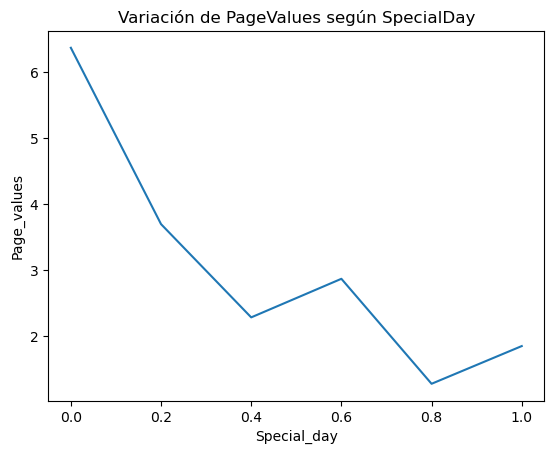

In [ ]:
sns.lineplot(x='Special_day', y='Page_values', data=df_bivariate, ci=None)
plt.title('Variación de PageValues según SpecialDay')
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2452694475.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Informational_duration', y='Page_values', data=df_bivariate, ci=None)


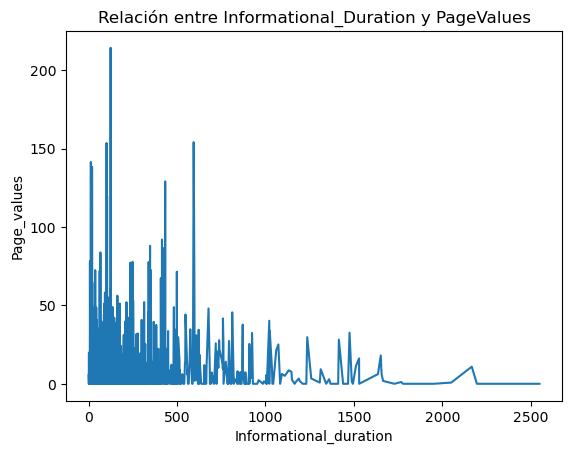

In [ ]:
sns.lineplot(x='Informational_duration', y='Page_values', data=df_bivariate, ci=None)
plt.title('Relación entre Informational_Duration y PageValues')
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\4016483221.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Product_related_duration', y='Exit_rates', data=df_bivariate, ci=None)


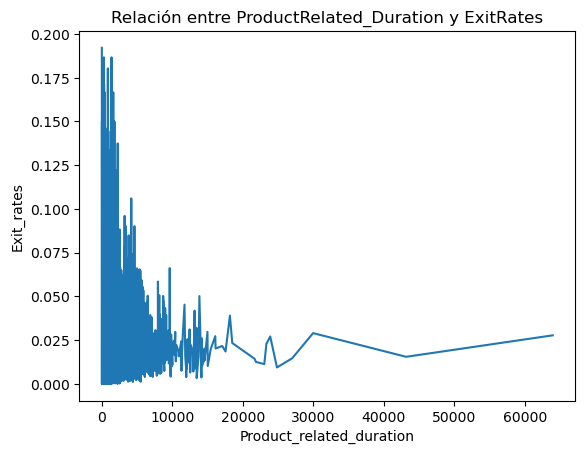

In [ ]:
sns.lineplot(x='Product_related_duration', y='Exit_rates', data=df_bivariate, ci=None)
plt.title('Relación entre ProductRelated_Duration y ExitRates')
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\3016991697.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Administrative_duration', y='Bounce_rates', data=df_bivariate, ci=None)


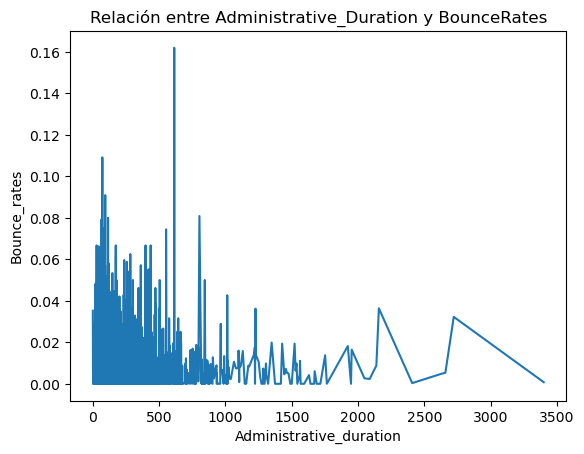

In [ ]:
sns.lineplot(x='Administrative_duration', y='Bounce_rates', data=df_bivariate, ci=None)
plt.title('Relación entre Administrative_Duration y BounceRates')
plt.show()

### QQ Plot

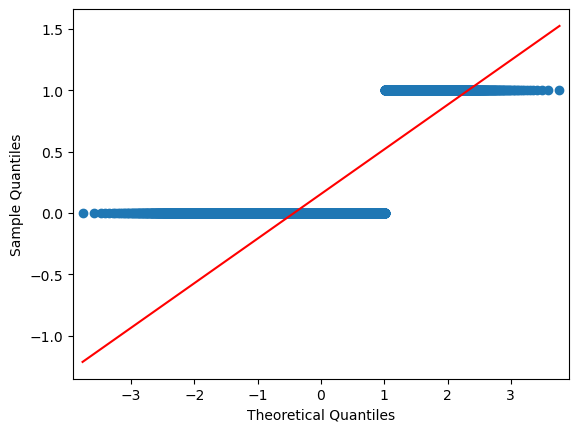

In [ ]:
import statsmodels.api as sm

# Generating a Q-Q plot for 'SalePrice' to check if its distribution follows a normal distribution
sm.qqplot(df_bivariate['Revenue'], line='s');
plt.show()

### Jointplots

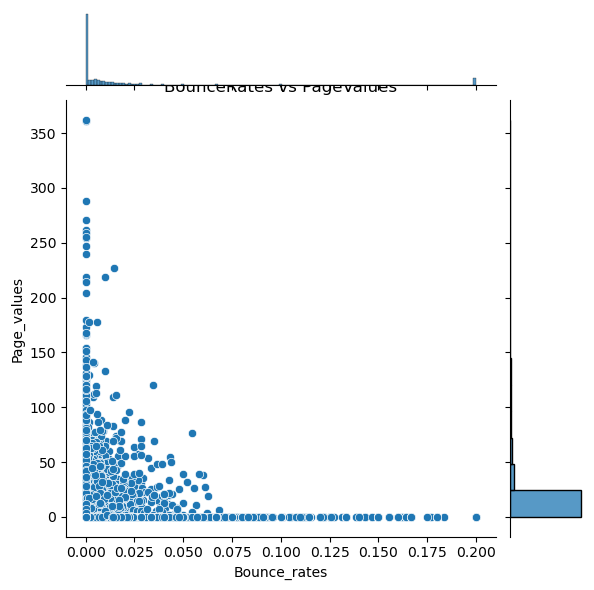

In [ ]:
sns.jointplot(x='Bounce_rates', y='Page_values', data=df_bivariate, kind='scatter')
plt.title('BounceRates vs PageValues')
plt.show()

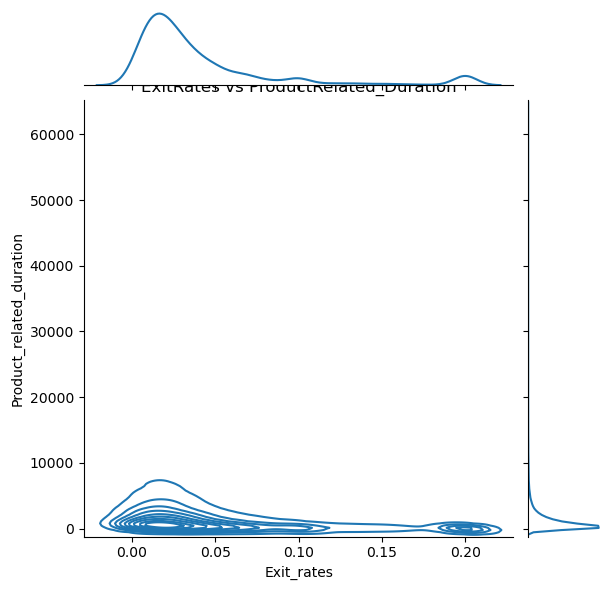

In [ ]:
sns.jointplot(x='Exit_rates', y='Product_related_duration', data=df_bivariate, kind='kde')
plt.title('ExitRates vs ProductRelated_Duration')
plt.show()

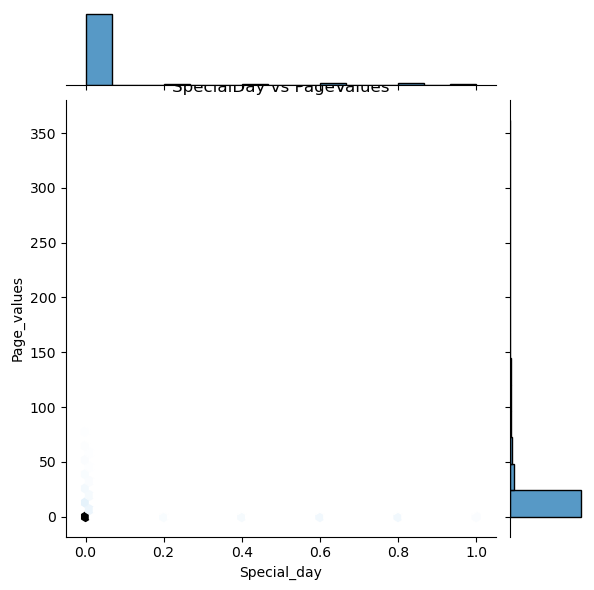

In [ ]:
sns.jointplot(x='Special_day', y='Page_values', data=df_bivariate, kind='hex')
plt.title('SpecialDay vs PageValues')
plt.show()

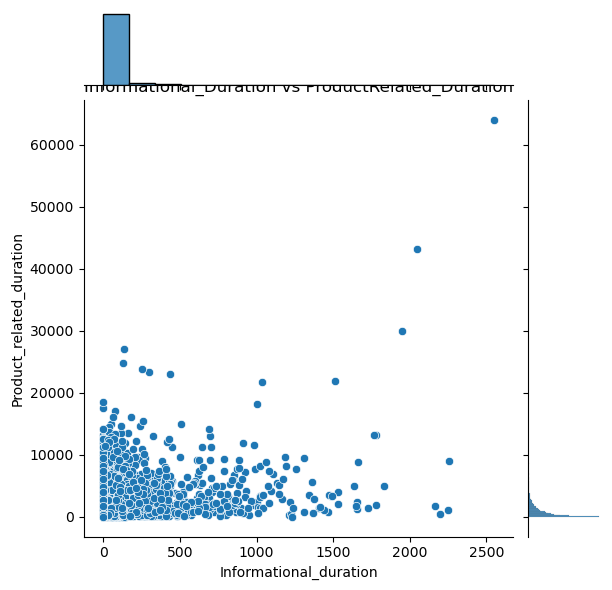

In [ ]:
sns.jointplot(x='Informational_duration', y='Product_related_duration', data=df_bivariate, kind='scatter')
plt.title('Informational_Duration vs ProductRelated_Duration')
plt.show()

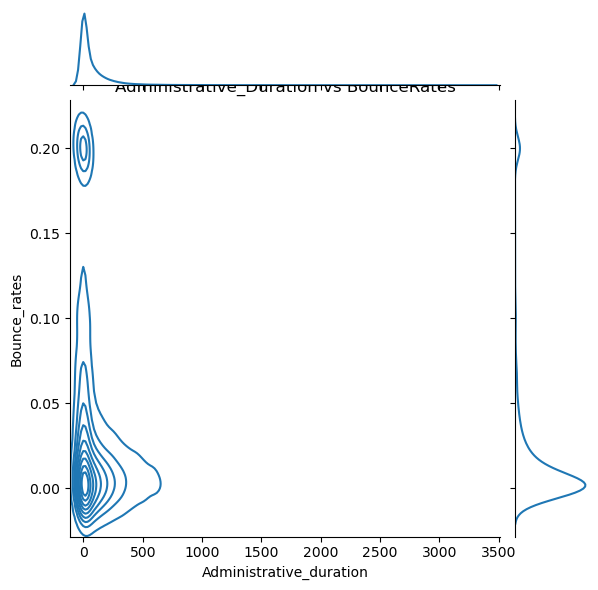

In [ ]:
sns.jointplot(x='Administrative_duration', y='Bounce_rates', data=df_bivariate, kind='kde')
plt.title('Administrative_Duration vs BounceRates')
plt.show()

### Pairplots

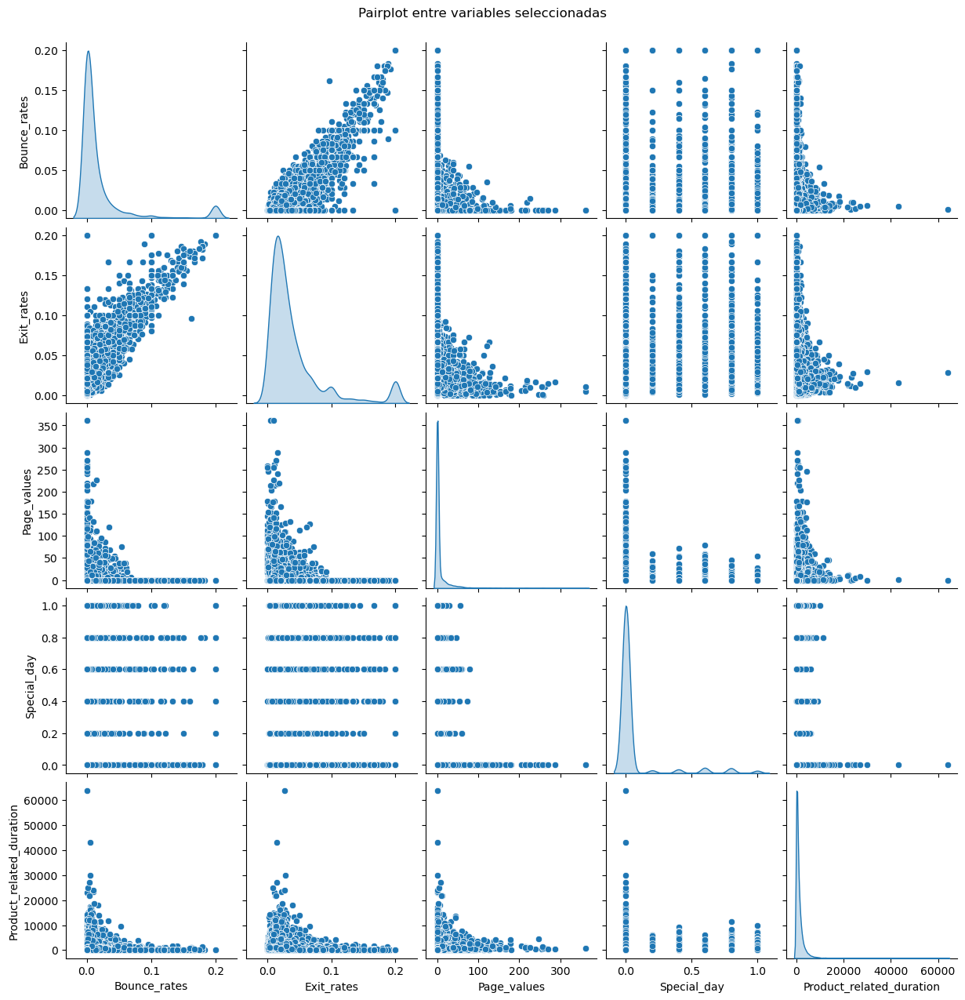

In [ ]:
selected_columns = ['Bounce_rates', 'Exit_rates', 'Page_values', 'Special_day', 'Product_related_duration']

# Crear el pairplot
sns.pairplot(df_bivariate[selected_columns], diag_kind='kde')
plt.suptitle('Pairplot entre variables seleccionadas', y=1.02)
plt.show()

### Probabilitiy

In [ ]:
from scipy.stats import uniform

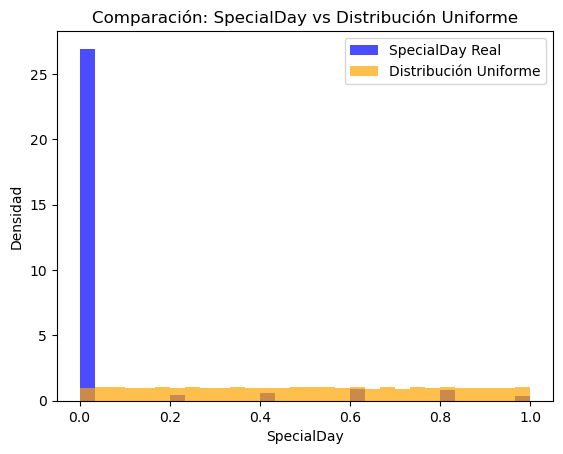

In [ ]:
sample_size = len(df_bivariate)  
data_uniform = uniform.rvs(size=sample_size, loc=0, scale=1)

# Histograma de SpecialDay real
plt.hist(df_bivariate['Special_day'], bins=30, alpha=0.7, label='SpecialDay Real', density=True, color='blue')

# Histograma de datos simulados uniformes
plt.hist(data_uniform, bins=30, alpha=0.7, label='Distribución Uniforme', density=True, color='orange')

plt.title('Comparación: SpecialDay vs Distribución Uniforme')
plt.xlabel('SpecialDay')
plt.ylabel('Densidad')
plt.legend()
plt.show()

In [ ]:
# Simular visitas aleatorias y compararlas con las tasas reales, como BounceRates o ExitRates.

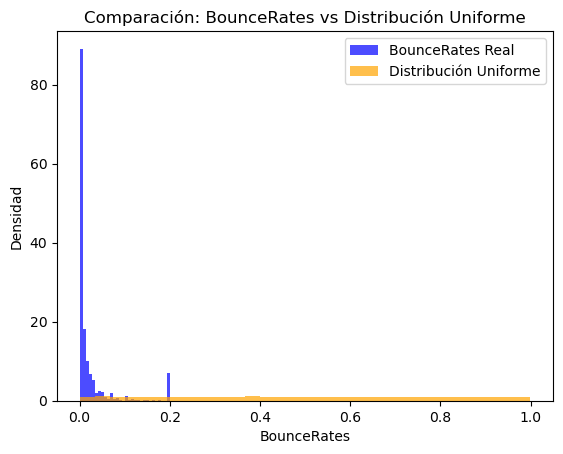

In [ ]:
data_uniform_bounce = uniform.rvs(size=len(df_bivariate), loc=0, scale=1)

# Histograma de BounceRates real
plt.hist(df_bivariate['Bounce_rates'], bins=30, alpha=0.7, label='BounceRates Real', density=True, color='blue')

# Histograma de datos uniformes
plt.hist(data_uniform_bounce, bins=30, alpha=0.7, label='Distribución Uniforme', density=True, color='orange')

plt.title('Comparación: BounceRates vs Distribución Uniforme')
plt.xlabel('BounceRates')
plt.ylabel('Densidad')
plt.legend()
plt.show()

In [ ]:
# 3. Determinar si ciertas métricas del dataset tienen un comportamiento aleatorio sin patrones específicos.

In [ ]:
from scipy.stats import kstest

In [ ]:
numeric_columns = ['Bounce_rates', 'Exit_rates', 'Special_day']

for col in numeric_columns:
    # Prueba KS para comparar la columna con una distribución uniforme
    uniform_test = kstest(df_bivariate[col], 'uniform', args=(0, 1))
    print(f"Variable: {col}")
    print(f"  KS Statistic: {uniform_test.statistic}")
    print(f"  p-value: {uniform_test.pvalue}")
    print()

Variable: Bounce_rates
  KS Statistic: 0.8576266554088489
  p-value: 0.0

Variable: Exit_rates
  KS Statistic: 0.8191315034821794
  p-value: 0.0

Variable: Special_day
  KS Statistic: 0.8976648914379353
  p-value: 0.0



In [ ]:
# Usar datos uniformes como un modelo base para comparar con datos reales o para validar algoritmos.

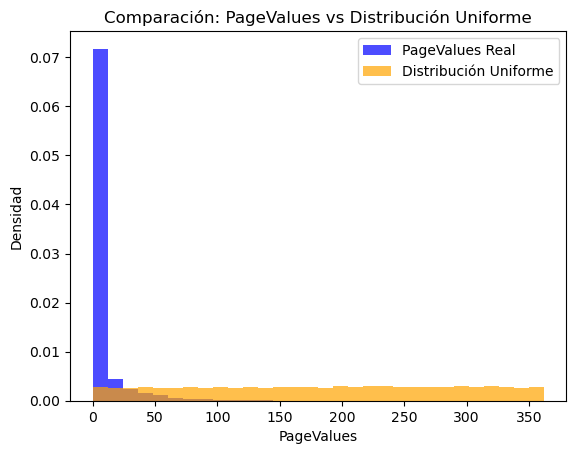

In [ ]:
data_uniform_pagevalues = uniform.rvs(size=len(df_bivariate), loc=0, scale=df_bivariate['Page_values'].max())

# Histograma comparativo
plt.hist(df_bivariate['Page_values'], bins=30, alpha=0.7, label='PageValues Real', density=True, color='blue')
plt.hist(data_uniform_pagevalues, bins=30, alpha=0.7, label='Distribución Uniforme', density=True, color='orange')

plt.title('Comparación: PageValues vs Distribución Uniforme')
plt.xlabel('PageValues')
plt.ylabel('Densidad')
plt.legend()
plt.show()

# Distribucion Exponencial.

1.Tiempo Entre Clics o Interacciones
Si tienes una métrica que mide el tiempo entre clics en distintas páginas, podrías modelarlo como una distribución exponencial.
Ejemplo:
Calcular el tiempo promedio entre páginas (Administrative_Duration, Informational_Duration, ProductRelated_Duration) y ajustar una distribución exponencial.

In [ ]:
from scipy.stats import expon

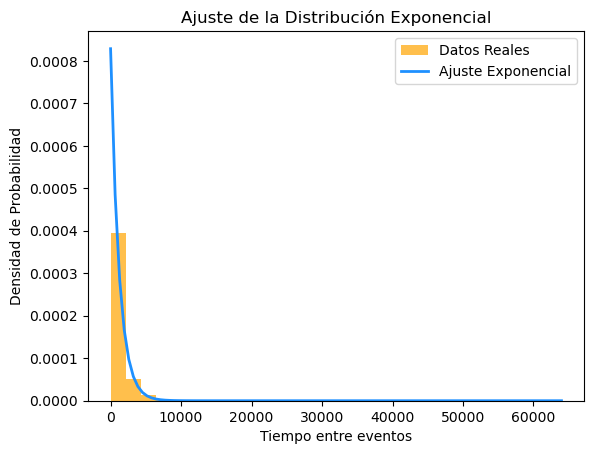

In [ ]:
time_between_events = df_bivariate['Product_related_duration']

# Ajustar la distribución exponencial
lambda_hat = 1 / time_between_events.mean()  # Estimación de lambda
x = np.linspace(0, time_between_events.max(), 100)
pdf = expon.pdf(x, scale=1/lambda_hat)

# Gráfica de la distribución ajustada
plt.hist(time_between_events, bins=30, density=True, alpha=0.7, label='Datos Reales', color='orange')
plt.plot(x, pdf, color='dodgerblue', lw=2, label='Ajuste Exponencial')
plt.xlabel('Tiempo entre eventos')
plt.ylabel('Densidad de Probabilidad')
plt.title('Ajuste de la Distribución Exponencial')
plt.legend()
plt.show()

2. Modelar el Tiempo Hasta una Conversión
Si estás analizando cuánto tiempo pasa un usuario navegando antes de realizar una conversión (Revenue=True), podrías usar una distribución exponencial para modelar ese tiempo.

C:\Users\julyj\AppData\Local\Temp\ipykernel_25988\2415707830.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  converted_users['Total_duration'] = (


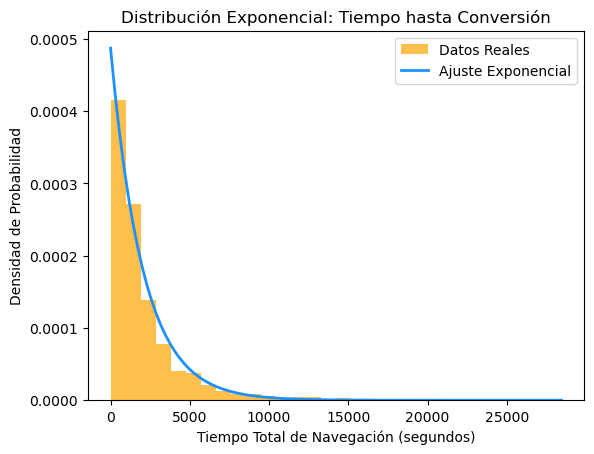

Parámetro estimado λ: 0.0005


In [ ]:
converted_users = df_bivariate[df_bivariate['Revenue'] == True]

# Calcular el tiempo total de navegación
converted_users['Total_duration'] = (
    converted_users['Administrative_duration'] +
    converted_users['Informational_duration'] +
    converted_users['Product_related_duration']
)

# Extraer los tiempos totales de navegación
time_to_conversion = converted_users['Total_duration']

# Ajustar una distribución exponencial
lambda_hat = 1 / time_to_conversion.mean()  # Estimación de lambda
x = np.linspace(0, time_to_conversion.max(), 100)
pdf = expon.pdf(x, scale=1/lambda_hat)

# Graficar la distribución real y el ajuste exponencial
plt.hist(time_to_conversion, bins=30, density=True, alpha=0.7, label='Datos Reales', color='orange')
plt.plot(x, pdf, color='dodgerblue', lw=2, label='Ajuste Exponencial')
plt.xlabel('Tiempo Total de Navegación (segundos)')
plt.ylabel('Densidad de Probabilidad')
plt.title('Distribución Exponencial: Tiempo hasta Conversión')
plt.legend()
plt.show()

# Mostrar el parámetro estimado
print(f"Parámetro estimado λ: {lambda_hat:.4f}")

2. . Evaluar el Ajuste de tus Datos a un Modelo
Al comparar los datos reales (ProductRelated_Duration) con una distribución exponencial simulada, estás evaluando si tus datos siguen un patrón esperado o una hipótesis.

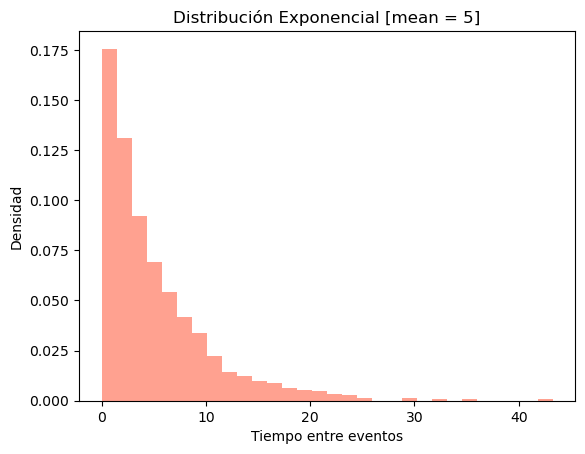

In [ ]:
scale = 5  # Tiempo promedio entre eventos
sample_size = 1000  # Tamaño de la muestra

# Generar datos simulados de la distribución exponencial
data_expon = expon.rvs(scale=scale, size=sample_size)

data_expon = expon.rvs(scale=scale, size=sample_size)

# Graficar el histograma de los datos simulados
plt.hist(data_expon, bins=30, density=True, alpha=0.6, color='tomato')
plt.title('Distribución Exponencial [mean = 5]')
plt.xlabel('Tiempo entre eventos')
plt.ylabel('Densidad')
plt.show()

### Distribucion Normal

1. Analizar el Tiempo Total en Páginas

In [ ]:
from scipy.stats import norm

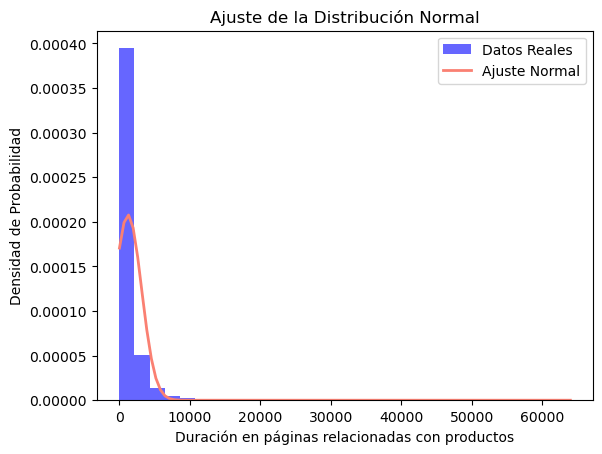

In [ ]:
durations = df_bivariate['Product_related_duration']

# Parámetros de la normal ajustada
mu = durations.mean()
sigma = durations.std()

# Crear valores x para la distribución normal
x_normal = np.linspace(durations.min(), durations.max(), 100)
pdf_normal = norm.pdf(x_normal, mu, sigma)

# Graficar la distribución real vs la ajustada
plt.hist(durations, bins=30, density=True, alpha=0.6, label='Datos Reales', color='blue')
plt.plot(x_normal, pdf_normal, color='salmon', lw=2, label='Ajuste Normal')
plt.xlabel('Duración en páginas relacionadas con productos')
plt.ylabel('Densidad de Probabilidad')
plt.title('Ajuste de la Distribución Normal')
plt.legend()
plt.show()

2. Calcular Probabilidades
Una vez ajustada la distribución normal, puedes calcular probabilidades específicas. Por ejemplo:

Probabilidad de que un usuario pase más de 300 segundos en páginas de productos:
python
Copy code


In [ ]:
prob = 1 - norm.cdf(300, mu, sigma)
print(f"Probabilidad de más de 300 segundos: {prob}")

Probabilidad de más de 300 segundos: 0.6817096007801393


3. Comparar Grupos
Usa la distribución normal para comparar cómo se comportan diferentes grupos:

Usuarios Convertidos (Revenue=True) vs No Convertidos (Revenue=False)
Ajusta distribuciones normales separadas para ambos grupos.
Compara sus medias y dispersiones.

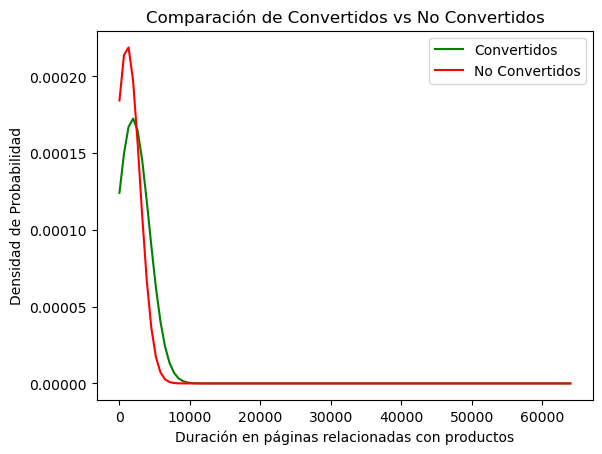

In [ ]:
converted = df_bivariate[df_bivariate['Revenue'] == True]['Product_related_duration']
not_converted = df_bivariate[df_bivariate['Revenue'] == False]['Product_related_duration']

# Parámetros para ambos grupos
mu_converted, sigma_converted = converted.mean(), converted.std()
mu_not_converted, sigma_not_converted = not_converted.mean(), not_converted.std()

# Graficar las distribuciones
x = np.linspace(df_bivariate['Product_related_duration'].min(), df_bivariate['Product_related_duration'].max(), 100)

plt.plot(x, norm.pdf(x, mu_converted, sigma_converted), label='Convertidos', color='green')
plt.plot(x, norm.pdf(x, mu_not_converted, sigma_not_converted), label='No Convertidos', color='red')
plt.xlabel('Duración en páginas relacionadas con productos')
plt.ylabel('Densidad de Probabilidad')
plt.title('Comparación de Convertidos vs No Convertidos')
plt.legend()
plt.show()

4. Evaluar Suposiciones

In [ ]:
from scipy.stats import shapiro

# Asegurarse de que no hay valores nulos en la columna
data = df_bivariate['Product_related_duration'].dropna()

# Realizar el Shapiro-Wilk Test
stat, p_value = shapiro(data)
print(f"Shapiro-Wilk Test: p-value = {p_value}")

Shapiro-Wilk Test: p-value = 6.548757962309597e-100


c:\Users\julyj\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 12205.
  res = hypotest_fun_out(*samples, **kwds)


### Hypothesis Testing

In [ ]:
import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as st
import statsmodels.api as sm
import statsmodels.formula.api as smf

Preguntas: 

Para aplicar pruebas de hipótesis, primero necesitas identificar las preguntas a responder. Algunas ideas basadas en el dataset:

Duraciones: ¿Los compradores (Revenue=True) pasan más tiempo en páginas de productos que los no compradores?
Tasas de Rebote: ¿Las tasas de rebote (BounceRates) son diferentes entre fines de semana y días laborables?
Duración en Páginas: ¿El tiempo promedio en páginas administrativas es igual a un valor específico?

A. Z-Test: Comparar con un Valor Hipotético
Escenario:
¿El tiempo promedio en ProductRelated_Duration de los compradores es significativamente mayor a 300 segundos?

In [ ]:

# Datos
buyers = df_bivariate[df_bivariate['Revenue'] == True]['Product_related_duration'].dropna()
sample_mean = buyers.mean()
pop_mean = 300  # Valor hipotético
pop_std = buyers.std()  # Aproximamos usando desviación estándar muestral
n = len(buyers)

# Estadístico z
z_stat = (sample_mean - pop_mean) / (pop_std / (n**0.5))
p_value = 1 - norm.cdf(z_stat)  # Right-tailed test

# Resultado
alpha = 0.05
print(f"Z-Statistic: {z_stat:.2f}")
print(f"P-Value: {p_value:.4f}")

if p_value < alpha:
    print("Reject H0: The average ProductRelated_Duration is significantly greater than 300 seconds.")
else:
    print("Fail to Reject H0: No significant difference from 300 seconds.")

Z-Statistic: 29.78
P-Value: 0.0000
Reject H0: The average ProductRelated_Duration is significantly greater than 300 seconds.


B.  t-Test de Dos Muestras
Escenario:
¿La tasa de rebote (BounceRates) difiere entre fines de semana y días laborables?

In [ ]:
from scipy.stats import ttest_ind

# Datos
weekend = df_bivariate[df_bivariate['Weekend'] == True]['Bounce_rates'].dropna()
weekday = df_bivariate[df_bivariate['Weekend'] == False]['Bounce_rates'].dropna()

# t-Test
t_stat, p_value = ttest_ind(weekend, weekday, equal_var=False)

# Resultado
alpha = 0.05
print(f"T-Statistic: {t_stat:.2f}")
print(f"P-Value: {p_value:.4f}")

if p_value < alpha:
    print("Reject H0: There is a significant difference in BounceRates between weekends and weekdays.")
else:
    print("Fail to Reject H0: No significant difference in BounceRates between weekends and weekdays.")

T-Statistic: -4.07
P-Value: 0.0000
Reject H0: There is a significant difference in BounceRates between weekends and weekdays.


C. ANOVA: Comparar Múltiples Grupos
Escenario:
¿ExitRates difiere significativamente entre diferentes tipos de tráfico (TrafficType)?

In [ ]:
from scipy.stats import f_oneway

# Separar por grupos
groups = [df_bivariate[df_bivariate['Traffic_type_label'] == t]['Exit_rates'].dropna() for t in df_bivariate['Traffic_type_label'].unique()]

# ANOVA
f_stat, p_value = f_oneway(*groups)

# Resultado
alpha = 0.05
print(f"F-Statistic: {f_stat:.2f}")
print(f"P-Value: {p_value:.4f}")

if p_value < alpha:
    print("Reject H0: At least one TrafficType has significantly different ExitRates.")
else:
    print("Fail to Reject H0: No significant difference among TrafficType groups.")

F-Statistic: 141.50
P-Value: 0.0000
Reject H0: At least one TrafficType has significantly different ExitRates.


D. t-Test Pareado
Escenario:
¿Hay una diferencia significativa entre el tiempo en páginas informativas (Informational_Duration) y páginas administrativas (Administrative_Duration) para compradores?

In [ ]:
from scipy.stats import ttest_rel

# Datos
buyers = df_bivariate[df_bivariate['Revenue'] == True]
info = buyers['Informational_duration'].dropna()
admin = buyers['Administrative_duration'].dropna()

# t-Test Pareado
t_stat, p_value = ttest_rel(info, admin)

# Resultado
alpha = 0.05
print(f"T-Statistic: {t_stat:.2f}")
print(f"P-Value: {p_value:.4f}")

if p_value < alpha:
    print("Reject H0: There is a significant difference between Informational and Administrative durations.")
else:
    print("Fail to Reject H0: No significant difference between durations.")

T-Statistic: -11.58
P-Value: 0.0000
Reject H0: There is a significant difference between Informational and Administrative durations.


3. Visualización de Resultados
Escenario:
Visualiza una prueba de hipótesis (e.g., 
𝑡
t-test).

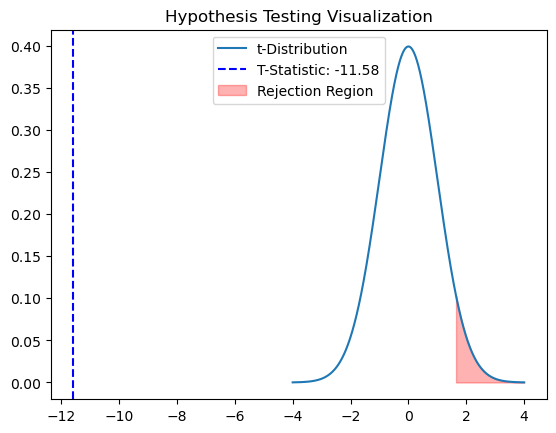

In [ ]:
from scipy.stats import t

# Gráfico de distribución t con región de rechazo
x = np.linspace(-4, 4, 1000)
y = t.pdf(x, df=len(weekend) + len(weekday) - 2)

plt.plot(x, y, label="t-Distribution")
plt.axvline(t_stat, color='blue', linestyle='--', label=f'T-Statistic: {t_stat:.2f}')
plt.title("Hypothesis Testing Visualization")
plt.fill_between(x, 0, y, where=(x > t.ppf(1-alpha, df=len(weekend)+len(weekday)-2)), color='red', alpha=0.3, label="Rejection Region")
plt.legend()
plt.show()


### Para la presentacion !!!!


1. Relación entre Meses y Revenue (Estacionalidad)
python



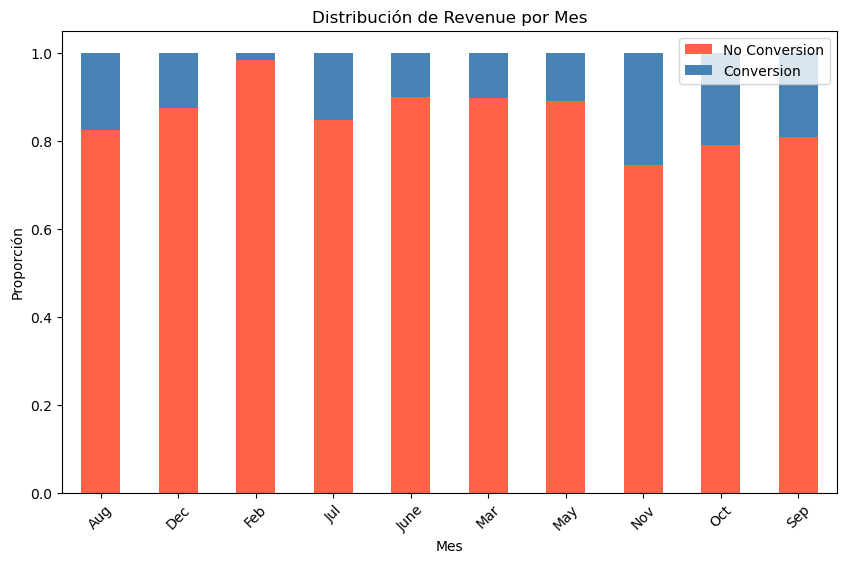

In [ ]:
crosstab_month_revenue = pd.crosstab(df_bivariate['Month'], df_bivariate['Revenue'], normalize='index')
crosstab_month_revenue.plot(kind='bar', stacked=True, figsize=(10, 6), color=['#FF6347', '#4682B4'])
plt.title('Distribución de Revenue por Mes')
plt.xlabel('Mes')
plt.ylabel('Proporción')
plt.xticks(rotation=45)
plt.legend(['No Conversion', 'Conversion'])
plt.show()

### 2. Relación entre Tipos de Visitantes y Revenue

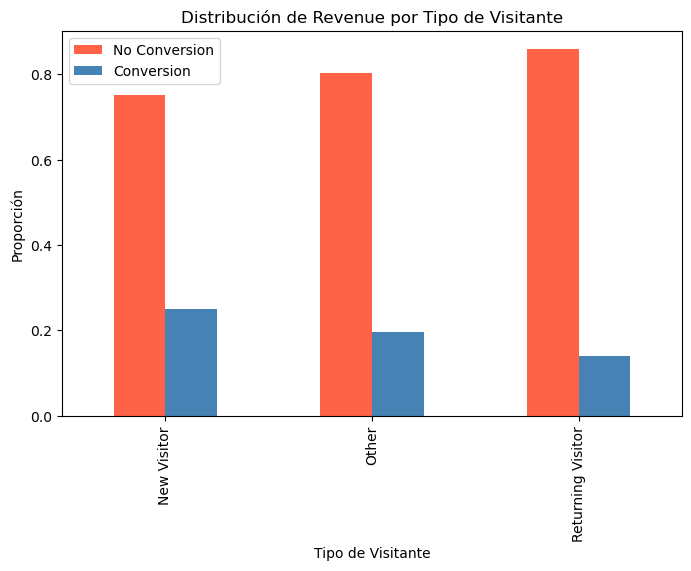

In [ ]:
crosstab_visitor_revenue = pd.crosstab(df_bivariate['Visitor_type'], df_bivariate['Revenue'], normalize='index')
crosstab_visitor_revenue.plot(kind='bar', figsize=(8, 5), color=['#FF6347', '#4682B4'])
plt.title('Distribución de Revenue por Tipo de Visitante')
plt.xlabel('Tipo de Visitante')
plt.ylabel('Proporción')
plt.legend(['No Conversion', 'Conversion'])
plt.show()

### 3. Relación entre Tipo de Tráfico y Revenue

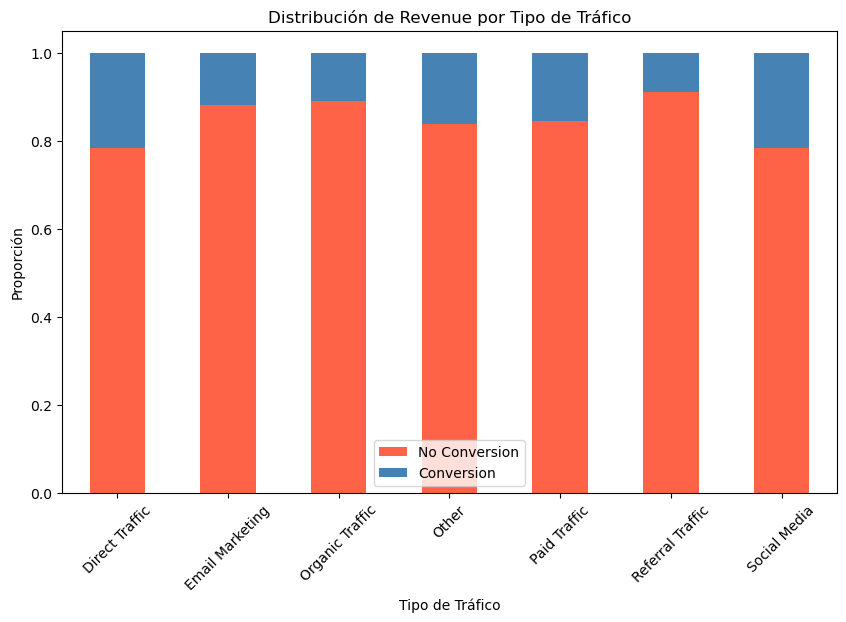

In [ ]:
crosstab_traffic_revenue = pd.crosstab(df_bivariate['Traffic_type_label'], df_bivariate['Revenue'], normalize='index')
crosstab_traffic_revenue.plot(kind='bar', stacked=True, figsize=(10, 6), color=['#FF6347', '#4682B4'])
plt.title('Distribución de Revenue por Tipo de Tráfico')
plt.xlabel('Tipo de Tráfico')
plt.ylabel('Proporción')
plt.xticks(rotation=45)
plt.legend(['No Conversion', 'Conversion'])
plt.show()

### 4. Relación entre Weekend y Revenue

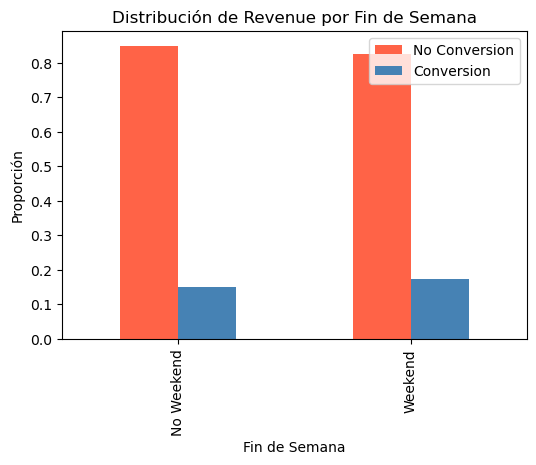

In [ ]:
crosstab_weekend_revenue = pd.crosstab(df_bivariate['Weekend'], df_bivariate['Revenue'], normalize='index')
crosstab_weekend_revenue.plot(kind='bar', figsize=(6, 4), color=['#FF6347', '#4682B4'])
plt.title('Distribución de Revenue por Fin de Semana')
plt.xlabel('Fin de Semana')
plt.ylabel('Proporción')
plt.legend(['No Conversion', 'Conversion'])
plt.xticks([0, 1], ['No Weekend', 'Weekend'])
plt.show()

### 5. Relación entre Bounce Rates/Exit Rates y Revenue

C:\Users\julyj\AppData\Local\Temp\ipykernel_15748\535308913.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Revenue', y='Bounce_rates', data=df_bivariate, ax=axes[0], palette='Set2')
C:\Users\julyj\AppData\Local\Temp\ipykernel_15748\535308913.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Revenue', y='Exit_rates', data=df_bivariate, ax=axes[1], palette='Set2')


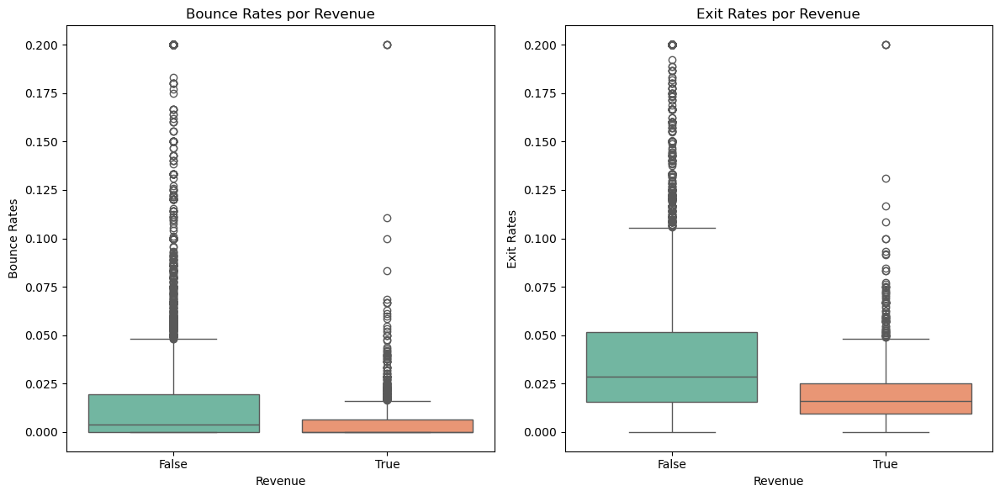

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

sns.boxplot(x='Revenue', y='Bounce_rates', data=df_bivariate, ax=axes[0], palette='Set2')
axes[0].set_title('Bounce Rates por Revenue')
axes[0].set_xlabel('Revenue')
axes[0].set_ylabel('Bounce Rates')

sns.boxplot(x='Revenue', y='Exit_rates', data=df_bivariate, ax=axes[1], palette='Set2')
axes[1].set_title('Exit Rates por Revenue')
axes[1].set_xlabel('Revenue')
axes[1].set_ylabel('Exit Rates')

plt.tight_layout()
plt.show()

Primero, calculamos las correlaciones para identificar pares de variables numéricas con fuertes relaciones.

Matriz de correlación para variables numéricas
correlation_matrix = df_bivariate.corr()

sto identificará relaciones clave, por ejemplo, entre:

Product_related y Product_related_duration
Bounce_rates y Exit_rates

a. Bounce_rates vs Visitor_Type

C:\Users\julyj\AppData\Local\Temp\ipykernel_15748\2658142721.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Visitor_type', y='Bounce_rates', data=df_bivariate, palette='Set2')


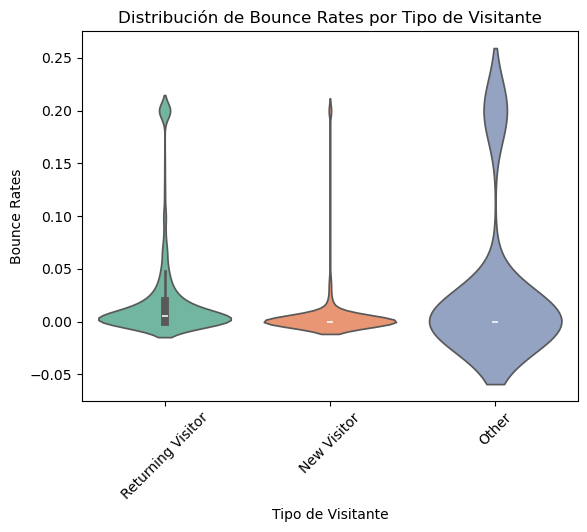

In [ ]:
sns.violinplot(x='Visitor_type', y='Bounce_rates', data=df_bivariate, palette='Set2')
plt.title('Distribución de Bounce Rates por Tipo de Visitante')
plt.xlabel('Tipo de Visitante')
plt.ylabel('Bounce Rates')
plt.xticks(rotation=45)
plt.show()

### b) Product_related_duration vs. Traffic_type_labe

C:\Users\julyj\AppData\Local\Temp\ipykernel_15748\1147204345.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Traffic_type_label', y='Product_related_duration', data=df_bivariate, palette='Set2')


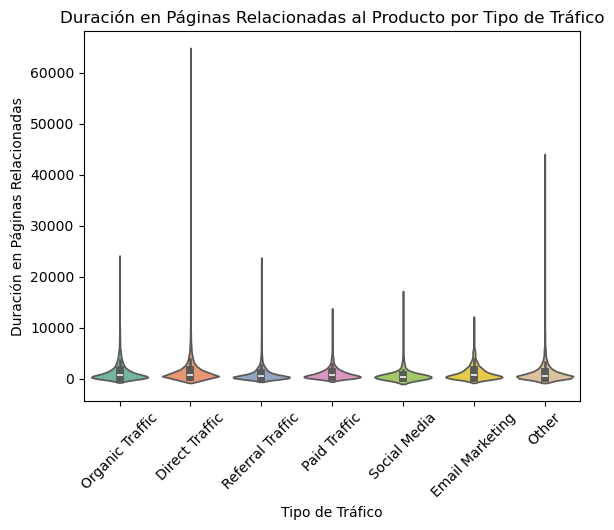

In [ ]:
sns.violinplot(x='Traffic_type_label', y='Product_related_duration', data=df_bivariate, palette='Set2')
plt.title('Duración en Páginas Relacionadas al Producto por Tipo de Tráfico')
plt.xlabel('Tipo de Tráfico')
plt.ylabel('Duración en Páginas Relacionadas')
plt.xticks(rotation=45)
plt.show()

### Gráficos de barras no apiladas

a) Cantidad de visitas por Mes y Tipo de Tráfico

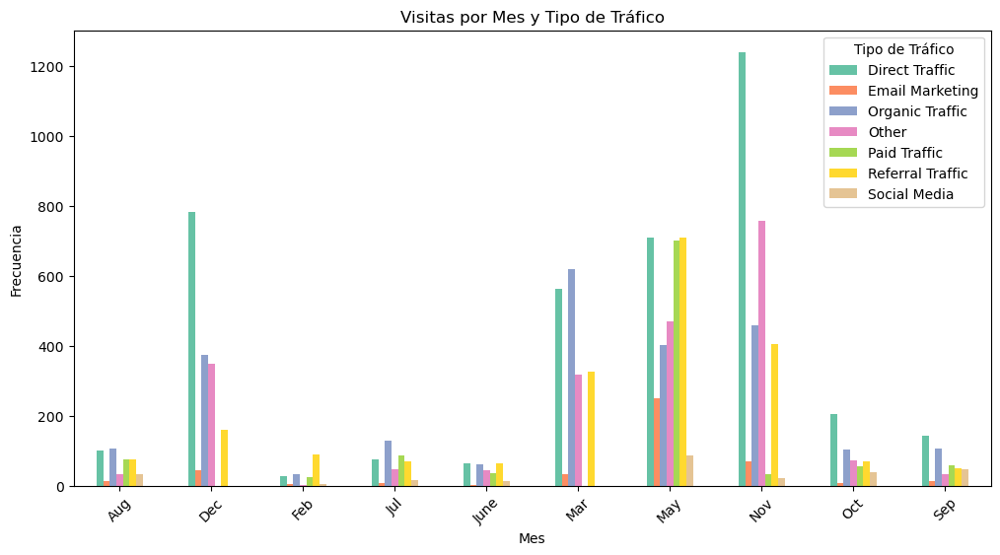

In [ ]:
crosstab_month_traffic = pd.crosstab(df_bivariate['Month'], df_bivariate['Traffic_type_label'])
crosstab_month_traffic.plot(kind='bar', figsize=(12, 6), color=sns.color_palette('Set2'))
plt.title('Visitas por Mes y Tipo de Tráfico')
plt.xlabel('Mes')
plt.ylabel('Frecuencia')
plt.xticks(rotation=45)
plt.legend(title='Tipo de Tráfico')
plt.show()

b) Tipo de Visitante y Región

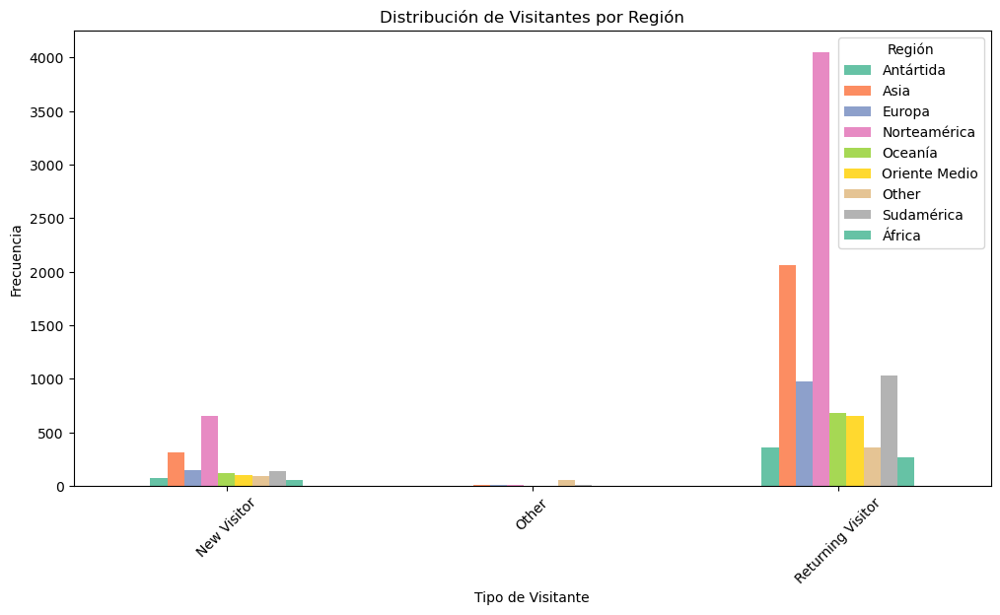

In [ ]:
crosstab_visitor_region = pd.crosstab(df_bivariate['Visitor_type'], df_bivariate['Region_label'])
crosstab_visitor_region.plot(kind='bar', figsize=(12, 6), color=sns.color_palette('Set2'))
plt.title('Distribución de Visitantes por Región')
plt.xlabel('Tipo de Visitante')
plt.ylabel('Frecuencia')
plt.xticks(rotation=45)
plt.legend(title='Región')
plt.show()

 ### Histplot (Histogramas de correlación con Revenue)

a) Exit_rates vs. Revenue
Exploramos cómo las tasas de salida varían con respecto al target.

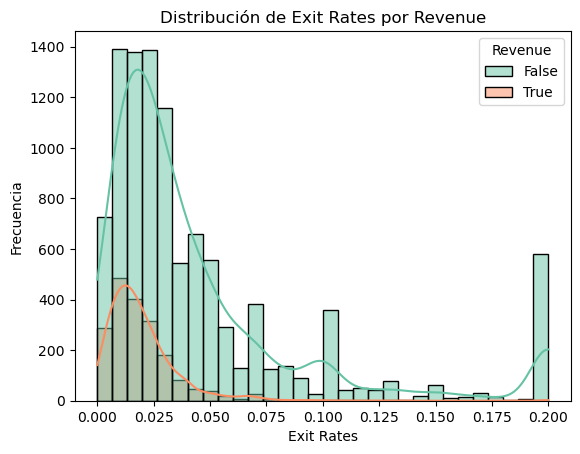

In [ ]:
sns.histplot(data=df_bivariate, x='Exit_rates', hue='Revenue', kde=True, bins=30, palette='Set2')
plt.title('Distribución de Exit Rates por Revenue')
plt.xlabel('Exit Rates')
plt.ylabel('Frecuencia')
plt.show()

b) Product_related_duration vs. Revenue

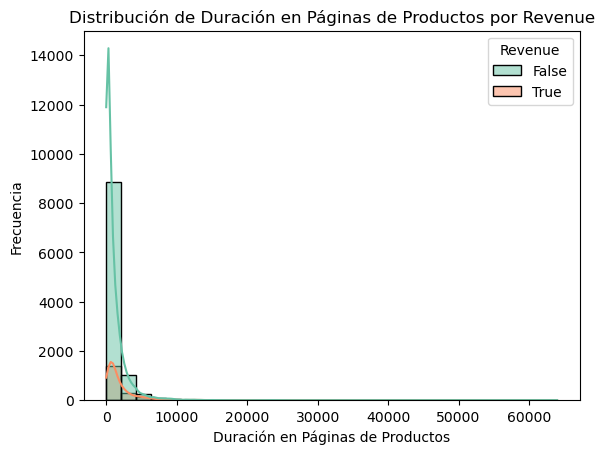

In [ ]:
sns.histplot(data=df_bivariate, x='Product_related_duration', hue='Revenue', kde=True, bins=30, palette='Set2')
plt.title('Distribución de Duración en Páginas de Productos por Revenue')
plt.xlabel('Duración en Páginas de Productos')
plt.ylabel('Frecuencia')
plt.show()

### Barplots (Relaciones categóricas con Revenue)

a) Tipo de Tráfico vs. Revenue

C:\Users\julyj\AppData\Local\Temp\ipykernel_15748\2717986078.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=df_bivariate, x='Traffic_type_label', y='Revenue', palette='Set2', ci=None)
C:\Users\julyj\AppData\Local\Temp\ipykernel_15748\2717986078.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x='Traffic_type_label', y='Revenue', palette='Set2', ci=None)


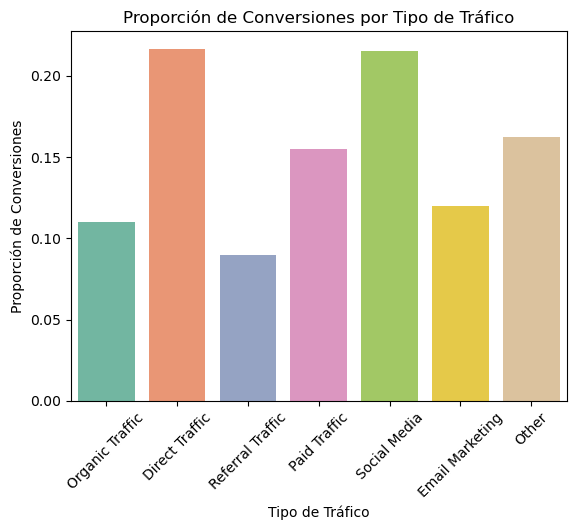

In [ ]:
sns.barplot(data=df_bivariate, x='Traffic_type_label', y='Revenue', palette='Set2', ci=None)
plt.title('Proporción de Conversiones por Tipo de Tráfico')
plt.xlabel('Tipo de Tráfico')
plt.ylabel('Proporción de Conversiones')
plt.xticks(rotation=45)
plt.show()

b) Mes vs. Revenue

C:\Users\julyj\AppData\Local\Temp\ipykernel_15748\2837932160.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=df_bivariate, x='Month', y='Revenue', palette='Set2', ci=None)
C:\Users\julyj\AppData\Local\Temp\ipykernel_15748\2837932160.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x='Month', y='Revenue', palette='Set2', ci=None)


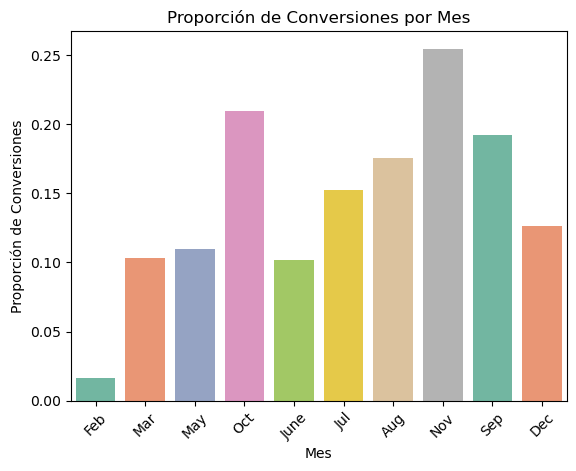

In [ ]:
sns.barplot(data=df_bivariate, x='Month', y='Revenue', palette='Set2', ci=None)
plt.title('Proporción de Conversiones por Mes')
plt.xlabel('Mes')
plt.ylabel('Proporción de Conversiones')
plt.xticks(rotation=45)
plt.show()

1. Relación entre Tipo de Visitante y Tipo de Tráfico

C:\Users\julyj\AppData\Local\Temp\ipykernel_15748\3881166430.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=df_bivariate, x='Visitor_type', y='Traffic_type_label', ci=None, palette='Set2')
C:\Users\julyj\AppData\Local\Temp\ipykernel_15748\3881166430.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x='Visitor_type', y='Traffic_type_label', ci=None, palette='Set2')


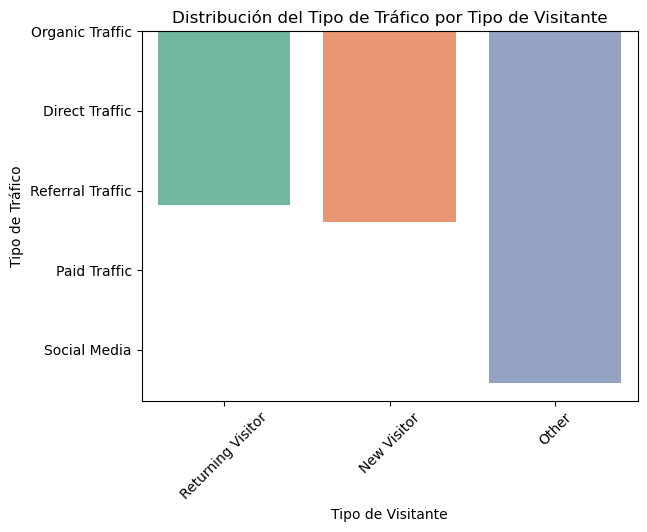

In [ ]:
sns.barplot(data=df_bivariate, x='Visitor_type', y='Traffic_type_label', ci=None, palette='Set2')
plt.title('Distribución del Tipo de Tráfico por Tipo de Visitante')
plt.xlabel('Tipo de Visitante')
plt.ylabel('Tipo de Tráfico')
plt.xticks(rotation=45)
plt.show()

2. Relación entre Región y Tipo de Tráfico

C:\Users\julyj\AppData\Local\Temp\ipykernel_15748\1922968483.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=df_bivariate, x='Region_label', y='Traffic_type_label', ci=None, palette='Set2')
C:\Users\julyj\AppData\Local\Temp\ipykernel_15748\1922968483.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_bivariate, x='Region_label', y='Traffic_type_label', ci=None, palette='Set2')


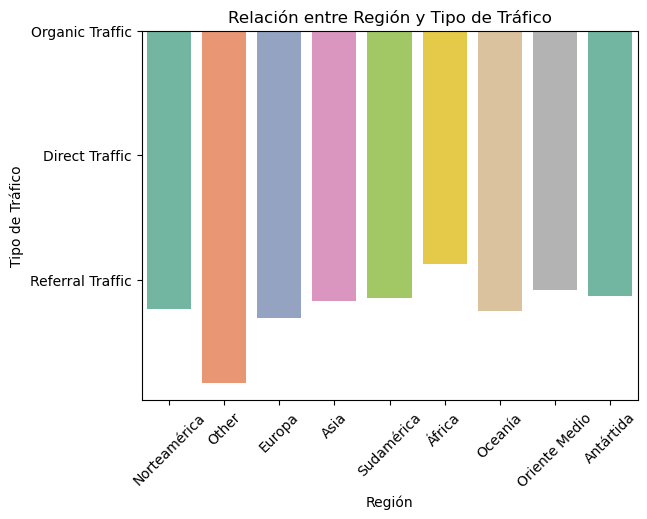

In [ ]:
sns.barplot(data=df_bivariate, x='Region_label', y='Traffic_type_label', ci=None, palette='Set2')
plt.title('Relación entre Región y Tipo de Tráfico')
plt.xlabel('Región')
plt.ylabel('Tipo de Tráfico')
plt.xticks(rotation=45)
plt.show()

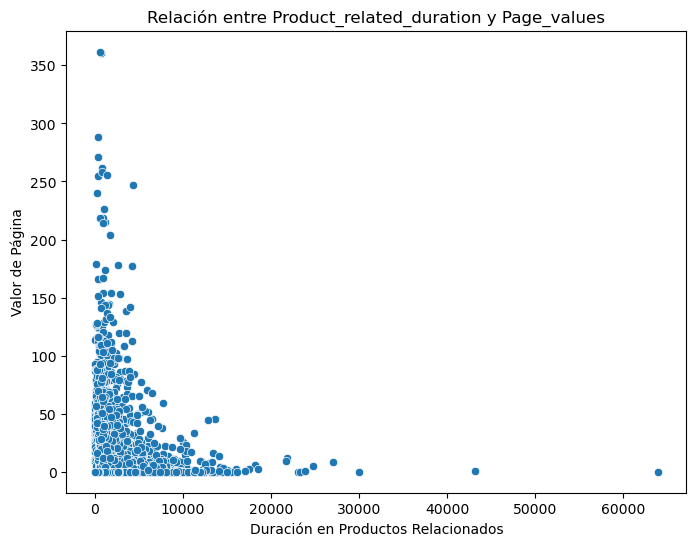

In [64]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x=df_bivariate['Product_related_duration'], y=df_bivariate['Page_values'])
plt.title('Relación entre Product_related_duration y Page_values')
plt.xlabel('Duración en Productos Relacionados')
plt.ylabel('Valor de Página')
plt.show()

C:\Users\julyj\AppData\Local\Temp\ipykernel_15748\2763528776.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=df_bivariate['Revenue'], y=df_bivariate['Bounce_rates'], palette='muted')


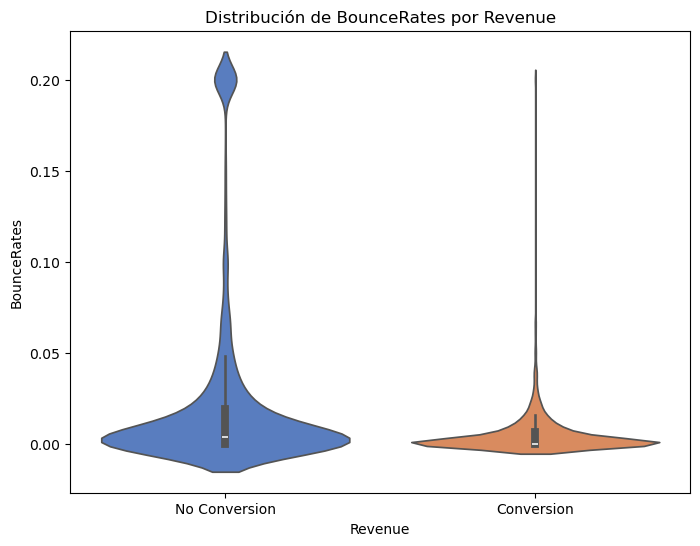

In [65]:
plt.figure(figsize=(8, 6))
sns.violinplot(x=df_bivariate['Revenue'], y=df_bivariate['Bounce_rates'], palette='muted')
plt.title('Distribución de BounceRates por Revenue')
plt.xlabel('Revenue')
plt.ylabel('BounceRates')
plt.xticks([0, 1], ['No Conversion', 'Conversion'])
plt.show()